In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
#Import packages
import math
import random
import numpy as np
import matplotlib
import matplotlib.pyplot as plt

from itertools import count
from collections import deque

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

import tqdm
from tqdm import tnrange, tqdm_notebook
from time import sleep
import os

#Import Custom Classes
import gym
import gym_combrf

#from Source.nn_model_dqn import QNetwork
#from Source.dqn_rcv_agent import Agent, DQN_ReplayBuffer, EpsilonGreedyStrategy
#from Source.env_manager import EnvManager
from Source.misc_fun.utils import plot, get_moving_average, Generate_BeamDir, All_Exhaustive_RateMeas

## Create channel variation for every location in the environment

In [3]:
#create a channel variation of vectors, one for each location in environment

#create same channel variation over time for all location, as we train MAB separately for every location.
#This can then be compared with DQN with same channel variation over time.

inp_fptr = open("ch_variation_large.txt")
ch_randvals = inp_fptr.read().splitlines()
ch_randvals = [np.complex(a.replace('i','j')) for a in ch_randvals]


## Simulation1: Learn beamalignment using DQN without channel variation
 - no wider beams, no beam refinement

In [106]:
#Assume LOS or NLOS throughout the environment. Do not change in between for now
from Source.nn_model_dqn import QNetwork
from Source.dqn_rcv_agent import Agent, DQN_ReplayBuffer, EpsilonGreedyStrategy
from Source.env_manager import EnvManager
from Source.misc_fun.utils import plot, get_moving_average, Generate_BeamDir, All_Exhaustive_RateMeas
from Source.PER import PrioritizedReplayBuffer

#Hyper-parameters
BUFFER_SIZE = int(1e5)      #replay buffer size
BATCH_SIZE = 64             #minibatch size
GAMMA = 0.999                #discount factor
ALPHA = 1.0                  #non-stationarity parameter
TAU = 1e-3                  #for soft update of target parameters
LR = 5e-4                   #learning rate
eps_start = 1.0
eps_end = 0.01
eps_decay = 0.9985 #125e-6
episodes = 6000 #3100 train, 500 test

test_episodes = 20
seed = 0                    #random seed number
episode_step_limit = 50
#%%
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

#Choose the environment
em = EnvManager(device, 'combrf-v7', seed)
em.env.ant_arr = 'ula'
rx_xcov = np.array([100*np.cos(20*np.pi/180), 100*np.cos(40*np.pi/180), 100*np.cos(80*np.pi/180)])#np.array([-300,-100,100])
rx_ycov = np.array([100*np.sin(20*np.pi/180), 100*np.sin(40*np.pi/180), 100*np.sin(80*np.pi/180)])#np.array([-300,-100,100])
rx_zcov = np.array([51.5,71.5])
beam_param = 'beam-narrow'
beam_paramvals = np.array([])
em.env.set_beamparameters(beam_param, beam_paramvals)
em.env.set_coverage(rx_xcov,rx_ycov,rx_zcov)

available_actions = em.num_actions_available()
random.seed(seed)
state_size = em.state_size()
print(em.env.ch_model)
print(em.env.sc_xyz)

#Select the strategy
strategy = EpsilonGreedyStrategy(eps_start, eps_end, eps_decay, 4200)#episodes
#Initialize the agent
agent = Agent(strategy, state_size, available_actions, seed, device)

#Instantiate MemoryBuffer
#if not PRIORITIZED_REPLAY:
memory = DQN_ReplayBuffer(available_actions, BUFFER_SIZE, BATCH_SIZE, seed, device)
#else:
#    memory = PrioritizedReplayBuffer(available_actions, BUFFER_SIZE, BATCH_SIZE, PER_ALPHA,seed, device)

policy_net = QNetwork(state_size, available_actions, seed).to(device)
target_net = QNetwork(state_size, available_actions, seed).to(device)
print(policy_net)

#Initialize target_net weights to policy_net weights
target_net.load_state_dict(policy_net.state_dict())
target_net.eval() #Set the target_net in eval mode

#Select the optimizer
optimizer = optim.Adam(params=policy_net.parameters(), lr=LR)

uma-los
[]
QNetwork(
  (fc11): Linear(in_features=18, out_features=200, bias=True)
  (fc12): Linear(in_features=3, out_features=18, bias=True)
  (fc22): Linear(in_features=18, out_features=200, bias=True)
  (hidden_layers): ModuleList(
    (0): Linear(in_features=400, out_features=400, bias=True)
    (1): Linear(in_features=400, out_features=256, bias=True)
  )
  (softmax): Softmax(dim=1)
  (output): Linear(in_features=256, out_features=8, bias=True)
)


In [107]:
from Source.misc_fun.conversion import *

#loc_SNRexh = [0.0 for i in range(em.env.obs_space.nvec[3] * len(em.env.tx_locs)) ]
loc_SNRexh = [0.0 for i in range(em.env.obs_space.nvec[3] * len(em.env.tx_locs)) ]
#loc_minSNRexh = [0.0 for i in range(em.env.obs_space.nvec[3] * len(em.env.tx_locs)) ]
loc_exhbdir = [0 for i in range(em.env.obs_space.nvec[3] * len(em.env.tx_locs)) ]
for loc_ndx in range(len(em.env.tx_locs)):
    for tbdir_ndx in range(em.env.obs_space.nvec[3]):
        min_exh_rate, max_exh_rate,min_action_ndx,max_action_ndx,min_rssi_val,max_rssi_val = em.env.get_minmax_exhrate(loc_ndx, tbdir_ndx, ch_randvals[loc_ndx * em.env.obs_space.nvec[3] + tbdir_ndx])
        #tx_num = em.env.get_txloc_ndx(em.env.tx_loc)
        #Es = db2lin(em.env.P_tx)
        #SNR_exh = Es * np.abs(max_rssi_val) ** 2 / (em.env.N0 * em.env.B)
        #SNR_exh = Es * np.abs(max_rssi_val) ** 2 / (em.env.N0 * em.env.B)
        #exh_rate = np.log2(1 + SNR_exh)
        #loc_minSNRexh[loc_ndx * em.env.obs_space.nvec[3] + tbdir_ndx] = min_rssi_val#max_exh_rate#
        loc_SNRexh[loc_ndx * em.env.obs_space.nvec[3] + tbdir_ndx] = max_exh_rate#
        loc_exhbdir[loc_ndx * em.env.obs_space.nvec[3] + tbdir_ndx] = max_action_ndx

In [102]:
print(np.mean(loc_SNRexh))

20.34486885887985


#### Test with random untrained actions

obs = em.env.reset(np.exp(1j * 2 * np.pi * 0.6))
print(obs)
ep_rwd=[]
while True:
    action = random.randrange(em.env.action_space.n)
    
    obs, rwd, done, _ = em.env.step(action, np.exp(1j * 2 * np.pi * 0.6))
    print(action)
    ep_rwd.append(rwd)
    if done:
        break
        
print("Episode score: {}".format(np.sum(ep_rwd)))

In [108]:
locndx_list = list(range(len(em.env.tx_locs)))
random_loc_ndices = random.sample(locndx_list, len(locndx_list))
txdir_list = list(range(em.env.obs_space.nvec[3]))
txdir_ndices = random.sample(txdir_list, len(txdir_list))

obs_list = []
for eps in range(episodes):
    ndx = eps % (em.env.obs_space.nvec[3] * len(em.env.tx_locs))
    ndx1 = int(ndx / em.env.obs_space.nvec[3])    
    ndx2 = int(ndx % em.env.obs_space.nvec[3])
    obs_list.append((random_loc_ndices[ndx1],txdir_ndices[ndx2]))

In [109]:
from Source.antenna import ula

print(em.env.BeamSet[0])
print(ula.var_steervec(8,(0,8),0))
v = np.ones(8, dtype=np.complex)
v.real=[-0.125 for i in range(len(v))]
v.imag=[-0.125 for i in range(len(v))]
print(v)
#print([-0.125*np.exp(1j*2*) for x in range(8)])

0.3926990816987242
[ 0.35355339+0.00000000e+00j -0.35355339+4.32978028e-17j
  0.35355339-8.65956056e-17j -0.35355339+1.29893408e-16j
  0.35355339-1.73191211e-16j -0.35355339+2.16489014e-16j
  0.35355339-2.59786817e-16j -0.35355339+3.03084620e-16j]
[-0.125-0.125j -0.125-0.125j -0.125-0.125j -0.125-0.125j -0.125-0.125j
 -0.125-0.125j -0.125-0.125j -0.125-0.125j]


#### Train DQN agent

exh_rate: 23.577234585162934, dqn_rate: 0.0, iter_avg_error: 0.0
exh_rate: 23.577234585162934, dqn_rate: 0.0, iter_avg_error: 0.0
exh_rate: 23.577234585162934, dqn_rate: 0.0, iter_avg_error: 0.0
exh_rate: 23.577234585162934, dqn_rate: 0.0, iter_avg_error: 0.0
exh_rate: 23.577234585162934, dqn_rate: 0.0, iter_avg_error: 0.0
exh_rate: 23.577234585162934, dqn_rate: 0.0, iter_avg_error: 0.0
exh_rate: 23.577234585162934, dqn_rate: 0.0, iter_avg_error: 0.0
exh_rate: 23.577234585162934, dqn_rate: 0.0, iter_avg_error: 0.0
Episode 1,	 Score: -8.00, eps: 0.9985, moving avg_rwd: -1.0, ep_loss: 0.0
TX loc: [[17.36481777 34.20201433 51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, 135.0, 157.5, 180.0]
dqn rx bdir: 135.0, exh bdir: 67.5
data rates:  [inf, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -

exh_rate: 20.25928715681807, dqn_rate: 0.0, iter_avg_error: 0.0
exh_rate: 20.25928715681807, dqn_rate: 0.0, iter_avg_error: 0.0
exh_rate: 20.25928715681807, dqn_rate: 0.0, iter_avg_error: 0.0
exh_rate: 20.25928715681807, dqn_rate: 0.0, iter_avg_error: 0.0
exh_rate: 20.25928715681807, dqn_rate: 0.0, iter_avg_error: 0.0
Episode 11,	 Score: -8.00, eps: 0.9836231947921226, moving avg_rwd: -1.0, ep_loss: 38.121612548828125
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [22.500000000000004, 45.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [-1.0, -1.0, -1.0, -1.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 0.0, iter_avg_error: 0.0
exh_rate: 19.484200641498976, dqn_rate: 0.0, iter_avg

exh_rate: 20.059919058270147, dqn_rate: 13.82932689619737, iter_avg_error: 3.8397781648079286
exh_rate: 20.059919058270147, dqn_rate: 13.82932689619737, iter_avg_error: 3.8397781648079286
exh_rate: 20.059919058270147, dqn_rate: 0.0, iter_avg_error: 3.0714822261302968
Episode 22,	 Score: -8.00, eps: 0.9675145893330618, moving avg_rwd: -0.6666666865348816, ep_loss: 82.7690200805664
TX loc: [[93.96926208 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, 45.0, 67.5, 90.0, -1.0, 135.0, 157.5, -1.0]
dqn rx bdir: -1.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, 14.64530380101754, 13.82932689619737, inf, 14.666148035688778, 15.5402007130275, 15.530037063237701]
rwd vals:  [-2.0, -2.0, -1.0, -1.0, -2.0, -1.0, -1.0, -1.0]



exh_rate: 20.971503259689168, dqn_rate: 0.0, iter_avg_error: 3.0714822261302968
exh

exh_rate: 19.223968107093192, dqn_rate: 16.651727119753623, iter_avg_error: 11.457307674275263
exh_rate: 19.223968107093192, dqn_rate: 0.0, iter_avg_error: 10.53221172317784
exh_rate: 19.223968107093192, dqn_rate: 16.25747424248662, iter_avg_error: 11.43540473664932
exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 11.600209951349683
Episode 31,	 Score: -4.00, eps: 0.9545312373846444, moving avg_rwd: -0.5555555820465088, ep_loss: 107.93042755126953
TX loc: [[17.36481777 64.27876097 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 6
RX dirs: [-1.0, 45.0, 67.5, 90.0, 112.5, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, 9.717207977756257, 19.223968107093192, 16.651727119753623, 16.25747424248662, inf, inf, inf]
rwd vals:  [-2.0, -1.0, 1.0, -1.0, -1.0, -2.0, -2.0, -2.0]



exh_rate: 19.928661262969186, dqn_rate: 19.92866126296918

Episode 41,	 Score: -2.00, eps: 0.940309529539471, moving avg_rwd: -0.7777777910232544, ep_loss: 147.65357971191406
TX loc: [[76.60444431 64.27876097 51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 4
RX dirs: [-1.0, 45.0, 67.5, -1.0, 112.5, -1.0, 157.5, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, 16.80346823763669, inf, 15.10890889787248, inf, 16.66886587115947, inf]
rwd vals:  [-2.0, 1.0, -1.0, -2.0, -1.0, -2.0, -1.0, -2.0]



exh_rate: 20.63821463730202, dqn_rate: 0.0, iter_avg_error: 16.14168377194605
exh_rate: 20.63821463730202, dqn_rate: 0.0, iter_avg_error: 16.14168377194605
exh_rate: 20.63821463730202, dqn_rate: 0.0, iter_avg_error: 16.14168377194605
exh_rate: 20.63821463730202, dqn_rate: 0.0, iter_avg_error: 16.14168377194605
exh_rate: 20.63821463730202, dqn_rate: 0.0, iter_avg_error: 16.14168377194605
exh_rate: 20.63821463730202, dqn_rate: 0.0, iter_avg_error: 16.1416837

exh_rate: 21.03721437896766, dqn_rate: 0.0, iter_avg_error: 12.77880198280453
exh_rate: 21.03721437896766, dqn_rate: 0.0, iter_avg_error: 12.77880198280453
exh_rate: 21.03721437896766, dqn_rate: 0.0, iter_avg_error: 12.77880198280453
exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 13.9475361149694
Episode 52,	 Score: -4.00, eps: 0.9249102635390922, moving avg_rwd: -0.6666666865348816, ep_loss: 192.73997497558594
TX loc: [[93.96926208 34.20201433 51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 6
RX dirs: [22.500000000000004, 45.0, -1.0, 90.0, 112.5, -1.0, 157.5, 180.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.03721437896766, 16.83082226388404, inf, 14.824345087583488, 13.327242815970925, inf, 18.497741119874696, 20.396385627692155]
rwd vals:  [1.0, -1.0, -2.0, -1.0, -1.0, -2.0, -1.0, -1.0]



exh_rate: 20.8406782

exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127, iter_avg_error: 17.12544218863456
exh_rate: 20.552193206690127, dqn_rate: 0.0, iter_avg_error: 15.983653677151771
exh_rate: 20.552193206690127, dqn_rate: 16.753098879809155, iter_avg_error: 16.914381392696725
Episode 62,	 Score: 0.00, eps: 0.9111298831430604, moving avg_rwd: -0.3333333432674408, ep_loss: 235.8486785888672
TX loc: [[17.36481777 64.27876097 51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 6
RX dirs: [22.500000000000004, 45.0, 67.5, 90.0, 112.5, -1.0, -1.0, -1.0]
dqn rx bdir: 112.5, exh bdir: 67.5
data rates:  [15.797509499529014, 14.94152948497319, 20.552193206690127, 12.329689105216406, 16.753098879809155, inf, inf, inf]
rwd vals:  [-1.0, -1.0, 1.0, -1.0, 1.0, -2.0, -2.0, -2.0]



exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 16.914381392696725
exh_rate: 18.66579289905184, dqn_rate: 0.0,

exh_rate: 21.03721437896766, dqn_rate: 0.0, iter_avg_error: 14.703694678304398
exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 15.872428810469266
Episode 70,	 Score: -4.00, eps: 0.9002535538469286, moving avg_rwd: -0.7777777910232544, ep_loss: 269.23712158203125
TX loc: [[93.96926208 34.20201433 51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 6
RX dirs: [22.500000000000004, -1.0, 67.5, 90.0, 112.5, 135.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.03721437896766, inf, 12.62753435743527, 14.824345087583488, 13.327242815970925, 16.666610906966614, inf, inf]
rwd vals:  [1.0, -2.0, -1.0, -1.0, -1.0, -1.0, -2.0, -2.0]



exh_rate: 20.840678216326523, dqn_rate: 0.0, iter_avg_error: 14.714613354006682
exh_rate: 20.840678216326523, dqn_rate: 0.0, iter_avg_error: 14.714613354006682
exh_rate: 20.840678216326523,

exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127, iter_avg_error: 16.9883596829639
Episode 80,	 Score: -2.00, eps: 0.8868405375642243, moving avg_rwd: -0.5555555820465088, ep_loss: 299.47857666015625
TX loc: [[17.36481777 64.27876097 51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 4
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, 135.0, 157.5, 180.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, 14.725168554442762, 15.914843746090863, 9.688291048680618]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -1.0, -1.0, -1.0]



exh_rate: 18.66579289905184, dqn_rate: 18.66579289905184, iter_avg_error: 18.025348177355667
Episode 81,	 Score: 1.00, eps: 0.8855102767578781, moving avg_rwd: -0.4444444477558136, ep_loss: 300.44110107421875
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 90.0, -1.0, -1.0, -1.0, -1.0]

exh_rate: 23.577234585162934, dqn_rate: 0.0, iter_avg_error: 17.759470368577837
exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 19.069316734420223
Episode 91,	 Score: -2.00, eps: 0.8723169228300857, moving avg_rwd: -0.5555555820465088, ep_loss: 322.04998779296875
TX loc: [[17.36481777 34.20201433 51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 4
RX dirs: [22.500000000000004, 45.0, 67.5, -1.0, -1.0, 135.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [16.905986553132042, 19.186654363541628, 23.577234585162934, inf, inf, 17.1094615859943, inf, inf]
rwd vals:  [-1.0, -1.0, 1.0, -2.0, -2.0, -1.0, -2.0, -2.0]



exh_rate: 22.065234244869465, dqn_rate: 0.0, iter_avg_error: 17.843470387483034
exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 19.069316734420223
Episode 92,	 Score: 0.00, eps: 0.8710084474458406, moving avg_rwd: -0.4444444477558136, ep_loss

TX loc: [[93.96926208 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, 45.0, -1.0, -1.0, 112.5, 135.0, 157.5, 180.0]
dqn rx bdir: -1.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, 12.632424215259746, inf, 11.623198029686495, 14.449544641992945, 14.848748452375737, 15.72038618923526]
rwd vals:  [-2.0, -2.0, -1.0, -2.0, -1.0, -1.0, -1.0, -1.0]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 18.856161118836045
Episode 101,	 Score: 1.00, eps: 0.8593201387134324, moving avg_rwd: -0.5555555820465088, ep_loss: 353.53631591796875
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, 

exh_rate: 20.455736041791322, dqn_rate: 19.054849782157426, iter_avg_error: 17.476907241597818
exh_rate: 20.455736041791322, dqn_rate: 10.267574821635403, iter_avg_error: 16.988725299346594
Episode 111,	 Score: -8.00, eps: 0.8465169956840423, moving avg_rwd: -0.7777777910232544, ep_loss: 393.68316650390625
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [22.500000000000004, 45.0, 67.5, 90.0, 112.5, 135.0, -1.0, 180.0]
dqn rx bdir: 112.5, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, 19.054849782157426, 13.169569362286394, 14.809590903889069, 10.267574821635403, 15.021873017477358, inf, 18.9681236528538]
rwd vals:  [-2.0, -1.0, -1.0, -1.0, -1.0, -1.0, -2.0, -1.0]



exh_rate: 20.059919058270147, dqn_rate: 0.0, iter_avg_error: 15.874285351664915
exh_rate: 20.059919058270147, d

exh_rate: 19.484200641498976, dqn_rate: 0.0, iter_avg_error: 16.07985776246577
exh_rate: 19.484200641498976, dqn_rate: 0.0, iter_avg_error: 16.07985776246577
exh_rate: 19.484200641498976, dqn_rate: 0.0, iter_avg_error: 16.07985776246577
exh_rate: 19.484200641498976, dqn_rate: 0.0, iter_avg_error: 16.07985776246577
exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 17.16231335366016
Episode 120,	 Score: -4.00, eps: 0.8351573446705531, moving avg_rwd: -0.5555555820465088, ep_loss: 433.49871826171875
TX loc: [[76.60444431 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 6
RX dirs: [22.500000000000004, 45.0, -1.0, 90.0, 112.5, -1.0, 157.5, 180.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [15.813496611959547, 19.484200641498976, inf, 14.862309400770725, 9.872409919131476, inf, 12.057269869652647, 15.789621199496796]
rwd vals:  [-1.0, 1.0, 

exh_rate: 20.455736041791322, dqn_rate: 19.054849782157426, iter_avg_error: 16.521813450945903
exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 15.463210685270488
exh_rate: 20.455736041791322, dqn_rate: 14.641645727191104, iter_avg_error: 16.276635447892218
exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 15.463210685270488
exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 15.463210685270488
exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 15.463210685270488
exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 15.463210685270488
Episode 129,	 Score: -8.00, eps: 0.8239501320272399, moving avg_rwd: -0.7777777910232544, ep_loss: 465.7860107421875
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [22.500000000000004, 45.0, 67.5, -1.0, 112.5, -

exh_rate: 20.25928715681807, dqn_rate: 0.0, iter_avg_error: 13.223254784432251
exh_rate: 20.25928715681807, dqn_rate: 12.385617403514528, iter_avg_error: 13.911344640183058
Episode 137,	 Score: -8.00, eps: 0.8141144838662934, moving avg_rwd: -0.7777777910232544, ep_loss: 500.4314270019531
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, 45.0, 67.5, -1.0, -1.0, 135.0, 157.5, 180.0]
dqn rx bdir: 135.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, 16.149957111930853, inf, inf, 12.385617403514528, 15.663076127558654, 12.428722790908987]
rwd vals:  [-2.0, -2.0, -1.0, -2.0, -2.0, -1.0, -1.0, -1.0]



exh_rate: 19.484200641498976, dqn_rate: 0.0, iter_avg_error: 12.828889048988673
exh_rate: 19.484200641498976, dqn_rate: 12.057269869652647, iter_avg_error: 13.498737375080486
exh_rate: 1

exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 15.874123299047774
exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 15.874123299047774
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 17.010553079147293
Episode 147,	 Score: -3.00, eps: 0.8019848668473744, moving avg_rwd: -0.4444444477558136, ep_loss: 432.1290588378906
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 5
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, 112.5, 135.0, 157.5, 180.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, 10.267574821635403, 15.021873017477358, 14.641645727191104, 18.9681236528538]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -1.0, -1.0, -1.0, -1.0]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 18.124993026828967
Episode 148,	 Score: 1.00, ep

exh_rate: 19.223968107093192, dqn_rate: 15.336014420224519, iter_avg_error: 19.212089492033694
exh_rate: 19.223968107093192, dqn_rate: 0.0, iter_avg_error: 18.36008869091011
exh_rate: 19.223968107093192, dqn_rate: 0.0, iter_avg_error: 18.36008869091011
exh_rate: 19.223968107093192, dqn_rate: 14.022454075273677, iter_avg_error: 19.139113917314205
Episode 157,	 Score: -8.00, eps: 0.7900359708596388, moving avg_rwd: -0.6666666865348816, ep_loss: 450.0221862792969
TX loc: [[17.36481777 64.27876097 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [22.500000000000004, 45.0, 67.5, -1.0, 112.5, 135.0, -1.0, 180.0]
dqn rx bdir: 22.500000000000004, exh bdir: 67.5
data rates:  [14.022454075273677, 9.717207977756257, 19.223968107093192, inf, 16.25747424248662, 15.336014420224519, inf, 13.615180028251915]
rwd vals:  [-1.0, -1.0, -2.0, -2.

exh_rate: 20.971503259689168, dqn_rate: 0.0, iter_avg_error: 17.094459271107937
exh_rate: 20.971503259689168, dqn_rate: 0.0, iter_avg_error: 17.094459271107937
exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 18.259542785535114
Episode 167,	 Score: -2.00, eps: 0.778265103312623, moving avg_rwd: -0.5555555820465088, ep_loss: 473.4980773925781
TX loc: [[76.60444431 64.27876097 51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 4
RX dirs: [-1.0, 45.0, -1.0, 90.0, -1.0, -1.0, 157.5, 180.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, 9.169358078329822, inf, inf, 16.66886587115947, 11.590221100894984]
rwd vals:  [-2.0, 1.0, -2.0, -1.0, -2.0, -2.0, -1.0, -1.0]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 18.259542785535114
Episode 168,	 Score: 1.00, eps: 0.7770977056576541, moving avg_rwd: -0.4444444477558136, ep_loss: 473.444671630

exh_rate: 18.808959694862374, dqn_rate: 0.0, iter_avg_error: 18.020594596435775
exh_rate: 18.808959694862374, dqn_rate: 18.808959694862374, iter_avg_error: 19.065536801705907
Episode 180,	 Score: -1.00, eps: 0.7632247709127533, moving avg_rwd: -0.4444444477558136, ep_loss: 495.6728210449219
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 3
RX dirs: [-1.0, 45.0, -1.0, -1.0, 112.5, -1.0, 157.5, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, 12.281225843567075, inf, 2.2946418248743603, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -1.0, -2.0, -1.0, -2.0]



exh_rate: 23.577234585162934, dqn_rate: 0.0, iter_avg_error: 17.75569043586352
exh_rate: 23.577234585162934, dqn_rate: 0.0, iter_avg_error: 17.75569043586352
exh_rate: 23.577234585162934, dqn_rate: 0.0, iter_avg_error: 17.75569043586352
exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 19.

exh_rate: 19.484200641498976, dqn_rate: 0.0, iter_avg_error: 16.56513941526065
exh_rate: 19.484200641498976, dqn_rate: 0.0, iter_avg_error: 16.56513941526065
exh_rate: 19.484200641498976, dqn_rate: 0.0, iter_avg_error: 16.56513941526065
exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 17.647595006455035
Episode 192,	 Score: -2.00, eps: 0.7495994991284238, moving avg_rwd: -0.4444444477558136, ep_loss: 502.1800842285156
TX loc: [[76.60444431 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 4
RX dirs: [-1.0, 45.0, 67.5, -1.0, -1.0, 135.0, 157.5, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, 14.842441548523583, inf, inf, 13.55644849818813, 12.057269869652647, inf]
rwd vals:  [-2.0, 1.0, -1.0, -2.0, -2.0, -1.0, -1.0, -2.0]



exh_rate: 19.223968107093192, dqn_rate: 0.0, iter_avg_error: 16.722499055357613
exh_rate: 19.223968107093192, dqn_rate: 0.0, 

Episode 202,	 Score: 1.00, eps: 0.7384311007984727, moving avg_rwd: -0.4444444477558136, ep_loss: 518.8988037109375
TX loc: [[93.96926208 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.971503259689168, dqn_rate: 0.0, iter_avg_error: 16.5466125921966
exh_rate: 20.971503259689168, dqn_rate: 0.0, iter_avg_error: 16.5466125921966
exh_rate: 20.971503259689168, dqn_rate: 17.827721373402845, iter_avg_error: 17.537041557385646
exh_rate: 20.971503259689168, dqn_rate: 0.0, iter_avg_error: 16.5466125921966
exh_rate: 20.971503259689168, dqn_rate: 17.827721373402845, iter_avg_error: 17.537041557385646
exh_rate: 20.971503259689168, dqn_rate: 17.827721373402845, iter_avg_error: 17.537041557385646
exh_rate: 20.971503259689168, dqn_rate: 9.169

RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 16.70550166701742
exh_rate: 18.494913945688506, dqn_rate: 14.825579724858477, iter_avg_error: 17.529144985065113
exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 16.70550166701742
exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 16.70550166701742
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 17.582960714919274
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 17.582960714919274
exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 16.70550166701742
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 17.582960714919274
Episode 213,	 Score: -8.00, eps: 0.7263379585012576, moving avg_rwd: -0.777777791

exh_rate: 21.3549172924632, dqn_rate: 0.0, iter_avg_error: 18.719475391783295
exh_rate: 21.3549172924632, dqn_rate: 16.429436541891395, iter_avg_error: 19.632221866332824
exh_rate: 21.3549172924632, dqn_rate: 11.148307547159977, iter_avg_error: 19.338825811069963
Episode 223,	 Score: -8.00, eps: 0.7155161374459641, moving avg_rwd: -0.5555555820465088, ep_loss: 550.1193237304688
TX loc: [[76.60444431 34.20201433 51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [22.500000000000004, -1.0, 67.5, 90.0, 112.5, 135.0, -1.0, 180.0]
dqn rx bdir: 67.5, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, 11.148307547159977, 15.625249613272393, 6.718288878746575, 16.429436541891395, inf, 20.184920570537166]
rwd vals:  [-2.0, -2.0, -1.0, -1.0, -1.0, -1.0, -2.0, -1.0]



exh_rate: 20.552193206690127, dqn_rate: 20.552193206690

exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 18.067999479581253
Episode 232,	 Score: -3.00, eps: 0.7059144240044779, moving avg_rwd: -0.7777777910232544, ep_loss: 564.2832641601562
TX loc: [[93.96926208 34.20201433 51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 5
RX dirs: [22.500000000000004, -1.0, 67.5, -1.0, -1.0, 135.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.03721437896766, inf, 12.62753435743527, inf, inf, 16.666610906966614, inf, inf]
rwd vals:  [1.0, -2.0, -1.0, -2.0, -2.0, -1.0, -2.0, -2.0]



exh_rate: 20.840678216326523, dqn_rate: 0.0, iter_avg_error: 16.91018402311867
exh_rate: 20.840678216326523, dqn_rate: 0.0, iter_avg_error: 16.91018402311867
exh_rate: 20.840678216326523, dqn_rate: 0.0, iter_avg_error: 16.91018402311867
exh_rate: 20.840678216326523, dqn_rate: 15.303709821849901, iter_avg_error: 17.760

exh_rate: 18.66579289905184, dqn_rate: 13.58355479502133, iter_avg_error: 17.355716641403564
exh_rate: 18.66579289905184, dqn_rate: 13.58355479502133, iter_avg_error: 17.355716641403564
exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 16.601074708346825
exh_rate: 18.66579289905184, dqn_rate: 14.417972463254182, iter_avg_error: 17.402073178527612
Episode 243,	 Score: -8.00, eps: 0.6943538009891256, moving avg_rwd: -0.7777777910232544, ep_loss: 571.2650756835938
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [22.500000000000004, -1.0, 67.5, 90.0, 112.5, -1.0, 157.5, -1.0]
dqn rx bdir: 157.5, exh bdir: 90.0
data rates:  [10.478130385216515, inf, 14.497145215454207, 18.66579289905184, 13.58355479502133, inf, 14.417972463254182, inf]
rwd vals:  [-1.0, -2.0, -1.0, -2.0, -1.0, -2.0, -1.

exh_rate: 18.808959694862374, dqn_rate: 18.808959694862374, iter_avg_error: 18.880229730271953
Episode 252,	 Score: -2.00, eps: 0.6850360709265975, moving avg_rwd: -0.5555555820465088, ep_loss: 579.8975830078125
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 4
RX dirs: [-1.0, 45.0, -1.0, 90.0, -1.0, -1.0, -1.0, 180.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, 14.347475227897785, inf, inf, inf, 15.036702014614642]
rwd vals:  [-2.0, 1.0, -2.0, -1.0, -2.0, -2.0, -2.0, -1.0]



exh_rate: 23.577234585162934, dqn_rate: 0.0, iter_avg_error: 17.57038336442957
exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 18.880229730271953
Episode 253,	 Score: 0.00, eps: 0.6840085168202077, moving avg_rwd: -0.4444444477558136, ep_loss: 579.6068725585938
TX loc: [[17.36481777 34.20201433 51.5       ]]
TX dirs: [22.500000000000004, 22.500000

exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 18.101291230837592
Episode 265,	 Score: 0.00, eps: 0.6717974326158443, moving avg_rwd: -0.2222222238779068, ep_loss: 587.91064453125
TX loc: [[17.36481777 64.27876097 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, 135.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, inf, inf, 15.336014420224519, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -1.0, -2.0, -2.0]



exh_rate: 19.928661262969186, dqn_rate: 0.0, iter_avg_error: 18.101291230837592
exh_rate: 19.928661262969186, dqn_rate: 0.0, iter_avg_error: 18.101291230837592
exh_rate: 19.928661262969186, dqn_rate: 0.0, iter_avg_error: 18.101291230837592
exh_rate: 19.928661262969186, dqn_rate: 0.0, iter_avg_error: 18.101291230837592
exh_rate: 19.928661262969186, dqn_rate: 0.0, iter_avg_error: 18.101291230837592
exh_rate: 19.928661262969186, dqn_r

Episode 275,	 Score: -3.00, eps: 0.6617882192516199, moving avg_rwd: -0.3333333432674408, ep_loss: 602.6117553710938
TX loc: [[76.60444431 64.27876097 51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 5
RX dirs: [22.500000000000004, 45.0, 67.5, -1.0, -1.0, 135.0, 157.5, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [17.827721373402845, 20.971503259689168, 16.80346823763669, inf, inf, 14.419558611200674, 16.66886587115947, inf]
rwd vals:  [-1.0, 1.0, -1.0, -2.0, -2.0, -1.0, -1.0, -2.0]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 20.07630525946035
Episode 276,	 Score: 1.00, eps: 0.6607955369227425, moving avg_rwd: -0.2222222238779068, ep_loss: 601.9625854492188
TX loc: [[76.60444431 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates: 

exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 18.004072479293534
exh_rate: 18.494913945688506, dqn_rate: 15.111346200236056, iter_avg_error: 18.843591712639984
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 18.88153152719539
Episode 285,	 Score: -8.00, eps: 0.6519281346981152, moving avg_rwd: -0.6666666865348816, ep_loss: 614.5068969726562
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [22.500000000000004, 45.0, 67.5, 90.0, -1.0, 135.0, 157.5, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [7.8295923608002775, 13.73090628072869, 15.794262862233353, 18.494913945688506, inf, 15.111346200236056, 14.825579724858477, inf]
rwd vals:  [-1.0, -1.0, -1.0, -2.0, -2.0, -1.0, -1.0, -2.0]



exh_rate: 21.03721437896766, dqn_rate: 0.0, iter_avg_error: 17.

exh_rate: 21.3549172924632, dqn_rate: 0.0, iter_avg_error: 16.06018720581357
exh_rate: 21.3549172924632, dqn_rate: 0.0, iter_avg_error: 16.06018720581357
exh_rate: 21.3549172924632, dqn_rate: 0.0, iter_avg_error: 16.06018720581357
exh_rate: 21.3549172924632, dqn_rate: 0.0, iter_avg_error: 16.06018720581357
exh_rate: 21.3549172924632, dqn_rate: 0.0, iter_avg_error: 16.06018720581357
exh_rate: 21.3549172924632, dqn_rate: 16.429436541891395, iter_avg_error: 16.97293368036309
exh_rate: 21.3549172924632, dqn_rate: 19.167894676288064, iter_avg_error: 17.125070243385128
Episode 295,	 Score: -8.00, eps: 0.6422149570622225, moving avg_rwd: -0.7777777910232544, ep_loss: 625.8025512695312
TX loc: [[76.60444431 34.20201433 51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [22.500000000000004, 45.0, -1.0, 90.0, 112.5, 135.0, 157.5, 180.0]


exh_rate: 21.03721437896766, dqn_rate: 0.0, iter_avg_error: 16.103675859922745
exh_rate: 21.03721437896766, dqn_rate: 0.0, iter_avg_error: 16.103675859922745
exh_rate: 21.03721437896766, dqn_rate: 12.62753435743527, iter_avg_error: 16.805205546446928
exh_rate: 21.03721437896766, dqn_rate: 16.83082226388404, iter_avg_error: 17.038721541249643
exh_rate: 21.03721437896766, dqn_rate: 16.666610906966614, iter_avg_error: 17.02959868808756
exh_rate: 21.03721437896766, dqn_rate: 12.62753435743527, iter_avg_error: 16.805205546446928
Episode 304,	 Score: -8.00, eps: 0.6335968928945035, moving avg_rwd: -0.8888888955116272, ep_loss: 636.6187744140625
TX loc: [[93.96926208 34.20201433 51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [22.500000000000004, 45.0, 67.5, -1.0, -1.0, 135.0, 157.5, -1.0]
dqn rx bdir: 67.5, exh bdir: 22.5000000000

exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 17.512348730339877
exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 17.512348730339877
exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 17.512348730339877
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 18.317745686754
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 18.317745686754
exh_rate: 18.66579289905184, dqn_rate: 10.478130385216515, iter_avg_error: 18.09446708507413
exh_rate: 18.66579289905184, dqn_rate: 10.478130385216515, iter_avg_error: 18.09446708507413
exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 17.512348730339877
Episode 315,	 Score: -8.00, eps: 0.6232205999992538, moving avg_rwd: -0.6666666865348816, ep_loss: 642.2766723632812
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 2

exh_rate: 18.808959694862374, dqn_rate: 0.0, iter_avg_error: 17.392378553199094
exh_rate: 18.808959694862374, dqn_rate: 12.281225843567075, iter_avg_error: 18.07466887784171
exh_rate: 18.808959694862374, dqn_rate: 0.0, iter_avg_error: 17.392378553199094
exh_rate: 18.808959694862374, dqn_rate: 0.0, iter_avg_error: 17.392378553199094
exh_rate: 18.808959694862374, dqn_rate: 18.808959694862374, iter_avg_error: 18.437320758469223
Episode 324,	 Score: -3.00, eps: 0.6148574264817652, moving avg_rwd: -0.7777777910232544, ep_loss: 650.1766967773438
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 5
RX dirs: [22.500000000000004, 45.0, -1.0, -1.0, 112.5, 135.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [15.975673082497993, 18.808959694862374, inf, inf, 12.281225843567075, 11.878122508448364, inf, inf]
rwd vals:  [-1.0, 1.0, -2.0, -2.0, -1.0, -1.0, -2.0, -2

Episode 336,	 Score: -2.00, eps: 0.60388084413839, moving avg_rwd: -0.4444444477558136, ep_loss: 648.1112670898438
TX loc: [[76.60444431 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 4
RX dirs: [-1.0, 45.0, 67.5, -1.0, -1.0, -1.0, -1.0, 180.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, 14.842441548523583, inf, inf, inf, inf, 15.789621199496796]
rwd vals:  [-2.0, 1.0, -1.0, -2.0, -2.0, -2.0, -2.0, -1.0]



exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 19.81776081563841
Episode 337,	 Score: 1.00, eps: 0.6029750228721825, moving avg_rwd: -0.3333333432674408, ep_loss: 646.6041870117188
TX loc: [[17.36481777 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, inf, inf, inf, inf, inf]
rwd va

Episode 345,	 Score: -4.00, eps: 0.5957771962753012, moving avg_rwd: -0.5555555820465088, ep_loss: 654.3817749023438
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 6
RX dirs: [22.500000000000004, 45.0, 67.5, -1.0, -1.0, 135.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, 19.054849782157426, 13.169569362286394, inf, inf, 15.021873017477358, inf, inf]
rwd vals:  [1.0, -1.0, -1.0, -2.0, -2.0, -1.0, -2.0, -2.0]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 19.596642227872596
Episode 346,	 Score: 1.00, eps: 0.5948835304808883, moving avg_rwd: -0.4444444477558136, ep_loss: 652.9410400390625
TX loc: [[93.96926208 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bd

exh_rate: 19.928661262969186, dqn_rate: 0.0, iter_avg_error: 18.451846584664636
exh_rate: 19.928661262969186, dqn_rate: 0.0, iter_avg_error: 18.451846584664636
exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_avg_error: 19.55899443260737
Episode 356,	 Score: -4.00, eps: 0.5860202691846053, moving avg_rwd: -0.5555555820465088, ep_loss: 651.966552734375
TX loc: [[93.96926208 64.27876097 51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 6
RX dirs: [-1.0, 45.0, 67.5, -1.0, 112.5, 135.0, 157.5, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, 15.556768861395975, inf, 13.826800236238228, 9.998249911488989, 13.490825079640869, inf]
rwd vals:  [-2.0, 1.0, -1.0, -2.0, -1.0, -1.0, -1.0, -2.0]



exh_rate: 18.494913945688506, dqn_rate: 18.494913945688506, iter_avg_error: 19.70903060391043
Episode 357,	 Score: 1.00, eps: 0.5851412387808284, mo

exh_rate: 21.3549172924632, dqn_rate: 16.429436541891395, iter_avg_error: 18.902496907238763
exh_rate: 21.3549172924632, dqn_rate: 16.429436541891395, iter_avg_error: 18.902496907238763
exh_rate: 21.3549172924632, dqn_rate: 0.0, iter_avg_error: 17.98975043268924
exh_rate: 21.3549172924632, dqn_rate: 20.184920570537166, iter_avg_error: 19.111134908830195
exh_rate: 21.3549172924632, dqn_rate: 16.429436541891395, iter_avg_error: 18.902496907238763
Episode 367,	 Score: -8.00, eps: 0.5764231293883011, moving avg_rwd: -0.3333333432674408, ep_loss: 658.3662719726562
TX loc: [[76.60444431 34.20201433 51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [22.500000000000004, 45.0, -1.0, -1.0, -1.0, 135.0, -1.0, 180.0]
dqn rx bdir: 135.0, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, 19.167894676288064, inf, inf, inf, 16.4294

exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 20.07123103940363
Episode 376,	 Score: -1.00, eps: 0.5686879443662175, moving avg_rwd: -0.5555555820465088, ep_loss: 663.9837646484375
TX loc: [[93.96926208 34.20201433 51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 3
RX dirs: [22.500000000000004, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, 180.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.03721437896766, 16.83082226388404, inf, inf, inf, inf, inf, 20.396385627692155]
rwd vals:  [1.0, -1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -1.0]



exh_rate: 20.840678216326523, dqn_rate: 0.0, iter_avg_error: 18.91341558294105
exh_rate: 20.840678216326523, dqn_rate: 20.840678216326523, iter_avg_error: 20.07123103940363
Episode 377,	 Score: 0.00, eps: 0.5678349124496681, moving avg_rwd: -0.4444444477558136, ep_loss: 663.27978515625
TX loc: [[76.60444431 64.27876097 71.5       ]]
TX dirs: [22.500000000000

exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 18.956415530587762
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.761812487001883
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.761812487001883
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.761812487001883
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.761812487001883
exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 18.956415530587762
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.761812487001883
Episode 387,	 Score: -8.00, eps: 0.5593746526772636, moving avg_rwd: -0.7777777910232544, ep_loss: 668.3058471679688
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, 45

exh_rate: 20.840678216326523, dqn_rate: 0.0, iter_avg_error: 17.14315132706433
exh_rate: 20.840678216326523, dqn_rate: 0.0, iter_avg_error: 17.14315132706433
exh_rate: 20.840678216326523, dqn_rate: 14.321070377448885, iter_avg_error: 17.938766348033717
Episode 395,	 Score: -8.00, eps: 0.5526972919244367, moving avg_rwd: -1.0, ep_loss: 675.1507568359375
TX loc: [[76.60444431 64.27876097 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, 45.0, 67.5, 90.0, 112.5, 135.0, 157.5, 180.0]
dqn rx bdir: 112.5, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, 16.00653342677566, 13.91522117294611, 14.321070377448885, 15.303709821849901, 16.495023701217374, 15.800779358569466]
rwd vals:  [-2.0, -2.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]



exh_rate: 18.808959694862374, dqn_rate: 0.0, iter_avg_error: 16.893824142763588
exh_rate: 1

exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 17.682175943760136
Episode 406,	 Score: 0.00, eps: 0.5436458760356688, moving avg_rwd: -0.3333333432674408, ep_loss: 676.2636108398438
TX loc: [[93.96926208 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [-1.0, 45.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, 12.632424215259746, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.25928715681807, dqn_rate: 0.0, iter_avg_error: 16.55665999060358
exh_rate: 20.25928715681807, dqn_rate: 0.0, iter_avg_error: 16.55665999060358
exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 17.682175943760136
Episode 407,	 Score: -1.00, eps: 0.5428304072216154, moving avg_rwd: -0.3333333432674408, ep_loss: 676.1849365234375
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.5000000000

exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 18.623201921590713
exh_rate: 20.455736041791322, dqn_rate: 19.054849782157426, iter_avg_error: 19.681804687266126
exh_rate: 20.455736041791322, dqn_rate: 15.021873017477358, iter_avg_error: 19.457750422561677
Episode 417,	 Score: -8.00, eps: 0.5347426934217668, moving avg_rwd: -0.6666666865348816, ep_loss: 686.9097900390625
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [22.500000000000004, 45.0, 67.5, 90.0, 112.5, 135.0, 157.5, -1.0]
dqn rx bdir: 135.0, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, 19.054849782157426, 13.169569362286394, 14.809590903889069, 10.267574821635403, 15.021873017477358, 14.641645727191104, inf]
rwd vals:  [-2.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -2.0]



exh_rate: 20.059919058270147, 

exh_rate: 18.494913945688506, dqn_rate: 18.494913945688506, iter_avg_error: 20.04298757975129
Episode 429,	 Score: 0.00, eps: 0.52519633852052, moving avg_rwd: -0.2222222238779068, ep_loss: 700.9107055664062
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, inf, 15.794262862233353, 18.494913945688506, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, -1.0, 1.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.03721437896766, dqn_rate: 0.0, iter_avg_error: 18.874253447586423
exh_rate: 21.03721437896766, dqn_rate: 16.83082226388404, iter_avg_error: 19.809299128913313
exh_rate: 21.03721437896766, dqn_rate: 0.0, iter_avg_error: 18.874253447586423
exh_rate: 21.03721437896766, dqn_rate: 16.83082226388404, iter_avg_error: 19.809299128913313
exh_rate: 21.03721437896766, dqn_rate: 0.0, iter_avg_error: 18.874253447586423
exh_rate: 21.0

exh_rate: 21.3549172924632, dqn_rate: 0.0, iter_avg_error: 18.63455071395894
exh_rate: 21.3549172924632, dqn_rate: 19.167894676288064, iter_avg_error: 19.6994337515305
exh_rate: 21.3549172924632, dqn_rate: 16.429436541891395, iter_avg_error: 19.547297188508463
exh_rate: 21.3549172924632, dqn_rate: 0.0, iter_avg_error: 18.63455071395894
exh_rate: 21.3549172924632, dqn_rate: 19.167894676288064, iter_avg_error: 19.6994337515305
exh_rate: 21.3549172924632, dqn_rate: 16.429436541891395, iter_avg_error: 19.547297188508463
Episode 439,	 Score: -8.00, eps: 0.5173713574248161, moving avg_rwd: -0.5555555820465088, ep_loss: 723.6517333984375
TX loc: [[76.60444431 34.20201433 51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [22.500000000000004, 45.0, -1.0, 90.0, -1.0, 135.0, 157.5, -1.0]
dqn rx bdir: 135.0, exh bdir: 22.500000000000004
d

exh_rate: 20.840678216326523, dqn_rate: 0.0, iter_avg_error: 18.449982213722663
exh_rate: 20.840678216326523, dqn_rate: 15.800779358569466, iter_avg_error: 19.32780328919874
exh_rate: 20.840678216326523, dqn_rate: 13.949342159306372, iter_avg_error: 19.224945667017458
exh_rate: 20.840678216326523, dqn_rate: 16.495023701217374, iter_avg_error: 19.366372419345847
exh_rate: 20.840678216326523, dqn_rate: 15.800779358569466, iter_avg_error: 19.32780328919874
exh_rate: 20.840678216326523, dqn_rate: 0.0, iter_avg_error: 18.449982213722663
Episode 449,	 Score: -8.00, eps: 0.5096629619270252, moving avg_rwd: -0.8888888955116272, ep_loss: 737.7160034179688
TX loc: [[76.60444431 64.27876097 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [22.500000000000004, 45.0, -1.0, -1.0, -1.0, -1.0, 157.5, 180.0]
dqn rx bdir: -1.0, exh bdir: 45.0


exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 18.410769281311005
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 18.410769281311005
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 18.410769281311005
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 18.410769281311005
exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 17.60537232489688
exh_rate: 18.66579289905184, dqn_rate: 14.893302447291171, iter_avg_error: 18.432778016413053
Episode 459,	 Score: -8.00, eps: 0.502069415000377, moving avg_rwd: -0.5555555820465088, ep_loss: 752.7255859375
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [22.500000000000004, -1.0, 67.5, 90.0, -1.0, 135.0, -1.0, -1.0]
dqn rx bdir: 135.0, exh bdir:

exh_rate: 18.808959694862374, dqn_rate: 18.808959694862374, iter_avg_error: 17.50685518824824
Episode 468,	 Score: -3.00, eps: 0.49533200350358564, moving avg_rwd: -0.8888888955116272, ep_loss: 763.786376953125
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 5
RX dirs: [22.500000000000004, 45.0, -1.0, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [15.975673082497993, 18.808959694862374, inf, 14.347475227897785, inf, inf, inf, inf]
rwd vals:  [-1.0, 1.0, -2.0, -1.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 17.50685518824824
Episode 469,	 Score: 1.00, eps: 0.4945890054983303, moving avg_rwd: -0.7777777910232544, ep_loss: 763.7576293945312
TX loc: [[17.36481777 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0

Episode 480,	 Score: 1.00, eps: 0.48648921769732634, moving avg_rwd: -0.5555555820465088, ep_loss: 778.601806640625
TX loc: [[76.60444431 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 17.363345196692016
Episode 481,	 Score: 1.00, eps: 0.48575948387078033, moving avg_rwd: -0.4444444477558136, ep_loss: 778.9619140625
TX loc: [[17.36481777 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.928661262969186, dqn_r

exh_rate: 21.3549172924632, dqn_rate: 19.167894676288064, iter_avg_error: 19.991776064448025
exh_rate: 21.3549172924632, dqn_rate: 16.429436541891395, iter_avg_error: 19.83963950142599
exh_rate: 21.3549172924632, dqn_rate: 0.0, iter_avg_error: 18.926893026876467
exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 20.113277320902203
Episode 493,	 Score: -5.00, eps: 0.47708758898241116, moving avg_rwd: -0.4444444477558136, ep_loss: 802.1355590820312
TX loc: [[76.60444431 34.20201433 51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 7
RX dirs: [22.500000000000004, 45.0, -1.0, -1.0, -1.0, 135.0, -1.0, 180.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, 19.167894676288064, inf, inf, inf, 16.429436541891395, inf, 20.184920570537166]
rwd vals:  [1.0, -1.0, -2.0, -2.0, -2.0, -1.0, -2.0, -1.0]



e

exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.20843907878033
exh_rate: 20.455736041791322, dqn_rate: 18.9681236528538, iter_avg_error: 20.262223726161093
exh_rate: 20.455736041791322, dqn_rate: 10.267574821635403, iter_avg_error: 19.778859902204516
exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.20843907878033
exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.20843907878033
exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.20843907878033
Episode 507,	 Score: -8.00, eps: 0.4671658496059564, moving avg_rwd: -0.3333333432674408, ep_loss: 818.1870727539062
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [22.500000000000004, 45.0, -1.0, 90.0, 112.5, -1.0, 157.5, 180.0]
dqn rx bdir: -1.0, exh bdir: 22.500000000000004
data rates:  [20.45

exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 17.143955365183643
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 18.021414413085495
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 18.021414413085495
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 18.021414413085495
exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 17.143955365183643
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 18.021414413085495
Episode 519,	 Score: -8.00, eps: 0.45882589273895635, moving avg_rwd: -0.4444444477558136, ep_loss: 828.9368286132812
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [22.500000000000004, 45.0, 67.5, 90.0, -1.0, -1.0, 157.5, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.

exh_rate: 21.3549172924632, dqn_rate: 0.0, iter_avg_error: 16.724898752570304
exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 17.911283046596036
Episode 529,	 Score: -1.00, eps: 0.4519897751319379, moving avg_rwd: -0.5555555820465088, ep_loss: 842.901611328125
TX loc: [[76.60444431 34.20201433 51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 3
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, 135.0, -1.0, 180.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, 16.429436541891395, inf, 20.184920570537166]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -1.0, -2.0, -1.0]



exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127, iter_avg_error: 17.911283046596036
Episode 530,	 Score: 1.00, eps: 0.45131179046923997, moving avg_rwd: -0.4444444477558136, ep_loss: 843.3385009765625
TX loc: [[17.36481777 64.27876097 51.5       ]]
TX dirs: [22.5000000000

Episode 539,	 Score: 1.00, eps: 0.44525550989349, moving avg_rwd: -0.5555555820465088, ep_loss: 863.8662109375
TX loc: [[76.60444431 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.808959694862374, dqn_rate: 0.0, iter_avg_error: 17.84378270414514
exh_rate: 18.808959694862374, dqn_rate: 18.808959694862374, iter_avg_error: 18.888724909415274
Episode 540,	 Score: 0.00, eps: 0.44458762662864976, moving avg_rwd: -0.6666666865348816, ep_loss: 864.7994384765625
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [-1.0, 45.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, 16.548521599053082, inf, inf, 

Episode 552,	 Score: 1.00, eps: 0.43665074161701556, moving avg_rwd: -0.4444444477558136, ep_loss: 885.841552734375
TX loc: [[76.60444431 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.223968107093192, dqn_rate: 0.0, iter_avg_error: 16.76212391556802
exh_rate: 19.223968107093192, dqn_rate: 0.0, iter_avg_error: 16.76212391556802
exh_rate: 19.223968107093192, dqn_rate: 0.0, iter_avg_error: 16.76212391556802
exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 17.830122143739864
Episode 553,	 Score: -2.00, eps: 0.43599576550459007, moving avg_rwd: -0.3333333432674408, ep_loss: 886.6347045898438
TX loc: [[17.36481777 64.27876097 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.5000000000000

exh_rate: 20.971503259689168, dqn_rate: 0.0, iter_avg_error: 17.7236413949881
exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 18.888724909415274
Episode 563,	 Score: -1.00, eps: 0.42949979747767847, moving avg_rwd: -0.3333333432674408, ep_loss: 906.240966796875
TX loc: [[76.60444431 64.27876097 51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 3
RX dirs: [-1.0, 45.0, -1.0, 90.0, -1.0, -1.0, 157.5, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, 9.169358078329822, inf, inf, 16.66886587115947, inf]
rwd vals:  [-2.0, 1.0, -2.0, -1.0, -2.0, -2.0, -1.0, -2.0]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 18.888724909415274
Episode 564,	 Score: 1.00, eps: 0.42885554778146195, moving avg_rwd: -0.2222222238779068, ep_loss: 906.8168334960938
TX loc: [[76.60444431 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0

exh_rate: 21.03721437896766, dqn_rate: 16.666610906966614, iter_avg_error: 18.837205874760848
exh_rate: 21.03721437896766, dqn_rate: 16.666610906966614, iter_avg_error: 18.837205874760848
exh_rate: 21.03721437896766, dqn_rate: 16.666610906966614, iter_avg_error: 18.837205874760848
exh_rate: 21.03721437896766, dqn_rate: 16.666610906966614, iter_avg_error: 18.837205874760848
exh_rate: 21.03721437896766, dqn_rate: 16.83082226388404, iter_avg_error: 18.84632872792293
exh_rate: 21.03721437896766, dqn_rate: 0.0, iter_avg_error: 17.911283046596036
Episode 574,	 Score: -8.00, eps: 0.4224659629575637, moving avg_rwd: -0.7777777910232544, ep_loss: 931.13916015625
TX loc: [[93.96926208 34.20201433 51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [22.500000000000004, 45.0, -1.0, -1.0, -1.0, 135.0, -1.0, -1.0]
dqn rx bdir: -1.0, exh bdir:

Episode 586,	 Score: 1.00, eps: 0.41492399919498646, moving avg_rwd: -0.2222222238779068, ep_loss: 952.914306640625
TX loc: [[93.96926208 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.25928715681807, dqn_rate: 0.0, iter_avg_error: 17.598701323126804
exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 18.72421727628336
Episode 587,	 Score: 0.00, eps: 0.414301613196194, moving avg_rwd: -0.1111111119389534, ep_loss: 953.7831420898438
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [-1.0, 45.0, -1.0, -1.0, 112.5, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, 14.474428389974316, i

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 19.961144236738804
Episode 597,	 Score: -5.00, eps: 0.4081288696840967, moving avg_rwd: -0.4444444477558136, ep_loss: 976.97021484375
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 7
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, 112.5, -1.0, 157.5, 180.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, 10.267574821635403, inf, 14.641645727191104, 18.9681236528538]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -1.0, -2.0, -1.0, -1.0]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 19.961144236738804
Episode 598,	 Score: 1.00, eps: 0.4075166763795705, moving avg_rwd: -0.3333333432674408, ep_loss: 977.9752197265625
TX loc: [[93.96926208 98.4807753  51.5       ]]
TX 

Episode 609,	 Score: -4.00, eps: 0.40084285515154067, moving avg_rwd: -0.1111111119389534, ep_loss: 999.1669921875
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 6
RX dirs: [22.500000000000004, -1.0, 67.5, 90.0, 112.5, -1.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [7.8295923608002775, inf, 15.794262862233353, 18.494913945688506, 14.336968125933284, inf, inf, inf]
rwd vals:  [-1.0, -2.0, -1.0, 1.0, -1.0, -2.0, -2.0, -2.0]



exh_rate: 21.03721437896766, dqn_rate: 0.0, iter_avg_error: 18.902496907238763
exh_rate: 21.03721437896766, dqn_rate: 16.666610906966614, iter_avg_error: 19.82841973540358
exh_rate: 21.03721437896766, dqn_rate: 16.666610906966614, iter_avg_error: 19.82841973540358
exh_rate: 21.03721437896766, dqn_rate: 16.666610906966614, iter_avg_error: 19.82841973540358
exh_rate: 21.03721437896766, dqn_rate: 16.66661

exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 18.139146232323206
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 18.94454318873733
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 18.94454318873733
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 18.94454318873733
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 18.94454318873733
exh_rate: 18.66579289905184, dqn_rate: 14.417972463254182, iter_avg_error: 18.940144702503993
exh_rate: 18.66579289905184, dqn_rate: 14.417972463254182, iter_avg_error: 18.940144702503993
Episode 621,	 Score: -8.00, eps: 0.39368691229906383, moving avg_rwd: -0.3333333432674408, ep_loss: 1028.52587890625
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs

Episode 632,	 Score: 1.00, eps: 0.3872395784234513, moving avg_rwd: -0.4444444477558136, ep_loss: 1051.557861328125
TX loc: [[17.36481777 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 17.803714922404474
exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 17.803714922404474
exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 17.803714922404474
exh_rate: 20.455736041791322, dqn_rate: 14.641645727191104, iter_avg_error: 18.617139685026203
exh_rate: 20.455736041791322, dqn_rate: 10.267574821635403, iter_avg_error: 18.374135745828667
exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 17.803714922404474
exh_rate: 20.455736041791322, dqn_rate: 15.02187301747

exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 19.098307712290868
Episode 643,	 Score: -1.00, eps: 0.38089783127882987, moving avg_rwd: -0.2222222238779068, ep_loss: 1077.33740234375
TX loc: [[17.36481777 64.27876097 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 3
RX dirs: [22.500000000000004, -1.0, 67.5, -1.0, 112.5, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [14.022454075273677, inf, 19.223968107093192, inf, 16.25747424248662, inf, inf, inf]
rwd vals:  [-1.0, -2.0, 1.0, -2.0, -1.0, -2.0, -2.0, -2.0]



exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_avg_error: 19.098307712290868
Episode 644,	 Score: 1.00, eps: 0.38032648453191165, moving avg_rwd: -0.2222222238779068, ep_loss: 1078.6015625
TX loc: [[93.96926208 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh

exh_rate: 21.3549172924632, dqn_rate: 0.0, iter_avg_error: 18.774759942713068
exh_rate: 21.3549172924632, dqn_rate: 16.429436541891395, iter_avg_error: 19.68750641726259
exh_rate: 21.3549172924632, dqn_rate: 16.429436541891395, iter_avg_error: 19.68750641726259
exh_rate: 21.3549172924632, dqn_rate: 19.167894676288064, iter_avg_error: 19.839642980284633
exh_rate: 21.3549172924632, dqn_rate: 0.0, iter_avg_error: 18.774759942713068
exh_rate: 21.3549172924632, dqn_rate: 16.429436541891395, iter_avg_error: 19.68750641726259
Episode 655,	 Score: -8.00, eps: 0.3740979517793357, moving avg_rwd: -0.1111111119389534, ep_loss: 1105.80126953125
TX loc: [[76.60444431 34.20201433 51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [22.500000000000004, 45.0, -1.0, -1.0, -1.0, 135.0, 157.5, 180.0]
dqn rx bdir: 135.0, exh bdir: 22.50000000000000

Episode 665,	 Score: 1.00, eps: 0.36852420880759096, moving avg_rwd: -0.5555555820465088, ep_loss: 1129.65185546875
TX loc: [[76.60444431 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.808959694862374, dqn_rate: 18.808959694862374, iter_avg_error: 19.607797670185246
Episode 666,	 Score: 1.00, eps: 0.3679714224943796, moving avg_rwd: -0.4444444477558136, ep_loss: 1131.0823974609375
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 23.577234585162934, dq

exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 18.69198995530406
Episode 677,	 Score: 0.00, eps: 0.36194522618612357, moving avg_rwd: -0.3333333432674408, ep_loss: 1150.2196044921875
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, 180.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, 12.428722790908987]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -1.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 18.69198995530406
Episode 678,	 Score: 1.00, eps: 0.3614023083468444, moving avg_rwd: -0.2222222238779068, ep_loss: 1151.7730712890625
TX loc: [[76.60444431 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.4842006414989

exh_rate: 21.3549172924632, dqn_rate: 0.0, iter_avg_error: 18.924796114016132
exh_rate: 21.3549172924632, dqn_rate: 16.429436541891395, iter_avg_error: 19.837542588565654
exh_rate: 21.3549172924632, dqn_rate: 16.429436541891395, iter_avg_error: 19.837542588565654
exh_rate: 21.3549172924632, dqn_rate: 16.429436541891395, iter_avg_error: 19.837542588565654
exh_rate: 21.3549172924632, dqn_rate: 16.429436541891395, iter_avg_error: 19.837542588565654
exh_rate: 21.3549172924632, dqn_rate: 0.0, iter_avg_error: 18.924796114016132
exh_rate: 21.3549172924632, dqn_rate: 16.429436541891395, iter_avg_error: 19.837542588565654
Episode 691,	 Score: -8.00, eps: 0.35441804190025633, moving avg_rwd: -0.3333333432674408, ep_loss: 1182.40771484375
TX loc: [[76.60444431 34.20201433 51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [22.500000000000

exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 19.44679202612287
Episode 703,	 Score: 0.00, eps: 0.34809088595589965, moving avg_rwd: -0.6666666865348816, ep_loss: 1209.7396240234375
TX loc: [[17.36481777 34.20201433 51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [-1.0, 45.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, 19.186654363541628, 23.577234585162934, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -1.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 19.44679202612287
Episode 704,	 Score: 1.00, eps: 0.3475687496269658, moving avg_rwd: -0.5555555820465088, ep_loss: 1211.0413818359375
TX loc: [[17.36481777 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234

Episode 716,	 Score: 1.00, eps: 0.3413638688921025, moving avg_rwd: -0.2222222238779068, ep_loss: 1234.32958984375
TX loc: [[93.96926208 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 18.800924516198663
exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 18.800924516198663
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.678383564100514
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.678383564100514
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.678383564100514
exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 18.800924516198663
exh_rate: 18.494913945688506, dqn_rate: 

exh_rate: 21.3549172924632, dqn_rate: 16.429436541891395, iter_avg_error: 19.82841973540358
Episode 727,	 Score: -8.00, eps: 0.33577341930624915, moving avg_rwd: -0.2222222238779068, ep_loss: 1266.1990966796875
TX loc: [[76.60444431 34.20201433 51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [22.500000000000004, 45.0, 67.5, -1.0, -1.0, 135.0, 157.5, -1.0]
dqn rx bdir: 135.0, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, 19.167894676288064, 11.148307547159977, inf, inf, 16.429436541891395, 17.06002559053478, inf]
rwd vals:  [-2.0, -1.0, -1.0, -2.0, -2.0, -1.0, -1.0, -2.0]



exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127, iter_avg_error: 19.82841973540358
Episode 728,	 Score: 1.00, eps: 0.3352697591772898, moving avg_rwd: -0.2222222238779068, ep_loss: 1267.4017333984375
TX loc: [[17.36481777 64.2787

Episode 737,	 Score: 1.00, eps: 0.3307706794434529, moving avg_rwd: -0.7777777910232544, ep_loss: 1292.524169921875
TX loc: [[76.60444431 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.808959694862374, dqn_rate: 18.808959694862374, iter_avg_error: 19.68750641726259
Episode 738,	 Score: 1.00, eps: 0.3302745234242877, moving avg_rwd: -0.7777777910232544, ep_loss: 1293.9622802734375
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 23.577234585162934, dqn

Episode 748,	 Score: 1.00, eps: 0.3253537124577302, moving avg_rwd: -0.7777777910232544, ep_loss: 1319.9842529296875
TX loc: [[93.96926208 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 19.378087864860838
Episode 749,	 Score: 1.00, eps: 0.3248656818890436, moving avg_rwd: -0.6666666865348816, ep_loss: 1321.3048095703125
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_r

exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 19.455914879284947
Episode 761,	 Score: -1.00, eps: 0.31906610176817546, moving avg_rwd: -0.2222222238779068, ep_loss: 1351.356201171875
TX loc: [[76.60444431 64.27876097 51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 3
RX dirs: [22.500000000000004, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [17.827721373402845, 20.971503259689168, inf, inf, inf, inf, inf, inf]
rwd vals:  [-1.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 19.455914879284947
Episode 762,	 Score: 1.00, eps: 0.3185875026155232, moving avg_rwd: -0.1111111119389534, ep_loss: 1352.3507080078125
TX loc: [[76.60444431 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0

exh_rate: 21.03721437896766, dqn_rate: 16.666610906966614, iter_avg_error: 19.596828197425932
exh_rate: 21.03721437896766, dqn_rate: 16.666610906966614, iter_avg_error: 19.596828197425932
exh_rate: 21.03721437896766, dqn_rate: 16.666610906966614, iter_avg_error: 19.596828197425932
exh_rate: 21.03721437896766, dqn_rate: 16.666610906966614, iter_avg_error: 19.596828197425932
exh_rate: 21.03721437896766, dqn_rate: 0.0, iter_avg_error: 18.67090536926112
exh_rate: 21.03721437896766, dqn_rate: 16.666610906966614, iter_avg_error: 19.596828197425932
exh_rate: 21.03721437896766, dqn_rate: 16.83082226388404, iter_avg_error: 19.60595105058801
Episode 772,	 Score: -8.00, eps: 0.31384081837108124, moving avg_rwd: -0.4444444477558136, ep_loss: 1382.3294677734375
TX loc: [[93.96926208 34.20201433 51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX d

exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.758087613610048
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.758087613610048
exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 18.952690657195927
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.758087613610048
Episode 783,	 Score: -8.00, eps: 0.30870110842233717, moving avg_rwd: -0.7777777910232544, ep_loss: 1407.509521484375
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [22.500000000000004, -1.0, 67.5, 90.0, -1.0, -1.0, 157.5, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [10.478130385216515, inf, 14.497145215454207, 18.66579289905184, inf, inf, 14.417972463254182, inf]
rwd vals:  [-1.0, -2.0, -1.0, -2.0, -2.0, -2.0, -1.0, -2.0]



e

exh_rate: 20.455736041791322, dqn_rate: 19.054849782157426, iter_avg_error: 19.680260599185942
exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 18.621657833510525
exh_rate: 20.455736041791322, dqn_rate: 15.021873017477358, iter_avg_error: 19.456206334481497
Episode 795,	 Score: -8.00, eps: 0.30319010214649533, moving avg_rwd: -0.5555555820465088, ep_loss: 1435.264404296875
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [22.500000000000004, 45.0, -1.0, -1.0, 112.5, 135.0, -1.0, 180.0]
dqn rx bdir: 135.0, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, 19.054849782157426, inf, inf, 10.267574821635403, 15.021873017477358, inf, 18.9681236528538]
rwd vals:  [-2.0, -1.0, -2.0, -2.0, -1.0, -1.0, -2.0, -1.0]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, i

exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 18.55021237173075
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.427671419632606
exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 18.55021237173075
exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 18.55021237173075
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.427671419632606
Episode 807,	 Score: -8.00, eps: 0.2977774796773317, moving avg_rwd: -0.4444444477558136, ep_loss: 1462.66650390625
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [22.500000000000004, 45.0, 67.5, 90.0, -1.0, 135.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [7.8295923608002775, 13.73090628072869, 15.794262862233353, 18.494913945688506, inf, 15.111346200236

exh_rate: 21.3549172924632, dqn_rate: 19.167894676288064, iter_avg_error: 19.5211015747208
exh_rate: 21.3549172924632, dqn_rate: 16.429436541891395, iter_avg_error: 19.368965011698762
exh_rate: 21.3549172924632, dqn_rate: 19.167894676288064, iter_avg_error: 19.5211015747208
Episode 817,	 Score: -8.00, eps: 0.2933408471681155, moving avg_rwd: -0.6666666865348816, ep_loss: 1488.8052978515625
TX loc: [[76.60444431 34.20201433 51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [22.500000000000004, 45.0, -1.0, -1.0, 112.5, 135.0, -1.0, 180.0]
dqn rx bdir: 45.0, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, 19.167894676288064, inf, inf, 6.718288878746575, 16.429436541891395, inf, 20.184920570537166]
rwd vals:  [-2.0, -1.0, -2.0, -2.0, -1.0, -1.0, -2.0, -1.0]



exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127

Episode 828,	 Score: 1.00, eps: 0.28853686125452954, moving avg_rwd: -0.7777777910232544, ep_loss: 1514.4072265625
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 23.577234585162934, dqn_rate: 0.0, iter_avg_error: 18.220378062040496
exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 19.53022442788288
Episode 829,	 Score: 0.00, eps: 0.28810405596264776, moving avg_rwd: -0.6666666865348816, ep_loss: 1515.74560546875
TX loc: [[17.36481777 34.20201433 51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, 157.5, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, 16.184

Episode 839,	 Score: 1.00, eps: 0.2838115492824717, moving avg_rwd: -0.6666666865348816, ep_loss: 1539.847900390625
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 19.378087864860838
Episode 840,	 Score: 1.00, eps: 0.28338583195854805, moving avg_rwd: -0.5555555820465088, ep_loss: 1541.0889892578125
TX loc: [[76.60444431 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.223968107093192, dq

Episode 850,	 Score: 1.00, eps: 0.27916362282412677, moving avg_rwd: -0.4444444477558136, ep_loss: 1565.314208984375
TX loc: [[93.96926208 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.971503259689168, dqn_rate: 0.0, iter_avg_error: 18.20388149727159
exh_rate: 20.971503259689168, dqn_rate: 0.0, iter_avg_error: 18.20388149727159
exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 19.368965011698762
Episode 851,	 Score: -1.00, eps: 0.27874487738989057, moving avg_rwd: -0.3333333432674408, ep_loss: 1566.5628662109375
TX loc: [[76.60444431 64.27876097 51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 3
RX dirs: [22.500000000000004, 45.0, -1.0, -1.0, -1.0, 

exh_rate: 21.03721437896766, dqn_rate: 16.666610906966614, iter_avg_error: 18.837846246429947
exh_rate: 21.03721437896766, dqn_rate: 0.0, iter_avg_error: 17.911923418265136
exh_rate: 21.03721437896766, dqn_rate: 16.83082226388404, iter_avg_error: 18.846969099592027
exh_rate: 21.03721437896766, dqn_rate: 16.83082226388404, iter_avg_error: 18.846969099592027
exh_rate: 21.03721437896766, dqn_rate: 16.666610906966614, iter_avg_error: 18.837846246429947
exh_rate: 21.03721437896766, dqn_rate: 16.83082226388404, iter_avg_error: 18.846969099592027
Episode 862,	 Score: -8.00, eps: 0.27417992683018266, moving avg_rwd: -0.6666666865348816, ep_loss: 1596.0826416015625
TX loc: [[93.96926208 34.20201433 51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [22.500000000000004, 45.0, -1.0, -1.0, -1.0, 135.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bd

exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.60595105058801
exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 18.800554094173886
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.60595105058801
Episode 873,	 Score: -8.00, eps: 0.26968973557657466, moving avg_rwd: -0.7777777910232544, ep_loss: 1620.59912109375
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, -1.0, 67.5, 90.0, 112.5, 135.0, -1.0, 180.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, inf, 14.497145215454207, 18.66579289905184, 13.58355479502133, 14.893302447291171, inf, 14.694595725121856]
rwd vals:  [-2.0, -2.0, -1.0, -2.0, -1.0, -1.0, -2.0, -1.0]



exh_rate: 19.78901083032252, dqn_rate: 0.0, iter_avg_error: 18.506561560014536
exh_rate: 19.7890

exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 18.469521270488492
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 19.60595105058801
Episode 885,	 Score: -2.00, eps: 0.26487516969150743, moving avg_rwd: -0.3333333432674408, ep_loss: 1650.75439453125
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 4
RX dirs: [22.500000000000004, 45.0, 67.5, -1.0, -1.0, 135.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, 19.054849782157426, 13.169569362286394, inf, inf, 15.021873017477358, inf, inf]
rwd vals:  [1.0, -1.0, -1.0, -2.0, -2.0, -1.0, -2.0, -2.0]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 19.60595105058801
Episode 886,	 Score: 1.00, eps: 0.2644778569369702, moving avg_rwd: -0.3333333432674408, ep_loss: 1651.595703125
TX loc: [[93.96926208 98.4807753  

exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 18.81004736936074
exh_rate: 18.494913945688506, dqn_rate: 15.111346200236056, iter_avg_error: 19.649566602707186
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.68750641726259
Episode 897,	 Score: -8.00, eps: 0.26014655459211655, moving avg_rwd: -0.2222222238779068, ep_loss: 1673.7486572265625
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, 135.0, -1.0, 180.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, inf, 15.794262862233353, 18.494913945688506, inf, 15.111346200236056, inf, 14.716489762680121]
rwd vals:  [-2.0, -2.0, -1.0, -2.0, -2.0, -1.0, -2.0, -1.0]



exh_rate: 21.03721437896766, dqn_rate: 0.0, iter_avg_error: 18.752460735935703
exh_rate: 21.0372143789676

Episode 907,	 Score: -8.00, eps: 0.2562705910286039, moving avg_rwd: -0.6666666865348816, ep_loss: 1695.2718505859375
TX loc: [[76.60444431 34.20201433 51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [22.500000000000004, 45.0, -1.0, -1.0, 112.5, 135.0, 157.5, -1.0]
dqn rx bdir: 45.0, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, 19.167894676288064, inf, inf, 6.718288878746575, 16.429436541891395, 17.06002559053478, inf]
rwd vals:  [-2.0, -1.0, -2.0, -2.0, -1.0, -1.0, -1.0, -2.0]



exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127, iter_avg_error: 19.528638847994
Episode 908,	 Score: 1.00, eps: 0.25588618514206096, moving avg_rwd: -0.5555555820465088, ep_loss: 1697.063720703125
TX loc: [[17.36481777 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, 

exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 18.85324937148817
exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 18.85324937148817
exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 18.85324937148817
exh_rate: 20.455736041791322, dqn_rate: 15.021873017477358, iter_avg_error: 19.687797872459143
exh_rate: 20.455736041791322, dqn_rate: 19.054849782157426, iter_avg_error: 19.91185213716359
exh_rate: 20.455736041791322, dqn_rate: 15.021873017477358, iter_avg_error: 19.687797872459143
exh_rate: 20.455736041791322, dqn_rate: 15.021873017477358, iter_avg_error: 19.687797872459143
Episode 921,	 Score: -8.00, eps: 0.25094106648687536, moving avg_rwd: -0.5555555820465088, ep_loss: 1726.54150390625
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [22.500000000000004, 

Episode 932,	 Score: 1.00, eps: 0.2468314535223628, moving avg_rwd: -0.3333333432674408, ep_loss: 1746.5616455078125
TX loc: [[93.96926208 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 18.42871111527658
exh_rate: 18.494913945688506, dqn_rate: 18.494913945688506, iter_avg_error: 19.456206334481497
Episode 933,	 Score: 0.00, eps: 0.24646120634207927, moving avg_rwd: -0.2222222238779068, ep_loss: 1751.7479248046875
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, inf, 15.794262862233353, 18.494913945688506

exh_rate: 21.3549172924632, dqn_rate: 16.429436541891395, iter_avg_error: 19.528124036163902
exh_rate: 21.3549172924632, dqn_rate: 19.167894676288064, iter_avg_error: 19.680260599185942
Episode 943,	 Score: -8.00, eps: 0.2427891428888498, moving avg_rwd: -0.6666666865348816, ep_loss: 1774.792236328125
TX loc: [[76.60444431 34.20201433 51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [22.500000000000004, 45.0, -1.0, -1.0, 112.5, 135.0, 157.5, -1.0]
dqn rx bdir: 45.0, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, 19.167894676288064, inf, inf, 6.718288878746575, 16.429436541891395, 17.06002559053478, inf]
rwd vals:  [-2.0, -1.0, -2.0, -2.0, -1.0, -1.0, -1.0, -2.0]



exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127, iter_avg_error: 19.680260599185942
Episode 944,	 Score: 1.00, eps: 0.24242495917451654, m

exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 18.85324937148817
exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 18.85324937148817
exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 18.85324937148817
exh_rate: 20.455736041791322, dqn_rate: 19.054849782157426, iter_avg_error: 19.91185213716359
exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 18.85324937148817
exh_rate: 20.455736041791322, dqn_rate: 19.054849782157426, iter_avg_error: 19.91185213716359
exh_rate: 20.455736041791322, dqn_rate: 15.021873017477358, iter_avg_error: 19.687797872459143
Episode 957,	 Score: -8.00, eps: 0.237739984925395, moving avg_rwd: -0.5555555820465088, ep_loss: 1808.3251953125
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [22.500000000000004, 45.0, 67.5, 90.0, -1

exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 18.27657455225454
exh_rate: 18.494913945688506, dqn_rate: 13.73090628072869, iter_avg_error: 19.03940267896169
exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 18.27657455225454
exh_rate: 18.494913945688506, dqn_rate: 13.73090628072869, iter_avg_error: 19.03940267896169
exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 18.27657455225454
exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 18.27657455225454
exh_rate: 18.494913945688506, dqn_rate: 13.73090628072869, iter_avg_error: 19.03940267896169
Episode 969,	 Score: -8.00, eps: 0.23349579365689488, moving avg_rwd: -0.4444444477558136, ep_loss: 1689.3408203125
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, 45.0, 67.5, 90.0, 112.5, 135.0, -1.0

Episode 980,	 Score: 1.00, eps: 0.22967187852731716, moving avg_rwd: -0.5555555820465088, ep_loss: 1643.6136474609375
TX loc: [[17.36481777 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 18.60107369711197
exh_rate: 18.66579289905184, dqn_rate: 14.093240169240136, iter_avg_error: 19.384031484291977
exh_rate: 18.66579289905184, dqn_rate: 14.093240169240136, iter_avg_error: 19.384031484291977
exh_rate: 18.66579289905184, dqn_rate: 14.093240169240136, iter_avg_error: 19.384031484291977
exh_rate: 18.66579289905184, dqn_rate: 14.093240169240136, iter_avg_error: 19.384031484291977
exh_rate: 18.66579289905184, dqn_rate: 14.093240169240136, iter_avg_error: 19.384031484291977
exh_rate: 18.6

Episode 993,	 Score: 1.00, eps: 0.22523336344903572, moving avg_rwd: -0.1111111119389534, ep_loss: 1671.6661376953125
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 19.735648444375933
Episode 994,	 Score: 1.00, eps: 0.22489551340386216, moving avg_rwd: 0.0, ep_loss: 1672.6796875
TX loc: [[93.96926208 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate:

exh_rate: 21.03721437896766, dqn_rate: 16.666610906966614, iter_avg_error: 19.848026847668024
exh_rate: 21.03721437896766, dqn_rate: 16.83082226388404, iter_avg_error: 19.857149700830107
exh_rate: 21.03721437896766, dqn_rate: 16.666610906966614, iter_avg_error: 19.848026847668024
exh_rate: 21.03721437896766, dqn_rate: 16.83082226388404, iter_avg_error: 19.857149700830107
Episode 1006,	 Score: -8.00, eps: 0.22088062472363845, moving avg_rwd: -0.3333333432674408, ep_loss: 1702.2073974609375
TX loc: [[93.96926208 34.20201433 51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [22.500000000000004, 45.0, -1.0, -1.0, -1.0, 135.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 22.500000000000004
data rates:  [21.03721437896766, 16.83082226388404, inf, inf, inf, 16.666610906966614, inf, inf]
rwd vals:  [-2.0, -1.0, -2.0, -2.0, -2.0, -1.0, -2.

exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 19.687797872459143
Episode 1018,	 Score: 0.00, eps: 0.21693741079970763, moving avg_rwd: -0.3333333432674408, ep_loss: 1720.0487060546875
TX loc: [[93.96926208 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [-1.0, 45.0, -1.0, -1.0, 112.5, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, 11.623198029686495, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -1.0, -2.0, -2.0, -2.0]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 19.687797872459143
Episode 1019,	 Score: 1.00, eps: 0.21661200468350808, moving avg_rwd: -0.2222222238779068, ep_loss: 1720.3857421875
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.2592871568180

Episode 1029,	 Score: -8.00, eps: 0.21338466908073953, moving avg_rwd: -0.5555555820465088, ep_loss: 1505.39501953125
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [22.500000000000004, 45.0, 67.5, 90.0, 112.5, -1.0, 157.5, -1.0]
dqn rx bdir: 112.5, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, 19.054849782157426, 13.169569362286394, 14.809590903889069, 10.267574821635403, inf, 14.641645727191104, inf]
rwd vals:  [-2.0, -1.0, -1.0, -1.0, -1.0, -2.0, -1.0, -2.0]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 18.964359799752756
Episode 1030,	 Score: 1.00, eps: 0.21306459207711842, moving avg_rwd: -0.4444444477558136, ep_loss: 1508.4195556640625
TX loc: [[93.96926208 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX d

exh_rate: 18.494913945688506, dqn_rate: 13.73090628072869, iter_avg_error: 18.018684326010913
exh_rate: 18.494913945688506, dqn_rate: 13.73090628072869, iter_avg_error: 18.018684326010913
exh_rate: 18.494913945688506, dqn_rate: 13.73090628072869, iter_avg_error: 18.018684326010913
exh_rate: 18.494913945688506, dqn_rate: 13.73090628072869, iter_avg_error: 18.018684326010913
exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 17.255856199303764
exh_rate: 18.494913945688506, dqn_rate: 18.494913945688506, iter_avg_error: 18.28335141850868
Episode 1041,	 Score: -5.00, eps: 0.2095752747559756, moving avg_rwd: -0.3333333432674408, ep_loss: 1534.2862548828125
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 7
RX dirs: [-1.0, 45.0, -1.0, 90.0, 112.5, -1.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, 13

exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 18.066402588004003
exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 18.066402588004003
exh_rate: 18.66579289905184, dqn_rate: 14.093240169240136, iter_avg_error: 18.84936037518401
exh_rate: 18.66579289905184, dqn_rate: 14.093240169240136, iter_avg_error: 18.84936037518401
exh_rate: 18.66579289905184, dqn_rate: 14.093240169240136, iter_avg_error: 18.84936037518401
exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 18.066402588004003
exh_rate: 18.66579289905184, dqn_rate: 14.093240169240136, iter_avg_error: 18.84936037518401
Episode 1053,	 Score: -8.00, eps: 0.2058338866529522, moving avg_rwd: -0.7777777910232544, ep_loss: 1551.09228515625
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [22.500000000000004, 45.0, 6

exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 18.77933658534808
Episode 1064,	 Score: 1.00, eps: 0.2024629851860565, moving avg_rwd: -0.5555555820465088, ep_loss: 1579.5654296875
TX loc: [[17.36481777 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 17.64290680524856
exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 17.64290680524856
exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 17.64290680524856
exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 17.64290680524856
exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 17.64290680524856
exh_rate: 20.455736041791322, dqn_rate: 10.267574821635403, iter_avg_error: 

exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 17.33129193813589
exh_rate: 18.494913945688506, dqn_rate: 13.73090628072869, iter_avg_error: 18.09412006484304
exh_rate: 18.494913945688506, dqn_rate: 13.73090628072869, iter_avg_error: 18.09412006484304
exh_rate: 18.494913945688506, dqn_rate: 13.73090628072869, iter_avg_error: 18.09412006484304
exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 17.33129193813589
exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 17.33129193813589
exh_rate: 18.494913945688506, dqn_rate: 13.73090628072869, iter_avg_error: 18.09412006484304
Episode 1077,	 Score: -8.00, eps: 0.1985502945323102, moving avg_rwd: -0.2222222238779068, ep_loss: 1307.9974365234375
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, 45.0, -1.0, 90.0, 1

Episode 1091,	 Score: 1.00, eps: 0.19442114860405482, moving avg_rwd: 0.5555555820465088, ep_loss: 1288.6202392578125
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 20.08020176638208
Episode 1092,	 Score: 1.00, eps: 0.19412951688114874, moving avg_rwd: 0.6666666865348816, ep_loss: 1289.519775390625
TX loc: [[76.60444431 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.223968107093192, dq

Episode 1105,	 Score: 1.00, eps: 0.19037787434945766, moving avg_rwd: 0.1111111119389534, ep_loss: 1309.2388916015625
TX loc: [[76.60444431 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127, iter_avg_error: 20.08020176638208
Episode 1106,	 Score: 1.00, eps: 0.1900923075379335, moving avg_rwd: 0.2222222238779068, ep_loss: 1310.4788818359375
TX loc: [[17.36481777 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, 

Episode 1118,	 Score: 1.00, eps: 0.18669873404160003, moving avg_rwd: 0.1111111119389534, ep_loss: 1336.0325927734375
TX loc: [[17.36481777 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 18.689741279070798
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 19.826171059170317
Episode 1119,	 Score: 0.00, eps: 0.18641868594053765, moving avg_rwd: 0.0, ep_loss: 1337.0977783203125
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, 112.5, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322

Episode 1133,	 Score: 1.00, eps: 0.1825418346882378, moving avg_rwd: 0.0, ep_loss: 1362.84326171875
TX loc: [[76.60444431 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.808959694862374, dqn_rate: 18.808959694862374, iter_avg_error: 20.08020176638208
Episode 1134,	 Score: 1.00, eps: 0.18226802193620542, moving avg_rwd: 0.0, ep_loss: 1364.1253662109375
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, ite

exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 19.826171059170317
Episode 1147,	 Score: 0.00, eps: 0.1787456082700667, moving avg_rwd: 0.0, ep_loss: 1385.99072265625
TX loc: [[17.36481777 64.27876097 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, 135.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, inf, inf, 15.336014420224519, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -1.0, -2.0, -2.0]



exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_avg_error: 19.826171059170317
Episode 1148,	 Score: 1.00, eps: 0.1784774898576616, moving avg_rwd: 0.0, ep_loss: 1387.258056640625
TX loc: [[93.96926208 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, 

exh_rate: 18.66579289905184, dqn_rate: 14.093240169240136, iter_avg_error: 19.826171059170317
exh_rate: 18.66579289905184, dqn_rate: 14.093240169240136, iter_avg_error: 19.826171059170317
exh_rate: 18.66579289905184, dqn_rate: 14.093240169240136, iter_avg_error: 19.826171059170317
exh_rate: 18.66579289905184, dqn_rate: 14.093240169240136, iter_avg_error: 19.826171059170317
exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 19.04321327199031
exh_rate: 18.66579289905184, dqn_rate: 14.093240169240136, iter_avg_error: 19.826171059170317
Episode 1161,	 Score: -8.00, eps: 0.1750283299738022, moving avg_rwd: 0.0, ep_loss: 1412.8629150390625
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [22.500000000000004, 45.0, -1.0, 90.0, 112.5, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 90.0
data 

Episode 1174,	 Score: 1.00, eps: 0.17164582669696876, moving avg_rwd: 0.2222222238779068, ep_loss: 1434.0496826171875
TX loc: [[93.96926208 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.090838151668084
Episode 1175,	 Score: 1.00, eps: 0.1713883579569233, moving avg_rwd: 0.2222222238779068, ep_loss: 1435.1103515625
TX loc: [[76.60444431 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.63821463730202, dqn_

Episode 1189,	 Score: 1.00, eps: 0.16782408452144348, moving avg_rwd: 0.0, ep_loss: 1457.4986572265625
TX loc: [[17.36481777 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 20.08020176638208
Episode 1190,	 Score: 1.00, eps: 0.1675723483946613, moving avg_rwd: 0.0, ep_loss: 1458.2103271484375
TX loc: [[17.36481777 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 

Episode 1203,	 Score: 0.00, eps: 0.16433393540382463, moving avg_rwd: -0.1111111119389534, ep_loss: 1477.7940673828125
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [-1.0, 45.0, -1.0, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, 13.73090628072869, inf, 18.494913945688506, inf, inf, inf, inf]
rwd vals:  [-2.0, -1.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 20.090838151668084
Episode 1204,	 Score: 1.00, eps: 0.1640874345007189, moving avg_rwd: -0.1111111119389534, ep_loss: 1478.421142578125
TX loc: [[93.96926208 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.03721437896766, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -

exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 20.34486885887985
Episode 1219,	 Score: 0.00, eps: 0.16043398203424997, moving avg_rwd: 0.6666666865348816, ep_loss: 1495.1917724609375
TX loc: [[17.36481777 64.27876097 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [-1.0, 45.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, 9.717207977756257, 19.223968107093192, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -1.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_avg_error: 20.34486885887985
Episode 1220,	 Score: 1.00, eps: 0.1601933310611986, moving avg_rwd: 0.6666666865348816, ep_loss: 1496.167724609375
TX loc: [[93.96926208 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.9286612629691

Episode 1233,	 Score: 0.00, eps: 0.1570975209867811, moving avg_rwd: 0.3333333432674408, ep_loss: 1513.4803466796875
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [-1.0, 45.0, -1.0, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, 14.093240169240136, inf, 18.66579289905184, inf, inf, inf, inf]
rwd vals:  [-2.0, -1.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 20.08020176638208
Episode 1234,	 Score: 1.00, eps: 0.15686187470530094, moving avg_rwd: 0.4444444477558136, ep_loss: 1513.9693603515625
TX loc: [[93.96926208 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]





Episode 1248,	 Score: 1.00, eps: 0.15359970089305056, moving avg_rwd: 0.6666666865348816, ep_loss: 1524.958251953125
TX loc: [[76.60444431 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 20.34486885887985
Episode 1249,	 Score: 1.00, eps: 0.15336930134171098, moving avg_rwd: 0.6666666865348816, ep_loss: 1525.29736328125
TX loc: [[76.60444431 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



Episode 1261,	 Score: 1.00, eps: 0.1506313157655164, moving avg_rwd: 0.2222222238779068, ep_loss: 1551.7576904296875
TX loc: [[17.36481777 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 20.34486885887985
Episode 1262,	 Score: 1.00, eps: 0.1504053687918681, moving avg_rwd: 0.2222222238779068, ep_loss: 1552.466552734375
TX loc: [[17.36481777 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.455736041791322, dqn

exh_rate: 18.494913945688506, dqn_rate: 13.73090628072869, iter_avg_error: 19.826171059170317
exh_rate: 18.494913945688506, dqn_rate: 13.73090628072869, iter_avg_error: 19.826171059170317
exh_rate: 18.494913945688506, dqn_rate: 13.73090628072869, iter_avg_error: 19.826171059170317
exh_rate: 18.494913945688506, dqn_rate: 13.73090628072869, iter_avg_error: 19.826171059170317
exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.06334293246317
exh_rate: 18.494913945688506, dqn_rate: 13.73090628072869, iter_avg_error: 19.826171059170317
Episode 1275,	 Score: -8.00, eps: 0.14749871560682096, moving avg_rwd: -0.4444444477558136, ep_loss: 1576.552490234375
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [22.500000000000004, 45.0, -1.0, 90.0, -1.0, 135.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh

Episode 1289,	 Score: 1.00, eps: 0.14443126248414784, moving avg_rwd: 0.5555555820465088, ep_loss: 1594.443115234375
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 20.08020176638208
Episode 1290,	 Score: 1.00, eps: 0.14421461559042162, moving avg_rwd: 0.6666666865348816, ep_loss: 1595.6441650390625
TX loc: [[76.60444431 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.223968107093192, dq

Episode 1304,	 Score: 1.00, eps: 0.1412154601665388, moving avg_rwd: 0.6666666865348816, ep_loss: 1613.843017578125
TX loc: [[17.36481777 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 19.307880364488078
exh_rate: 18.66579289905184, dqn_rate: 18.66579289905184, iter_avg_error: 20.34486885887985
Episode 1305,	 Score: 0.00, eps: 0.141003636976289, moving avg_rwd: 0.6666666865348816, ep_loss: 1619.185546875
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [-1.0, 45.0, -1.0, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, 14.093240169240136, inf, 18.66579289905184, inf, inf,

Episode 1318,	 Score: 1.00, eps: 0.13827867659879403, moving avg_rwd: 0.0, ep_loss: 1640.5865478515625
TX loc: [[93.96926208 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.08020176638208
Episode 1319,	 Score: 1.00, eps: 0.13807125858389585, moving avg_rwd: 0.0, ep_loss: 1642.00048828125
TX loc: [[76.60444431 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter

Episode 1331,	 Score: 1.00, eps: 0.13560637733854503, moving avg_rwd: -0.2222222238779068, ep_loss: 1677.530029296875
TX loc: [[76.60444431 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.808959694862374, dqn_rate: 18.808959694862374, iter_avg_error: 19.826171059170317
Episode 1332,	 Score: 1.00, eps: 0.1354029677725372, moving avg_rwd: -0.1111111119389534, ep_loss: 1679.2293701171875
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 23.577234585162934,

exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 19.826171059170317
Episode 1345,	 Score: 0.00, eps: 0.132786242912898, moving avg_rwd: 0.0, ep_loss: 1696.448486328125
TX loc: [[17.36481777 64.27876097 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [-1.0, 45.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, 9.717207977756257, 19.223968107093192, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -1.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_avg_error: 19.826171059170317
Episode 1346,	 Score: 1.00, eps: 0.13258706354852867, moving avg_rwd: 0.0, ep_loss: 1695.898193359375
TX loc: [[93.96926208 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, i

exh_rate: 18.66579289905184, dqn_rate: 14.093240169240136, iter_avg_error: 19.826171059170317
exh_rate: 18.66579289905184, dqn_rate: 14.093240169240136, iter_avg_error: 19.826171059170317
exh_rate: 18.66579289905184, dqn_rate: 14.093240169240136, iter_avg_error: 19.826171059170317
exh_rate: 18.66579289905184, dqn_rate: 14.093240169240136, iter_avg_error: 19.826171059170317
exh_rate: 18.66579289905184, dqn_rate: 18.66579289905184, iter_avg_error: 20.08020176638208
Episode 1359,	 Score: -5.00, eps: 0.13002475733795266, moving avg_rwd: 0.2222222238779068, ep_loss: 1707.663818359375
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 7
RX dirs: [-1.0, 45.0, -1.0, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, 14.093240169240136, inf, 18.66579289905184, inf, inf, inf, inf]
rwd vals:  [-2.0, -1.0

Episode 1372,	 Score: 1.00, eps: 0.12751196887775926, moving avg_rwd: 0.3333333432674408, ep_loss: 1708.21435546875
TX loc: [[93.96926208 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.34486885887985
Episode 1373,	 Score: 1.00, eps: 0.12732070092444261, moving avg_rwd: 0.3333333432674408, ep_loss: 1707.6591796875
TX loc: [[76.60444431 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.63821463730202, dqn_ra

Episode 1386,	 Score: 1.00, eps: 0.12486016960274104, moving avg_rwd: -0.1111111119389534, ep_loss: 1717.560302734375
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 19.826171059170317
Episode 1387,	 Score: 1.00, eps: 0.12467287934833694, moving avg_rwd: 0.0, ep_loss: 1717.3387451171875
TX loc: [[17.36481777 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 22.065234244869465, dqn_rate: 22.0

exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.06334293246317
exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.06334293246317
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.940801980365023
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.940801980365023
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.940801980365023
exh_rate: 18.494913945688506, dqn_rate: 18.494913945688506, iter_avg_error: 20.090838151668084
Episode 1401,	 Score: -5.00, eps: 0.12208012312333276, moving avg_rwd: -0.3333333432674408, ep_loss: 1717.6937255859375
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 7
RX dirs: [-1.0, 45.0, 67.5, 90.0, -1.0, 135.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, 13.7309062807

Episode 1415,	 Score: 1.00, eps: 0.11954128708431798, moving avg_rwd: 0.0, ep_loss: 1733.386474609375
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 20.113277320902203
Episode 1416,	 Score: 1.00, eps: 0.11936197515369151, moving avg_rwd: 0.0, ep_loss: 1734.2125244140625
TX loc: [[76.60444431 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.223968107093192, dqn_rate: 0.0, iter_avg_error: 

Episode 1430,	 Score: 1.00, eps: 0.11687966700675405, moving avg_rwd: 0.2222222238779068, ep_loss: 1750.0579833984375
TX loc: [[17.36481777 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 19.157844193185017
exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 19.157844193185017
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184,

Episode 1443,	 Score: 0.00, eps: 0.1146209134855114, moving avg_rwd: 0.1111111119389534, ep_loss: 1778.3450927734375
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 180.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, 18.9681236528538]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -1.0]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.113277320902203
Episode 1444,	 Score: 1.00, eps: 0.11444898211528313, moving avg_rwd: 0.1111111119389534, ep_loss: 1779.377197265625
TX loc: [[93.96926208 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0,

Episode 1457,	 Score: 1.00, eps: 0.11223720270166969, moving avg_rwd: -0.2222222238779068, ep_loss: 1805.6890869140625
TX loc: [[76.60444431 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.808959694862374, dqn_rate: 18.808959694862374, iter_avg_error: 19.963241149599142
Episode 1458,	 Score: 1.00, eps: 0.1120688468976172, moving avg_rwd: -0.1111111119389534, ep_loss: 1806.7757568359375
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 23.577234585162934

Episode 1471,	 Score: 1.00, eps: 0.10990306469585093, moving avg_rwd: 0.1111111119389534, ep_loss: 1829.20751953125
TX loc: [[17.36481777 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_avg_error: 19.963241149599142
Episode 1472,	 Score: 1.00, eps: 0.10973821009880716, moving avg_rwd: 0.1111111119389534, ep_loss: 1830.4493408203125
TX loc: [[93.96926208 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.494913945688506, d

exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 19.157844193185017
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 19.157844193185017
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
Episode 1485,	 Score: -8.00, eps: 0.10761746852909322, moving avg_rwd: 0.0, ep_loss: 1857.3399658203125
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [22.500000000000004, -

Episode 1499,	 Score: 1.00, eps: 0.10537940470232943, moving avg_rwd: 0.0, ep_loss: 1881.4423828125
TX loc: [[76.60444431 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 19.963241149599142
Episode 1500,	 Score: 1.00, eps: 0.10522133559527594, moving avg_rwd: 0.0, ep_loss: 1882.9625244140625
TX loc: [[76.60444431 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_

Episode 1512,	 Score: 1.00, eps: 0.10334289905910163, moving avg_rwd: -0.1111111119389534, ep_loss: 1912.677978515625
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 19.963241149599142
Episode 1513,	 Score: 1.00, eps: 0.10318788471051299, moving avg_rwd: 0.0, ep_loss: 1914.399658203125
TX loc: [[17.36481777 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 22.065234244869465, dqn_rate: 22.06

exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.085782101697287
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
Episode 1527,	 Score: -8.00, eps: 0.10104194060601625, moving avg_rwd: -0.4444444477558136, ep_loss: 1944.467041015625
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode leng

Episode 1540,	 Score: 1.00, eps: 0.0990892584587969, moving avg_rwd: 0.0, ep_loss: 1961.655517578125
TX loc: [[93.96926208 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 19.963241149599142
Episode 1541,	 Score: 1.00, eps: 0.09894062457110872, moving avg_rwd: 0.0, ep_loss: 1962.7186279296875
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_

Episode 1556,	 Score: 1.00, eps: 0.09673768398657719, moving avg_rwd: 0.7777777910232544, ep_loss: 1983.396728515625
TX loc: [[17.36481777 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 19.307880364488078
exh_rate: 18.66579289905184, dqn_rate: 18.66579289905184, iter_avg_error: 20.34486885887985
Episode 1557,	 Score: 0.00, eps: 0.09659257746059732, moving avg_rwd: 0.6666666865348816, ep_loss: 1987.928955078125
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, inf, 14.497145215454207, 18.66579289905184, inf

Episode 1571,	 Score: 1.00, eps: 0.09458379248820226, moving avg_rwd: 0.0, ep_loss: 2008.0833740234375
TX loc: [[76.60444431 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 20.194832687576785
Episode 1572,	 Score: 1.00, eps: 0.09444191679946996, moving avg_rwd: 0.0, ep_loss: 2009.2216796875
TX loc: [[76.60444431 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_

Episode 1584,	 Score: 1.00, eps: 0.0927559170346996, moving avg_rwd: -0.1111111119389534, ep_loss: 2030.4886474609375
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 19.963241149599142
Episode 1585,	 Score: 1.00, eps: 0.09261678315914755, moving avg_rwd: 0.0, ep_loss: 2030.6748046875
TX loc: [[17.36481777 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 22.065234244869465, dqn_rate: 22.0652

exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.085782101697287
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
Episode 1599,	 Score: -8.00, eps: 0.09069068068737572, moving avg_rwd: -0.4444444477558136, ep_loss: 2040.387451171875
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode leng

Episode 1612,	 Score: 1.00, eps: 0.08893804141664041, moving avg_rwd: 0.0, ep_loss: 2048.70068359375
TX loc: [[93.96926208 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 19.963241149599142
Episode 1613,	 Score: 1.00, eps: 0.08880463435451545, moving avg_rwd: 0.0, ep_loss: 2049.3115234375
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg

Episode 1627,	 Score: 1.00, eps: 0.08695781113413747, moving avg_rwd: 0.1111111119389534, ep_loss: 2063.075927734375
TX loc: [[76.60444431 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127, iter_avg_error: 19.963241149599142
Episode 1628,	 Score: 1.00, eps: 0.08682737441743628, moving avg_rwd: 0.2222222238779068, ep_loss: 2064.015380859375
TX loc: [[17.36481777 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, 

Episode 1641,	 Score: 0.00, eps: 0.08514939532382451, moving avg_rwd: 0.3333333432674408, ep_loss: 2082.099609375
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, 19.054849782157426, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.113277320902203
Episode 1642,	 Score: 1.00, eps: 0.08502167123083879, moving avg_rwd: 0.4444444477558136, ep_loss: 2082.67529296875
TX loc: [[93.96926208 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.

Episode 1655,	 Score: 1.00, eps: 0.08337858818489295, moving avg_rwd: -0.1111111119389534, ep_loss: 1952.970458984375
TX loc: [[76.60444431 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.808959694862374, dqn_rate: 18.808959694862374, iter_avg_error: 19.31737363967493
Episode 1656,	 Score: 1.00, eps: 0.08325352030261561, moving avg_rwd: 0.0, ep_loss: 1953.1707763671875
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 23.577234585162934, dqn_rate: 23.57

Episode 1670,	 Score: 1.00, eps: 0.0815221406782226, moving avg_rwd: 0.1111111119389534, ep_loss: 2112.00341796875
TX loc: [[93.96926208 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.06334293246317
exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.06334293246317
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.940801980365023
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.940801980365023
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.940801980365023
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.940801980365023
exh_rate: 18.49491394568850

exh_rate: 18.66579289905184, dqn_rate: 14.093240169240136, iter_avg_error: 19.940801980365023
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
Episode 1683,	 Score: -8.00, eps: 0.07994668767572959, moving avg_rwd: 0.0, ep_loss: 1913.28173828125
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, 45.0, 67.5, 90.0, 112.5, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, 14.093240169240136, 14.497145215454207, 18.66579289905184, 13.58355479502133, inf, inf, inf]
rwd vals:  [-2.0, -1.0, -1.0, -2.0, -1.0, -2.0, -2.0, -2.0]



exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 19.963241149599142
Episode 1684,	 Score: 1.00, eps: 0.079826767644216, moving avg_rwd: 0.0, ep_loss: 1915.12255859375
TX loc: [[93.

Episode 1697,	 Score: 1.00, eps: 0.07828407850825729, moving avg_rwd: 0.2222222238779068, ep_loss: 1941.371826171875
TX loc: [[76.60444431 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 20.113277320902203
Episode 1698,	 Score: 1.00, eps: 0.0781666523904949, moving avg_rwd: 0.2222222238779068, ep_loss: 1942.6099853515625
TX loc: [[76.60444431 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.3549172924632, dqn_ra

Episode 1710,	 Score: 1.00, eps: 0.0767712025520181, moving avg_rwd: -0.1111111119389534, ep_loss: 1969.48974609375
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 19.848610228404436
Episode 1711,	 Score: 1.00, eps: 0.07665604574819007, moving avg_rwd: 0.0, ep_loss: 1970.668701171875
TX loc: [[17.36481777 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 22.065234244869465, dqn_rate: 22.0652

Episode 1724,	 Score: 1.00, eps: 0.07517463227660431, moving avg_rwd: 0.0, ep_loss: 1992.09814453125
TX loc: [[93.96926208 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.06334293246317
exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.06334293246317
exh_rate: 18.494913945688506, dqn_rate: 13.73090628072869, iter_avg_error: 19.826171059170317
exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.06334293246317
exh_rate: 18.494913945688506, dqn_rate: 13.73090628072869, iter_avg_error: 19.826171059170317
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.940801980365023
exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error

Episode 1739,	 Score: 1.00, eps: 0.07350084813498163, moving avg_rwd: 0.5555555820465088, ep_loss: 2017.02294921875
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 20.08020176638208
Episode 1740,	 Score: 1.00, eps: 0.07339059686277917, moving avg_rwd: 0.6666666865348816, ep_loss: 2017.4483642578125
TX loc: [[76.60444431 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.223968107093192, dqn

Episode 1753,	 Score: 1.00, eps: 0.07197228969836601, moving avg_rwd: 0.1111111119389534, ep_loss: 2027.870361328125
TX loc: [[76.60444431 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127, iter_avg_error: 20.08020176638208
Episode 1754,	 Score: 1.00, eps: 0.07186433126381847, moving avg_rwd: 0.2222222238779068, ep_loss: 2028.449951171875
TX loc: [[17.36481777 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -

Episode 1766,	 Score: 1.00, eps: 0.07058139197465257, moving avg_rwd: 0.0, ep_loss: 2044.59130859375
TX loc: [[17.36481777 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 18.689741279070798
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 19.826171059170317
Episode 1767,	 Score: 0.00, eps: 0.0704755198866906, moving avg_rwd: -0.1111111119389534, ep_loss: 2044.44091796875
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, 112.5, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, in

exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.940801980365023
Episode 1779,	 Score: -8.00, eps: 0.069217373991544, moving avg_rwd: -0.4444444477558136, ep_loss: 2063.292724609375
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, 45.0, 67.5, 90.0, 112.5, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, 13.73090628072869, 15.794262862233353, 18.494913945688506, 14.336968125933284, inf, inf, inf]
rwd vals:  [-2.0, -1.0, -1.0, -2.0, -1.0, -2.0, -2.0, -2.0]



exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 19.940801980365023
Episode 1780,	 Score: 1.00, eps: 0.06911354793055668, moving avg_rwd: -0.3333333432674408, ep_loss: 2063.69921875
TX loc: [[93.96926208 34.20201433 51.5       ]]
TX dirs: [22.50000000000000

Episode 1793,	 Score: 1.00, eps: 0.06777789671121588, moving avg_rwd: 0.2222222238779068, ep_loss: 2079.0732421875
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 20.194832687576785
Episode 1794,	 Score: 1.00, eps: 0.06767622986614906, moving avg_rwd: 0.2222222238779068, ep_loss: 2079.869873046875
TX loc: [[76.60444431 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.223968107093192, dqn_

Episode 1808,	 Score: 1.00, eps: 0.06626880294870366, moving avg_rwd: 0.2222222238779068, ep_loss: 2094.999755859375
TX loc: [[17.36481777 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 19.157844193185017
exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 19.157844193185017
exh_rate: 18.66579289905184, dqn_rate: 14.093240169240136, iter_avg_error: 19.940801980365023
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.093240169240136, iter_avg_error: 19.940801980365023
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, 

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 19.940801980365023
Episode 1821,	 Score: 0.00, eps: 0.06498812773938543, moving avg_rwd: -0.1111111119389534, ep_loss: 2126.16943359375
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, 135.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, 15.021873017477358, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -1.0, -2.0, -2.0]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 19.940801980365023
Episode 1822,	 Score: 1.00, eps: 0.06489064554777636, moving avg_rwd: 0.0, ep_loss: 2127.13037109375
TX loc: [[93.96926208 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data 

Episode 1834,	 Score: 1.00, eps: 0.06373220216969827, moving avg_rwd: -0.2222222238779068, ep_loss: 2154.85107421875
TX loc: [[93.96926208 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.03721437896766, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.840678216326523, dqn_rate: 20.840678216326523, iter_avg_error: 20.194832687576785
Episode 1835,	 Score: 1.00, eps: 0.06363660386644372, moving avg_rwd: -0.1111111119389534, ep_loss: 2155.944580078125
TX loc: [[76.60444431 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0

Episode 1848,	 Score: 1.00, eps: 0.06240679711951873, moving avg_rwd: 0.0, ep_loss: 2178.737060546875
TX loc: [[76.60444431 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.223968107093192, dqn_rate: 0.0, iter_avg_error: 18.895242921427293
exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 19.963241149599142
Episode 1849,	 Score: 0.00, eps: 0.06231318692383945, moving avg_rwd: 0.0, ep_loss: 2179.84228515625
TX loc: [[17.36481777 64.27876097 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, 16.651727119753623, inf, inf, inf, inf]
rwd vals:

exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 19.157844193185017
exh_rate: 18.66579289905184, dqn_rate: 14.093240169240136, iter_avg_error: 19.940801980365023
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.093240169240136, iter_avg_error: 19.940801980365023
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 19.157844193185017
exh_rate: 18.66579289905184, dqn_rate: 14.093240169240136, iter_avg_error: 19.940801980365023
Episode 1863,	 Score: -8.00, eps: 0.06101729238654216, moving avg_rwd: 0.0, ep_loss: 2212.577880859375
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, 45.0, 67.5, 90.0

Episode 1876,	 Score: 1.00, eps: 0.05983810504314538, moving avg_rwd: 0.0, ep_loss: 2241.781982421875
TX loc: [[93.96926208 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 19.940801980365023
Episode 1877,	 Score: 1.00, eps: 0.059748347885580665, moving avg_rwd: 0.0, ep_loss: 2243.684814453125
TX loc: [[76.60444431 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, it

Episode 1889,	 Score: 1.00, eps: 0.05868170603951987, moving avg_rwd: -0.2222222238779068, ep_loss: 2282.959716796875
TX loc: [[76.60444431 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.808959694862374, dqn_rate: 18.808959694862374, iter_avg_error: 19.940801980365023
Episode 1890,	 Score: 1.00, eps: 0.05859368348046059, moving avg_rwd: -0.1111111119389534, ep_loss: 2285.068603515625
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 23.577234585162934,

exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 19.963241149599142
Episode 1903,	 Score: 0.00, eps: 0.05746133349800881, moving avg_rwd: 0.0, ep_loss: 2324.367919921875
TX loc: [[17.36481777 64.27876097 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, 180.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, inf, inf, inf, inf, 13.615180028251915]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -1.0]



exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_avg_error: 19.963241149599142
Episode 1904,	 Score: 1.00, eps: 0.0573751414977618, moving avg_rwd: 0.0, ep_loss: 2326.71142578125
TX loc: [[93.96926208 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf,

exh_rate: 18.66579289905184, dqn_rate: 14.093240169240136, iter_avg_error: 19.940801980365023
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.093240169240136, iter_avg_error: 19.940801980365023
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 19.157844193185017
exh_rate: 18.66579289905184, dqn_rate: 14.093240169240136, iter_avg_error: 19.940801980365023
Episode 1917,	 Score: -8.00, eps: 0.05626634040165348, moving avg_rwd: 0.0, ep_loss: 2372.800048828125
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [22.500000000000004, 45.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 90.0
data 

Episode 1930,	 Score: 1.00, eps: 0.05517896739859446, moving avg_rwd: 0.0, ep_loss: 2364.345703125
TX loc: [[93.96926208 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 19.940801980365023
Episode 1931,	 Score: 1.00, eps: 0.05509619894749657, moving avg_rwd: 0.0, ep_loss: 2363.450439453125
TX loc: [[76.60444431 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_a

Episode 1943,	 Score: 1.00, eps: 0.0541126083807945, moving avg_rwd: -0.2222222238779068, ep_loss: 2369.501953125
TX loc: [[76.60444431 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.808959694862374, dqn_rate: 18.808959694862374, iter_avg_error: 19.940801980365023
Episode 1944,	 Score: 1.00, eps: 0.054031439468223315, moving avg_rwd: -0.1111111119389534, ep_loss: 2368.426025390625
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 23.577234585162934, dq

Episode 1958,	 Score: 1.00, eps: 0.05290777607198652, moving avg_rwd: 0.1111111119389534, ep_loss: 2364.827880859375
TX loc: [[93.96926208 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.06334293246317
exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.06334293246317
exh_rate: 18.494913945688506, dqn_rate: 13.73090628072869, iter_avg_error: 19.826171059170317
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.940801980365023
exh_rate: 18.494913945688506, dqn_rate: 13.73090628072869, iter_avg_error: 19.826171059170317
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.940801980365023
exh_rate: 18.49491394568850

exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 19.157844193185017
exh_rate: 18.66579289905184, dqn_rate: 14.093240169240136, iter_avg_error: 19.940801980365023
Episode 1971,	 Score: -8.00, eps: 0.051885308875046166, moving avg_rwd: 0.0, ep_loss: 2382.951904296875
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, 45.0, 67.5, 90.0, 112.5, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 90.0
data rates:  [inf, 14.093240169240136, 14.497145215454207, 18.66579289905184, 13.58355479502133, inf, inf, inf]
rwd vals:  [-2.0, -1.0, -1.0, -2.0, -1.0, -2.0, -2.0, -2.0]



exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 19.940801980365023
Episode 1972,	 Score: 1.00, eps: 0.0518074809117336, moving avg_rwd: 0.0, ep_loss: 2383.474853515625
TX loc: [[93.96926208 98

Episode 1985,	 Score: 1.00, eps: 0.050806277426705466, moving avg_rwd: 0.0, ep_loss: 2399.322998046875
TX loc: [[76.60444431 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 19.826171059170317
Episode 1986,	 Score: 1.00, eps: 0.05073006801056541, moving avg_rwd: 0.0, ep_loss: 2400.265380859375
TX loc: [[76.60444431 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_av

Episode 1999,	 Score: 1.00, eps: 0.049749686027229324, moving avg_rwd: 0.0, ep_loss: 2426.8974609375
TX loc: [[17.36481777 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 19.940801980365023
Episode 2000,	 Score: 1.00, eps: 0.04967506149818848, moving avg_rwd: 0.1111111119389534, ep_loss: 2427.872802734375
TX loc: [[17.36481777 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.455736041791322, dqn_rate: 20.4557

exh_rate: 18.494913945688506, dqn_rate: 13.73090628072869, iter_avg_error: 19.848610228404436
exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.085782101697287
exh_rate: 18.494913945688506, dqn_rate: 13.73090628072869, iter_avg_error: 19.848610228404436
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 13.73090628072869, iter_avg_error: 19.848610228404436
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
Episode 2013,	 Score: -8.00, eps: 0.048715068002737345, moving avg_rwd: -0.4444444477558136, ep_loss: 2458.047119140625
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, 45.0, 67.5, 90.0, -1.0, 135.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.

Episode 2027,	 Score: 1.00, eps: 0.04770196638452013, moving avg_rwd: 0.0, ep_loss: 2479.9892578125
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 19.940801980365023
Episode 2028,	 Score: 1.00, eps: 0.047630413434943356, moving avg_rwd: 0.0, ep_loss: 2481.051025390625
TX loc: [[76.60444431 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, ite

exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 19.307880364488078
exh_rate: 18.66579289905184, dqn_rate: 14.093240169240136, iter_avg_error: 20.090838151668084
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 20.113277320902203
exh_rate: 18.66579289905184, dqn_rate: 14.093240169240136, iter_avg_error: 20.090838151668084
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 20.113277320902203
exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 19.307880364488078
exh_rate: 18.66579289905184, dqn_rate: 14.093240169240136, iter_avg_error: 20.090838151668084
Episode 2043,	 Score: -8.00, eps: 0.04656990900343513, moving avg_rwd: 0.0, ep_loss: 2509.988037109375
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, 45.0, 67.5, 90.0

Episode 2056,	 Score: 1.00, eps: 0.04566992401340791, moving avg_rwd: 0.0, ep_loss: 2536.58642578125
TX loc: [[93.96926208 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 19.940801980365023
Episode 2057,	 Score: 1.00, eps: 0.04560141912738779, moving avg_rwd: 0.0, ep_loss: 2538.244140625
TX loc: [[76.60444431 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_av

Episode 2070,	 Score: 1.00, eps: 0.04472015065130892, moving avg_rwd: -0.1111111119389534, ep_loss: 2577.750732421875
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 19.940801980365023
Episode 2071,	 Score: 1.00, eps: 0.04465307042533195, moving avg_rwd: 0.0, ep_loss: 2579.84619140625
TX loc: [[17.36481777 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 22.065234244869465, dqn_rate: 22.065

Episode 2084,	 Score: 1.00, eps: 0.04379012922571606, moving avg_rwd: 0.1111111119389534, ep_loss: 2615.875
TX loc: [[93.96926208 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.06334293246317
exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.06334293246317
exh_rate: 18.494913945688506, dqn_rate: 13.73090628072869, iter_avg_error: 19.826171059170317
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.940801980365023
exh_rate: 18.494913945688506, dqn_rate: 13.73090628072869, iter_avg_error: 19.826171059170317
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.940801980365023
exh_rate: 18.494913945688506, dqn_ra

exh_rate: 18.66579289905184, dqn_rate: 14.093240169240136, iter_avg_error: 19.940801980365023
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
Episode 2097,	 Score: -8.00, eps: 0.04294386476315098, moving avg_rwd: 0.1111111119389534, ep_loss: 2663.385498046875
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, 45.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, 14.093240169240136, 14.497145215454207, 18.66579289905184, inf, inf, inf, inf]
rwd vals:  [-2.0, -1.0, -1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 19.963241149599142
Episode 2098,	 Score: 1.00, eps: 0.042879448966006255, moving avg_rwd: 0.1111111119389534, ep_loss: 2665.735595

Episode 2112,	 Score: 1.00, eps: 0.04198770764413676, moving avg_rwd: 0.1111111119389534, ep_loss: 2712.4306640625
TX loc: [[76.60444431 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 19.963241149599142
Episode 2113,	 Score: 1.00, eps: 0.04192472608267055, moving avg_rwd: 0.1111111119389534, ep_loss: 2715.17919921875
TX loc: [[76.60444431 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]




Episode 2126,	 Score: 1.00, eps: 0.041114511396989656, moving avg_rwd: 0.1111111119389534, ep_loss: 2772.054931640625
TX loc: [[17.36481777 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 18.82681136949962
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 19.963241149599142
Episode 2127,	 Score: 0.00, eps: 0.04105283962989417, moving avg_rwd: 0.0, ep_loss: 2773.403564453125
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, 135.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, 

exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 20.194832687576785
Episode 2139,	 Score: -8.00, eps: 0.0403199544841371, moving avg_rwd: -0.3333333432674408, ep_loss: 2772.4638671875
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, 45.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, 13.73090628072869, 15.794262862233353, 18.494913945688506, inf, inf, inf, inf]
rwd vals:  [-2.0, -1.0, -1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 20.194832687576785
Episode 2140,	 Score: 1.00, eps: 0.04025947455241089, moving avg_rwd: -0.2222222238779068, ep_loss: 2770.80859375
TX loc: [[93.96926208 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode lengt

Episode 2154,	 Score: 1.00, eps: 0.03942221945886714, moving avg_rwd: 0.0, ep_loss: 2756.511962890625
TX loc: [[76.60444431 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 19.963241149599142
Episode 2155,	 Score: 1.00, eps: 0.039363086129678836, moving avg_rwd: 0.1111111119389534, ep_loss: 2754.881103515625
TX loc: [[17.36481777 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.928661262969186, dqn_rate: 19.92

Episode 2168,	 Score: 1.00, eps: 0.03860237631864514, moving avg_rwd: 0.2222222238779068, ep_loss: 2745.55517578125
TX loc: [[17.36481777 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 19.157844193185017
exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 19.157844193185017
exh_rate: 18.66579289905184, dqn_rate: 14.093240169240136, iter_avg_error: 19.940801980365023
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.093240169240136, iter_avg_error: 19.940801980365023
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, d

Episode 2181,	 Score: 0.00, eps: 0.037856367575883794, moving avg_rwd: 0.0, ep_loss: 2746.353515625
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, 19.054849782157426, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 19.963241149599142
Episode 2182,	 Score: 1.00, eps: 0.03779958302451997, moving avg_rwd: 0.0, ep_loss: 2745.243896484375
TX loc: [[93.96926208 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -

Episode 2195,	 Score: 1.00, eps: 0.037069088632769136, moving avg_rwd: -0.2222222238779068, ep_loss: 2748.951171875
TX loc: [[76.60444431 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.808959694862374, dqn_rate: 18.808959694862374, iter_avg_error: 19.963241149599142
Episode 2196,	 Score: 1.00, eps: 0.03701348499981998, moving avg_rwd: -0.1111111119389534, ep_loss: 2748.09765625
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 23.577234585162934, dqn_r

Episode 2209,	 Score: 1.00, eps: 0.036298182315290826, moving avg_rwd: 0.1111111119389534, ep_loss: 2748.4130859375
TX loc: [[17.36481777 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_avg_error: 19.963241149599142
Episode 2210,	 Score: 1.00, eps: 0.036243735041817896, moving avg_rwd: 0.1111111119389534, ep_loss: 2748.90966796875
TX loc: [[93.96926208 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.494913945688506, dq

exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 19.157844193185017
exh_rate: 18.66579289905184, dqn_rate: 14.093240169240136, iter_avg_error: 19.940801980365023
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.093240169240136, iter_avg_error: 19.940801980365023
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.093240169240136, iter_avg_error: 19.940801980365023
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
Episode 2223,	 Score: -8.00, eps: 0.03554330813057455, moving avg_rwd: 0.0, ep_loss: 2772.349365234375
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, 4

Episode 2237,	 Score: 1.00, eps: 0.034804132666797, moving avg_rwd: 0.1111111119389534, ep_loss: 2791.380615234375
TX loc: [[76.60444431 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 19.963241149599142
Episode 2238,	 Score: 1.00, eps: 0.034751926467796804, moving avg_rwd: 0.1111111119389534, ep_loss: 2792.25927734375
TX loc: [[76.60444431 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.3549172924632, dqn_rate

Episode 2250,	 Score: 1.00, eps: 0.034131526736029066, moving avg_rwd: -0.1111111119389534, ep_loss: 2818.526611328125
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 19.963241149599142
Episode 2251,	 Score: 1.00, eps: 0.034080329445925026, moving avg_rwd: 0.0, ep_loss: 2819.5185546875
TX loc: [[17.36481777 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 22.065234244869465, dqn_rate: 22.06

Episode 2264,	 Score: 1.00, eps: 0.03342171134653701, moving avg_rwd: 0.1111111119389534, ep_loss: 2840.310302734375
TX loc: [[93.96926208 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.085782101697287
exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.085782101697287
exh_rate: 18.494913945688506, dqn_rate: 13.73090628072869, iter_avg_error: 19.848610228404436
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 13.73090628072869, iter_avg_error: 19.848610228404436
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688

exh_rate: 18.66579289905184, dqn_rate: 14.093240169240136, iter_avg_error: 19.940801980365023
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
Episode 2277,	 Score: -8.00, eps: 0.032775821345964164, moving avg_rwd: 0.0, ep_loss: 2869.487060546875
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, 45.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, 14.093240169240136, 14.497145215454207, 18.66579289905184, inf, inf, inf, inf]
rwd vals:  [-2.0, -1.0, -1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 19.963241149599142
Episode 2278,	 Score: 1.00, eps: 0.03272665761394522, moving avg_rwd: 0.0, ep_loss: 2870.62841796875
TX loc: [[93.96926208 98

Episode 2291,	 Score: 1.00, eps: 0.03209419984761937, moving avg_rwd: 0.0, ep_loss: 2892.91650390625
TX loc: [[76.60444431 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 19.963241149599142
Episode 2292,	 Score: 1.00, eps: 0.032046058547847936, moving avg_rwd: 0.0, ep_loss: 2894.074951171875
TX loc: [[76.60444431 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg

Episode 2305,	 Score: 1.00, eps: 0.03142675367266621, moving avg_rwd: 0.0, ep_loss: 2923.6826171875
TX loc: [[17.36481777 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 19.963241149599142
Episode 2306,	 Score: 1.00, eps: 0.031379613542157216, moving avg_rwd: 0.1111111119389534, ep_loss: 2924.845947265625
TX loc: [[17.36481777 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.455736041791322, dqn_rate: 0.0, it

exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.085782101697287
exh_rate: 18.494913945688506, dqn_rate: 13.73090628072869, iter_avg_error: 19.848610228404436
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 13.73090628072869, iter_avg_error: 19.848610228404436
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 13.73090628072869, iter_avg_error: 19.848610228404436
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
Episode 2319,	 Score: -8.00, eps: 0.030773188024368178, moving avg_rwd: -0.4444444477558136, ep_loss: 2954.388671875
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8

Episode 2332,	 Score: 1.00, eps: 0.03017848195966073, moving avg_rwd: 0.0, ep_loss: 2976.606201171875
TX loc: [[93.96926208 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 19.963241149599142
Episode 2333,	 Score: 1.00, eps: 0.03013321423672124, moving avg_rwd: 0.0, ep_loss: 2977.749267578125
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_

Episode 2346,	 Score: 1.00, eps: 0.02955087596089761, moving avg_rwd: 0.0, ep_loss: 2999.6376953125
TX loc: [[76.60444431 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 19.963241149599142
Episode 2347,	 Score: 1.00, eps: 0.029506549646956263, moving avg_rwd: 0.1111111119389534, ep_loss: 3000.76318359375
TX loc: [[76.60444431 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.

Episode 2360,	 Score: 1.00, eps: 0.028936321953623324, moving avg_rwd: 0.1111111119389534, ep_loss: 3029.62158203125
TX loc: [[17.36481777 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 18.82681136949962
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 19.963241149599142
Episode 2361,	 Score: 0.00, eps: 0.02889291747069289, moving avg_rwd: 0.0, ep_loss: 3030.718505859375
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 180.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, i

exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
Episode 2373,	 Score: -8.00, eps: 0.02837711417370399, moving avg_rwd: -0.4444444477558136, ep_loss: 3058.211181640625
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, 45.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, 13.73090628072869, 15.794262862233353, 18.494913945688506, inf, inf, inf, inf]
rwd vals:  [-2.0, -1.0, -1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 19.963241149599142
Episode 2374,	 Score: 1.00, eps: 0.02833454850244344, moving avg_rwd: -0.3333333432674408, ep_loss: 3059.309326171875
TX loc: [[93.96926208 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episod

Episode 2388,	 Score: 1.00, eps: 0.027745289816862487, moving avg_rwd: 0.0, ep_loss: 3081.6494140625
TX loc: [[76.60444431 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 19.963241149599142
Episode 2389,	 Score: 1.00, eps: 0.027703671882137196, moving avg_rwd: 0.1111111119389534, ep_loss: 3082.728759765625
TX loc: [[17.36481777 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.928661262969186, dqn_rate: 19.928

Episode 2402,	 Score: 1.00, eps: 0.027168285633889993, moving avg_rwd: 0.2222222238779068, ep_loss: 3103.724609375
TX loc: [[17.36481777 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 19.157844193185017
exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 19.157844193185017
exh_rate: 18.66579289905184, dqn_rate: 14.093240169240136, iter_avg_error: 19.940801980365023
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.093240169240136, iter_avg_error: 19.940801980365023
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dq

Episode 2415,	 Score: 0.00, eps: 0.026643245972045912, moving avg_rwd: 0.0, ep_loss: 3131.682373046875
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 180.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, 18.9681236528538]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -1.0]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 19.963241149599142
Episode 2416,	 Score: 1.00, eps: 0.026603281103087843, moving avg_rwd: 0.0, ep_loss: 3132.739013671875
TX loc: [[93.96926208 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0

Episode 2428,	 Score: 1.00, eps: 0.02612835294404631, moving avg_rwd: -0.3333333432674408, ep_loss: 3159.47119140625
TX loc: [[93.96926208 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.03721437896766, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.840678216326523, dqn_rate: 20.840678216326523, iter_avg_error: 19.963241149599142
Episode 2429,	 Score: 1.00, eps: 0.026089160414630243, moving avg_rwd: -0.2222222238779068, ep_loss: 3160.51220703125
TX loc: [[76.60444431 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0

Episode 2443,	 Score: 1.00, eps: 0.02554659788279707, moving avg_rwd: 0.1111111119389534, ep_loss: 3182.14453125
TX loc: [[17.36481777 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_avg_error: 19.963241149599142
Episode 2444,	 Score: 1.00, eps: 0.025508277985972876, moving avg_rwd: 0.1111111119389534, ep_loss: 3183.17919921875
TX loc: [[93.96926208 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.494913945688506, dqn_r

exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 19.157844193185017
exh_rate: 18.66579289905184, dqn_rate: 14.093240169240136, iter_avg_error: 19.940801980365023
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.093240169240136, iter_avg_error: 19.940801980365023
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.093240169240136, iter_avg_error: 19.940801980365023
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
Episode 2457,	 Score: -8.00, eps: 0.02501531873825083, moving avg_rwd: 0.0, ep_loss: 3210.698974609375
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, 4

Episode 2471,	 Score: 1.00, eps: 0.024495088326327415, moving avg_rwd: 0.1111111119389534, ep_loss: 3232.067138671875
TX loc: [[76.60444431 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 19.963241149599142
Episode 2472,	 Score: 1.00, eps: 0.024458345693837924, moving avg_rwd: 0.1111111119389534, ep_loss: 3233.089111328125
TX loc: [[76.60444431 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.3549172924632, dqn_

Episode 2484,	 Score: 1.00, eps: 0.024021709436506958, moving avg_rwd: -0.1111111119389534, ep_loss: 3259.4072265625
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 19.963241149599142
Episode 2485,	 Score: 1.00, eps: 0.0239856768723522, moving avg_rwd: 0.0, ep_loss: 3260.421875
TX loc: [[17.36481777 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 22.065234244869465, dqn_rate: 22.0652342448

exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.085782101697287
exh_rate: 18.494913945688506, dqn_rate: 13.73090628072869, iter_avg_error: 19.848610228404436
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 13.73090628072869, iter_avg_error: 19.848610228404436
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 13.73090628072869, iter_avg_error: 19.848610228404436
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
Episode 2499,	 Score: -8.00, eps: 0.023486859380153487, moving avg_rwd: -0.4444444477558136, ep_loss: 3288.691162109375
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length

Episode 2512,	 Score: 1.00, eps: 0.02303296498015672, moving avg_rwd: 0.0, ep_loss: 3308.866943359375
TX loc: [[93.96926208 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 19.963241149599142
Episode 2513,	 Score: 1.00, eps: 0.022998415532686486, moving avg_rwd: 0.0, ep_loss: 3309.874267578125
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter

Episode 2526,	 Score: 1.00, eps: 0.022553960535527266, moving avg_rwd: 0.0, ep_loss: 3329.9765625
TX loc: [[76.60444431 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 19.963241149599142
Episode 2527,	 Score: 1.00, eps: 0.022520129594723978, moving avg_rwd: 0.1111111119389534, ep_loss: 3330.98046875
TX loc: [[76.60444431 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.55219

Episode 2539,	 Score: 1.00, eps: 0.022118094836366384, moving avg_rwd: 0.0, ep_loss: 3357.106689453125
TX loc: [[17.36481777 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 19.963241149599142
Episode 2540,	 Score: 1.00, eps: 0.022084917694111837, moving avg_rwd: 0.1111111119389534, ep_loss: 3358.111083984375
TX loc: [[17.36481777 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.455736041791322, dqn_rate: 0.0,

exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.085782101697287
exh_rate: 18.494913945688506, dqn_rate: 13.73090628072869, iter_avg_error: 19.848610228404436
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 13.73090628072869, iter_avg_error: 19.848610228404436
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 13.73090628072869, iter_avg_error: 19.848610228404436
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
Episode 2553,	 Score: -8.00, eps: 0.021658116464390274, moving avg_rwd: -0.4444444477558136, ep_loss: 3385.2041015625
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 

Episode 2566,	 Score: 1.00, eps: 0.021239563365461633, moving avg_rwd: 0.0, ep_loss: 3405.251953125
TX loc: [[93.96926208 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 19.963241149599142
Episode 2567,	 Score: 1.00, eps: 0.02120770402041344, moving avg_rwd: 0.0, ep_loss: 3406.252197265625
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_av

Episode 2580,	 Score: 1.00, eps: 0.020797855349893077, moving avg_rwd: 0.0, ep_loss: 3426.2646484375
TX loc: [[76.60444431 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 19.963241149599142
Episode 2581,	 Score: 1.00, eps: 0.02076665856686824, moving avg_rwd: 0.1111111119389534, ep_loss: 3427.260498046875
TX loc: [[76.60444431 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20

Episode 2593,	 Score: 1.00, eps: 0.02039592719413309, moving avg_rwd: 0.0, ep_loss: 3453.304443359375
TX loc: [[17.36481777 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 19.963241149599142
Episode 2594,	 Score: 1.00, eps: 0.020365333303341893, moving avg_rwd: 0.1111111119389534, ep_loss: 3454.302978515625
TX loc: [[17.36481777 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.455736041791322, dqn_rate: 0.0, 

exh_rate: 18.494913945688506, dqn_rate: 13.73090628072869, iter_avg_error: 19.848610228404436
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 13.73090628072869, iter_avg_error: 19.848610228404436
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 13.73090628072869, iter_avg_error: 19.848610228404436
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
Episode 2607,	 Score: -8.00, eps: 0.01997176383580101, moving avg_rwd: -0.4444444477558136, ep_loss: 3481.330078125
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, 45.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh

Episode 2621,	 Score: 1.00, eps: 0.01955642157948793, moving avg_rwd: 0.0, ep_loss: 3502.314208984375
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 19.963241149599142
Episode 2622,	 Score: 1.00, eps: 0.0195270869471187, moving avg_rwd: 0.0, ep_loss: 3503.309326171875
TX loc: [[76.60444431 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, ite

Episode 2635,	 Score: 1.00, eps: 0.019149716977379935, moving avg_rwd: 0.1111111119389534, ep_loss: 3523.273193359375
TX loc: [[76.60444431 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127, iter_avg_error: 19.963241149599142
Episode 2636,	 Score: 1.00, eps: 0.019120992401913867, moving avg_rwd: 0.2222222238779068, ep_loss: 3524.269287109375
TX loc: [[17.36481777 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0

Episode 2648,	 Score: 1.00, eps: 0.018779639856515467, moving avg_rwd: 0.1111111119389534, ep_loss: 3550.271484375
TX loc: [[17.36481777 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 18.82681136949962
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 19.963241149599142
Episode 2649,	 Score: 0.00, eps: 0.018751470396730696, moving avg_rwd: 0.0, ep_loss: 3551.265380859375
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 180.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, in

exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
Episode 2661,	 Score: -8.00, eps: 0.018416714646854133, moving avg_rwd: -0.4444444477558136, ep_loss: 3577.253662109375
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, 45.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, 13.73090628072869, 15.794262862233353, 18.494913945688506, inf, inf, inf, inf]
rwd vals:  [-2.0, -1.0, -1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 19.963241149599142
Episode 2662,	 Score: 1.00, eps: 0.018389089574883853, moving avg_rwd: -0.3333333432674408, ep_loss: 3578.2470703125
TX loc: [[93.96926208 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episod

exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 19.963241149599142
Episode 2675,	 Score: 1.00, eps: 0.01803371192970871, moving avg_rwd: 0.0, ep_loss: 3426.44384765625
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 19.963241149599142
Episode 2676,	 Score: 1.00, eps: 0.01800666136181415, moving avg_rwd: 0.0, ep_loss: 3427.259765625
TX loc: [[76.60444431 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, 

Episode 2689,	 Score: 1.00, eps: 0.01765867431840076, moving avg_rwd: 0.1111111119389534, ep_loss: 3448.314697265625
TX loc: [[76.60444431 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127, iter_avg_error: 19.963241149599142
Episode 2690,	 Score: 1.00, eps: 0.017632186306923158, moving avg_rwd: 0.2222222238779068, ep_loss: 3449.26416015625
TX loc: [[17.36481777 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, 

Episode 2702,	 Score: 1.00, eps: 0.017317412285246095, moving avg_rwd: 0.1111111119389534, ep_loss: 3473.75048828125
TX loc: [[17.36481777 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 18.82681136949962
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 19.963241149599142
Episode 2703,	 Score: 0.00, eps: 0.01729143616681823, moving avg_rwd: 0.0, ep_loss: 3474.295166015625
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, 157.5, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, i

exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
Episode 2715,	 Score: -8.00, eps: 0.016982745298422374, moving avg_rwd: -0.4444444477558136, ep_loss: 3496.04345703125
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, inf, 15.794262862233353, 18.494913945688506, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, -1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 19.963241149599142
Episode 2716,	 Score: 1.00, eps: 0.016957271180474742, moving avg_rwd: -0.3333333432674408, ep_loss: 3496.41552734375
TX l

Episode 2729,	 Score: 1.00, eps: 0.01662956408675629, moving avg_rwd: 0.1111111119389534, ep_loss: 3502.6298828125
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 19.963241149599142
Episode 2730,	 Score: 1.00, eps: 0.016604619740626155, moving avg_rwd: 0.1111111119389534, ep_loss: 3502.070068359375
TX loc: [[76.60444431 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.223968107093192, dqn

Episode 2743,	 Score: 1.00, eps: 0.016283727798780814, moving avg_rwd: 0.1111111119389534, ep_loss: 3500.070556640625
TX loc: [[76.60444431 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127, iter_avg_error: 19.963241149599142
Episode 2744,	 Score: 1.00, eps: 0.016259302207082642, moving avg_rwd: 0.2222222238779068, ep_loss: 3499.765625
TX loc: [[17.36481777 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0

Episode 2756,	 Score: 1.00, eps: 0.015969037241848207, moving avg_rwd: 0.1111111119389534, ep_loss: 3563.47802734375
TX loc: [[17.36481777 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 18.82681136949962
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 19.963241149599142
Episode 2757,	 Score: 0.00, eps: 0.015945083685985434, moving avg_rwd: 0.0, ep_loss: 3569.552734375
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf,

exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
Episode 2769,	 Score: -8.00, eps: 0.015660428225202094, moving avg_rwd: -0.4444444477558136, ep_loss: 3693.27392578125
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, inf, 15.794262862233353, 18.494913945688506, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, -1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 19.963241149599142
Episode 2770,	 Score: 1.00, eps: 0.01563693758286429, moving avg_rwd: -0.3333333432674408, ep_loss: 3706.876220703125
TX l

Episode 2782,	 Score: 1.00, eps: 0.01535778322026895, moving avg_rwd: 0.0, ep_loss: 4005.39111328125
TX loc: [[93.96926208 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 19.963241149599142
Episode 2783,	 Score: 1.00, eps: 0.015334746545438548, moving avg_rwd: 0.0, ep_loss: 4040.275390625
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg

Episode 2796,	 Score: 1.00, eps: 0.01503839548931455, moving avg_rwd: 0.0, ep_loss: 4015.82763671875
TX loc: [[76.60444431 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 19.963241149599142
Episode 2797,	 Score: 1.00, eps: 0.015015837896080578, moving avg_rwd: 0.1111111119389534, ep_loss: 4002.746337890625
TX loc: [[76.60444431 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 2

Episode 2809,	 Score: 1.00, eps: 0.014747771554157667, moving avg_rwd: 0.0, ep_loss: 4021.476806640625
TX loc: [[17.36481777 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 19.963241149599142
Episode 2810,	 Score: 1.00, eps: 0.014725649896826433, moving avg_rwd: 0.1111111119389534, ep_loss: 4035.121337890625
TX loc: [[17.36481777 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.455736041791322, dqn_rate: 0.0,

exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
Episode 2823,	 Score: -8.00, eps: 0.01444106991462028, moving avg_rwd: -0.4444444477558136, ep_loss: 4333.79833984375
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004]

Episode 2836,	 Score: 1.00, eps: 0.014161989571943782, moving avg_rwd: 0.0, ep_loss: 3971.49658203125
TX loc: [[93.96926208 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 19.963241149599142
Episode 2837,	 Score: 1.00, eps: 0.014140746587585868, moving avg_rwd: 0.0, ep_loss: 3953.162353515625
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter

Episode 2850,	 Score: 1.00, eps: 0.01386747013184559, moving avg_rwd: 0.0, ep_loss: 3828.726806640625
TX loc: [[76.60444431 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 19.963241149599142
Episode 2851,	 Score: 1.00, eps: 0.013846668926647822, moving avg_rwd: 0.1111111119389534, ep_loss: 3824.16796875
TX loc: [[76.60444431 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.5

Episode 2863,	 Score: 1.00, eps: 0.013599474869767855, moving avg_rwd: 0.0, ep_loss: 3803.8232421875
TX loc: [[17.36481777 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 19.963241149599142
Episode 2864,	 Score: 1.00, eps: 0.013579075657463203, moving avg_rwd: 0.1111111119389534, ep_loss: 3801.740234375
TX loc: [[17.36481777 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter

exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
Episode 2877,	 Score: -8.00, eps: 0.013316653751737352, moving avg_rwd: -0.4444444477558136, ep_loss: 3811.26123046875
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004

Episode 2890,	 Score: 1.00, eps: 0.013059303270484119, moving avg_rwd: 0.0, ep_loss: 3817.277099609375
TX loc: [[93.96926208 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 19.963241149599142
Episode 2891,	 Score: 1.00, eps: 0.013039714315578392, moving avg_rwd: 0.0, ep_loss: 3817.62158203125
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter

Episode 2904,	 Score: 1.00, eps: 0.01278771581677527, moving avg_rwd: 0.0, ep_loss: 3833.140869140625
TX loc: [[76.60444431 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 19.963241149599142
Episode 2905,	 Score: 1.00, eps: 0.012768534243050108, moving avg_rwd: 0.1111111119389534, ep_loss: 3833.994140625
TX loc: [[76.60444431 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.

Episode 2917,	 Score: 1.00, eps: 0.012540587305294122, moving avg_rwd: 0.0, ep_loss: 3859.111083984375
TX loc: [[17.36481777 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 19.963241149599142
Episode 2918,	 Score: 1.00, eps: 0.01252177642433618, moving avg_rwd: 0.1111111119389534, ep_loss: 3860.079833984375
TX loc: [[17.36481777 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.455736041791322, dqn_rate: 0.0, 

exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
Episode 2931,	 Score: -8.00, eps: 0.012279787314382196, moving avg_rwd: -0.4444444477558136, ep_loss: 3886.8994140625
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004]

Episode 2944,	 Score: 1.00, eps: 0.01204247475568994, moving avg_rwd: 0.0, ep_loss: 3906.8642578125
TX loc: [[93.96926208 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 19.963241149599142
Episode 2945,	 Score: 1.00, eps: 0.012024411043556407, moving avg_rwd: 0.0, ep_loss: 3907.861083984375
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_a

Episode 2958,	 Score: 1.00, eps: 0.011792033749189778, moving avg_rwd: 0.0, ep_loss: 3927.873046875
TX loc: [[76.60444431 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 19.963241149599142
Episode 2959,	 Score: 1.00, eps: 0.011774345698565994, moving avg_rwd: 0.1111111119389534, ep_loss: 3928.870849609375
TX loc: [[76.60444431 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20

Episode 2971,	 Score: 1.00, eps: 0.011564147253311454, moving avg_rwd: 0.0, ep_loss: 3954.909423828125
TX loc: [[17.36481777 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 19.963241149599142
Episode 2972,	 Score: 1.00, eps: 0.011546801032431487, moving avg_rwd: 0.1111111119389534, ep_loss: 3955.91015625
TX loc: [[17.36481777 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.455736041791322, dqn_rate: 0.0, ite

exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
Episode 2985,	 Score: -8.00, eps: 0.011323653772013765, moving avg_rwd: -0.4444444477558136, ep_loss: 3982.955078125
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004],

Episode 2998,	 Score: 1.00, eps: 0.01110481893541733, moving avg_rwd: 0.0, ep_loss: 4002.98291015625
TX loc: [[93.96926208 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 19.963241149599142
Episode 2999,	 Score: 1.00, eps: 0.011088161707014205, moving avg_rwd: 0.0, ep_loss: 4003.98388671875
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_a

Episode 3012,	 Score: 1.00, eps: 0.010873877863286458, moving avg_rwd: 0.1111111119389534, ep_loss: 4024.00830078125
TX loc: [[76.60444431 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 19.963241149599142
Episode 3013,	 Score: 1.00, eps: 0.01085756704649153, moving avg_rwd: 0.1111111119389534, ep_loss: 4025.00927734375
TX loc: [[76.60444431 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]


Episode 3025,	 Score: 1.00, eps: 0.01066373515376076, moving avg_rwd: 0.0, ep_loss: 4051.0517578125
TX loc: [[17.36481777 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 19.963241149599142
Episode 3026,	 Score: 1.00, eps: 0.010647739551030119, moving avg_rwd: 0.1111111119389534, ep_loss: 4052.052734375
TX loc: [[17.36481777 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_

exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
Episode 3039,	 Score: -8.00, eps: 0.01044196706878328, moving avg_rwd: -0.4444444477558136, ep_loss: 4079.09765625
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], e

Episode 3052,	 Score: 1.00, eps: 0.010240171234748682, moving avg_rwd: 0.0, ep_loss: 4099.126953125
TX loc: [[93.96926208 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 19.963241149599142
Episode 3053,	 Score: 1.00, eps: 0.010224810977896558, moving avg_rwd: 0.0, ep_loss: 4100.1279296875
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg

Episode 3066,	 Score: 1.00, eps: 0.010027211785566299, moving avg_rwd: 0.0, ep_loss: 4120.15576171875
TX loc: [[76.60444431 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 19.963241149599142
Episode 3067,	 Score: 1.00, eps: 0.01001217096788795, moving avg_rwd: 0.1111111119389534, ep_loss: 4121.15673828125
TX loc: [[76.60444431 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20

Episode 3079,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 4147.2021484375
TX loc: [[17.36481777 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 19.963241149599142
Episode 3080,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 4148.203125
TX loc: [[17.36481777 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 18.82681136949962
exh_r

exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
Episode 3093,	 Score: -8.00, eps: 0.01, moving avg_rwd: -0.4444444477558136, ep_loss: 4175.2509765625
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, inf, 15.794262862233353, 18.494913945688506, inf, inf, inf, inf]
rwd vals: 

Episode 3106,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 4195.28271484375
TX loc: [[93.96926208 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 19.963241149599142
Episode 3107,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 4196.28369140625
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_av

Episode 3121,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 4217.3173828125
TX loc: [[76.60444431 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127, iter_avg_error: 19.963241149599142
Episode 3122,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.2222222238779068, ep_loss: 4218.318359375
TX loc: [[17.36481777 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.6657928990518

Episode 3134,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 4244.36865234375
TX loc: [[17.36481777 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 18.82681136949962
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 19.963241149599142
Episode 3135,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 4245.36962890625
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 180.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, 18.

Episode 3147,	 Score: -8.00, eps: 0.01, moving avg_rwd: -0.4444444477558136, ep_loss: 4271.419921875
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, inf, 15.794262862233353, 18.494913945688506, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, -1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 19.963241149599142
Episode 3148,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.3333333432674408, ep_loss: 4272.4208984375
TX loc: [[93.96926208 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.50000000000000

Episode 3161,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 4292.45556640625
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 19.963241149599142
Episode 3162,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 4293.45703125
TX loc: [[76.60444431 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 19.963241149599142
Ep

Episode 3176,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.2222222238779068, ep_loss: 4314.4951171875
TX loc: [[17.36481777 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 19.157844193185017
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dq

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 19.963241149599142
Episode 3189,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 4341.548828125
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, 157.5, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, 14.641645727191104, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -1.0, -2.0]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 19.963241149599142
Episode 3190,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 4342.55078125
TX loc: [[93.96926208 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, in

Episode 3202,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.3333333432674408, ep_loss: 4368.6005859375
TX loc: [[93.96926208 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.03721437896766, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.840678216326523, dqn_rate: 20.840678216326523, iter_avg_error: 19.963241149599142
Episode 3203,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.2222222238779068, ep_loss: 4369.6015625
TX loc: [[76.60444431 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.808959694862

Episode 3217,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 4390.6328125
TX loc: [[17.36481777 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_avg_error: 19.963241149599142
Episode 3218,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 4391.6337890625
TX loc: [[93.96926208 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.0857

exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
Episode 3231,	 Score: -8.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 4418.6552734375
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, in

Episode 3244,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 4438.65771484375
TX loc: [[93.96926208 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 19.963241149599142
Episode 3245,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 4439.65673828125
TX loc: [[76.60444431 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_

Episode 3257,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.2222222238779068, ep_loss: 4465.67822265625
TX loc: [[76.60444431 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.808959694862374, dqn_rate: 18.808959694862374, iter_avg_error: 19.963241149599142
Episode 3258,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.1111111119389534, ep_loss: 4466.6767578125
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, it

Episode 3272,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 4487.677734375
TX loc: [[93.96926208 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.085782101697287
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.4949139456885

exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
Episode 3285,	 Score: -8.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 4514.69775390625
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, inf, 14.497145215454207, 18.66579289905184, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, -1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 19.963241149599142
Episode 3286,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 4515.6962890625
TX loc: [[93.96926208 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir

Episode 3299,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 4535.69921875
TX loc: [[76.60444431 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 19.963241149599142
Episode 3300,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 4536.6982421875
TX loc: [[76.60444431 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 19.963241149599142
Episode 3

Episode 3312,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.1111111119389534, ep_loss: 4562.71923828125
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 19.963241149599142
Episode 3313,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 4563.71826171875
TX loc: [[17.36481777 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 1

exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
Episode 3327,	 Score: -8.00, eps: 0.01, moving avg_rwd: -0.4444444477558136, ep_loss: 4591.736328125
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length:

Episode 3340,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 4611.73974609375
TX loc: [[93.96926208 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 19.963241149599142
Episode 3341,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 4612.73828125
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 19.963241149599142
Episo

Episode 3355,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 4633.740234375
TX loc: [[76.60444431 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127, iter_avg_error: 19.963241149599142
Episode 3356,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.2222222238779068, ep_loss: 4634.7392578125
TX loc: [[17.36481777 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.6657928990518

Episode 3368,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 4660.759765625
TX loc: [[17.36481777 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 18.82681136949962
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 19.963241149599142
Episode 3369,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 4661.7587890625
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, 14.809590903889069, inf, in

Episode 3381,	 Score: -8.00, eps: 0.01, moving avg_rwd: -0.4444444477558136, ep_loss: 4687.7802734375
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, inf, 15.794262862233353, 18.494913945688506, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, -1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 19.963241149599142
Episode 3382,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.3333333432674408, ep_loss: 4688.779296875
TX loc: [[93.96926208 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.50000000000000

Episode 3395,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 4708.783203125
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 19.963241149599142
Episode 3396,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 4709.78173828125
TX loc: [[76.60444431 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 19.963241149599142
E

Episode 3410,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.2222222238779068, ep_loss: 4730.78369140625
TX loc: [[17.36481777 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 19.157844193185017
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, d

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 19.963241149599142
Episode 3423,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 4757.8046875
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 180.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, 18.9681236528538]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -1.0]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 19.963241149599142
Episode 3424,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 4758.80322265625
TX loc: [[93.96926208 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf

Episode 3436,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.3333333432674408, ep_loss: 4784.826171875
TX loc: [[93.96926208 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.03721437896766, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.840678216326523, dqn_rate: 20.840678216326523, iter_avg_error: 19.963241149599142
Episode 3437,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.2222222238779068, ep_loss: 4785.8251953125
TX loc: [[76.60444431 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.8089596948

Episode 3451,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 4806.82861328125
TX loc: [[17.36481777 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_avg_error: 19.963241149599142
Episode 3452,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 4807.8271484375
TX loc: [[93.96926208 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.

exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
Episode 3465,	 Score: -8.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 4834.849609375
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, inf

Episode 3478,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 4854.8515625
TX loc: [[93.96926208 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 19.963241149599142
Episode 3479,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 4855.85009765625
TX loc: [[76.60444431 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 19.963241149599142
Epis

Episode 3491,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.2222222238779068, ep_loss: 4881.86962890625
TX loc: [[76.60444431 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.808959694862374, dqn_rate: 18.808959694862374, iter_avg_error: 19.963241149599142
Episode 3492,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.1111111119389534, ep_loss: 4882.86767578125
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, i

Episode 3506,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 4903.86572265625
TX loc: [[93.96926208 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.085782101697287
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.49491394568

exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
Episode 3519,	 Score: -8.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 4930.88330078125
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, inf, 14.497145215454207, 18.66579289905184, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, -1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 19.963241149599142
Episode 3520,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 4931.8818359375
TX loc: [[93.96926208 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir

Episode 3533,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 4951.88232421875
TX loc: [[76.60444431 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 19.963241149599142
Episode 3534,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 4952.880859375
TX loc: [[76.60444431 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 19.963241149599142
Episode

Episode 3546,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.1111111119389534, ep_loss: 4978.90087890625
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 19.963241149599142
Episode 3547,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 4979.89990234375
TX loc: [[17.36481777 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 1

exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
Episode 3561,	 Score: -8.00, eps: 0.01, moving avg_rwd: -0.4444444477558136, ep_loss: 5007.91845703125
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode lengt

Episode 3574,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 5027.9208984375
TX loc: [[93.96926208 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 19.963241149599142
Episode 3575,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 5028.919921875
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_e

Episode 3589,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 5049.921875
TX loc: [[76.60444431 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127, iter_avg_error: 19.963241149599142
Episode 3590,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.2222222238779068, ep_loss: 5050.9208984375
TX loc: [[17.36481777 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.66579289905184, 

Episode 3602,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 5076.94189453125
TX loc: [[17.36481777 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 18.82681136949962
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 19.963241149599142
Episode 3603,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 5077.94091796875
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, 135.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, 15.0218730174

Episode 3615,	 Score: -8.00, eps: 0.01, moving avg_rwd: -0.4444444477558136, ep_loss: 5103.96142578125
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, inf, 15.794262862233353, 18.494913945688506, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, -1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 19.963241149599142
Episode 3616,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.3333333432674408, ep_loss: 5104.95947265625
TX loc: [[93.96926208 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.50000000000

Episode 3629,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 5124.95458984375
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 19.963241149599142
Episode 3630,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 5125.953125
TX loc: [[76.60444431 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_

Episode 3644,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.2222222238779068, ep_loss: 5146.94677734375
TX loc: [[17.36481777 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 19.157844193185017
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, d

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 19.963241149599142
Episode 3657,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 5173.95947265625
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, 112.5, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, 10.267574821635403, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -1.0, -2.0, -2.0, -2.0]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 19.963241149599142
Episode 3658,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 5174.9580078125
TX loc: [[93.96926208 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf

Episode 3670,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.3333333432674408, ep_loss: 5200.97265625
TX loc: [[93.96926208 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.03721437896766, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.840678216326523, dqn_rate: 20.840678216326523, iter_avg_error: 19.963241149599142
Episode 3671,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.2222222238779068, ep_loss: 5201.97119140625
TX loc: [[76.60444431 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.8089596948

Episode 3685,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 5222.96484375
TX loc: [[17.36481777 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_avg_error: 19.963241149599142
Episode 3686,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 5223.9638671875
TX loc: [[93.96926208 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.085

exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
Episode 3699,	 Score: -8.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 5250.97705078125
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, i

Episode 3712,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 5270.97314453125
TX loc: [[93.96926208 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 19.963241149599142
Episode 3713,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 5271.9716796875
TX loc: [[76.60444431 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 19.963241149599142
E

Episode 3725,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.2222222238779068, ep_loss: 5297.98681640625
TX loc: [[76.60444431 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.808959694862374, dqn_rate: 18.808959694862374, iter_avg_error: 19.963241149599142
Episode 3726,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.1111111119389534, ep_loss: 5298.9853515625
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, it

Episode 3740,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 5319.98046875
TX loc: [[93.96926208 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.085782101697287
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.49491394568850

Episode 3753,	 Score: -8.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 5346.99609375
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, inf, 14.497145215454207, 18.66579289905184, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, -1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 19.963241149599142
Episode 3754,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 5347.994140625
TX loc: [[93.96926208 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, in

Episode 3767,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 5367.98828125
TX loc: [[76.60444431 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 19.963241149599142
Episode 3768,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 5368.98583984375
TX loc: [[76.60444431 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 19.963241149599142
Episode 

Episode 3780,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.1111111119389534, ep_loss: 5394.9990234375
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 19.963241149599142
Episode 3781,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 5395.9970703125
TX loc: [[17.36481777 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 19.

exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
Episode 3795,	 Score: -8.00, eps: 0.01, moving avg_rwd: -0.4444444477558136, ep_loss: 5424.00732421875
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode lengt

Episode 3808,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 5444.00341796875
TX loc: [[93.96926208 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 19.963241149599142
Episode 3809,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 5445.001953125
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 19.963241149599142
Epis

Episode 3823,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 5465.99462890625
TX loc: [[76.60444431 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127, iter_avg_error: 19.963241149599142
Episode 3824,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.2222222238779068, ep_loss: 5466.9931640625
TX loc: [[17.36481777 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.66579289905

Episode 3836,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 5493.00537109375
TX loc: [[17.36481777 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 18.82681136949962
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 19.963241149599142
Episode 3837,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 5494.00439453125
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, 157.5, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, 14.64164

Episode 3849,	 Score: -8.00, eps: 0.01, moving avg_rwd: -0.4444444477558136, ep_loss: 5520.017578125
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, inf, 15.794262862233353, 18.494913945688506, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, -1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 19.963241149599142
Episode 3850,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.3333333432674408, ep_loss: 5521.015625
TX loc: [[93.96926208 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
da

Episode 3863,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 5541.0107421875
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 19.963241149599142
Episode 3864,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 5542.0087890625
TX loc: [[76.60444431 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 19.963241149599142
E

Episode 3878,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.2222222238779068, ep_loss: 5563.00048828125
TX loc: [[17.36481777 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 19.157844193185017
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, d

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 19.963241149599142
Episode 3891,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 5590.01171875
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 180.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, 18.9681236528538]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -1.0]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 19.963241149599142
Episode 3892,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 5591.009765625
TX loc: [[93.96926208 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf,

Episode 3904,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.3333333432674408, ep_loss: 5617.0234375
TX loc: [[93.96926208 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.03721437896766, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.840678216326523, dqn_rate: 20.840678216326523, iter_avg_error: 19.963241149599142
Episode 3905,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.2222222238779068, ep_loss: 5618.021484375
TX loc: [[76.60444431 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.8089596948623

Episode 3919,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 5639.0126953125
TX loc: [[17.36481777 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_avg_error: 19.963241149599142
Episode 3920,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 5640.01123046875
TX loc: [[93.96926208 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.

exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
Episode 3933,	 Score: -8.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 5667.0224609375
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, inf, 14.497145215454207, 18.66579289905184, inf, inf, inf, inf]
rwd vals:  [-2.0,

Episode 3946,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 5687.01611328125
TX loc: [[93.96926208 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 19.963241149599142
Episode 3947,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 5688.01416015625
TX loc: [[76.60444431 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 19.963241149599142


Episode 3959,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.2222222238779068, ep_loss: 5714.02783203125
TX loc: [[76.60444431 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.808959694862374, dqn_rate: 18.808959694862374, iter_avg_error: 19.963241149599142
Episode 3960,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.1111111119389534, ep_loss: 5715.02587890625
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, i

Episode 3974,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 5736.017578125
TX loc: [[93.96926208 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.085782101697287
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.4949139456885

exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
Episode 3987,	 Score: -8.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 5763.029296875
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, inf, 14.497145215454207, 18.66579289905184, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, -1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 19.963241149599142
Episode 3988,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 5764.02734375
TX loc: [[93.96926208 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45

Episode 4001,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 5784.0205078125
TX loc: [[76.60444431 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 19.963241149599142
Episode 4002,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 5785.0185546875
TX loc: [[76.60444431 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 19.963241149599142
Episode

Episode 4014,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.1111111119389534, ep_loss: 5811.03076171875
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 19.963241149599142
Episode 4015,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 5812.029296875
TX loc: [[17.36481777 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 19.

exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
Episode 4029,	 Score: -8.00, eps: 0.01, moving avg_rwd: -0.4444444477558136, ep_loss: 5840.03857421875
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode lengt

Episode 4042,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 5860.03125
TX loc: [[93.96926208 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 19.963241149599142
Episode 4043,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 5861.029296875
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 19.963241149599142
Episode 40

Episode 4057,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 5882.0224609375
TX loc: [[76.60444431 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127, iter_avg_error: 19.963241149599142
Episode 4058,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.2222222238779068, ep_loss: 5883.0205078125
TX loc: [[17.36481777 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.665792899051

Episode 4070,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 5909.03369140625
TX loc: [[17.36481777 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 18.82681136949962
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 19.963241149599142
Episode 4071,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 5910.03173828125
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, 112.5, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, 10.267574821635403

Episode 4083,	 Score: -8.00, eps: 0.01, moving avg_rwd: -0.4444444477558136, ep_loss: 5936.0458984375
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, inf, 15.794262862233353, 18.494913945688506, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, -1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 19.963241149599142
Episode 4084,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.3333333432674408, ep_loss: 5937.0439453125
TX loc: [[93.96926208 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.5000000000000

Episode 4097,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 5957.0380859375
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 19.963241149599142
Episode 4098,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 5958.0361328125
TX loc: [[76.60444431 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 19.963241149599142
E

Episode 4112,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.2222222238779068, ep_loss: 5979.02685546875
TX loc: [[17.36481777 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 19.157844193185017
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, d

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 19.963241149599142
Episode 4125,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 6006.03759765625
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, 112.5, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, 10.267574821635403, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -1.0, -2.0, -2.0, -2.0]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 19.963241149599142
Episode 4126,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 6007.03564453125
TX loc: [[93.96926208 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, in

Episode 4138,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.3333333432674408, ep_loss: 6033.0478515625
TX loc: [[93.96926208 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.03721437896766, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.840678216326523, dqn_rate: 20.840678216326523, iter_avg_error: 19.963241149599142
Episode 4139,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.2222222238779068, ep_loss: 6034.0458984375
TX loc: [[76.60444431 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.808959694

Episode 4153,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 6055.03662109375
TX loc: [[17.36481777 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_avg_error: 19.963241149599142
Episode 4154,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 6056.03515625
TX loc: [[93.96926208 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.08

exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
Episode 4167,	 Score: -8.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 6083.04833984375
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, i

Episode 4180,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 6103.044921875
TX loc: [[93.96926208 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 19.963241149599142
Episode 4181,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 6104.04296875
TX loc: [[76.60444431 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 19.963241149599142
Episo

Episode 4193,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.2222222238779068, ep_loss: 6130.0576171875
TX loc: [[76.60444431 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.808959694862374, dqn_rate: 18.808959694862374, iter_avg_error: 19.963241149599142
Episode 4194,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.1111111119389534, ep_loss: 6131.056640625
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter

Episode 4208,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 6152.0498046875
TX loc: [[93.96926208 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.085782101697287
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688

exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
Episode 4221,	 Score: -8.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 6179.0634765625
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, inf, 14.497145215454207, 18.66579289905184, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, -1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 19.963241149599142
Episode 4222,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 6180.0615234375
TX loc: [[93.96926208 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir:

Episode 4235,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 6200.05712890625
TX loc: [[76.60444431 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 19.963241149599142
Episode 4236,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 6201.05517578125
TX loc: [[76.60444431 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 19.963241149599142
Episo

Episode 4248,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.1111111119389534, ep_loss: 6227.0703125
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 19.963241149599142
Episode 4249,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 6228.068359375
TX loc: [[17.36481777 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 19.9632

exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
Episode 4263,	 Score: -8.00, eps: 0.01, moving avg_rwd: -0.4444444477558136, ep_loss: 6256.07958984375
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode lengt

Episode 4276,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 6276.0751953125
TX loc: [[93.96926208 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 19.963241149599142
Episode 4277,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 6277.0732421875
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 19.963241149599142
Epis

Episode 4291,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 6298.06689453125
TX loc: [[76.60444431 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127, iter_avg_error: 19.963241149599142
Episode 4292,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.2222222238779068, ep_loss: 6299.06494140625
TX loc: [[17.36481777 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.6657928990

Episode 4304,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 6325.080078125
TX loc: [[17.36481777 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 18.82681136949962
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 19.963241149599142
Episode 4305,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 6326.0791015625
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, 14.809590903889069, inf, in

Episode 4317,	 Score: -8.00, eps: 0.01, moving avg_rwd: -0.4444444477558136, ep_loss: 6352.09423828125
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, inf, 15.794262862233353, 18.494913945688506, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, -1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 19.963241149599142
Episode 4318,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.3333333432674408, ep_loss: 6353.0927734375
TX loc: [[93.96926208 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000

Episode 4331,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 6373.08984375
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 19.963241149599142
Episode 4332,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 6374.08837890625
TX loc: [[76.60444431 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 19.963241149599142
Ep

Episode 4346,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.2222222238779068, ep_loss: 6395.0830078125
TX loc: [[17.36481777 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 19.157844193185017
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dq

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 19.963241149599142
Episode 4359,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 6422.0966796875
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, 157.5, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, 14.641645727191104, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -1.0, -2.0]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 19.963241149599142
Episode 4360,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 6423.09521484375
TX loc: [[93.96926208 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf

Episode 4372,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.3333333432674408, ep_loss: 6449.1103515625
TX loc: [[93.96926208 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.03721437896766, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.840678216326523, dqn_rate: 20.840678216326523, iter_avg_error: 19.963241149599142
Episode 4373,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.2222222238779068, ep_loss: 6450.1083984375
TX loc: [[76.60444431 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.808959694

Episode 4387,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 6471.1025390625
TX loc: [[17.36481777 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_avg_error: 19.963241149599142
Episode 4388,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 6472.1015625
TX loc: [[93.96926208 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.0857

exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
Episode 4401,	 Score: -8.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 6499.1142578125
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, in

Episode 4414,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 6519.1103515625
TX loc: [[93.96926208 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 19.963241149599142
Episode 4415,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 6520.1083984375
TX loc: [[76.60444431 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 19.963241149599142
Ep

Episode 4427,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.2222222238779068, ep_loss: 6546.12255859375
TX loc: [[76.60444431 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.808959694862374, dqn_rate: 18.808959694862374, iter_avg_error: 19.963241149599142
Episode 4428,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.1111111119389534, ep_loss: 6547.12109375
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter

Episode 4442,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 6568.115234375
TX loc: [[93.96926208 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.085782101697287
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.4949139456885

exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
Episode 4455,	 Score: -8.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 6595.12744140625
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, inf, 14.497145215454207, 18.66579289905184, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, -1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 19.963241149599142
Episode 4456,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 6596.1259765625
TX loc: [[93.96926208 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir

Episode 4469,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 6616.12109375
TX loc: [[76.60444431 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 19.963241149599142
Episode 4470,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 6617.11962890625
TX loc: [[76.60444431 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 19.963241149599142
Episode 

Episode 4482,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.1111111119389534, ep_loss: 6643.1337890625
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 19.963241149599142
Episode 4483,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 6644.1318359375
TX loc: [[17.36481777 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 19.

exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
Episode 4497,	 Score: -8.00, eps: 0.01, moving avg_rwd: -0.4444444477558136, ep_loss: 6672.1435546875
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length

Episode 4510,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 6692.13818359375
TX loc: [[93.96926208 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 19.963241149599142
Episode 4511,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 6693.13671875
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 19.963241149599142
Episo

Episode 4525,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 6714.1298828125
TX loc: [[76.60444431 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127, iter_avg_error: 19.963241149599142
Episode 4526,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.2222222238779068, ep_loss: 6715.1279296875
TX loc: [[17.36481777 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.665792899051

Episode 4538,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 6741.142578125
TX loc: [[17.36481777 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 18.82681136949962
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 19.963241149599142
Episode 4539,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 6742.140625
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, 14.809590903889069, inf, inf, i

Episode 4551,	 Score: -8.00, eps: 0.01, moving avg_rwd: -0.4444444477558136, ep_loss: 6768.15478515625
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, inf, 15.794262862233353, 18.494913945688506, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, -1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 19.963241149599142
Episode 4552,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.3333333432674408, ep_loss: 6769.15283203125
TX loc: [[93.96926208 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.50000000000

Episode 4565,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 6789.1484375
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 19.963241149599142
Episode 4566,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 6790.146484375
TX loc: [[76.60444431 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 19.963241149599142
Episo

Episode 4580,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.2222222238779068, ep_loss: 6811.13916015625
TX loc: [[17.36481777 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 19.157844193185017
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, d

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 19.963241149599142
Episode 4593,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 6838.1513671875
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, 157.5, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, 14.641645727191104, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -1.0, -2.0]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 19.963241149599142
Episode 4594,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 6839.1494140625
TX loc: [[93.96926208 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf,

Episode 4606,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.3333333432674408, ep_loss: 6865.16455078125
TX loc: [[93.96926208 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.03721437896766, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.840678216326523, dqn_rate: 20.840678216326523, iter_avg_error: 19.963241149599142
Episode 4607,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.2222222238779068, ep_loss: 6866.1640625
TX loc: [[76.60444431 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.80895969486

Episode 4621,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 6887.1591796875
TX loc: [[17.36481777 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_avg_error: 19.963241149599142
Episode 4622,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 6888.1572265625
TX loc: [[93.96926208 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.0

exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
Episode 4635,	 Score: -8.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 6915.171875
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, inf, 1

Episode 4648,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 6935.16845703125
TX loc: [[93.96926208 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 19.963241149599142
Episode 4649,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 6936.16748046875
TX loc: [[76.60444431 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 19.963241149599142


Episode 4661,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.2222222238779068, ep_loss: 6962.181640625
TX loc: [[76.60444431 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.808959694862374, dqn_rate: 18.808959694862374, iter_avg_error: 19.963241149599142
Episode 4662,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.1111111119389534, ep_loss: 6963.1796875
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_av

Episode 4676,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 6984.17138671875
TX loc: [[93.96926208 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.085782101697287
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.49491394568

exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
Episode 4689,	 Score: -8.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 7011.181640625
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, inf, 14.497145215454207, 18.66579289905184, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, -1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 19.963241149599142
Episode 4690,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 7012.1806640625
TX loc: [[93.96926208 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 

Episode 4703,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 7032.173828125
TX loc: [[76.60444431 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 19.963241149599142
Episode 4704,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 7033.171875
TX loc: [[76.60444431 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 19.963241149599142
Episode 4705

Episode 4716,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.1111111119389534, ep_loss: 7059.18408203125
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 19.963241149599142
Episode 4717,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 7060.18212890625
TX loc: [[17.36481777 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 1

exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
Episode 4731,	 Score: -8.00, eps: 0.01, moving avg_rwd: -0.4444444477558136, ep_loss: 7088.19140625
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 

Episode 4744,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 7108.18408203125
TX loc: [[93.96926208 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 19.963241149599142
Episode 4745,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 7109.18212890625
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 19.963241149599142
Ep

Episode 4759,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 7130.17333984375
TX loc: [[76.60444431 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127, iter_avg_error: 19.963241149599142
Episode 4760,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.2222222238779068, ep_loss: 7131.17138671875
TX loc: [[17.36481777 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.6657928990

Episode 4772,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 7157.18359375
TX loc: [[17.36481777 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 18.82681136949962
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 19.963241149599142
Episode 4773,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 7158.18212890625
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, 13.169569362286394, inf, inf, in

Episode 4785,	 Score: -8.00, eps: 0.01, moving avg_rwd: -0.4444444477558136, ep_loss: 7184.1943359375
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, inf, 15.794262862233353, 18.494913945688506, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, -1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 19.963241149599142
Episode 4786,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.3333333432674408, ep_loss: 7185.1923828125
TX loc: [[93.96926208 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.5000000000000

Episode 4799,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 7205.185546875
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 19.963241149599142
Episode 4800,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 7206.18359375
TX loc: [[76.60444431 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 19.963241149599142
Epis

Episode 4814,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.2222222238779068, ep_loss: 7227.17431640625
TX loc: [[17.36481777 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 19.157844193185017
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, d

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 19.963241149599142
Episode 4827,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 7254.1845703125
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 180.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, 18.9681236528538]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -1.0]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 19.963241149599142
Episode 4828,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 7255.1826171875
TX loc: [[93.96926208 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, i

Episode 4840,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.3333333432674408, ep_loss: 7281.19482421875
TX loc: [[93.96926208 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.03721437896766, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.840678216326523, dqn_rate: 20.840678216326523, iter_avg_error: 19.963241149599142
Episode 4841,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.2222222238779068, ep_loss: 7282.19287109375
TX loc: [[76.60444431 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.8089596

Episode 4855,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 7303.18359375
TX loc: [[17.36481777 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_avg_error: 19.963241149599142
Episode 4856,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 7304.181640625
TX loc: [[93.96926208 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.0857

exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
Episode 4869,	 Score: -8.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 7331.19140625
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, inf,

Episode 4882,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 7351.18310546875
TX loc: [[93.96926208 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 19.963241149599142
Episode 4883,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 7352.18115234375
TX loc: [[76.60444431 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 19.963241149599142


Episode 4895,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.2222222238779068, ep_loss: 7378.19287109375
TX loc: [[76.60444431 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.808959694862374, dqn_rate: 18.808959694862374, iter_avg_error: 19.963241149599142
Episode 4896,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.1111111119389534, ep_loss: 7379.19091796875
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, i

Episode 4910,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 7400.18115234375
TX loc: [[93.96926208 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.085782101697287
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.49491394568

Episode 4923,	 Score: -8.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 7427.19091796875
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, inf, 14.497145215454207, 18.66579289905184, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, -1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 19.963241149599142
Episode 4924,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 7428.18896484375
TX loc: [[93.96926208 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, in

Episode 4937,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 7448.18115234375
TX loc: [[76.60444431 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 19.963241149599142
Episode 4938,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 7449.17919921875
TX loc: [[76.60444431 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 19.963241149599142
Episo

Episode 4950,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.1111111119389534, ep_loss: 7475.19091796875
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 19.963241149599142
Episode 4951,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 7476.18896484375
TX loc: [[17.36481777 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 1

exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
Episode 4965,	 Score: -8.00, eps: 0.01, moving avg_rwd: -0.4444444477558136, ep_loss: 7504.1962890625
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length

Episode 4978,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 7524.18798828125
TX loc: [[93.96926208 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 19.963241149599142
Episode 4979,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 7525.18603515625
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 19.963241149599142
Ep

Episode 4993,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 7546.17578125
TX loc: [[76.60444431 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127, iter_avg_error: 19.963241149599142
Episode 4994,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.2222222238779068, ep_loss: 7547.173828125
TX loc: [[17.36481777 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.66579289905184,

Episode 5006,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 7573.1845703125
TX loc: [[17.36481777 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 19.963241149599142
Episode 5007,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 7574.18310546875
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.059919058

Episode 5019,	 Score: -8.00, eps: 0.01, moving avg_rwd: -0.4444444477558136, ep_loss: 7600.1943359375
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, inf, 15.794262862233353, 18.494913945688506, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, -1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 19.963241149599142
Episode 5020,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.3333333432674408, ep_loss: 7601.1923828125
TX loc: [[93.96926208 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.5000000000000

Episode 5033,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 7621.18408203125
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 19.963241149599142
Episode 5034,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 7622.18212890625
TX loc: [[76.60444431 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 19.963241149599142

Episode 5048,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.2222222238779068, ep_loss: 7643.171875
TX loc: [[17.36481777 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 19.157844193185017
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_ra

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 19.963241149599142
Episode 5061,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 7670.18115234375
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 180.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, 18.9681236528538]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -1.0]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 19.963241149599142
Episode 5062,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 7671.17919921875
TX loc: [[93.96926208 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf,

Episode 5074,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.3333333432674408, ep_loss: 7697.1904296875
TX loc: [[93.96926208 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.03721437896766, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.840678216326523, dqn_rate: 20.840678216326523, iter_avg_error: 19.963241149599142
Episode 5075,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.2222222238779068, ep_loss: 7698.1884765625
TX loc: [[76.60444431 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.808959694

Episode 5089,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 7719.177734375
TX loc: [[17.36481777 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_avg_error: 19.963241149599142
Episode 5090,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 7720.17578125
TX loc: [[93.96926208 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.0857

exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
Episode 5103,	 Score: -8.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 7747.1845703125
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, in

Episode 5116,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 7767.17578125
TX loc: [[93.96926208 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 19.963241149599142
Episode 5117,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 7768.173828125
TX loc: [[76.60444431 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 19.963241149599142
Episo

Episode 5129,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.2222222238779068, ep_loss: 7794.185546875
TX loc: [[76.60444431 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.808959694862374, dqn_rate: 18.808959694862374, iter_avg_error: 19.963241149599142
Episode 5130,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.1111111119389534, ep_loss: 7795.18359375
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_a

Episode 5144,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 7816.1728515625
TX loc: [[93.96926208 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.085782101697287
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688

exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
Episode 5157,	 Score: -8.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 7843.18115234375
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, inf, 14.497145215454207, 18.66579289905184, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, -1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 19.963241149599142
Episode 5158,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 7844.17919921875
TX loc: [[93.96926208 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdi

Episode 5171,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 7864.1708984375
TX loc: [[76.60444431 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 19.963241149599142
Episode 5172,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 7865.1689453125
TX loc: [[76.60444431 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_err

Episode 5184,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.1111111119389534, ep_loss: 7891.1796875
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 19.963241149599142
Episode 5185,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 7892.17822265625
TX loc: [[17.36481777 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 19.96

exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
Episode 5199,	 Score: -8.00, eps: 0.01, moving avg_rwd: -0.4444444477558136, ep_loss: 7920.1845703125
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length

Episode 5212,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 7940.1767578125
TX loc: [[93.96926208 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 19.963241149599142
Episode 5213,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 7941.1748046875
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 19.963241149599142
Epis

Episode 5227,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 7962.1640625
TX loc: [[76.60444431 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127, iter_avg_error: 19.963241149599142
Episode 5228,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.2222222238779068, ep_loss: 7963.162109375
TX loc: [[17.36481777 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.66579289905184, 

Episode 5240,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 7989.1728515625
TX loc: [[17.36481777 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 19.963241149599142
Episode 5241,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 7990.1708984375
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.0599190582

Episode 5253,	 Score: -8.00, eps: 0.01, moving avg_rwd: -0.4444444477558136, ep_loss: 8016.1826171875
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, inf, 15.794262862233353, 18.494913945688506, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, -1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 19.963241149599142
Episode 5254,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.3333333432674408, ep_loss: 8017.1806640625
TX loc: [[93.96926208 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.5000000000000

Episode 5267,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 8037.171875
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 19.963241149599142
Episode 5268,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 8038.169921875
TX loc: [[76.60444431 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 19.963241149599142
Episod

Episode 5282,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.2222222238779068, ep_loss: 8059.15869140625
TX loc: [[17.36481777 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 19.157844193185017
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, d

Episode 5295,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 8086.16845703125
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 19.963241149599142
Episode 5296,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 8087.16650390625
TX loc: [[93.96926208 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.97150325

Episode 5308,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.3333333432674408, ep_loss: 8113.177734375
TX loc: [[93.96926208 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.03721437896766, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.840678216326523, dqn_rate: 20.840678216326523, iter_avg_error: 19.963241149599142
Episode 5309,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.2222222238779068, ep_loss: 8114.17578125
TX loc: [[76.60444431 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.808959694862

Episode 5323,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 8135.16552734375
TX loc: [[17.36481777 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_avg_error: 19.963241149599142
Episode 5324,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 8136.1630859375
TX loc: [[93.96926208 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.

exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
Episode 5337,	 Score: -8.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 8163.1728515625
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data r

Episode 5350,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 8183.16455078125
TX loc: [[93.96926208 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 19.963241149599142
Episode 5351,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 8184.16259765625
TX loc: [[76.60444431 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_

Episode 5363,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.2222222238779068, ep_loss: 8210.173828125
TX loc: [[76.60444431 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.808959694862374, dqn_rate: 18.808959694862374, iter_avg_error: 19.963241149599142
Episode 5364,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.1111111119389534, ep_loss: 8211.171875
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg

Episode 5378,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 8232.162109375
TX loc: [[93.96926208 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.085782101697287
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.4949139456885

Episode 5391,	 Score: -8.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 8259.171875
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, inf, 14.497145215454207, 18.66579289905184, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, -1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 19.963241149599142
Episode 5392,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 8260.169921875
TX loc: [[93.96926208 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf]
rwd vals:

Episode 5405,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 8280.162109375
TX loc: [[76.60444431 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 19.963241149599142
Episode 5406,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 8281.16015625
TX loc: [[76.60444431 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 19.963241149599142
Episode 54

Episode 5418,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.1111111119389534, ep_loss: 8307.171875
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 19.963241149599142
Episode 5419,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 8308.169921875
TX loc: [[17.36481777 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 19.96324

exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
Episode 5433,	 Score: -8.00, eps: 0.01, moving avg_rwd: -0.4444444477558136, ep_loss: 8336.177734375
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length:

Episode 5446,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 8356.169921875
TX loc: [[93.96926208 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 19.963241149599142
Episode 5447,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 8357.1689453125
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 19.963241149599142
Episo

Episode 5461,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 8378.158203125
TX loc: [[76.60444431 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127, iter_avg_error: 19.963241149599142
Episode 5462,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.2222222238779068, ep_loss: 8379.15625
TX loc: [[17.36481777 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.66579289905184, dq

Episode 5474,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 8405.16796875
TX loc: [[17.36481777 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 18.82681136949962
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 19.963241149599142
Episode 5475,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 8406.166015625
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, 13.169569362286394, inf, inf, inf,

Episode 5488,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.3333333432674408, ep_loss: 8433.17578125
TX loc: [[93.96926208 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.03721437896766, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.840678216326523, dqn_rate: 20.840678216326523, iter_avg_error: 19.963241149599142
Episode 5489,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.2222222238779068, ep_loss: 8434.173828125
TX loc: [[76.60444431 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.808959694862

Episode 5503,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 8455.1650390625
TX loc: [[17.36481777 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_avg_error: 19.963241149599142
Episode 5504,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 8456.1630859375
TX loc: [[93.96926208 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.0

exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
Episode 5517,	 Score: -8.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 8483.171875
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, inf, 1

Episode 5530,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 8503.1650390625
TX loc: [[93.96926208 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 19.963241149599142
Episode 5531,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 8504.162109375
TX loc: [[76.60444431 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 19.963241149599142
Epi

Episode 5543,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.2222222238779068, ep_loss: 8530.1748046875
TX loc: [[76.60444431 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.808959694862374, dqn_rate: 18.808959694862374, iter_avg_error: 19.963241149599142
Episode 5544,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.1111111119389534, ep_loss: 8531.1728515625
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, ite

Episode 5558,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 8552.1630859375
TX loc: [[93.96926208 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.085782101697287
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688

exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
Episode 5571,	 Score: -8.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 8579.173828125
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, inf, 14.497145215454207, 18.66579289905184, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, -1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 19.963241149599142
Episode 5572,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 8580.171875
TX loc: [[93.96926208 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0

Episode 5585,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 8600.1640625
TX loc: [[76.60444431 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 19.963241149599142
Episode 5586,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 8601.162109375
TX loc: [[76.60444431 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 19.963241149599142
Episode 558

Episode 5598,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.1111111119389534, ep_loss: 8627.173828125
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 19.963241149599142
Episode 5599,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 8628.171875
TX loc: [[17.36481777 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 19.96324

exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
Episode 5613,	 Score: -8.00, eps: 0.01, moving avg_rwd: -0.4444444477558136, ep_loss: 8656.1796875
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8

Episode 5626,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 8676.173828125
TX loc: [[93.96926208 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 19.963241149599142
Episode 5627,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 8677.1708984375
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 19.963241149599142
Episo

Episode 5641,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 8698.162109375
TX loc: [[76.60444431 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127, iter_avg_error: 19.963241149599142
Episode 5642,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.2222222238779068, ep_loss: 8699.16015625
TX loc: [[17.36481777 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.66579289905184,

Episode 5654,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 8725.171875
TX loc: [[17.36481777 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 18.82681136949962
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 19.963241149599142
Episode 5655,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 8726.1708984375
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, 19.054849782157426, inf, inf, inf, inf, 

Episode 5667,	 Score: -8.00, eps: 0.01, moving avg_rwd: -0.4444444477558136, ep_loss: 8752.181640625
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, inf, 15.794262862233353, 18.494913945688506, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, -1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 19.963241149599142
Episode 5668,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.3333333432674408, ep_loss: 8753.1796875
TX loc: [[93.96926208 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
d

Episode 5681,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 8773.1728515625
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 19.963241149599142
Episode 5682,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 8774.169921875
TX loc: [[76.60444431 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 19.963241149599142
Ep

Episode 5696,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.2222222238779068, ep_loss: 8795.1630859375
TX loc: [[17.36481777 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 19.157844193185017
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dq

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 19.963241149599142
Episode 5709,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 8822.1728515625
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, 13.169569362286394, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 19.963241149599142
Episode 5710,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 8823.169921875
TX loc: [[93.96926208 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, i

Episode 5722,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.3333333432674408, ep_loss: 8849.18359375
TX loc: [[93.96926208 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.03721437896766, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.840678216326523, dqn_rate: 20.840678216326523, iter_avg_error: 19.963241149599142
Episode 5723,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.2222222238779068, ep_loss: 8850.181640625
TX loc: [[76.60444431 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.808959694862

Episode 5737,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 8871.1708984375
TX loc: [[17.36481777 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_avg_error: 19.963241149599142
Episode 5738,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 8872.1689453125
TX loc: [[93.96926208 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.0

exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
Episode 5751,	 Score: -8.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 8899.1796875
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, inf, 

Episode 5764,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 8919.1728515625
TX loc: [[93.96926208 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 19.963241149599142
Episode 5765,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 8920.169921875
TX loc: [[76.60444431 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 19.963241149599142
Epi

Episode 5777,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.2222222238779068, ep_loss: 8946.1826171875
TX loc: [[76.60444431 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.808959694862374, dqn_rate: 18.808959694862374, iter_avg_error: 19.963241149599142
Episode 5778,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.1111111119389534, ep_loss: 8947.181640625
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter

Episode 5792,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 8968.171875
TX loc: [[93.96926208 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.085782101697287
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506,

Episode 5805,	 Score: -8.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 8995.1865234375
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, inf, 14.497145215454207, 18.66579289905184, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, -1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 19.963241149599142
Episode 5806,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 8996.18359375
TX loc: [[93.96926208 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf]
rwd va

Episode 5819,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 9016.173828125
TX loc: [[76.60444431 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 19.963241149599142
Episode 5820,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 9017.1728515625
TX loc: [[76.60444431 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 19.963241149599142
Episode 

Episode 5832,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.1111111119389534, ep_loss: 9043.1845703125
TX loc: [[76.60444431 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 19.963241149599142
Episode 5833,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 9044.18359375
TX loc: [[17.36481777 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 19.96

exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
exh_rate: 18.494913945688506, dqn_rate: 15.794262862233353, iter_avg_error: 19.963241149599142
Episode 5847,	 Score: -8.00, eps: 0.01, moving avg_rwd: -0.4444444477558136, ep_loss: 9072.193359375
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length:

Episode 5860,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 9092.185546875
TX loc: [[93.96926208 98.4807753  71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 19.963241149599142
Episode 5861,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 9093.18359375
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 19.963241149599142
Episode

Episode 5875,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 9114.173828125
TX loc: [[76.60444431 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127, iter_avg_error: 19.963241149599142
Episode 5876,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.2222222238779068, ep_loss: 9115.171875
TX loc: [[17.36481777 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.66579289905184, d

Episode 5888,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 9141.1865234375
TX loc: [[17.36481777 34.20201433 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 18.82681136949962
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 19.963241149599142
Episode 5889,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 9142.1845703125
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, 157.5, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, 14.6416457

Episode 5901,	 Score: -8.00, eps: 0.01, moving avg_rwd: -0.4444444477558136, ep_loss: 9168.1943359375
TX loc: [[17.36481777 98.4807753  51.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, inf, 15.794262862233353, 18.494913945688506, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, -1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 19.963241149599142
Episode 5902,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.3333333432674408, ep_loss: 9169.193359375
TX loc: [[93.96926208 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.50000000000000

Episode 5915,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 9189.1865234375
TX loc: [[93.96926208 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 19.963241149599142
Episode 5916,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 9190.1845703125
TX loc: [[76.60444431 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 19.963241149599142
E

Episode 5930,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.2222222238779068, ep_loss: 9211.1767578125
TX loc: [[17.36481777 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 19.157844193185017
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dq

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 19.963241149599142
Episode 5943,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 9238.185546875
TX loc: [[93.96926208 34.20201433 71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, 157.5, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, 14.641645727191104, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -1.0, -2.0]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 19.963241149599142
Episode 5944,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 9239.18359375
TX loc: [[93.96926208 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, in

Episode 5956,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.3333333432674408, ep_loss: 9265.1962890625
TX loc: [[93.96926208 34.20201433 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.03721437896766, inf, inf, inf, inf, inf, inf, inf]
rwd vals:  [1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.840678216326523, dqn_rate: 20.840678216326523, iter_avg_error: 19.963241149599142
Episode 5957,	 Score: 1.00, eps: 0.01, moving avg_rwd: -0.2222222238779068, ep_loss: 9266.1943359375
TX loc: [[76.60444431 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.808959694

Episode 5971,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 9287.189453125
TX loc: [[17.36481777 64.27876097 71.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, -2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_avg_error: 19.963241149599142
Episode 5972,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.1111111119389534, ep_loss: 9288.1865234375
TX loc: [[93.96926208 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 18.494913945688506, dqn_rate: 0.0, iter_avg_error: 19.08

exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
exh_rate: 18.66579289905184, dqn_rate: 14.497145215454207, iter_avg_error: 19.963241149599142
Episode 5985,	 Score: -8.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 9315.1953125
TX loc: [[17.36481777 98.4807753  71.5       ]]
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 90.0
data rates:  [inf, inf, 

Episode 5998,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 9335.1884765625
TX loc: [[93.96926208 98.4807753  51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 19.963241149599142
Episode 5999,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.0, ep_loss: 9336.1865234375
TX loc: [[76.60444431 64.27876097 51.5       ]]
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf]
rwd vals:  [-2.0, 1.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 19.963241149599142
Ep

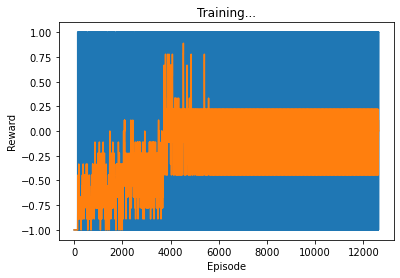

In [110]:
ep_rewards = []
policy_net.train()
dqnloc_count = [0 for i in range(em.env.obs_space.nvec[3] * len(em.env.tx_locs))]
loc_errors = [0.0 for x in range(em.env.obs_space.nvec[3] * len(em.env.tx_locs))]
iter_avg_error = []
iter_errors = []

dqn_epslen=[]
outer = tqdm.notebook.tqdm(total=episodes, desc='training loop: ', position=0)

train_steps = 0
for episode in range(episodes):
    
    #if ((episode+1) > 4100):    
    #    obs = em.test_reset(np.array([[-100,-100,0]]), test_txbdir, em.env.sc_xyz, ch_randvals[episode*(em.env.goal_steps+1)])
    #    test_txbdir = (test_txbdir + 1) % em.env.N_tx
    #else:
    #    #tx_loc_xndx, tx_loc_yndx, tx_dir_ndx =em.env.obs_space.sample()
    tx_num, tx_dir_ndx = obs_list[episode]
    
    #policy_net.eval()
    #with torch.no_grad():
    #    action_probs = policy_net(obs).detach().data.cpu().numpy()[0]  
    #policy_net.train()
    #actions= np.argsort(action_probs)[::-1]
    
    obs = em.reset(tx_num, tx_dir_ndx, ch_randvals[episode], dqnloc_count[tx_num * em.env.obs_space.nvec[3] + tx_dir_ndx]+1)
    tx_num = em.env.get_txloc_ndx(em.env.tx_loc)
    dqnloc_count[tx_num * em.env.obs_space.nvec[3] + tx_dir_ndx] +=1
    #obs = em.test_reset(np.array([[em.env.rx_xcov[tx_loc_xndx],em.env.rx_ycov[tx_loc_yndx], 0]]), tx_dir_ndx, em.env.sc_xyz, ch_randvals[episode*(em.env.goal_steps+1)])
    #dqnloc_maxexhselections[(tx_loc_xndx*len(em.env.rx_ycov)+tx_loc_yndx)*available_actions+tx_dir_ndx]+=1
    
    ep_loss = 0.0
    ep_rwd = 0.0
    timestep = 0
    tx_dirs = []
    rx_dirs = [-1.0 for x in range(em.env.action_space.n)]
    data_rates =[np.inf for x in range(em.env.action_space.n)]
    rssi_vals =[np.complex(1,0) for x in range(em.env.action_space.n)]
    rwd_vals =[-2.0 for x in range(em.env.action_space.n)]
    #agent.current_step +=1
    train_steps +=1
    eps = strategy.get_exploration_rate(train_steps)
    done = False
    while True:
        tx_dirs.append(em.env.tx_bdir*180/np.pi)
        #rx_dirs.append(em.env.rx_bdir[0]*180/np.pi)
        #data_rates.append(em.env.rate)
        #print(em.env.rbdir_ndx)
        if(em.env.rbdir_ndx >= 0):
            rx_dirs[em.env.rbdir_ndx] = em.env.rx_bdir*180/np.pi
            data_rates[em.env.rbdir_ndx] = em.env.rate
            rssi_vals[em.env.rbdir_ndx] = em.env.rssi_val

        action = agent.act(obs, policy_net, eps)
        next_obs, reward, done, _ = em.step(action)#,ch_randvals[episode*(em.env.goal_steps+1)+timestep+1])
        #agent.step(obs, action, reward, next_obs, done)
        rwd_vals[em.env.rbdir_ndx] = reward.item()
        ep_rwd += reward.item()
        
        '''
        if(np.all(em.env.tx_loc == np.array([[100,100,0]]))):
            print("ch_model: {}, sc_xyz: {}, min_exh_rate: {}, max_exh_rate: {}, min_action_ndx: {}, max_action_ndx: {}".format(em.env.ch_model, em.env.sc_xyz, min_exh_rate, max_exh_rate, min_action_ndx, max_action_ndx))
        '''   
        memory.add(obs, action, reward, next_obs, done)
        obs = next_obs
        
        ep_rewards.append(reward.item())
        exh_rate = loc_SNRexh[tx_num * em.env.obs_space.nvec[3] + em.env.txdir_ndx]
        if data_rates[em.env.rbdir_ndx] == np.inf:
            dqn_rate = 0.0
        else:
            dqn_rate = data_rates[em.env.rbdir_ndx]#max(data_rates)
        #SNR_exh = Es * loc_SNRexh[tx_num * em.env.obs_space.nvec[3] + em.env.txdir_ndx]#np.abs(max_rssi_val) ** 2 / (em.env.N0 * em.env.B)
        #error = exh_rate-dqn_rate#np.abs(20*np.log10(np.abs(max_rssi_val))-20*np.log10(np.abs(rssi_val)))#max_exh_rate - dqn_rate
        
        iter_errors.append(dqn_rate)
        loc_errors[tx_num * em.env.obs_space.nvec[3] + em.env.txdir_ndx] = dqn_rate
        iter_avg_error.append(np.mean(loc_errors))

        print("exh_rate: {}, dqn_rate: {}, iter_avg_error: {}".format(exh_rate, dqn_rate, np.mean(loc_errors)))
        
        
        if memory.can_provide_sample():
            experiences = memory.sample()
            observations, actions, rewards, next_observations, dones = experiences
            weights, batch_indices = torch.tensor(np.ones_like(rewards.cpu().data.numpy())).to(device), None

            #print(states.shape, states.dtype)
            #print(actions.unsqueeze(-1).shape)
            current_q_values = policy_net(observations).gather(1,index=actions.unsqueeze(-1))#(1-ALPHA)*
            
            next_q_values = target_net(next_observations).detach().max(1)[0]
            target_q_values = ((next_q_values*GAMMA) + rewards)
            #print(policy_net(observations).type())
            #print(target_q_values.unsqueeze(1).type())
            #loss = F.mse_loss(current_q_values, target_q_values.unsqueeze(1).float())
            td_errors = ALPHA*(target_q_values.unsqueeze(1).float()-current_q_values)
            loss = F.mse_loss(torch.zeros(current_q_values.size()).to(device), ALPHA*(target_q_values.unsqueeze(1).float()-current_q_values),  reduction='sum')
            #weighted_loss = torch.mean(weights*loss)
            #print("loss: ", loss)
            #loss = ALPHA*loss
            #ep_loss += weighted_loss.item()
            #ep_loss = torch.mean(loss).detach().numpy()
            ep_loss = loss.item()
            
            optimizer.zero_grad()
            #weighted_loss.backward()
            #ep_loss.backward(torch.ones_like(ep_loss))
            loss.backward(torch.ones_like(loss))
            optimizer.step()
            
        timestep +=1
        if done:
            dqn_epslen.append(len(tx_dirs))
            #data_rates.append(em.env.rate)
            data_rates[em.env.rbdir_ndx] = em.env.rate
            rssi_vals[em.env.rbdir_ndx] = em.env.rssi_val
            
            #ep_rewards.append(ep_rwd)
            moving_avg_rwd = get_moving_average(em.env.obs_space.nvec[3]*len(em.env.tx_locs), ep_rewards)
            
            #print('\rEpisode {},\tScore: {:.2f}, eps: {}, moving avg_rwd: {}, ep_loss: {}'.format(episode+1, ep_rwd, eps, moving_avg_rwd[-1], ep_loss), end="\r")
            print('Episode {},\t Score: {:.2f}, eps: {}, moving avg_rwd: {}, ep_loss: {}'.format(episode+1, ep_rwd, eps, moving_avg_rwd[-1], ep_loss))
            #plot(episode_rewards, 100)
            #min_exh_rate, max_exh_rate,min_action_ndx,max_action_ndx= em.env.get_minmax_exhrate(ch_randvals[episode*(em.env.goal_steps+1):(episode+1)*(em.env.goal_steps+1)])
            
            #if(((episode+1) >= 6000) or (3000 <= (episode+1)<=3500)):
            #if((episode+1) > 4100):
                
            #    test_data_rates.append(np.mean(data_rates[1:]))
            #    test_eps_iters.append(timestep)
            #    test_minexh_rates.append(min_exh_rate)
            #    test_maxexh_rates.append(max_exh_rate)
                
                #if (timestep > 3):
                #    if(timestep >=8):
                #        false_positives +=1
                #if (min_exh_rate == max_exh_rate):
             #   print("\ntest_eps: {0}, eps_rwd: {1}".format(episode+1, ep_rwd))
            print("TX loc: {}".format(em.env.tx_loc))
             #   print("SC_xyz: {}".format(em.env.sc_xyz))
 
            tx_num = em.env.get_txloc_ndx(em.env.tx_loc)
            exh_bdir_ndx = loc_exhbdir[tx_num * em.env.obs_space.nvec[3] + em.env.txdir_ndx]
            print("TX dirs: {}, episode length: {}".format(tx_dirs, len(tx_dirs)))
            print("RX dirs: {}".format(rx_dirs))
            best_action_ndx = em.env.rbdir_ndx#data_rates.index(max(data_rates))
            print("dqn rx bdir: {}, exh bdir: {}".format(rx_dirs[best_action_ndx], em.env.BeamSet[exh_bdir_ndx]*180/np.pi))
            print("data rates: ", data_rates)
            print("rwd vals: ", rwd_vals)
 
            print("\n\n")
                            
            timestep = 0
            break
            
    for local_param, target_param in zip(policy_net.parameters(), target_net.parameters()):
        target_param.data.copy_(TAU*local_param.data + (1.0-TAU)*target_param.data)
    
    #Update the policy network
    #if episode % UPDATE_EVERY == 0:
    #    target_net.load_state_dict(policy_net.state_dict())
    
    # update tqdm bar
    outer.update(1)
    
#torch.save(policy_net.state_dict(), 'checkpoint.pth')

#timer.finish()
test_rewards = []
plot(ep_rewards, em.env.obs_space.nvec[3]*len(em.env.tx_locs), test_rewards)
#print("No. of false positives: {}".format(false_positives))

In [10]:
print("Average episode length: {}".format(np.mean(dqn_epslen)))

Average episode length: 1.5923333333333334


In [11]:
print(len(iter_avg_error))

9554


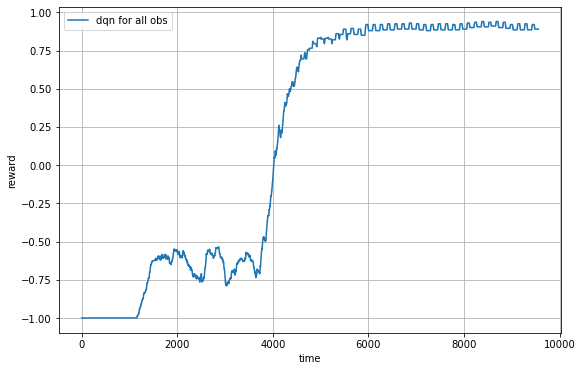

In [12]:
##### from Source.misc_fun.utils import *
fig = plt.figure(figsize=[9, 6])

#loc_ndx = 0
#tbdir_ndx = 3
#em.env.obs_space.nvec[3]*len(em.env.tx_locs)
dqn_movingavg = get_moving_average(400, ep_rewards)

plt.plot(np.arange(1,len(ep_rewards)+1,1), dqn_movingavg)
#min_ndx=0
#max_ndx=500
#plt.plot(test_eps_iters[min_ndx:max_ndx])
plt.grid()
plt.legend(['dqn for all obs'])
plt.xlabel('time')
plt.ylabel('reward')
#plt.savefig("121020_cab_dqn_rwdplot_13.pdf")
plt.show()
#plt.savefig("071020_cab_dqn_rwdplot_2.pdf")

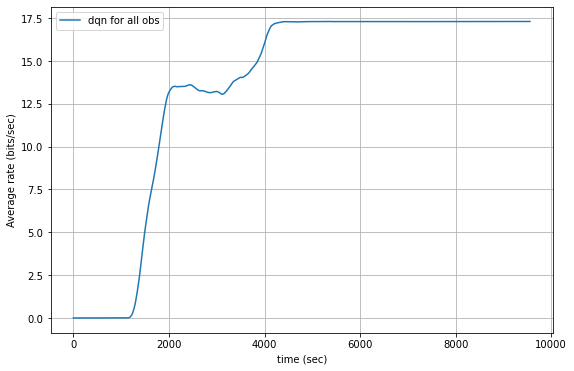

In [13]:
from Source.misc_fun.utils import *
fig = plt.figure(figsize=[9, 6])

#loc_ndx = 0
#tbdir_ndx = 3
context_ndx = 7#0*len(tx_dirs)+ 4#tbdir_ndx
#context_ndx2 = sel_ctxt_ndices[1]#1*len(tx_dirs)+ 4#tbdir_ndx
#context_ndx3 = sel_ctxt_ndices[2]#2*len(tx_dirs)+ 3#tbdir_ndx
#context_ndx4 = sel_ctxt_ndices[3]#3*len(tx_dirs)+ 3#tbdir_ndx
moving_avg_period = 200
#plt.plot(np.arange(1,len(cabenv_avgerrors[context_ndx])+1), cabenv_avgerrors[7], np.arange(1,len(iter_avg_error)+1),iter_avg_error)
#cab_movingavg = get_moving_average(moving_avg_period, cabenv_avgerrors[context_ndx][:len(iter_avg_error)])

dqn_movingavg = get_moving_average(moving_avg_period, iter_avg_error)

plt.plot(np.arange(1,len(iter_avg_error)+1,1), dqn_movingavg)
#min_ndx=0
#max_ndx=500
#plt.plot(test_eps_iters[min_ndx:max_ndx])
plt.grid()
plt.legend(['dqn for all obs'])
plt.xlabel('time (sec)')
plt.ylabel('Average rate (bits/sec)')
#plt.savefig("121020_cab_dqn_erroplot_13.pdf")
plt.show()
#plt.savefig("071020_cab_dqn_erroplot_2.pdf")

## Simulation 2: BeamAlignment over location CAB vs DQN without channel variation
- with wider beams

In [117]:
#Assume LOS or NLOS throughout the environment. Do not change in between for now
from Source.nn_model_dqn import QNetwork
from Source.dqn_rcv_agent import Agent, DQN_ReplayBuffer, EpsilonGreedyStrategy
from Source.env_manager import EnvManager
from Source.misc_fun.utils import plot, get_moving_average, Generate_BeamDir, All_Exhaustive_RateMeas
from Source.PER import PrioritizedReplayBuffer

#Hyper-parameters
BUFFER_SIZE = int(1e5)      #replay buffer size
BATCH_SIZE = 64             #minibatch size
GAMMA = 0.999                #discount factor
ALPHA = 1.0                  #non-stationarity parameter
TAU = 1e-3                  #for soft update of target parameters
LR = 5e-4                   #learning rate
eps_start = 1.0
eps_end = 0.01
eps_decay = 0.9985 #125e-6
episodes = 6000 #3100 train, 500 test

test_episodes = 20
seed = 0                    #random seed number
episode_step_limit = 50
#%%
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

#Choose the environment
em2 = EnvManager(device, 'combrf-v7', seed)
em2.env.ant_arr = 'ula'
rx_xcov = np.array([100*np.cos(20*np.pi/180), 100*np.cos(40*np.pi/180), 100*np.cos(80*np.pi/180)])#np.array([-300,-100,100])
rx_ycov = np.array([100*np.sin(20*np.pi/180), 100*np.sin(40*np.pi/180), 100*np.sin(80*np.pi/180)])#np.array([-300,-100,100])
rx_zcov = np.array([51.5,71.5])
beam_param = 'beam-width'
beam_paramvals = np.array([np.pi / em2.env.N_rx, 2*np.pi/em2.env.N_rx])
em2.env.set_beamparameters(beam_param, beam_paramvals)
em2.env.set_coverage(rx_xcov,rx_ycov,rx_zcov)

available_actions = em2.num_actions_available()
random.seed(seed)
state_size = em2.state_size()
print(em2.env.ch_model)
print(em2.env.sc_xyz)
print("state size: ", state_size)
print("action space: ", available_actions)
#Select the strategy
strategy = EpsilonGreedyStrategy(eps_start, eps_end, eps_decay, 4200)#episodes
#Initialize the agent
agent = Agent(strategy, state_size, available_actions, seed, device)

#Instantiate MemoryBuffer
#if not PRIORITIZED_REPLAY:
memory = DQN_ReplayBuffer(available_actions, BUFFER_SIZE, BATCH_SIZE, seed, device)
#else:
#    memory = PrioritizedReplayBuffer(available_actions, BUFFER_SIZE, BATCH_SIZE, PER_ALPHA,seed, device)

policy_net = QNetwork(state_size, available_actions, seed).to(device)
target_net = QNetwork(state_size, available_actions, seed).to(device)
print(policy_net)

#Initialize target_net weights to policy_net weights
target_net.load_state_dict(policy_net.state_dict())
target_net.eval() #Set the target_net in eval mode

#Select the optimizer
optimizer = optim.Adam(params=policy_net.parameters(), lr=LR)

uma-los
[]
state size:  21
action space:  12
QNetwork(
  (fc11): Linear(in_features=18, out_features=200, bias=True)
  (fc12): Linear(in_features=3, out_features=18, bias=True)
  (fc22): Linear(in_features=18, out_features=200, bias=True)
  (hidden_layers): ModuleList(
    (0): Linear(in_features=400, out_features=400, bias=True)
    (1): Linear(in_features=400, out_features=256, bias=True)
  )
  (softmax): Softmax(dim=1)
  (output): Linear(in_features=256, out_features=12, bias=True)
)


In [118]:
from Source.misc_fun.conversion import *

#loc_SNRexh = [0.0 for i in range(em.env.obs_space.nvec[3] * len(em.env.tx_locs)) ]
loc_SNRexh = [0.0 for i in range(em2.env.obs_space.nvec[3] * len(em2.env.tx_locs)) ]
#loc_minSNRexh = [0.0 for i in range(em2.env.obs_space.nvec[3] * len(em2.env.tx_locs)) ]
loc_exhbdir = [0 for i in range(em2.env.obs_space.nvec[3] * len(em2.env.tx_locs)) ]
for loc_ndx in range(len(em2.env.tx_locs)):
    for tbdir_ndx in range(em2.env.obs_space.nvec[3]):
        min_exh_rate, max_exh_rate,min_action_ndx,max_action_ndx,min_rssi_val,max_rssi_val = em2.env.get_minmax_exhrate(loc_ndx, tbdir_ndx, ch_randvals[loc_ndx * em2.env.obs_space.nvec[3] + tbdir_ndx])
        #tx_num = em.env.get_txloc_ndx(em.env.tx_loc)
        #Es = db2lin(em.env.P_tx)
        #SNR_exh = Es * np.abs(max_rssi_val) ** 2 / (em.env.N0 * em.env.B)
        #SNR_exh = Es * np.abs(max_rssi_val) ** 2 / (em.env.N0 * em.env.B)
        #exh_rate = np.log2(1 + SNR_exh)
        #loc_minSNRexh[loc_ndx * em2.env.obs_space.nvec[3] + tbdir_ndx] =min_rssi_val
        loc_SNRexh[loc_ndx * em2.env.obs_space.nvec[3] + tbdir_ndx] =max_exh_rate#
        loc_exhbdir[loc_ndx * em2.env.obs_space.nvec[3] + tbdir_ndx] = max_action_ndx

In [119]:
locndx_list = list(range(len(em2.env.tx_locs)))
random_loc_ndices = random.sample(locndx_list, len(locndx_list))
txdir_list = list(range(em2.env.obs_space.nvec[3]))
txdir_ndices = random.sample(txdir_list, len(txdir_list))

obs_list = []
for eps in range(episodes):
    ndx = eps % (em2.env.obs_space.nvec[3] * len(em2.env.tx_locs))
    ndx1 = int(ndx / em2.env.obs_space.nvec[3])    
    ndx2 = int(ndx % em2.env.obs_space.nvec[3])
    obs_list.append((random_loc_ndices[ndx1],txdir_ndices[ndx2]))

In [120]:
print(len(em2.env.tx_locs))

18


exh_rate: 23.577234585162934, dqn_rate: 0.0, iter_avg_error: 0.0
exh_rate: 23.577234585162934, dqn_rate: 0.0, iter_avg_error: 0.0
exh_rate: 23.577234585162934, dqn_rate: 0.0, iter_avg_error: 0.0
exh_rate: 23.577234585162934, dqn_rate: 0.0, iter_avg_error: 0.0
exh_rate: 23.577234585162934, dqn_rate: 0.0, iter_avg_error: 0.0
exh_rate: 23.577234585162934, dqn_rate: 0.0, iter_avg_error: 0.0
exh_rate: 23.577234585162934, dqn_rate: 0.0, iter_avg_error: 0.0
exh_rate: 23.577234585162934, dqn_rate: 0.0, iter_avg_error: 0.0
exh_rate: 23.577234585162934, dqn_rate: 0.0, iter_avg_error: 0.0
exh_rate: 23.577234585162934, dqn_rate: 0.0, iter_avg_error: 0.0
exh_rate: 23.577234585162934, dqn_rate: 0.0, iter_avg_error: 0.0
exh_rate: 23.577234585162934, dqn_rate: 0.0, iter_avg_error: 0.0
Episode 1,	 Score: -12.00, eps: 0.9985, moving avg_rwd: -1.0, ep_loss: 0.0
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000

exh_rate: 20.552193206690127, dqn_rate: 0.0, iter_avg_error: 0.0
exh_rate: 20.552193206690127, dqn_rate: 0.0, iter_avg_error: 0.0
exh_rate: 20.552193206690127, dqn_rate: 0.0, iter_avg_error: 0.0
exh_rate: 20.552193206690127, dqn_rate: 0.0, iter_avg_error: 0.0
exh_rate: 20.552193206690127, dqn_rate: 0.0, iter_avg_error: 0.0
exh_rate: 20.552193206690127, dqn_rate: 0.0, iter_avg_error: 0.0
exh_rate: 20.552193206690127, dqn_rate: 0.0, iter_avg_error: 0.0
exh_rate: 20.552193206690127, dqn_rate: 0.0, iter_avg_error: 0.0
Episode 8,	 Score: -12.00, eps: 0.9880628113539505, moving avg_rwd: -1.0, ep_loss: 38.0174674987793
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 12
RX dirs: [22.500000000000004, 45.0, -1.0, 90.0, 112.5, -1.0, 157.5, -1.0, 45.0, -1.0, 135.0, 180.0]
dqn rx bdi

exh_rate: 19.928661262969186, dqn_rate: 0.0, iter_avg_error: 0.0
Episode 14,	 Score: -12.00, eps: 0.9792035265523947, moving avg_rwd: -1.0, ep_loss: 70.42552947998047
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 12
RX dirs: [22.500000000000004, 45.0, -1.0, 90.0, -1.0, -1.0, 157.5, 180.0, 45.0, 90.0, 135.0, 180.0]
dqn rx bdir: -1.0, exh bdir: 45.0
data rates:  [inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.532533616610433, dqn_rate: 0.0, iter_avg_error: 0.0
exh_rate: 18.532533616610433, dqn_rate: 0.0, iter_avg_error: 0.0
exh_rate: 18.532533616610433, dqn_rate: 0.0, iter_avg_error: 0.0
exh_rate: 18.532533616610433, dqn_rate: 0.0, iter_avg_error: 0.0
exh_rate: 18.532533616610433, dqn_rate: 0.0, iter_avg_error: 0.0
exh_rate: 18.53253361661043

exh_rate: 20.971503259689168, dqn_rate: 0.0, iter_avg_error: 3.8411659550766597
exh_rate: 20.971503259689168, dqn_rate: 0.0, iter_avg_error: 3.8411659550766597
exh_rate: 20.971503259689168, dqn_rate: 0.0, iter_avg_error: 3.8411659550766597
exh_rate: 20.971503259689168, dqn_rate: 9.169358078329822, iter_avg_error: 4.350574737206094
exh_rate: 20.971503259689168, dqn_rate: 9.169358078329822, iter_avg_error: 4.350574737206094
exh_rate: 20.971503259689168, dqn_rate: 0.0, iter_avg_error: 3.8411659550766597
exh_rate: 20.971503259689168, dqn_rate: 0.0, iter_avg_error: 3.8411659550766597
exh_rate: 20.971503259689168, dqn_rate: 0.0, iter_avg_error: 3.8411659550766597
exh_rate: 20.971503259689168, dqn_rate: 17.719727995923837, iter_avg_error: 4.825595288183539
Episode 23,	 Score: -12.00, eps: 0.9660633174490623, moving avg_rwd: -0.8888888955116272, ep_loss: 119.3576431274414
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.5000000000

exh_rate: 19.78901083032252, dqn_rate: 0.0, iter_avg_error: 8.837207776579799
exh_rate: 19.78901083032252, dqn_rate: 0.0, iter_avg_error: 8.837207776579799
exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 9.936597267153273
Episode 28,	 Score: -9.00, eps: 0.9588395464126463, moving avg_rwd: -0.8888888955116272, ep_loss: 137.5129852294922
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 11
RX dirs: [22.500000000000004, 45.0, -1.0, 90.0, -1.0, 135.0, 157.5, -1.0, 45.0, 90.0, 135.0, 180.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [12.634177845761611, 19.78901083032252, inf, 14.27401008795057, inf, 14.449544641992945, 14.848748452375737, inf, 17.95731267927319, 13.890822566720864, 13.740598189056096, 15.33718464229081]



exh_rate: 20.25928715681807, dqn_rate: 0.0, 

exh_rate: 20.840678216326523, dqn_rate: 15.800779358569466, iter_avg_error: 17.08633292692513
exh_rate: 20.840678216326523, dqn_rate: 13.89280423555222, iter_avg_error: 16.980334308979728
exh_rate: 20.840678216326523, dqn_rate: 0.0, iter_avg_error: 16.20851185144905
exh_rate: 20.840678216326523, dqn_rate: 0.0, iter_avg_error: 16.20851185144905
exh_rate: 20.840678216326523, dqn_rate: 0.0, iter_avg_error: 16.20851185144905
exh_rate: 20.840678216326523, dqn_rate: 0.0, iter_avg_error: 16.20851185144905
exh_rate: 20.840678216326523, dqn_rate: 0.0, iter_avg_error: 16.20851185144905
exh_rate: 20.840678216326523, dqn_rate: 16.495023701217374, iter_avg_error: 17.124902057072237
exh_rate: 20.840678216326523, dqn_rate: 16.495023701217374, iter_avg_error: 17.124902057072237
Episode 35,	 Score: -12.00, eps: 0.9488169232507021, moving avg_rwd: -0.7777777910232544, ep_loss: 160.8516845703125
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 

exh_rate: 21.3549172924632, dqn_rate: 0.0, iter_avg_error: 17.75961543272638
exh_rate: 21.3549172924632, dqn_rate: 0.0, iter_avg_error: 17.75961543272638
exh_rate: 21.3549172924632, dqn_rate: 20.184920570537166, iter_avg_error: 18.880999908867334
exh_rate: 21.3549172924632, dqn_rate: 0.0, iter_avg_error: 17.75961543272638
exh_rate: 21.3549172924632, dqn_rate: 16.429436541891395, iter_avg_error: 18.672361907275903
exh_rate: 21.3549172924632, dqn_rate: 0.0, iter_avg_error: 17.75961543272638
exh_rate: 21.3549172924632, dqn_rate: 20.184920570537166, iter_avg_error: 18.880999908867334
exh_rate: 21.3549172924632, dqn_rate: 19.167894676288064, iter_avg_error: 18.82449847029794
exh_rate: 21.3549172924632, dqn_rate: 0.0, iter_avg_error: 17.75961543272638
exh_rate: 21.3549172924632, dqn_rate: 20.184920570537166, iter_avg_error: 18.880999908867334
exh_rate: 21.3549172924632, dqn_rate: 0.0, iter_avg_error: 17.75961543272638
exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 18

exh_rate: 19.928661262969186, dqn_rate: 0.0, iter_avg_error: 17.426118093949682
exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_avg_error: 18.533265941892413
Episode 50,	 Score: -2.00, eps: 0.9276912499837309, moving avg_rwd: -0.7777777910232544, ep_loss: 210.08949279785156
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 4
RX dirs: [-1.0, 45.0, -1.0, 90.0, -1.0, 135.0, 157.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, 13.45782839202147, inf, 9.998249911488989, 13.490825079640869, inf, inf, inf, inf, inf]



exh_rate: 18.532533616610433, dqn_rate: 0.0, iter_avg_error: 17.505770722687497
exh_rate: 18.532533616610433, dqn_rate: 0.0, iter_avg_error: 17.505770722687497
exh_rate: 18.532533616610433, dqn_rate: 0.0, iter_avg_error: 17.505770722687497
exh_rate: 18.532533616610433, dqn_rate: 0.0, iter_avg_error: 17.505770722687497
exh_rate: 18.5325336166104

exh_rate: 20.059919058270147, dqn_rate: 0.0, iter_avg_error: 17.95109223605993
exh_rate: 20.059919058270147, dqn_rate: 0.0, iter_avg_error: 17.95109223605993
exh_rate: 20.059919058270147, dqn_rate: 8.119308335871365, iter_avg_error: 18.402164921386124
exh_rate: 20.059919058270147, dqn_rate: 13.82932689619737, iter_avg_error: 18.719388174737563
exh_rate: 20.059919058270147, dqn_rate: 8.119308335871365, iter_avg_error: 18.402164921386124
exh_rate: 20.059919058270147, dqn_rate: 0.0, iter_avg_error: 17.95109223605993
exh_rate: 20.059919058270147, dqn_rate: 0.0, iter_avg_error: 17.95109223605993
exh_rate: 20.059919058270147, dqn_rate: 15.903688361149081, iter_avg_error: 18.834630478345993
exh_rate: 20.059919058270147, dqn_rate: 14.666148035688778, iter_avg_error: 18.765878238042646
exh_rate: 20.059919058270147, dqn_rate: 8.119308335871365, iter_avg_error: 18.402164921386124
Episode 58,	 Score: -12.00, eps: 0.9166172245273856, moving avg_rwd: -1.0, ep_loss: 239.0098419189453
TX dirs: [22.500

exh_rate: 19.484200641498976, dqn_rate: 0.0, iter_avg_error: 17.44849310983254
exh_rate: 19.484200641498976, dqn_rate: 12.057269869652647, iter_avg_error: 18.118341435924357
exh_rate: 19.484200641498976, dqn_rate: 13.481632547650353, iter_avg_error: 18.19747269581312
exh_rate: 19.484200641498976, dqn_rate: 13.481632547650353, iter_avg_error: 18.19747269581312
Episode 66,	 Score: -12.00, eps: 0.9056753918019839, moving avg_rwd: -0.7777777910232544, ep_loss: 280.121337890625
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 12
RX dirs: [-1.0, 45.0, -1.0, 90.0, 112.5, -1.0, 157.5, 180.0, 45.0, 90.0, -1.0, 180.0]
dqn rx bdir: 90.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, 14.862309400770725, 9.872409919131476, inf, 12.057269869652647, 15.789621199496796, 18.1

exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 18.040067884015098
Episode 73,	 Score: -1.00, eps: 0.8962084865277503, moving avg_rwd: -0.7777777910232544, ep_loss: 307.9321594238281
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 3
RX dirs: [-1.0, 45.0, 67.5, -1.0, -1.0, -1.0, -1.0, 180.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, 19.186654363541628, 23.577234585162934, inf, inf, inf, inf, 18.108466832323934, inf, inf, inf, inf]



exh_rate: 22.065234244869465, dqn_rate: 0.0, iter_avg_error: 16.814221537077902
exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 18.040067884015098
Episode 74,	 Score: 0.00, eps: 0.8948641737979588, moving avg_rwd: -0.6666666865348816, ep_loss: 307.91680908203125
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn r

exh_rate: 18.66579289905184, dqn_rate: 18.66579289905184, iter_avg_error: 18.66760374784228
Episode 81,	 Score: 0.00, eps: 0.8855102767578781, moving avg_rwd: -0.7777777910232544, ep_loss: 331.1712646484375
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [-1.0, -1.0, -1.0, 90.0, -1.0, 135.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, inf, inf, 18.66579289905184, inf, 14.893302447291171, inf, inf, inf, inf, inf, inf]



exh_rate: 19.78901083032252, dqn_rate: 0.0, iter_avg_error: 17.568214257268806
exh_rate: 19.78901083032252, dqn_rate: 0.0, iter_avg_error: 17.568214257268806
exh_rate: 19.78901083032252, dqn_rate: 0.0, iter_avg_error: 17.568214257268806
exh_rate: 19.78901083032252, dqn_rate: 0.0, iter_avg_error: 17.568214257268806
exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 18.66760374784228
Episode 82,	 Score: -3.00, eps: 0.8841820113427413, moving avg_rwd: -0.6666666865348816, ep_l

Episode 91,	 Score: -2.00, eps: 0.8723169228300857, moving avg_rwd: -0.5555555820465088, ep_loss: 366.6202392578125
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 4
RX dirs: [-1.0, 45.0, 67.5, -1.0, -1.0, 135.0, -1.0, -1.0, -1.0, -1.0, -1.0, 180.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, 19.186654363541628, 23.577234585162934, inf, inf, 17.1094615859943, inf, inf, inf, inf, inf, 17.155194107093585]



exh_rate: 22.065234244869465, dqn_rate: 0.0, iter_avg_error: 15.779627045555445
exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 17.00547339249264
Episode 92,	 Score: 0.00, eps: 0.8710084474458406, moving avg_rwd: -0.4444444477558136, ep_loss: 366.5330810546875
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [17.24331898956096, i

exh_rate: 19.78901083032252, dqn_rate: 14.449544641992945, iter_avg_error: 16.748653196205503
exh_rate: 19.78901083032252, dqn_rate: 0.0, iter_avg_error: 15.945900716094785
exh_rate: 19.78901083032252, dqn_rate: 0.0, iter_avg_error: 15.945900716094785
exh_rate: 19.78901083032252, dqn_rate: 11.623198029686495, iter_avg_error: 16.591633939966258
exh_rate: 19.78901083032252, dqn_rate: 0.0, iter_avg_error: 15.945900716094785
exh_rate: 19.78901083032252, dqn_rate: 0.0, iter_avg_error: 15.945900716094785
exh_rate: 19.78901083032252, dqn_rate: 14.449544641992945, iter_avg_error: 16.748653196205503
exh_rate: 19.78901083032252, dqn_rate: 0.0, iter_avg_error: 15.945900716094785
exh_rate: 19.78901083032252, dqn_rate: 0.0, iter_avg_error: 15.945900716094785
exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 17.04529020666826
Episode 100,	 Score: -10.00, eps: 0.8606110552963769, moving avg_rwd: -0.5555555820465088, ep_loss: 380.0523986816406
TX dirs: [22.500000000000004, 22.5

exh_rate: 20.840678216326523, dqn_rate: 0.0, iter_avg_error: 17.57986228581391
exh_rate: 20.840678216326523, dqn_rate: 16.495023701217374, iter_avg_error: 18.496252491437097
exh_rate: 20.840678216326523, dqn_rate: 13.949342159306372, iter_avg_error: 18.35482573910871
exh_rate: 20.840678216326523, dqn_rate: 13.949342159306372, iter_avg_error: 18.35482573910871
exh_rate: 20.840678216326523, dqn_rate: 16.495023701217374, iter_avg_error: 18.496252491437097
exh_rate: 20.840678216326523, dqn_rate: 16.495023701217374, iter_avg_error: 18.496252491437097
Episode 107,	 Score: -12.00, eps: 0.8516152015807995, moving avg_rwd: -0.8888888955116272, ep_loss: 417.2227478027344
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 12
RX dirs: [22.500000000000004, 45.0, -1.0, -1.0, -1.0, 135.0,

exh_rate: 20.63821463730202, dqn_rate: 20.005491093991925, iter_avg_error: 19.376766957929924
exh_rate: 20.63821463730202, dqn_rate: 13.840030530661071, iter_avg_error: 19.03424137107821
exh_rate: 20.63821463730202, dqn_rate: 20.005491093991925, iter_avg_error: 19.376766957929924
Episode 114,	 Score: -12.00, eps: 0.8427133803361903, moving avg_rwd: -0.8888888955116272, ep_loss: 399.6714172363281
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 12
RX dirs: [22.500000000000004, 45.0, -1.0, 90.0, 112.5, -1.0, -1.0, 180.0, -1.0, 90.0, -1.0, 180.0]
dqn rx bdir: 22.500000000000004, exh bdir: 45.0
data rates:  [20.005491093991925, 20.63821463730202, inf, 13.840030530661071, 14.621245977885339, inf, inf, 17.062794970478592, inf, 15.30517764982532, inf, 18.527998118565637]



exh_

exh_rate: 18.532533616610433, dqn_rate: 11.819857565329153, iter_avg_error: 18.84644114134811
exh_rate: 18.532533616610433, dqn_rate: 0.0, iter_avg_error: 18.18978238771871
exh_rate: 18.532533616610433, dqn_rate: 0.0, iter_avg_error: 18.18978238771871
exh_rate: 18.532533616610433, dqn_rate: 0.0, iter_avg_error: 18.18978238771871
exh_rate: 18.532533616610433, dqn_rate: 13.73090628072869, iter_avg_error: 18.95261051442586
exh_rate: 18.532533616610433, dqn_rate: 14.825579724858477, iter_avg_error: 19.013425705766405
exh_rate: 18.532533616610433, dqn_rate: 14.336968125933284, iter_avg_error: 18.98628061693723
Episode 123,	 Score: -12.00, eps: 0.8314047711129563, moving avg_rwd: -0.7777777910232544, ep_loss: 423.90771484375
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 12
R

exh_rate: 20.059919058270147, dqn_rate: 0.0, iter_avg_error: 17.18872204333886
exh_rate: 20.059919058270147, dqn_rate: 15.530037063237701, iter_avg_error: 18.0515018801854
exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 18.303161991020534
Episode 130,	 Score: -9.00, eps: 0.822714206829199, moving avg_rwd: -0.8888888955116272, ep_loss: 365.2052917480469
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 11
RX dirs: [22.500000000000004, 45.0, -1.0, 90.0, 112.5, 135.0, 157.5, 180.0, 45.0, -1.0, 135.0, 180.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [8.119308335871365, 20.059919058270147, inf, 13.82932689619737, 13.056435042215435, 14.666148035688778, 15.5402007130275, 15.530037063237701, 18.10973291409262, inf, 13.50025435642008, 15.903688361149081]



exh_rate: 

exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_avg_error: 18.43724394458651
Episode 140,	 Score: 0.00, eps: 0.8104564612140248, moving avg_rwd: -0.5555555820465088, ep_loss: 368.9381103515625
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [19.49384385693911, 19.928661262969186, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.532533616610433, dqn_rate: 18.532533616610433, iter_avg_error: 18.67033091629079
Episode 141,	 Score: 1.00, eps: 0.8092407765222038, moving avg_rwd: -0.4444444477558136, ep_loss: 370.4945068359375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 90.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, inf, inf, inf, inf, inf, inf, inf, inf, 18.532533616610433, inf, inf]



exh_rate: 21.03721

Episode 150,	 Score: 1.00, eps: 0.7983813456377136, moving avg_rwd: -0.6666666865348816, ep_loss: 380.3802185058594
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 20.107923430123858
Episode 151,	 Score: 1.00, eps: 0.7971837736192571, moving avg_rwd: -0.5555555820465088, ep_loss: 381.11297607421875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127, iter_avg_error: 20.107923430123858
Episode 152,	 Score: 1.00, e

exh_rate: 21.03721437896766, dqn_rate: 0.0, iter_avg_error: 18.693609162228324
exh_rate: 21.03721437896766, dqn_rate: 0.0, iter_avg_error: 18.693609162228324
exh_rate: 21.03721437896766, dqn_rate: 0.0, iter_avg_error: 18.693609162228324
exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 19.862343294393195
Episode 160,	 Score: -4.00, eps: 0.7864861390672024, moving avg_rwd: -0.8888888955116272, ep_loss: 399.7629699707031
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 6
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, 157.5, -1.0, 45.0, 90.0, 135.0, 180.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.03721437896766, inf, inf, inf, inf, inf, 18.497741119874696, inf, 18.2890092910994, 13.332008677156267, 15.503431403256066, 18.903960928082515]



exh_rate: 20.840678216326523, dqn_rate: 0.0, iter_avg_error: 18.70452783793061


Episode 172,	 Score: 0.00, eps: 0.7724455997558498, moving avg_rwd: 0.1111111119389534, ep_loss: 417.28814697265625
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 90.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf, inf, 13.890822566720864, inf, inf]



exh_rate: 20.25928715681807, dqn_rate: 0.0, iter_avg_error: 18.975862751710505
exh_rate: 20.25928715681807, dqn_rate: 0.0, iter_avg_error: 18.975862751710505
exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 20.101378704867066
Episode 173,	 Score: -1.00, eps: 0.7712869313562161, moving avg_rwd: 0.2222222238779068, ep_loss: 418.73028564453125
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 3
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, 157.5, -1.0, 45.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 

exh_rate: 18.808959694862374, dqn_rate: 18.808959694862374, iter_avg_error: 20.113871868893447
Episode 180,	 Score: -3.00, eps: 0.7632247709127533, moving avg_rwd: -0.6666666865348816, ep_loss: 446.85791015625
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 5
RX dirs: [22.500000000000004, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, 180.0, -1.0, -1.0, -1.0, 180.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [15.975673082497993, 18.808959694862374, inf, inf, inf, inf, inf, 15.036702014614642, inf, inf, inf, 13.372778765007343]



exh_rate: 23.577234585162934, dqn_rate: 0.0, iter_avg_error: 18.80402550305106
exh_rate: 23.577234585162934, dqn_rate: 0.0, iter_avg_error: 18.80402550305106
exh_rate: 23.577234585162934, dqn_rate: 0.0, iter_avg_error: 18.80402550305106
exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 20.113871868893447
Episode 181,	 Score: -2.00, eps: 0.7620799337563843, moving 

exh_rate: 19.223968107093192, dqn_rate: 0.0, iter_avg_error: 19.045873640721602
exh_rate: 19.223968107093192, dqn_rate: 0.0, iter_avg_error: 19.045873640721602
exh_rate: 19.223968107093192, dqn_rate: 0.0, iter_avg_error: 19.045873640721602
exh_rate: 19.223968107093192, dqn_rate: 0.0, iter_avg_error: 19.045873640721602
exh_rate: 19.223968107093192, dqn_rate: 0.0, iter_avg_error: 19.045873640721602
exh_rate: 19.223968107093192, dqn_rate: 7.724894884382672, iter_avg_error: 19.47503446763175
exh_rate: 19.223968107093192, dqn_rate: 0.0, iter_avg_error: 19.045873640721602
exh_rate: 19.223968107093192, dqn_rate: 0.0, iter_avg_error: 19.045873640721602
exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 20.113871868893447
Episode 193,	 Score: -7.00, eps: 0.7484750998797312, moving avg_rwd: -0.5555555820465088, ep_loss: 473.3927001953125
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.50

exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 18.450277553139525, iter_avg_error: 20.235544480117074
exh_rate: 20.455736041791322, dqn_rate: 18.450277553139525, iter_avg_error: 20.235544480117074
exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 13.22625371784207, iter_avg_error: 19.94532093371166
exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 201,	 Score: -10.00, eps: 0.7395404114155961, moving avg_rwd: -0.5555555820465088, ep_loss: 491.7033996582031
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode lengt

exh_rate: 19.928661262969186, dqn_rate: 0.0, iter_avg_error: 19.239810992654995
exh_rate: 19.928661262969186, dqn_rate: 19.49384385693911, iter_avg_error: 20.3228023180405
exh_rate: 19.928661262969186, dqn_rate: 0.0, iter_avg_error: 19.239810992654995
exh_rate: 19.928661262969186, dqn_rate: 0.0, iter_avg_error: 19.239810992654995
exh_rate: 19.928661262969186, dqn_rate: 15.556768861395975, iter_avg_error: 20.10407592939922
exh_rate: 19.928661262969186, dqn_rate: 15.556768861395975, iter_avg_error: 20.10407592939922
Episode 212,	 Score: -12.00, eps: 0.7274291021544893, moving avg_rwd: -0.6666666865348816, ep_loss: 510.1689758300781
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 12
RX dirs: [22.500000000000004, 45.0, 67.5, -1.0, -1.0, 135.0, 157.5, -1.0, 45.0, 90.0, 135.0,

exh_rate: 20.971503259689168, dqn_rate: 0.0, iter_avg_error: 18.93899241497204
exh_rate: 20.971503259689168, dqn_rate: 0.0, iter_avg_error: 18.93899241497204
exh_rate: 20.971503259689168, dqn_rate: 12.579073251571732, iter_avg_error: 19.637829817837137
exh_rate: 20.971503259689168, dqn_rate: 0.0, iter_avg_error: 18.93899241497204
exh_rate: 20.971503259689168, dqn_rate: 0.0, iter_avg_error: 18.93899241497204
exh_rate: 20.971503259689168, dqn_rate: 11.590221100894984, iter_avg_error: 19.582893587243987
exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.10407592939922
Episode 221,	 Score: -7.00, eps: 0.7176675252698417, moving avg_rwd: -0.3333333432674408, ep_loss: 505.2157287597656
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 9
RX dirs: [-1.0, 45.0, 67.5, 90.0, -1.0, -1.0, -1.0, 180.0, 45.0, -1.0, 135

exh_rate: 18.532533616610433, dqn_rate: 15.111346200236056, iter_avg_error: 19.049745025078643
exh_rate: 18.532533616610433, dqn_rate: 18.532533616610433, iter_avg_error: 19.239810992654995
Episode 231,	 Score: -5.00, eps: 0.7069748863339789, moving avg_rwd: -0.8888888955116272, ep_loss: 526.1495361328125
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 7
RX dirs: [22.500000000000004, -1.0, 67.5, -1.0, 112.5, 135.0, -1.0, -1.0, -1.0, 90.0, 135.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [7.8295923608002775, inf, 15.794262862233353, inf, 14.336968125933284, 15.111346200236056, inf, inf, inf, 18.532533616610433, 14.112091173458465, inf]



exh_rate: 21.03721437896766, dqn_rate: 0.0, iter_avg_error: 18.071076860490127
exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 19.239810992654995
Episode 232,	 Score: 0.00, eps: 0.7059144240044779, 

exh_rate: 18.66579289905184, dqn_rate: 18.66579289905184, iter_avg_error: 19.239810992654995
Episode 243,	 Score: -1.00, eps: 0.6943538009891256, moving avg_rwd: -0.1111111119389534, ep_loss: 540.7366333007812
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 3
RX dirs: [-1.0, -1.0, -1.0, 90.0, 112.5, 135.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, inf, inf, 18.66579289905184, 13.58355479502133, 14.893302447291171, inf, inf, inf, inf, inf, inf]



exh_rate: 19.78901083032252, dqn_rate: 0.0, iter_avg_error: 18.140421502081523
exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 19.239810992654995
Episode 244,	 Score: 0.00, eps: 0.693312270287642, moving avg_rwd: -0.2222222238779068, ep_loss: 541.6671142578125
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [-1.0, 45.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bd

exh_rate: 18.808959694862374, dqn_rate: 18.808959694862374, iter_avg_error: 20.346958840597733
Episode 252,	 Score: -3.00, eps: 0.6850360709265975, moving avg_rwd: -0.5555555820465088, ep_loss: 563.6298828125
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 5
RX dirs: [-1.0, 45.0, 67.5, 90.0, -1.0, 135.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, 16.548521599053082, 14.347475227897785, inf, 11.878122508448364, inf, inf, inf, inf, inf, inf]



exh_rate: 23.577234585162934, dqn_rate: 0.0, iter_avg_error: 19.037112474755347
exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 20.346958840597733
Episode 253,	 Score: 0.00, eps: 0.6840085168202077, moving avg_rwd: -0.4444444477558136, ep_loss: 564.1597290039062
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, 67.5, -1.0, 

exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 20.346958840597733
Episode 264,	 Score: -2.00, eps: 0.6728066425797139, moving avg_rwd: -0.1111111119389534, ep_loss: 572.473388671875
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 4
RX dirs: [22.500000000000004, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 135.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [15.813496611959547, 19.484200641498976, inf, inf, inf, inf, inf, inf, inf, inf, 14.547867322961416, inf]



exh_rate: 19.223968107093192, dqn_rate: 0.0, iter_avg_error: 19.278960612425884
exh_rate: 19.223968107093192, dqn_rate: 0.0, iter_avg_error: 19.278960612425884
exh_rate: 19.223968107093192, dqn_rate: 0.0, iter_avg_error: 19.278960612425884
exh_rate: 19.223968107093192, dqn_rate: 0.0, iter_avg_error: 19.278960612425884
exh_rate: 19.223968107093192, dqn_rate: 0.0, iter_avg_error: 19.278960612425884
exh_rate: 19.22396810709319

Episode 274,	 Score: 1.00, eps: 0.6627823928408813, moving avg_rwd: -0.2222222238779068, ep_loss: 593.2921752929688
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503259689168, dqn_rate: 0.0, iter_avg_error: 18.07472747822782
exh_rate: 20.971503259689168, dqn_rate: 0.0, iter_avg_error: 18.07472747822782
exh_rate: 20.971503259689168, dqn_rate: 12.579073251571732, iter_avg_error: 18.77356488109292
exh_rate: 20.971503259689168, dqn_rate: 0.0, iter_avg_error: 18.07472747822782
exh_rate: 20.971503259689168, dqn_rate: 0.0, iter_avg_error: 18.07472747822782
exh_rate: 20.971503259689168, dqn_rate: 15.10890889787248, iter_avg_error: 18.914111305887403
exh_rate: 20.971503259689168, dqn_rate: 12.579073251571732, iter_avg_error: 18.77356488109292
exh_rate: 20.971503259689168,

exh_rate: 18.532533616610433, dqn_rate: 0.0, iter_avg_error: 18.76568412014825
exh_rate: 18.532533616610433, dqn_rate: 0.0, iter_avg_error: 18.76568412014825
exh_rate: 18.532533616610433, dqn_rate: 0.0, iter_avg_error: 18.76568412014825
exh_rate: 18.532533616610433, dqn_rate: 0.0, iter_avg_error: 18.76568412014825
exh_rate: 18.532533616610433, dqn_rate: 0.0, iter_avg_error: 18.76568412014825
exh_rate: 18.532533616610433, dqn_rate: 18.532533616610433, iter_avg_error: 19.79526932107105
Episode 285,	 Score: -7.00, eps: 0.6519281346981152, moving avg_rwd: -0.8888888955116272, ep_loss: 606.0299072265625
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 9
RX dirs: [-1.0, -1.0, 67.5, 90.0, 112.5, 135.0, 157.5, 180.0, -1.0, 90.0, 135.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, inf, 15.794262862233353, 18.494913945688506, 

Episode 295,	 Score: 1.00, eps: 0.6422149570622225, moving avg_rwd: -0.3333333432674408, ep_loss: 609.3128662109375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127, iter_avg_error: 19.79526932107105
Episode 296,	 Score: 1.00, eps: 0.6412516346266293, moving avg_rwd: -0.3333333432674408, ep_loss: 608.509521484375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 18.758280826679282
exh_rate: 18.66579289905184, dqn_rate: 0.0

exh_rate: 20.840678216326523, dqn_rate: 0.0, iter_avg_error: 19.07878203363375
exh_rate: 20.840678216326523, dqn_rate: 13.949342159306372, iter_avg_error: 19.85374548692855
exh_rate: 20.840678216326523, dqn_rate: 0.0, iter_avg_error: 19.07878203363375
exh_rate: 20.840678216326523, dqn_rate: 18.849570722882458, iter_avg_error: 20.12598040712722
exh_rate: 20.840678216326523, dqn_rate: 20.840678216326523, iter_avg_error: 20.236597490096337
Episode 305,	 Score: -8.00, eps: 0.6326464975551618, moving avg_rwd: -0.6666666865348816, ep_loss: 615.583740234375
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 10
RX dirs: [22.500000000000004, 45.0, -1.0, 90.0, -1.0, 135.0, 157.5, -1.0, 45.0, 90.0, 135.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [13.949342159306372, 20.840678216326523, inf, 13.91522117294611, in

exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 20.236597490096337
Episode 317,	 Score: -1.00, eps: 0.6213523404456062, moving avg_rwd: -0.2222222238779068, ep_loss: 612.0830078125
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 3
RX dirs: [-1.0, 45.0, -1.0, 90.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 180.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, 9.7021694836445, inf, inf, inf, inf, inf, inf, inf, 17.42594759498579]



exh_rate: 19.484200641498976, dqn_rate: 0.0, iter_avg_error: 19.154141898901948
exh_rate: 19.484200641498976, dqn_rate: 0.0, iter_avg_error: 19.154141898901948
exh_rate: 19.484200641498976, dqn_rate: 0.0, iter_avg_error: 19.154141898901948
exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 20.236597490096337
Episode 318,	 Score: -2.00, eps: 0.6204203119349377, moving avg_rwd: -0.1111111119389534, ep_loss: 611.9309692382812
TX dirs: [22.50000

exh_rate: 20.455736041791322, dqn_rate: 14.291765283412253, iter_avg_error: 20.00451602068778
exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 15.021873017477358, iter_avg_error: 20.045077561469174
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 327,	 Score: -6.00, eps: 0.6120947162750823, moving avg_rwd: -0.5555555820465088, ep_loss: 617.97216796875
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [22.500000000000004, -1.0, 67.5, -1.0, 112.5, 135.0, -1.0, -1.0, -1.0, 90.0, -1.0, 180.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, 13.169569362286394, inf, 10.267574821635403, 15.0218

exh_rate: 19.928661262969186, dqn_rate: 8.009333832668005, iter_avg_error: 19.684773983358774
exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_avg_error: 20.346958840597733
Episode 338,	 Score: -4.00, eps: 0.6020705603378742, moving avg_rwd: -0.6666666865348816, ep_loss: 610.621337890625
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 6
RX dirs: [-1.0, 45.0, 67.5, -1.0, 112.5, -1.0, 157.5, -1.0, -1.0, -1.0, 135.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, 15.556768861395975, inf, 13.826800236238228, inf, 13.490825079640869, inf, inf, inf, 8.009333832668005, inf]



exh_rate: 18.532533616610433, dqn_rate: 0.0, iter_avg_error: 19.31737363967493
exh_rate: 18.532533616610433, dqn_rate: 18.532533616610433, iter_avg_error: 20.346958840597733
Episode 339,	 Score: 0.00, eps: 0.6011674544973674, moving avg_rwd: -0.5555555820465088, ep_loss: 613.

exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 19.30997034620596
exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 19.30997034620596
exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 19.30997034620596
exh_rate: 18.66579289905184, dqn_rate: 18.66579289905184, iter_avg_error: 20.346958840597733
Episode 351,	 Score: -2.00, eps: 0.590435268819452, moving avg_rwd: -0.2222222238779068, ep_loss: 604.6768188476562
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 4
RX dirs: [-1.0, 45.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0, -1.0, 90.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, 14.093240169240136, 14.497145215454207, 18.66579289905184, inf, inf, inf, inf, inf, 18.39474410140604, inf, inf]



exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 20.346958840597733
Episode 352,	 Score: 1.00, eps: 0.5895496159162228, moving avg_rwd: -0.2222222238779068, ep_loss: 603.06

exh_rate: 23.577234585162934, dqn_rate: 0.0, iter_avg_error: 19.037112474755347
exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 20.346958840597733
Episode 361,	 Score: -2.00, eps: 0.5816382828584226, moving avg_rwd: -0.3333333432674408, ep_loss: 590.5360717773438
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 4
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, 180.0, 45.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, 19.29677903814767, inf, inf, inf, 18.108466832323934, 19.145913843024438, inf, inf, inf]



exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 20.346958840597733
Episode 362,	 Score: 1.00, eps: 0.580765825434135, moving avg_rwd: -0.3333333432674408, ep_loss: 588.8046875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir

exh_rate: 18.532533616610433, dqn_rate: 0.0, iter_avg_error: 19.31737363967493
exh_rate: 18.532533616610433, dqn_rate: 0.0, iter_avg_error: 19.31737363967493
exh_rate: 18.532533616610433, dqn_rate: 15.794262862233353, iter_avg_error: 20.194832687576785
exh_rate: 18.532533616610433, dqn_rate: 0.0, iter_avg_error: 19.31737363967493
exh_rate: 18.532533616610433, dqn_rate: 0.0, iter_avg_error: 19.31737363967493
exh_rate: 18.532533616610433, dqn_rate: 15.794262862233353, iter_avg_error: 20.194832687576785
exh_rate: 18.532533616610433, dqn_rate: 15.794262862233353, iter_avg_error: 20.194832687576785
exh_rate: 18.532533616610433, dqn_rate: 7.8295923608002775, iter_avg_error: 19.752350993052726
exh_rate: 18.532533616610433, dqn_rate: 15.111346200236056, iter_avg_error: 20.15689287302138
exh_rate: 18.532533616610433, dqn_rate: 7.8295923608002775, iter_avg_error: 19.752350993052726
exh_rate: 18.532533616610433, dqn_rate: 18.532533616610433, iter_avg_error: 20.346958840597733
Episode 375,	 Score:

exh_rate: 20.971503259689168, dqn_rate: 0.0, iter_avg_error: 19.181875326170555
exh_rate: 20.971503259689168, dqn_rate: 0.0, iter_avg_error: 19.181875326170555
exh_rate: 20.971503259689168, dqn_rate: 16.66886587115947, iter_avg_error: 20.107923430123858
exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 383,	 Score: -6.00, eps: 0.562743524380154, moving avg_rwd: -0.6666666865348816, ep_loss: 574.3893432617188
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 8
RX dirs: [22.500000000000004, 45.0, 67.5, 90.0, 112.5, -1.0, 157.5, 180.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [17.827721373402845, 20.971503259689168, 16.80346823763669, 9.169358078329822, 15.10890889787248, inf, 16.66886587115947, 11.590221100894984, inf, inf, inf, inf]



exh_rate: 20.63821463730202, dqn_ra

exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 19.31737363967493
Episode 394,	 Score: 1.00, eps: 0.5535275832993858, moving avg_rwd: -0.6666666865348816, ep_loss: 579.1438598632812
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.03721437896766, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.840678216326523, dqn_rate: 20.840678216326523, iter_avg_error: 19.31737363967493
Episode 395,	 Score: 1.00, eps: 0.5526972919244367, moving avg_rwd: -0.6666666865348816, ep_loss: 578.0077514648438
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.80895969486237

exh_rate: 19.484200641498976, dqn_rate: 0.0, iter_avg_error: 18.23491804848054
exh_rate: 19.484200641498976, dqn_rate: 0.0, iter_avg_error: 18.23491804848054
exh_rate: 19.484200641498976, dqn_rate: 0.0, iter_avg_error: 18.23491804848054
exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 19.31737363967493
Episode 408,	 Score: -2.00, eps: 0.542016161610783, moving avg_rwd: -0.1111111119389534, ep_loss: 564.1029052734375
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 4
RX dirs: [-1.0, 45.0, -1.0, 90.0, -1.0, -1.0, -1.0, -1.0, -1.0, 90.0, 135.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, 14.862309400770725, inf, inf, inf, inf, inf, 13.481632547650353, 14.547867322961416, inf]



exh_rate: 19.223968107093192, dqn_rate: 0.0, iter_avg_error: 18.249375411503085
exh_rate: 19.223968107093192, dqn_rate: 0.0, iter_avg_error: 18.249375411503085
exh_rate: 19.223968107093192, 

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.15689287302138
Episode 417,	 Score: -1.00, eps: 0.5347426934217668, moving avg_rwd: -0.4444444477558136, ep_loss: 565.072265625
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 3
RX dirs: [22.500000000000004, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, 13.169569362286394, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.15689287302138
Episode 418,	 Score: 1.00, eps: 0.5339405793816342, moving avg_rwd: -0.3333333432674408, ep_loss: 563.2189331054688
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, 

exh_rate: 18.532533616610433, dqn_rate: 15.111346200236056, iter_avg_error: 20.15689287302138
exh_rate: 18.532533616610433, dqn_rate: 18.494913945688506, iter_avg_error: 20.34486885887985
exh_rate: 18.532533616610433, dqn_rate: 0.0, iter_avg_error: 19.31737363967493
Episode 429,	 Score: -12.00, eps: 0.52519633852052, moving avg_rwd: -0.6666666865348816, ep_loss: 563.6852416992188
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 12
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, 135.0, -1.0, -1.0, -1.0, 90.0, 135.0, 180.0]
dqn rx bdir: -1.0, exh bdir: 90.0
data rates:  [inf, inf, 15.794262862233353, 18.494913945688506, inf, 15.111346200236056, inf, inf, 11.819857565329153, 18.532533616610433, 14.112091173458465, 14.754108154810988]



exh_rate: 21.03721437896766, dqn_rate: 21.0372

Episode 441,	 Score: -1.00, eps: 0.5158204074380959, moving avg_rwd: -0.2222222238779068, ep_loss: 556.1444091796875
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 3
RX dirs: [-1.0, -1.0, -1.0, 90.0, -1.0, -1.0, 157.5, -1.0, -1.0, 90.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, inf, inf, 18.66579289905184, inf, inf, 14.417972463254182, inf, inf, 18.39474410140604, inf, inf]



exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 19.31737363967493
Episode 442,	 Score: 1.00, eps: 0.5150466768269388, moving avg_rwd: -0.1111111119389534, ep_loss: 555.426025390625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.25928715681807, dqn_rate: 0.0, iter_avg_error: 18.191857686518368
exh_rate: 20.25

exh_rate: 20.971503259689168, dqn_rate: 0.0, iter_avg_error: 19.181875326170555
exh_rate: 20.971503259689168, dqn_rate: 16.66886587115947, iter_avg_error: 20.107923430123858
exh_rate: 20.971503259689168, dqn_rate: 16.66886587115947, iter_avg_error: 20.107923430123858
exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 455,	 Score: -3.00, eps: 0.5050931620310766, moving avg_rwd: -0.2222222238779068, ep_loss: 558.4911499023438
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 5
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, 157.5, -1.0, -1.0, -1.0, -1.0, 180.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, 16.66886587115947, inf, inf, inf, inf, 17.719727995923837]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 20.346958840597733
Episode 456,	 Score: 1.00, eps: 0.50433552228803, moving av

exh_rate: 18.808959694862374, dqn_rate: 0.0, iter_avg_error: 19.302016635327597
exh_rate: 18.808959694862374, dqn_rate: 0.0, iter_avg_error: 19.302016635327597
exh_rate: 18.808959694862374, dqn_rate: 18.808959694862374, iter_avg_error: 20.346958840597733
Episode 468,	 Score: -3.00, eps: 0.49533200350358564, moving avg_rwd: -0.2222222238779068, ep_loss: 563.4678955078125
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 5
RX dirs: [-1.0, 45.0, 67.5, -1.0, -1.0, 135.0, -1.0, -1.0, -1.0, -1.0, 135.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, 16.548521599053082, inf, inf, 11.878122508448364, inf, inf, inf, inf, 14.48779939212513, inf]



exh_rate: 23.577234585162934, dqn_rate: 0.0, iter_avg_error: 19.037112474755347
exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 20.346958840597733
Episode 469,	 Score: 0.00, eps: 0.4945890054983303, moving avg_rwd: -

exh_rate: 18.532533616610433, dqn_rate: 0.0, iter_avg_error: 19.31737363967493
exh_rate: 18.532533616610433, dqn_rate: 0.0, iter_avg_error: 19.31737363967493
exh_rate: 18.532533616610433, dqn_rate: 0.0, iter_avg_error: 19.31737363967493
exh_rate: 18.532533616610433, dqn_rate: 14.825579724858477, iter_avg_error: 20.141016957722623
exh_rate: 18.532533616610433, dqn_rate: 18.494913945688506, iter_avg_error: 20.34486885887985
exh_rate: 18.532533616610433, dqn_rate: 15.794262862233353, iter_avg_error: 20.194832687576785
exh_rate: 18.532533616610433, dqn_rate: 0.0, iter_avg_error: 19.31737363967493
exh_rate: 18.532533616610433, dqn_rate: 18.494913945688506, iter_avg_error: 20.34486885887985
exh_rate: 18.532533616610433, dqn_rate: 14.825579724858477, iter_avg_error: 20.141016957722623
Episode 483,	 Score: -12.00, eps: 0.4843032983780068, moving avg_rwd: -0.6666666865348816, ep_loss: 575.9456787109375
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.

exh_rate: 18.66579289905184, dqn_rate: 18.66579289905184, iter_avg_error: 20.141016957722623
Episode 495,	 Score: -1.00, eps: 0.4756573996625392, moving avg_rwd: -0.2222222238779068, ep_loss: 582.825927734375
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 3
RX dirs: [-1.0, 45.0, -1.0, 90.0, -1.0, -1.0, -1.0, 180.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, 14.093240169240136, inf, 18.66579289905184, inf, inf, inf, 14.694595725121856, inf, inf, inf, inf]



exh_rate: 19.78901083032252, dqn_rate: 0.0, iter_avg_error: 19.041627467149148
exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 20.141016957722623
Episode 496,	 Score: 0.00, eps: 0.47494391356304544, moving avg_rwd: -0.1111111119389534, ep_loss: 583.5099487304688
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 135.0, -1.0]
dqn rx bdir: 45.0, exh 

exh_rate: 20.971503259689168, dqn_rate: 0.0, iter_avg_error: 19.029749173149604
exh_rate: 20.971503259689168, dqn_rate: 0.0, iter_avg_error: 19.029749173149604
exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.194832687576785
Episode 509,	 Score: -3.00, eps: 0.46576540318030024, moving avg_rwd: -0.1111111119389534, ep_loss: 603.1708374023438
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 5
RX dirs: [-1.0, 45.0, 67.5, -1.0, -1.0, 135.0, -1.0, 180.0, 45.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, 16.80346823763669, inf, inf, 14.419558611200674, inf, 11.590221100894984, 19.035431178440323, inf, inf, inf]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 20.194832687576785
Episode 510,	 Score: 1.00, eps: 0.4650667550755298, moving avg_rwd: 0.0, ep_loss: 600.291748046875
TX dirs: [22.500000000000004], episod

Episode 522,	 Score: 0.00, eps: 0.4567642717478697, moving avg_rwd: -0.4444444477558136, ep_loss: 617.2738647460938
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 45.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf, 17.93732856284458, inf, inf, inf]



exh_rate: 23.577234585162934, dqn_rate: 0.0, iter_avg_error: 18.847046507178995
exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 20.15689287302138
Episode 523,	 Score: 0.00, eps: 0.45607912534024797, moving avg_rwd: -0.5555555820465088, ep_loss: 616.387451171875
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 180.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf, inf, inf, inf, 17.155194107093585]



exh_rate: 

exh_rate: 18.532533616610433, dqn_rate: 18.532533616610433, iter_avg_error: 20.346958840597733
Episode 537,	 Score: -2.00, eps: 0.4465942879201024, moving avg_rwd: 0.0, ep_loss: 629.134765625
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 4
RX dirs: [22.500000000000004, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 90.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [7.8295923608002775, inf, 15.794262862233353, inf, inf, inf, inf, inf, inf, 18.532533616610433, inf, inf]



exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 20.346958840597733
Episode 538,	 Score: 1.00, eps: 0.4459243964882223, moving avg_rwd: 0.0, ep_loss: 629.84423828125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.03721437896766, inf, inf, inf, i

exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 20.346958840597733
Episode 551,	 Score: 0.00, eps: 0.43730670166951985, moving avg_rwd: 0.0, ep_loss: 639.4315795898438
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 180.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf, inf, inf, inf, 17.42594759498579]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 20.346958840597733
Episode 552,	 Score: 1.00, eps: 0.43665074161701556, moving avg_rwd: 0.1111111119389534, ep_loss: 640.2468872070312
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.223968107093192, dqn_rate: 0.0, it

Episode 563,	 Score: -1.00, eps: 0.42949979747767847, moving avg_rwd: -0.2222222238779068, ep_loss: 655.2976684570312
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 3
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, 180.0, -1.0, -1.0, 135.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, 11.590221100894984, inf, inf, 12.579073251571732, inf]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 19.31737363967493
Episode 564,	 Score: 1.00, eps: 0.42885554778146195, moving avg_rwd: -0.2222222238779068, ep_loss: 655.86767578125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 19.31737363967493


Episode 577,	 Score: 0.00, eps: 0.42056771634368206, moving avg_rwd: -0.4444444477558136, ep_loss: 675.5858764648438
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, 19.29677903814767, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 20.346958840597733
Episode 578,	 Score: 1.00, eps: 0.4199368647691666, moving avg_rwd: -0.3333333432674408, ep_loss: 676.32421875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 0.0, iter

exh_rate: 18.532533616610433, dqn_rate: 0.0, iter_avg_error: 19.31737363967493
exh_rate: 18.532533616610433, dqn_rate: 18.532533616610433, iter_avg_error: 20.346958840597733
Episode 591,	 Score: -1.00, eps: 0.4118213909978207, moving avg_rwd: 0.0, ep_loss: 689.5321655273438
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 3
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 90.0, 135.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, inf, 15.794262862233353, inf, inf, inf, inf, inf, inf, 18.532533616610433, 14.112091173458465, inf]



exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 20.346958840597733
Episode 592,	 Score: 1.00, eps: 0.411203658911324, moving avg_rwd: 0.0, ep_loss: 690.3522338867188
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.50000000000000

exh_rate: 19.223968107093192, dqn_rate: 0.0, iter_avg_error: 19.278960612425884
exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 20.346958840597733
Episode 607,	 Score: -2.00, eps: 0.4020480948278107, moving avg_rwd: 0.0, ep_loss: 704.7396240234375
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 4
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, 157.5, -1.0, 45.0, -1.0, 135.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, inf, inf, inf, 15.854636529773861, inf, 7.724894884382672, inf, 13.707915219559622, inf]



exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_avg_error: 20.346958840597733
Episode 608,	 Score: 1.00, eps: 0.401445022685569, moving avg_rwd: 0.1111111119389534, ep_loss: 705.757080078125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh

exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 19.157844193185017
exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 19.157844193185017
exh_rate: 18.66579289905184, dqn_rate: 18.66579289905184, iter_avg_error: 20.194832687576785
Episode 621,	 Score: -1.00, eps: 0.39368691229906383, moving avg_rwd: -0.2222222238779068, ep_loss: 725.7975463867188
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 3
RX dirs: [-1.0, 45.0, -1.0, 90.0, -1.0, -1.0, -1.0, -1.0, 45.0, -1.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, 14.093240169240136, inf, 18.66579289905184, inf, inf, inf, inf, 12.236192694693697, inf, inf, inf]



exh_rate: 19.78901083032252, dqn_rate: 0.0, iter_avg_error: 19.09544319700331
exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 20.194832687576785
Episode 622,	 Score: 0.00, eps: 0.39309638193061525, moving avg_rwd: -0.1111111119389534, ep_loss: 725.6941528320312
TX dirs: [22.5000

exh_rate: 20.971503259689168, dqn_rate: 0.0, iter_avg_error: 18.93629519043989
exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.101378704867066
Episode 635,	 Score: -1.00, eps: 0.3854996128807666, moving avg_rwd: -0.1111111119389534, ep_loss: 744.5003051757812
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 3
RX dirs: [22.500000000000004, 45.0, -1.0, -1.0, -1.0, -1.0, 157.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [17.827721373402845, 20.971503259689168, inf, inf, inf, inf, 16.66886587115947, inf, inf, inf, inf, inf]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 20.101378704867066
Episode 636,	 Score: 1.00, eps: 0.3849213634614455, moving avg_rwd: 0.0, ep_loss: 745.4956665039062
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates

Episode 649,	 Score: 0.00, eps: 0.37748258041742966, moving avg_rwd: -0.4444444477558136, ep_loss: 763.630126953125
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, 19.29677903814767, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 19.31737363967493
Episode 650,	 Score: 1.00, eps: 0.37691635654680355, moving avg_rwd: -0.4444444477558136, ep_loss: 764.7448120117188
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 18.18094385957541
exh_rate: 20.455736041791322, dqn_rate: 0.0, i

exh_rate: 18.532533616610433, dqn_rate: 0.0, iter_avg_error: 19.31737363967493
exh_rate: 18.532533616610433, dqn_rate: 15.794262862233353, iter_avg_error: 20.194832687576785
exh_rate: 18.532533616610433, dqn_rate: 15.794262862233353, iter_avg_error: 20.194832687576785
exh_rate: 18.532533616610433, dqn_rate: 15.794262862233353, iter_avg_error: 20.194832687576785
exh_rate: 18.532533616610433, dqn_rate: 18.494913945688506, iter_avg_error: 20.34486885887985
exh_rate: 18.532533616610433, dqn_rate: 18.494913945688506, iter_avg_error: 20.34486885887985
exh_rate: 18.532533616610433, dqn_rate: 0.0, iter_avg_error: 19.31737363967493
Episode 663,	 Score: -12.00, eps: 0.36963227395684506, moving avg_rwd: -0.6666666865348816, ep_loss: 785.79248046875
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], e

exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 19.31737363967493
Episode 677,	 Score: 0.00, eps: 0.36194522618612357, moving avg_rwd: 0.0, ep_loss: 801.9171752929688
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 45.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf, 18.44837613049489, inf, inf, inf]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 19.31737363967493
Episode 678,	 Score: 1.00, eps: 0.3614023083468444, moving avg_rwd: 0.1111111119389534, ep_loss: 803.166015625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.223968107093192, dqn_rate: 0.0, iter_avg_e

Episode 692,	 Score: 1.00, eps: 0.35388641483740596, moving avg_rwd: 0.0, ep_loss: 822.9918823242188
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 19.119904378629613
exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 19.119904378629613
exh_rate: 18.66579289905184, dqn_rate: 18.66579289905184, iter_avg_error: 20.15689287302138
Episode 693,	 Score: -1.00, eps: 0.35335558521514987, moving avg_rwd: -0.1111111119389534, ep_loss: 823.82080078125
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 3
RX dirs: [-1.0, 45.0, -1.0, 90.0, -1.0, -1.0, -1.0, 180.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, 14.093240169240136, inf, 18.66579289905184, inf, in

exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 18.18094385957541
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 19.31737363967493
Episode 705,	 Score: -5.00, eps: 0.3470473965025254, moving avg_rwd: -0.3333333432674408, ep_loss: 841.2171020507812
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 7
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, 157.5, 180.0, 45.0, 90.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, 14.641645727191104, 18.9681236528538, 18.466675257922972, 14.291765283412253, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 19.31737363967493
Episode 706,	 Score: 1.00, eps: 0.34652682540777163, moving avg_rwd: -0.2222222238779068, ep_loss: 842.1988525390625
TX dirs: [22.5000000

exh_rate: 23.577234585162934, dqn_rate: 0.0, iter_avg_error: 18.007527273832544
exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 19.31737363967493
Episode 721,	 Score: 0.00, eps: 0.3388113090500695, moving avg_rwd: -0.4444444477558136, ep_loss: 858.91357421875
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, 180.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, 18.108466832323934, inf, inf, inf, inf]



exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 19.31737363967493
Episode 722,	 Score: 1.00, eps: 0.33830309208649445, moving avg_rwd: -0.4444444477558136, ep_loss: 859.8264770507812
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465,

exh_rate: 18.532533616610433, dqn_rate: 18.494913945688506, iter_avg_error: 20.34486885887985
exh_rate: 18.532533616610433, dqn_rate: 0.0, iter_avg_error: 19.31737363967493
exh_rate: 18.532533616610433, dqn_rate: 15.794262862233353, iter_avg_error: 20.194832687576785
exh_rate: 18.532533616610433, dqn_rate: 15.794262862233353, iter_avg_error: 20.194832687576785
exh_rate: 18.532533616610433, dqn_rate: 15.794262862233353, iter_avg_error: 20.194832687576785
exh_rate: 18.532533616610433, dqn_rate: 0.0, iter_avg_error: 19.31737363967493
exh_rate: 18.532533616610433, dqn_rate: 15.794262862233353, iter_avg_error: 20.194832687576785
exh_rate: 18.532533616610433, dqn_rate: 15.111346200236056, iter_avg_error: 20.15689287302138
Episode 735,	 Score: -12.00, eps: 0.33176522865766134, moving avg_rwd: -0.5555555820465088, ep_loss: 878.6735229492188
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.50

exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 20.15689287302138
Episode 749,	 Score: 1.00, eps: 0.3248656818890436, moving avg_rwd: 0.2222222238779068, ep_loss: 888.4763793945312
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 20.15689287302138
Episode 750,	 Score: 1.00, eps: 0.32437838336621005, moving avg_rwd: 0.3333333432674408, ep_loss: 889.5286865234375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.223968107093192, dqn_rate: 0.0, iter_avg_error: 19.088894

Episode 764,	 Score: 1.00, eps: 0.31763245692955755, moving avg_rwd: 0.2222222238779068, ep_loss: 903.9413452148438
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 19.30997034620596
exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 19.30997034620596
exh_rate: 18.66579289905184, dqn_rate: 18.66579289905184, iter_avg_error: 20.346958840597733
Episode 765,	 Score: -1.00, eps: 0.31715600824416323, moving avg_rwd: 0.0, ep_loss: 904.9734497070312
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 3
RX dirs: [-1.0, 45.0, -1.0, 90.0, -1.0, -1.0, 157.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, 14.093240169240136, inf, 18.66579289905184, inf, in

exh_rate: 20.971503259689168, dqn_rate: 0.0, iter_avg_error: 18.975933443295446
exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.141016957722623
Episode 779,	 Score: -1.00, eps: 0.31056028173996497, moving avg_rwd: -0.1111111119389534, ep_loss: 923.3480834960938
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 3
RX dirs: [-1.0, 45.0, -1.0, -1.0, 112.5, -1.0, -1.0, -1.0, -1.0, 90.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, 15.10890889787248, inf, inf, inf, inf, 15.29685428258879, inf, inf]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 20.141016957722623
Episode 780,	 Score: 1.00, eps: 0.3100944413173551, moving avg_rwd: 0.0, ep_loss: 924.2220458984375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.6

Episode 793,	 Score: 0.00, eps: 0.304101723086879, moving avg_rwd: -0.3333333432674408, ep_loss: 942.4677734375
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, 45.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf, 19.145913843024438, inf, inf, inf]



exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 20.346958840597733
Episode 794,	 Score: 1.00, eps: 0.30364557050224866, moving avg_rwd: -0.3333333432674408, ep_loss: 943.2921752929688
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 0.0, it

exh_rate: 18.532533616610433, dqn_rate: 18.532533616610433, iter_avg_error: 20.346958840597733
Episode 807,	 Score: -4.00, eps: 0.2977774796773317, moving avg_rwd: 0.0, ep_loss: 959.3763427734375
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 6
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, 157.5, -1.0, -1.0, 90.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, inf, 15.794262862233353, 18.494913945688506, inf, inf, 14.825579724858477, inf, inf, 18.532533616610433, inf, inf]



exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 20.346958840597733
Episode 808,	 Score: 1.00, eps: 0.2973308134578157, moving avg_rwd: 0.0, ep_loss: 960.4683227539062
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
d

exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 20.346958840597733
Episode 823,	 Score: 0.00, eps: 0.2907106600189495, moving avg_rwd: 0.2222222238779068, ep_loss: 974.027587890625
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [-1.0, 45.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, 9.717207977756257, 19.223968107093192, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_avg_error: 20.346958840597733
Episode 824,	 Score: 1.00, eps: 0.2902745940289211, moving avg_rwd: 0.3333333432674408, ep_loss: 975.0693969726562
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.532533616610433, dqn

exh_rate: 18.66579289905184, dqn_rate: 18.66579289905184, iter_avg_error: 20.13495640426827
Episode 837,	 Score: -1.00, eps: 0.28466490349692963, moving avg_rwd: 0.3333333432674408, ep_loss: 992.4432983398438
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 3
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, 157.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, inf, 14.497145215454207, 18.66579289905184, inf, inf, 14.417972463254182, inf, inf, inf, inf, inf]



exh_rate: 19.78901083032252, dqn_rate: 0.0, iter_avg_error: 19.035566913694794
exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 20.13495640426827
Episode 838,	 Score: 0.00, eps: 0.2842379061416842, moving avg_rwd: 0.3333333432674408, ep_loss: 993.5059814453125
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [-1.0, 45.0, -1.0, -1.0, 112.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdi

Episode 854,	 Score: 1.00, eps: 0.27749240602879455, moving avg_rwd: 0.3333333432674408, ep_loss: 1013.2531127929688
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.66579289905184, dqn_rate: 18.66579289905184, iter_avg_error: 20.346958840597733
Episode 855,	 Score: 1.00, eps: 0.2770761674197514, moving avg_rwd: 0.4444444477558136, ep_loss: 1014.0758666992188
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 90.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, inf, inf, 18.66579289905184, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.78901083032252, dqn_rate: 0.0, iter_avg_error: 19.247569350024254
exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 20.34695

exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 19.31737363967493
Episode 869,	 Score: -1.00, eps: 0.27131396026104226, moving avg_rwd: -0.1111111119389534, ep_loss: 1033.2601318359375
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 3
RX dirs: [-1.0, 45.0, -1.0, 90.0, -1.0, -1.0, 157.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, 9.169358078329822, inf, inf, 16.66886587115947, inf, inf, inf, inf, inf]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 19.31737363967493
Episode 870,	 Score: 1.00, eps: 0.2709069893206507, moving avg_rwd: 0.0, ep_loss: 1034.3751220703125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 21

Episode 884,	 Score: 1.00, eps: 0.2652730793104731, moving avg_rwd: -0.4444444477558136, ep_loss: 1049.7264404296875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 18.18094385957541
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 19.31737363967493
Episode 885,	 Score: 0.00, eps: 0.26487516969150743, moving avg_rwd: -0.3333333432674408, ep_loss: 1050.8551025390625
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 180.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, 18.9681236528538, inf, inf, inf, inf]



ex

Episode 900,	 Score: 1.00, eps: 0.2589776502077009, moving avg_rwd: -0.4444444477558136, ep_loss: 1060.3895263671875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 19.31737363967493
Episode 901,	 Score: 1.00, eps: 0.25858918373238937, moving avg_rwd: -0.3333333432674408, ep_loss: 1060.86474609375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 19.31737363967493
Episode 902,	 Score: 1.00, eps: 0.2582012999567908, moving avg_rw

exh_rate: 18.532533616610433, dqn_rate: 15.794262862233353, iter_avg_error: 20.194832687576785
exh_rate: 18.532533616610433, dqn_rate: 0.0, iter_avg_error: 19.31737363967493
exh_rate: 18.532533616610433, dqn_rate: 15.794262862233353, iter_avg_error: 20.194832687576785
exh_rate: 18.532533616610433, dqn_rate: 18.494913945688506, iter_avg_error: 20.34486885887985
Episode 915,	 Score: -12.00, eps: 0.2532114406390608, moving avg_rwd: -0.4444444477558136, ep_loss: 1073.431884765625
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 12
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, 157.5, 180.0, -1.0, 90.0, 135.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, inf, 15.794262862233353, 18.494913945688506, inf, inf, 14.825579724858477, 14.716489762680121, inf, 18.53253361

Episode 931,	 Score: 0.00, eps: 0.24720225690772438, moving avg_rwd: 0.2222222238779068, ep_loss: 1078.3115234375
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, 16.651727119753623, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_avg_error: 20.34486885887985
Episode 932,	 Score: 1.00, eps: 0.2468314535223628, moving avg_rwd: 0.3333333432674408, ep_loss: 1078.8255615234375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.532533616610433, dqn_rate: 0.0, iter_avg_error: 19.31737363967493
exh_rate: 18.532533616610433, dqn_rate: 0.0, ite

Episode 945,	 Score: -1.00, eps: 0.2420613217357548, moving avg_rwd: 0.3333333432674408, ep_loss: 1088.386474609375
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004], episode length: 3
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 135.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, inf, 14.497145215454207, 18.66579289905184, inf, inf, inf, inf, inf, inf, 14.095517524868391, inf]



exh_rate: 19.78901083032252, dqn_rate: 0.0, iter_avg_error: 19.03765682436873
exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 20.137046314942207
Episode 946,	 Score: 0.00, eps: 0.24169822975315117, moving avg_rwd: 0.3333333432674408, ep_loss: 1089.013916015625
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 180.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf, inf, inf, inf, 1

Episode 962,	 Score: 1.00, eps: 0.2359622761704069, moving avg_rwd: 0.3333333432674408, ep_loss: 1101.609130859375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 19.30997034620596
exh_rate: 18.66579289905184, dqn_rate: 18.66579289905184, iter_avg_error: 20.346958840597733
Episode 963,	 Score: 0.00, eps: 0.2356083327561513, moving avg_rwd: 0.4444444477558136, ep_loss: 1101.8150634765625
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, 90.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [10.478130385216515, inf, inf, 18.66579289905184, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.78901083032252, dqn_rat

Episode 978,	 Score: 1.00, eps: 0.23036244755447355, moving avg_rwd: 0.0, ep_loss: 1112.9910888671875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 19.752350993052726
Episode 979,	 Score: 1.00, eps: 0.23001690388314186, moving avg_rwd: 0.1111111119389534, ep_loss: 1113.3746337890625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127, iter_avg_error: 19.752350993052726
Episode 980,	 Score: 1.00, eps: 0.22967187

Episode 997,	 Score: 1.00, eps: 0.22388500087923793, moving avg_rwd: 0.6666666865348816, ep_loss: 1125.433349609375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127, iter_avg_error: 20.346958840597733
Episode 998,	 Score: 1.00, eps: 0.2235491733779191, moving avg_rwd: 0.6666666865348816, ep_loss: 1125.9619140625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.66579289905184, dqn_rate: 0.0, iter_avg_error: 19.30997034620596
exh_rate: 18.66579289905184, dqn_rate: 14.09

Episode 1012,	 Score: 1.00, eps: 0.21890013892953109, moving avg_rwd: -0.2222222238779068, ep_loss: 1136.3623046875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.101378704867066
Episode 1013,	 Score: 1.00, eps: 0.2185717887211368, moving avg_rwd: -0.1111111119389534, ep_loss: 1136.9351806640625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 20.101378704867066
Episode 1014,	 Score: 1.00, eps: 0.21824393103805512, moving avg

Episode 1028,	 Score: 1.00, eps: 0.2137052269211212, moving avg_rwd: -0.3333333432674408, ep_loss: 1146.90771484375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 18.18094385957541
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 19.31737363967493
Episode 1029,	 Score: 0.00, eps: 0.21338466908073953, moving avg_rwd: -0.3333333432674408, ep_loss: 1147.527587890625
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, 157.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, 14.641645727191104, inf, inf, inf, inf, inf]



e

Episode 1043,	 Score: 1.00, eps: 0.20894702047607588, moving avg_rwd: -0.4444444477558136, ep_loss: 1158.37744140625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.808959694862374, dqn_rate: 18.808959694862374, iter_avg_error: 20.194832687576785
Episode 1044,	 Score: 1.00, eps: 0.2086335999453618, moving avg_rwd: -0.4444444477558136, ep_loss: 1159.19970703125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 20.194832687576785
Episode 1045,	 Score: 1.00, eps: 0.20832064954544374, moving av

exh_rate: 18.532533616610433, dqn_rate: 15.111346200236056, iter_avg_error: 20.15689287302138
exh_rate: 18.532533616610433, dqn_rate: 0.0, iter_avg_error: 19.31737363967493
exh_rate: 18.532533616610433, dqn_rate: 15.111346200236056, iter_avg_error: 20.15689287302138
exh_rate: 18.532533616610433, dqn_rate: 15.111346200236056, iter_avg_error: 20.15689287302138
exh_rate: 18.532533616610433, dqn_rate: 0.0, iter_avg_error: 19.31737363967493
exh_rate: 18.532533616610433, dqn_rate: 15.111346200236056, iter_avg_error: 20.15689287302138
exh_rate: 18.532533616610433, dqn_rate: 7.8295923608002775, iter_avg_error: 19.752350993052726
Episode 1059,	 Score: -12.00, eps: 0.20398831468858405, moving avg_rwd: -0.4444444477558136, ep_loss: 1109.7294921875
TX dirs: [22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004, 22.500000000000004], ep

exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 19.752350993052726
Episode 1075,	 Score: 0.00, eps: 0.19914728831585907, moving avg_rwd: 0.7777777910232544, ep_loss: 1117.57080078125
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [-1.0, 45.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, 9.717207977756257, 19.223968107093192, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_avg_error: 19.752350993052726
Episode 1076,	 Score: 1.00, eps: 0.1988485673833853, moving avg_rwd: 0.7777777910232544, ep_loss: 1119.6048583984375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.532533616610433,

Episode 1092,	 Score: 1.00, eps: 0.19412951688114874, moving avg_rwd: 0.6666666865348816, ep_loss: 1134.3653564453125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.223968107093192, dqn_rate: 0.0, iter_avg_error: 19.278960612425884
exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 20.346958840597733
Episode 1093,	 Score: 0.00, eps: 0.19383832260582703, moving avg_rwd: 0.5555555820465088, ep_loss: 1134.74365234375
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [-1.0, -1.0, 67.5, 90.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, 16.651727119753623, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.928661262969186, dqn_rate: 19

Episode 1109,	 Score: 1.00, eps: 0.18923817463552717, moving avg_rwd: 0.5555555820465088, ep_loss: 1042.938232421875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 19.31737363967493
Episode 1110,	 Score: 1.00, eps: 0.18895431737357388, moving avg_rwd: 0.6666666865348816, ep_loss: 1043.3363037109375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.223968107093192, dqn_rate: 0.0, iter_avg_error: 18.249375411503085
exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 19

Episode 1127,	 Score: 1.00, eps: 0.18419337091931678, moving avg_rwd: 0.8888888955116272, ep_loss: 1058.1395263671875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 20.346958840597733
Episode 1128,	 Score: 1.00, eps: 0.18391708086293782, moving avg_rwd: 0.8888888955116272, ep_loss: 1059.160888671875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.223968107093192, dqn_rate: 0.0, iter_avg_error: 19.278960612425884
exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 2

Episode 1146,	 Score: 1.00, eps: 0.17901412946426307, moving avg_rwd: 0.8888888955116272, ep_loss: 1076.6781005859375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.223968107093192, dqn_rate: 0.0, iter_avg_error: 19.278960612425884
exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 20.346958840597733
Episode 1147,	 Score: 0.00, eps: 0.1787456082700667, moving avg_rwd: 0.7777777910232544, ep_loss: 1077.626953125
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, 45.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, inf, inf, inf, inf, inf, 7.724894884382672, inf, inf, inf]



exh_rate: 19.928661262969186, dqn_rate: 19.928

Episode 1164,	 Score: 1.00, eps: 0.1742418833394268, moving avg_rwd: 0.8888888955116272, ep_loss: 1094.554443359375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.223968107093192, dqn_rate: 0.0, iter_avg_error: 19.278960612425884
exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 20.346958840597733
Episode 1165,	 Score: 0.00, eps: 0.17398052051441767, moving avg_rwd: 0.7777777910232544, ep_loss: 1095.5382080078125
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [-1.0, 45.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, 9.717207977756257, 19.223968107093192, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.928661262969186, dqn_rate: 19.

Episode 1181,	 Score: 1.00, eps: 0.16985163553668492, moving avg_rwd: 0.8888888955116272, ep_loss: 1110.8134765625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 20.346958840597733
Episode 1182,	 Score: 1.00, eps: 0.1695968580833799, moving avg_rwd: 0.8888888955116272, ep_loss: 1111.747314453125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.223968107093192, dqn_rate: 0.0, iter_avg_error: 19.278960612425884
exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 20.34

Episode 1199,	 Score: 1.00, eps: 0.16532364765152271, moving avg_rwd: 0.8888888955116272, ep_loss: 1126.3160400390625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 20.346958840597733
Episode 1200,	 Score: 1.00, eps: 0.16507566218004543, moving avg_rwd: 0.8888888955116272, ep_loss: 1127.233642578125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.223968107093192, dqn_rate: 0.0, iter_avg_error: 19.278960612425884
exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 2

Episode 1218,	 Score: 1.00, eps: 0.160674994526039, moving avg_rwd: 0.8888888955116272, ep_loss: 1142.765380859375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.223968107093192, dqn_rate: 0.0, iter_avg_error: 19.278960612425884
exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 20.346958840597733
Episode 1219,	 Score: 0.00, eps: 0.16043398203424997, moving avg_rwd: 0.7777777910232544, ep_loss: 1143.65185546875
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, 157.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, inf, inf, inf, 15.854636529773861, inf, inf, inf, inf, inf]



exh_rate: 19.928661262969186, dqn_rate: 19.9

Episode 1236,	 Score: 1.00, eps: 0.15639164202040315, moving avg_rwd: 0.8888888955116272, ep_loss: 1158.517333984375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.223968107093192, dqn_rate: 0.0, iter_avg_error: 19.278960612425884
exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 20.346958840597733
Episode 1237,	 Score: 0.00, eps: 0.15615705455737253, moving avg_rwd: 0.7777777910232544, ep_loss: 1159.4132080078125
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, 135.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, inf, inf, 15.336014420224519, inf, inf, inf, inf, inf, inf]



exh_rate: 19.928661262969186, dqn_rate: 

exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 20.346958840597733
Episode 1255,	 Score: 0.00, eps: 0.15199414350276758, moving avg_rwd: 0.7777777910232544, ep_loss: 1175.159423828125
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [-1.0, 45.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, 9.717207977756257, 19.223968107093192, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_avg_error: 20.346958840597733
Episode 1256,	 Score: 1.00, eps: 0.15176615228751344, moving avg_rwd: 0.7777777910232544, ep_loss: 1176.09521484375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.532533616610433,

Episode 1272,	 Score: 1.00, eps: 0.14816445604901823, moving avg_rwd: 0.8888888955116272, ep_loss: 1189.7490234375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.223968107093192, dqn_rate: 0.0, iter_avg_error: 19.278960612425884
exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 20.346958840597733
Episode 1273,	 Score: 0.00, eps: 0.1479422093649447, moving avg_rwd: 0.7777777910232544, ep_loss: 1190.606689453125
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [14.022454075273677, inf, 19.223968107093192, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.928661262969186, d

Episode 1290,	 Score: 1.00, eps: 0.14421461559042162, moving avg_rwd: 0.8888888955116272, ep_loss: 1204.6788330078125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.223968107093192, dqn_rate: 0.0, iter_avg_error: 19.278960612425884
exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 20.346958840597733
Episode 1291,	 Score: 0.00, eps: 0.14399829366703598, moving avg_rwd: 0.7777777910232544, ep_loss: 1205.5458984375
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 90.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, inf, inf, inf, inf, inf, inf, 18.95081159117044, inf, inf]



exh_rate: 19.928661262969186, dqn_rate: 19.9

Episode 1308,	 Score: 1.00, eps: 0.14037007190855805, moving avg_rwd: 1.0, ep_loss: 1219.5625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.223968107093192, dqn_rate: 0.0, iter_avg_error: 19.278960612425884
exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 20.346958840597733
Episode 1309,	 Score: 0.00, eps: 0.14015951680069522, moving avg_rwd: 0.8888888955116272, ep_loss: 1220.4276123046875
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 90.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, inf, inf, inf, inf, inf, inf, 18.95081159117044, inf, inf]



exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_

Episode 1325,	 Score: 1.00, eps: 0.13683326785228658, moving avg_rwd: 0.8888888955116272, ep_loss: 1233.759521484375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 20.346958840597733
Episode 1326,	 Score: 1.00, eps: 0.13662801795050813, moving avg_rwd: 0.8888888955116272, ep_loss: 1234.6717529296875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.223968107093192, dqn_rate: 0.0, iter_avg_error: 19.278960612425884
exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 2

Episode 1342,	 Score: 1.00, eps: 0.13338557811192572, moving avg_rwd: 0.7777777910232544, ep_loss: 1247.9522705078125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 20.346958840597733
Episode 1343,	 Score: 1.00, eps: 0.13318549974475785, moving avg_rwd: 0.8888888955116272, ep_loss: 1248.8392333984375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 20.346958840597733
Episode 1344,	 Score: 1.00, eps: 0.1329857214951407, moving avg_

Episode 1359,	 Score: 1.00, eps: 0.13002475733795266, moving avg_rwd: 0.7777777910232544, ep_loss: 1261.7745361328125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 90.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, inf, inf, 18.66579289905184, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 20.346958840597733
Episode 1360,	 Score: 1.00, eps: 0.12982972020194575, moving avg_rwd: 0.7777777910232544, ep_loss: 1262.669921875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 20.346958840597733
Episode 1361,	 Score: 1.00, eps: 0.12963497562164283, moving avg_rwd: 

Episode 1377,	 Score: 1.00, eps: 0.12655849383017356, moving avg_rwd: 0.7777777910232544, ep_loss: 1276.8466796875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 90.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, inf, inf, 18.66579289905184, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 20.346958840597733
Episode 1378,	 Score: 1.00, eps: 0.12636865608942832, moving avg_rwd: 0.7777777910232544, ep_loss: 1277.9456787109375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 20.346958840597733
Episode 1379,	 Score: 1.00, eps: 0.12617910310529418, moving avg_rwd:

Episode 1394,	 Score: 1.00, eps: 0.1233696902038154, moving avg_rwd: 0.7777777910232544, ep_loss: 1295.1431884765625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.66579289905184, dqn_rate: 18.66579289905184, iter_avg_error: 20.346958840597733
Episode 1395,	 Score: 1.00, eps: 0.12318463566850968, moving avg_rwd: 0.7777777910232544, ep_loss: 1295.527587890625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 90.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, inf, inf, 18.66579289905184, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 20.346958840597733
Episode 1396,	 Score: 1.00, eps: 0.12299985871500692, moving avg_rw

exh_rate: 18.66579289905184, dqn_rate: 18.66579289905184, iter_avg_error: 20.346958840597733
Episode 1413,	 Score: 1.00, eps: 0.11990071946609747, moving avg_rwd: 0.7777777910232544, ep_loss: 1314.065185546875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 90.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, inf, inf, 18.66579289905184, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 20.346958840597733
Episode 1414,	 Score: 1.00, eps: 0.11972086838689833, moving avg_rwd: 0.7777777910232544, ep_loss: 1315.1717529296875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_

exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127, iter_avg_error: 20.346958840597733
Episode 1430,	 Score: 1.00, eps: 0.11687966700675405, moving avg_rwd: 0.7777777910232544, ep_loss: 1332.4661865234375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.66579289905184, dqn_rate: 18.66579289905184, iter_avg_error: 20.346958840597733
Episode 1431,	 Score: 1.00, eps: 0.11670434750624392, moving avg_rwd: 0.7777777910232544, ep_loss: 1332.921630859375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 90.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, inf, inf, 18.66579289905184, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_a

Episode 1447,	 Score: 1.00, eps: 0.11393473384012834, moving avg_rwd: 0.7777777910232544, ep_loss: 1350.52001953125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127, iter_avg_error: 20.346958840597733
Episode 1448,	 Score: 1.00, eps: 0.11376383173936816, moving avg_rwd: 0.7777777910232544, ep_loss: 1351.6429443359375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.66579289905184, dqn_rate: 18.66579289905184, iter_avg_error: 20.346958840597733
Episode 1449,	 Score: 1.

exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 20.346958840597733
Episode 1464,	 Score: 1.00, eps: 0.11106400204297943, moving avg_rwd: 0.7777777910232544, ep_loss: 1368.6885986328125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 20.346958840597733
Episode 1465,	 Score: 1.00, eps: 0.11089740603991496, moving avg_rwd: 0.7777777910232544, ep_loss: 1369.83349609375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.552193206690127,

Episode 1481,	 Score: 1.00, eps: 0.10826560201660312, moving avg_rwd: 0.7777777910232544, ep_loss: 1387.2213134765625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 20.346958840597733
Episode 1482,	 Score: 1.00, eps: 0.10810320361357822, moving avg_rwd: 0.7777777910232544, ep_loss: 1388.3741455078125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 20.346958840597733
Episode 1483,	 Score: 1.00, eps: 0.10794104880815786, moving avg_rw

Episode 1499,	 Score: 1.00, eps: 0.10537940470232943, moving avg_rwd: 0.7777777910232544, ep_loss: 1407.0078125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 20.346958840597733
Episode 1500,	 Score: 1.00, eps: 0.10522133559527594, moving avg_rwd: 0.7777777910232544, ep_loss: 1408.1644287109375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 20.346958840597733
Episode 1501,	 Score: 1.00, eps: 0.10506350359188303, moving avg_rwd: 0.7

Episode 1517,	 Score: 1.00, eps: 0.10257014904617946, moving avg_rwd: 0.7777777910232544, ep_loss: 1427.0732421875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 20.346958840597733
Episode 1518,	 Score: 1.00, eps: 0.10241629382261021, moving avg_rwd: 0.7777777910232544, ep_loss: 1428.23388671875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 20.346958840597733
Episode 1519,	 Score: 1.00, eps: 0.1022626693818763, moving avg_rwd: 0.7

data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 1535,	 Score: 1.00, eps: 0.0998357838998393, moving avg_rwd: 0.7777777910232544, ep_loss: 1447.5909423828125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 20.346958840597733
Episode 1536,	 Score: 1.00, eps: 0.09968603022398954, moving avg_rwd: 0.7777777910232544, ep_loss: 1448.7939453125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf

Episode 1553,	 Score: 1.00, eps: 0.0971743127955089, moving avg_rwd: 0.7777777910232544, ep_loss: 1468.46533203125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 20.346958840597733
Episode 1554,	 Score: 1.00, eps: 0.09702855132631563, moving avg_rwd: 0.7777777910232544, ep_loss: 1469.681884765625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 20.346958840597733
Episode 1555,	 Score: 1.00, eps: 0.09688300849932617, moving avg_rwd: 0

Episode 1570,	 Score: 1.00, eps: 0.0947258813101675, moving avg_rwd: 0.7777777910232544, ep_loss: 1488.2452392578125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 1571,	 Score: 1.00, eps: 0.09458379248820226, moving avg_rwd: 0.7777777910232544, ep_loss: 1489.4591064453125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 20.346958840597733
Episode 1572,	 Score: 1.00, eps: 0.09444191679946996, moving av

exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 1589,	 Score: 1.00, eps: 0.09206233153690763, moving avg_rwd: 0.7777777910232544, ep_loss: 1510.4525146484375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 20.346958840597733
Episode 1590,	 Score: 1.00, eps: 0.09192423803960227, moving avg_rwd: 0.7777777910232544, ep_loss: 1511.669921875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_er

exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 1607,	 Score: 1.00, eps: 0.08960808892357187, moving avg_rwd: 0.7777777910232544, ep_loss: 1531.6605224609375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 20.346958840597733
Episode 1608,	 Score: 1.00, eps: 0.08947367679018653, moving avg_rwd: 0.7777777910232544, ep_loss: 1532.8902587890625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_av

Episode 1624,	 Score: 1.00, eps: 0.08735029815613478, moving avg_rwd: 0.7777777910232544, ep_loss: 1551.3863525390625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 1625,	 Score: 1.00, eps: 0.08721927270890058, moving avg_rwd: 0.7777777910232544, ep_loss: 1552.525634765625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 20.346958840597733
Episode 1626,	 Score: 1.00, eps: 0.08708844379983723, moving av

exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 1643,	 Score: 1.00, eps: 0.08489413872399253, moving avg_rwd: 0.7777777910232544, ep_loss: 1572.29931640625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 20.346958840597733
Episode 1644,	 Score: 1.00, eps: 0.08476679751590654, moving avg_rwd: 0.7777777910232544, ep_loss: 1573.444091796875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_e

Episode 1660,	 Score: 1.00, eps: 0.08275512197982297, moving avg_rwd: 0.7777777910232544, ep_loss: 1591.0186767578125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 1661,	 Score: 1.00, eps: 0.08263098929685324, moving avg_rwd: 0.7777777910232544, ep_loss: 1592.1729736328125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 20.346958840597733
Episode 1662,	 Score: 1.00, eps: 0.08250704281290797, moving a

Episode 1678,	 Score: 1.00, eps: 0.08054899550611687, moving avg_rwd: 1.0, ep_loss: 1611.1029052734375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 1679,	 Score: 1.00, eps: 0.08042817201285771, moving avg_rwd: 1.0, ep_loss: 1612.2679443359375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 20.346958840597733
Episode 1680,	 Score: 1.00, eps: 0.08030752975483842, moving avg_rwd: 1.0, ep_loss: 1613.433

exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 1697,	 Score: 1.00, eps: 0.07828407850825729, moving avg_rwd: 0.7777777910232544, ep_loss: 1632.7137451171875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 20.346958840597733
Episode 1698,	 Score: 1.00, eps: 0.0781666523904949, moving avg_rwd: 0.7777777910232544, ep_loss: 1633.9105224609375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg

Episode 1714,	 Score: 1.00, eps: 0.07631161071191787, moving avg_rwd: 0.7777777910232544, ep_loss: 1652.4903564453125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 1715,	 Score: 1.00, eps: 0.07619714329584999, moving avg_rwd: 0.7777777910232544, ep_loss: 1653.7176513671875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 20.346958840597733
Episode 1716,	 Score: 1.00, eps: 0.07608284758090622, moving a

Episode 1732,	 Score: 1.00, eps: 0.07427725850972108, moving avg_rwd: 0.7777777910232544, ep_loss: 1674.28271484375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 1733,	 Score: 1.00, eps: 0.07416584262195651, moving avg_rwd: 0.7777777910232544, ep_loss: 1675.5611572265625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 20.346958840597733
Episode 1734,	 Score: 1.00, eps: 0.07405459385802358, moving avg

Episode 1750,	 Score: 1.00, eps: 0.07229713906246125, moving avg_rwd: 0.7777777910232544, ep_loss: 1696.7286376953125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 1751,	 Score: 1.00, eps: 0.07218869335386757, moving avg_rwd: 0.7777777910232544, ep_loss: 1697.9130859375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 20.346958840597733
Episode 1752,	 Score: 1.00, eps: 0.07208041031383677, moving avg_

Episode 1768,	 Score: 1.00, eps: 0.07036980660686055, moving avg_rwd: 0.7777777910232544, ep_loss: 1717.7838134765625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 1769,	 Score: 1.00, eps: 0.07026425189695028, moving avg_rwd: 0.7777777910232544, ep_loss: 1719.046630859375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 20.346958840597733
Episode 1770,	 Score: 1.00, eps: 0.07015885551910485, moving av

Episode 1786,	 Score: 1.00, eps: 0.06849385392150503, moving avg_rwd: 0.7777777910232544, ep_loss: 1744.314697265625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 1787,	 Score: 1.00, eps: 0.06839111314062278, moving avg_rwd: 0.7777777910232544, ep_loss: 1745.926025390625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 20.346958840597733
Episode 1788,	 Score: 1.00, eps: 0.06828852647091184, moving avg

Episode 1804,	 Score: 1.00, eps: 0.06666791129937666, moving avg_rwd: 0.7777777910232544, ep_loss: 1773.3377685546875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 1805,	 Score: 1.00, eps: 0.0665679094324276, moving avg_rwd: 0.7777777910232544, ep_loss: 1775.0499267578125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 20.346958840597733
Episode 1806,	 Score: 1.00, eps: 0.06646805756827896, moving av

exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 1823,	 Score: 1.00, eps: 0.0647933095794547, moving avg_rwd: 0.7777777910232544, ep_loss: 1803.63525390625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 20.346958840597733
Episode 1824,	 Score: 1.00, eps: 0.06469611961508552, moving avg_rwd: 0.7777777910232544, ep_loss: 1805.2557373046875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_e

Episode 1840,	 Score: 1.00, eps: 0.06316075901490735, moving avg_rwd: 0.7777777910232544, ep_loss: 1831.11767578125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 1841,	 Score: 1.00, eps: 0.063066017876385, moving avg_rwd: 0.7777777910232544, ep_loss: 1832.82080078125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 20.346958840597733
Episode 1842,	 Score: 1.00, eps: 0.06297141884957042, moving avg_rwd

Episode 1859,	 Score: 1.00, eps: 0.06138477315944484, moving avg_rwd: 0.8888888955116272, ep_loss: 1863.8118896484375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 20.346958840597733
Episode 1860,	 Score: 1.00, eps: 0.061292695999705674, moving avg_rwd: 0.8888888955116272, ep_loss: 1865.6212158203125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 20.346958840597733
Episode 1861,	 Score: 1.00, eps: 0.06120075695570612, moving avg_r

exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 1876,	 Score: 1.00, eps: 0.05983810504314538, moving avg_rwd: 0.7777777910232544, ep_loss: 1894.9798583984375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 1877,	 Score: 1.00, eps: 0.059748347885580665, moving avg_rwd: 0.7777777910232544, ep_loss: 1896.9017333984375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, i

Episode 1894,	 Score: 1.00, eps: 0.05824291160358673, moving avg_rwd: 0.8888888955116272, ep_loss: 1914.207275390625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 1895,	 Score: 1.00, eps: 0.058155547236181354, moving avg_rwd: 0.8888888955116272, ep_loss: 1914.789306640625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 20.346958840597733
Episode 1896,	 Score: 1.00, eps: 0.05806831391532708, moving av

Episode 1913,	 Score: 1.00, eps: 0.056605208244694075, moving avg_rwd: 0.8888888955116272, ep_loss: 1925.7481689453125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 20.346958840597733
Episode 1914,	 Score: 1.00, eps: 0.05652030043232704, moving avg_rwd: 0.8888888955116272, ep_loss: 1926.43701171875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 20.346958840597733
Episode 1915,	 Score: 1.00, eps: 0.056435519981678554, moving avg_rw

Episode 1931,	 Score: 1.00, eps: 0.05509619894749657, moving avg_rwd: 0.7777777910232544, ep_loss: 1938.3721923828125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 20.346958840597733
Episode 1932,	 Score: 1.00, eps: 0.055013554649075334, moving avg_rwd: 0.7777777910232544, ep_loss: 1939.0567626953125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 20.346958840597733
Episode 1933,	 Score: 1.00, eps: 0.05493103431710172, moving avg_r

Episode 1949,	 Score: 1.00, eps: 0.05362741755740587, moving avg_rwd: 0.7777777910232544, ep_loss: 1950.92431640625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 20.346958840597733
Episode 1950,	 Score: 1.00, eps: 0.05354697643106976, moving avg_rwd: 0.7777777910232544, ep_loss: 1951.6796875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 20.346958840597733
Episode 1951,	 Score: 1.00, eps: 0.05346665596642316, moving avg_rwd: 0.777

Episode 1968,	 Score: 1.00, eps: 0.052119494971731184, moving avg_rwd: 0.8888888955116272, ep_loss: 1966.07275390625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 20.346958840597733
Episode 1969,	 Score: 1.00, eps: 0.05204131572927359, moving avg_rwd: 0.8888888955116272, ep_loss: 1966.94873046875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127, iter_avg_error: 20.346958840597733
Episode 1970,	 Score: 1.00, 

Episode 1987,	 Score: 1.00, eps: 0.05065397290854957, moving avg_rwd: 0.8888888955116272, ep_loss: 1980.1240234375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127, iter_avg_error: 20.346958840597733
Episode 1988,	 Score: 1.00, eps: 0.050577991949186746, moving avg_rwd: 0.8888888955116272, ep_loss: 1980.823974609375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.66579289905184, dqn_rate: 18.66579289905184, iter_avg_error: 20.346958840597733
Episode 1989,	 Score: 1.0

Episode 2006,	 Score: 1.00, eps: 0.04922965912873365, moving avg_rwd: 0.8888888955116272, ep_loss: 1993.96240234375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.66579289905184, dqn_rate: 18.66579289905184, iter_avg_error: 20.346958840597733
Episode 2007,	 Score: 1.00, eps: 0.049155814640040554, moving avg_rwd: 0.8888888955116272, ep_loss: 1994.734130859375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 90.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, inf, inf, 18.66579289905184, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 20.346958840597733
Episode 2008,	 Score: 1.00, eps: 0.049082080918080494, moving avg_r

Episode 2025,	 Score: 1.00, eps: 0.047845394917132966, moving avg_rwd: 0.8888888955116272, ep_loss: 2008.4439697265625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 90.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, inf, inf, 18.66579289905184, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 20.346958840597733
Episode 2026,	 Score: 1.00, eps: 0.04777362682475727, moving avg_rwd: 0.8888888955116272, ep_loss: 2009.2283935546875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 20.346958840597733
Episode 2027,	 Score: 1.00, eps: 0.04770196638452013, moving avg_

Episode 2044,	 Score: 1.00, eps: 0.046500054139929976, moving avg_rwd: 0.8888888955116272, ep_loss: 2023.800537109375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 20.346958840597733
Episode 2045,	 Score: 1.00, eps: 0.04643030405872008, moving avg_rwd: 0.8888888955116272, ep_loss: 2024.65234375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 20.346958840597733
Episode 2046,	 Score: 1.00, eps: 0.046360658602632006, moving avg_rwd

Episode 2063,	 Score: 1.00, eps: 0.04519254232850186, moving avg_rwd: 0.8888888955116272, ep_loss: 2039.43408203125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 20.346958840597733
Episode 2064,	 Score: 1.00, eps: 0.04512475351500911, moving avg_rwd: 0.8888888955116272, ep_loss: 2040.1826171875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 20.346958840597733
Episode 2065,	 Score: 1.00, eps: 0.0450570663847366, moving avg_rw

Episode 2082,	 Score: 1.00, eps: 0.04392179578904266, moving avg_rwd: 0.8888888955116272, ep_loss: 2053.99609375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 20.346958840597733
Episode 2083,	 Score: 1.00, eps: 0.0438559130953591, moving avg_rwd: 0.8888888955116272, ep_loss: 2054.7939453125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_avg_error: 20.346958840597733
Episode 2084,	 Score: 1.00, eps: 0.04379012922571606, moving avg_rwd:

Episode 2101,	 Score: 1.00, eps: 0.04268678073722161, moving avg_rwd: 0.8888888955116272, ep_loss: 2069.423095703125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_avg_error: 20.346958840597733
Episode 2102,	 Score: 1.00, eps: 0.04262275056611578, moving avg_rwd: 0.8888888955116272, ep_loss: 2070.26318359375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.532533616610433, dqn_rate: 18.532533616610433, iter_avg_error: 20.346958840597733
Episode 2103,	 Score: 1.00, eps: 0.04255881644026661, moving av

Episode 2120,	 Score: 1.00, eps: 0.04148649245717352, moving avg_rwd: 0.8888888955116272, ep_loss: 2085.639404296875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.532533616610433, dqn_rate: 18.532533616610433, iter_avg_error: 20.346958840597733
Episode 2121,	 Score: 1.00, eps: 0.041424262718487766, moving avg_rwd: 0.8888888955116272, ep_loss: 2086.4404296875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 90.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, inf, inf, inf, inf, inf, inf, inf, inf, 18.532533616610433, inf, inf]



exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 20.346958840597733
Episode 2122,	 Score: 1.00, eps: 0.04136212632441003, moving avg_

Episode 2139,	 Score: 1.00, eps: 0.0403199544841371, moving avg_rwd: 0.8888888955116272, ep_loss: 2102.4140625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 90.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, inf, inf, inf, inf, inf, inf, inf, inf, 18.532533616610433, inf, inf]



exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 20.346958840597733
Episode 2140,	 Score: 1.00, eps: 0.04025947455241089, moving avg_rwd: 0.8888888955116272, ep_loss: 2103.318359375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.03721437896766, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.840678216326523, dqn_rate: 20.840678216326523, iter_avg_error: 20.346958840597733
Episode 2141,	 Score: 1.00, eps:

Episode 2158,	 Score: 1.00, eps: 0.03918621781007625, moving avg_rwd: 0.8888888955116272, ep_loss: 2119.742431640625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.03721437896766, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.840678216326523, dqn_rate: 20.840678216326523, iter_avg_error: 20.346958840597733
Episode 2159,	 Score: 1.00, eps: 0.039127438483361136, moving avg_rwd: 0.8888888955116272, ep_loss: 2120.6689453125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.808959694862374, dqn_rate: 18.808959694862374, iter_avg_error: 20.346958840597733
Episode 2160,	 Score: 

Episode 2177,	 Score: 1.00, eps: 0.03808436011163816, moving avg_rwd: 0.8888888955116272, ep_loss: 2137.45556640625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.808959694862374, dqn_rate: 18.808959694862374, iter_avg_error: 20.346958840597733
Episode 2178,	 Score: 1.00, eps: 0.03802723357147071, moving avg_rwd: 0.8888888955116272, ep_loss: 2138.399658203125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 20.346958840597733
Episode 2179,	 Score: 1.00, eps: 0.0379701927211135, moving avg

Episode 2196,	 Score: 1.00, eps: 0.03701348499981998, moving avg_rwd: 0.8888888955116272, ep_loss: 2155.47216796875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 20.346958840597733
Episode 2197,	 Score: 1.00, eps: 0.03695796477232026, moving avg_rwd: 0.8888888955116272, ep_loss: 2156.43017578125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 20.346958840597733
Episode 2198,	 Score: 1.00, eps: 0.03690252782516178, moving avg

Episode 2215,	 Score: 1.00, eps: 0.0359727212907338, moving avg_rwd: 0.8888888955116272, ep_loss: 2173.72900390625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 20.346958840597733
Episode 2216,	 Score: 1.00, eps: 0.035918762208797694, moving avg_rwd: 1.0, ep_loss: 2174.697998046875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.34695884059773

Episode 2234,	 Score: 1.00, eps: 0.03496122229687656, moving avg_rwd: 1.0, ep_loss: 2192.178955078125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 2235,	 Score: 1.00, eps: 0.034908780463431245, moving avg_rwd: 1.0, ep_loss: 2193.15625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 2236,	 Score: 1.00, eps: 0.0348564172927361, mov

Episode 2252,	 Score: 1.00, eps: 0.03402920895175614, moving avg_rwd: 1.0, ep_loss: 2209.7880859375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 2253,	 Score: 0.00, eps: 0.033978165138328506, moving avg_rwd: 0.8888888955116272, ep_loss: 2210.77099609375
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 45.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf, 18.466675257922972, inf, inf, inf]



exh_rate: 20.0599

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 2271,	 Score: 0.00, eps: 0.03307235861123643, moving avg_rwd: 0.8888888955116272, ep_loss: 2228.484619140625
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, 90.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, 14.809590903889069, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 2272,	 Score: 1.00, eps: 0.03302275007331958, moving avg_rwd: 0.8888888955116272, ep_loss: 2229.470947265625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf

Episode 2288,	 Score: 1.00, eps: 0.032239058104253114, moving avg_rwd: 1.0, ep_loss: 2245.279541015625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 2289,	 Score: 0.00, eps: 0.03219069951709674, moving avg_rwd: 0.8888888955116272, ep_loss: 2246.270263671875
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, 135.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, 15.021873017477358, inf, inf, inf, inf, inf, inf]



exh_rate: 20.

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 2307,	 Score: 0.00, eps: 0.03133254412184398, moving avg_rwd: 0.8888888955116272, ep_loss: 2264.115966796875
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, 19.054849782157426, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 2308,	 Score: 1.00, eps: 0.031285545305661216, moving avg_rwd: 0.8888888955116272, ep_loss: 2265.110107421875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, in

Episode 2324,	 Score: 1.00, eps: 0.030543080473099588, moving avg_rwd: 1.0, ep_loss: 2281.01318359375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 2325,	 Score: 0.00, eps: 0.030497265852389942, moving avg_rwd: 0.8888888955116272, ep_loss: 2282.009033203125
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 45.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf, 18.466675257922972, inf, inf, inf]



exh_rate: 20.0

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 2343,	 Score: 0.00, eps: 0.02968425483913792, moving avg_rwd: 0.8888888955116272, ep_loss: 2299.933837890625
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 180.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, 18.450277553139525]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 2344,	 Score: 1.00, eps: 0.029639728456879216, moving avg_rwd: 0.8888888955116272, ep_loss: 2300.93115234375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, in

Episode 2361,	 Score: 0.00, eps: 0.02889291747069289, moving avg_rwd: 0.8888888955116272, ep_loss: 2317.88525390625
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, 90.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, 14.809590903889069, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 2362,	 Score: 1.00, eps: 0.028849578094486853, moving avg_rwd: 0.8888888955116272, ep_loss: 2318.883544921875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.3

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 2379,	 Score: 0.00, eps: 0.028122675960442416, moving avg_rwd: 0.8888888955116272, ep_loss: 2335.8525390625
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, 13.169569362286394, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 2380,	 Score: 1.00, eps: 0.028080491946501755, moving avg_rwd: 0.8888888955116272, ep_loss: 2336.851806640625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf

Episode 2396,	 Score: 1.00, eps: 0.027414089058279283, moving avg_rwd: 1.0, ep_loss: 2352.83154296875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 2397,	 Score: 0.00, eps: 0.027372967924691866, moving avg_rwd: 0.8888888955116272, ep_loss: 2353.83154296875
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 180.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, 18.450277553139525]



exh_rate: 20.0

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 2415,	 Score: 0.00, eps: 0.026643245972045912, moving avg_rwd: 0.8888888955116272, ep_loss: 2371.8193359375
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 135.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf, inf, inf, 13.22625371784207, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 2416,	 Score: 1.00, eps: 0.026603281103087843, moving avg_rwd: 0.8888888955116272, ep_loss: 2372.8193359375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, 

Episode 2432,	 Score: 1.00, eps: 0.025971935206546292, moving avg_rwd: 1.0, ep_loss: 2388.81103515625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 2433,	 Score: 0.00, eps: 0.025932977303736473, moving avg_rwd: 0.8888888955116272, ep_loss: 2389.811279296875
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, 90.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, 14.809590903889069, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.0

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 2451,	 Score: 0.00, eps: 0.02524164332460535, moving avg_rwd: 0.8888888955116272, ep_loss: 2407.807861328125
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, 157.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, 14.641645727191104, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 2452,	 Score: 1.00, eps: 0.025203780859618444, moving avg_rwd: 0.8888888955116272, ep_loss: 2408.80810546875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, in

Episode 2468,	 Score: 1.00, eps: 0.02460564773606153, moving avg_rwd: 1.0, ep_loss: 2424.803955078125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 2469,	 Score: 0.00, eps: 0.024568739264457438, moving avg_rwd: 0.8888888955116272, ep_loss: 2425.803955078125
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, 90.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, 14.809590903889069, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.0

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 2487,	 Score: 0.00, eps: 0.02391377380950811, moving avg_rwd: 0.8888888955116272, ep_loss: 2443.800537109375
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 90.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf, inf, 14.291765283412253, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 2488,	 Score: 1.00, eps: 0.023877903148793848, moving avg_rwd: 0.8888888955116272, ep_loss: 2444.80029296875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf

Episode 2504,	 Score: 1.00, eps: 0.023311235597051224, moving avg_rwd: 1.0, ep_loss: 2460.796630859375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 2505,	 Score: 0.00, eps: 0.023276268743655647, moving avg_rwd: 0.8888888955116272, ep_loss: 2461.797119140625
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 180.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, 18.450277553139525]



exh_rate: 20

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 2523,	 Score: 0.00, eps: 0.02265575859931683, moving avg_rwd: 0.8888888955116272, ep_loss: 2479.791259765625
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 180.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, 18.450277553139525]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 2524,	 Score: 1.00, eps: 0.022621774961417856, moving avg_rwd: 0.8888888955116272, ep_loss: 2480.791015625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf,

Episode 2540,	 Score: 1.00, eps: 0.022084917694111837, moving avg_rwd: 1.0, ep_loss: 2496.784912109375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 2541,	 Score: 0.00, eps: 0.02205179031757067, moving avg_rwd: 0.8888888955116272, ep_loss: 2497.784423828125
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 180.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, 18.9681236528538, inf, inf, inf, inf]



exh_rate: 20.05

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 2559,	 Score: 0.00, eps: 0.02146392291736226, moving avg_rwd: 0.8888888955116272, ep_loss: 2515.77490234375
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, 135.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, 15.021873017477358, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 2560,	 Score: 1.00, eps: 0.021431727032986216, moving avg_rwd: 0.8888888955116272, ep_loss: 2516.774658203125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, in

Episode 2576,	 Score: 1.00, eps: 0.020923111841287024, moving avg_rwd: 1.0, ep_loss: 2532.76318359375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 2577,	 Score: 0.00, eps: 0.020891727173525096, moving avg_rwd: 0.8888888955116272, ep_loss: 2533.7626953125
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, 13.169569362286394, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 2595,	 Score: 0.00, eps: 0.02033478530338688, moving avg_rwd: 0.8888888955116272, ep_loss: 2551.750244140625
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, 112.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, 10.267574821635403, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 2596,	 Score: 1.00, eps: 0.0203042831254318, moving avg_rwd: 0.8888888955116272, ep_loss: 2552.749267578125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf

Episode 2612,	 Score: 1.00, eps: 0.01982242429817717, moving avg_rwd: 1.0, ep_loss: 2568.734619140625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 2613,	 Score: 0.00, eps: 0.0197926906617299, moving avg_rwd: 0.8888888955116272, ep_loss: 2569.733642578125
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 180.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, 18.450277553139525]



exh_rate: 20.05

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 2631,	 Score: 0.00, eps: 0.01926504744388335, moving avg_rwd: 0.8888888955116272, ep_loss: 2587.717041015625
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, 135.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, 15.021873017477358, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 2632,	 Score: 1.00, eps: 0.019236149872717524, moving avg_rwd: 0.8888888955116272, ep_loss: 2588.716064453125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, i

Episode 2648,	 Score: 1.00, eps: 0.018779639856515467, moving avg_rwd: 1.0, ep_loss: 2604.698486328125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 2649,	 Score: 0.00, eps: 0.018751470396730696, moving avg_rwd: 0.8888888955116272, ep_loss: 2605.69775390625
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 45.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf, 18.466675257922972, inf, inf, inf]



exh_rate: 20.0

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 2667,	 Score: 0.00, eps: 0.018251584537421227, moving avg_rwd: 0.8888888955116272, ep_loss: 2623.6767578125
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, 90.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, 14.809590903889069, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 2668,	 Score: 1.00, eps: 0.018224207160615097, moving avg_rwd: 0.8888888955116272, ep_loss: 2624.675537109375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf

Episode 2684,	 Score: 1.00, eps: 0.01779171244825264, moving avg_rwd: 1.0, ep_loss: 2640.6572265625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 2685,	 Score: 0.00, eps: 0.017765024879580264, moving avg_rwd: 0.8888888955116272, ep_loss: 2641.655517578125
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, 90.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, 14.809590903889069, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 2703,	 Score: 0.00, eps: 0.01729143616681823, moving avg_rwd: 0.8888888955116272, ep_loss: 2659.632080078125
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 180.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, 18.9681236528538, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 2704,	 Score: 1.00, eps: 0.017265499012568002, moving avg_rwd: 0.8888888955116272, ep_loss: 2660.630859375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, i

Episode 2720,	 Score: 1.00, eps: 0.016855756247715518, moving avg_rwd: 1.0, ep_loss: 2676.610107421875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 2721,	 Score: 0.00, eps: 0.016830472613343948, moving avg_rwd: 0.8888888955116272, ep_loss: 2677.608642578125
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, 135.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, 15.021873017477358, inf, inf, inf, inf, inf, inf]



exh_rate: 20

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 2739,	 Score: 0.00, eps: 0.016381797651492808, moving avg_rwd: 0.8888888955116272, ep_loss: 2695.582763671875
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, 13.169569362286394, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 2740,	 Score: 1.00, eps: 0.016357224955015567, moving avg_rwd: 0.8888888955116272, ep_loss: 2696.581298828125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, i

Episode 2756,	 Score: 1.00, eps: 0.015969037241848207, moving avg_rwd: 1.0, ep_loss: 2712.558349609375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 2757,	 Score: 0.00, eps: 0.015945083685985434, moving avg_rwd: 0.8888888955116272, ep_loss: 2713.555908203125
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, 112.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, 10.267574821635403, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 2775,	 Score: 0.00, eps: 0.015520011854737474, moving avg_rwd: 0.8888888955116272, ep_loss: 2731.529052734375
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 45.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf, 18.466675257922972, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 2776,	 Score: 1.00, eps: 0.01549673183695537, moving avg_rwd: 0.8888888955116272, ep_loss: 2732.527587890625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, in

Episode 2792,	 Score: 1.00, eps: 0.015128965243911665, moving avg_rwd: 1.0, ep_loss: 2748.502197265625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 2793,	 Score: 0.00, eps: 0.015106271796045798, moving avg_rwd: 0.8888888955116272, ep_loss: 2749.500732421875
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 135.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf, inf, inf, 13.22625371784207, inf]



exh_rate: 20.

Episode 2811,	 Score: 1.00, eps: 0.014703561421981193, moving avg_rwd: 1.0, ep_loss: 2767.472900390625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 2812,	 Score: 1.00, eps: 0.014681506079848222, moving avg_rwd: 1.0, ep_loss: 2768.470947265625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 2813,	 Score: 1.00, eps: 0.0146594838207

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 2829,	 Score: 0.00, eps: 0.014311586697822062, moving avg_rwd: 0.8888888955116272, ep_loss: 2785.4423828125
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, 19.054849782157426, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 2830,	 Score: 1.00, eps: 0.014290119317775329, moving avg_rwd: 0.8888888955116272, ep_loss: 2786.440673828125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf

Episode 2846,	 Score: 1.00, eps: 0.013950987909231913, moving avg_rwd: 1.0, ep_loss: 2802.414306640625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 2847,	 Score: 0.00, eps: 0.013930061427368067, moving avg_rwd: 0.8888888955116272, ep_loss: 2803.41259765625
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 135.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf, inf, inf, 13.22625371784207, inf]



exh_rate: 20.0

Episode 2864,	 Score: 1.00, eps: 0.013579075657463203, moving avg_rwd: 1.0, ep_loss: 2820.3837890625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 2865,	 Score: 0.00, eps: 0.01355870704397701, moving avg_rwd: 0.8888888955116272, ep_loss: 2821.382080078125
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, 135.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, 15.021873017477358, inf, inf, inf, inf, inf, inf]



exh_rate: 20.05

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 2883,	 Score: 0.00, eps: 0.01319725240717234, moving avg_rwd: 0.8888888955116272, ep_loss: 2839.3505859375
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, 112.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, 10.267574821635403, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 2884,	 Score: 1.00, eps: 0.013177456528561582, moving avg_rwd: 0.8888888955116272, ep_loss: 2840.3486328125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, 

Episode 2900,	 Score: 1.00, eps: 0.012864730700723888, moving avg_rwd: 1.0, ep_loss: 2856.322265625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 2901,	 Score: 0.00, eps: 0.012845433604672803, moving avg_rwd: 0.8888888955116272, ep_loss: 2857.3203125
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 180.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, 18.450277553139525]



exh_rate: 20.0599190

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 2919,	 Score: 0.00, eps: 0.012502993759699677, moving avg_rwd: 0.8888888955116272, ep_loss: 2875.287841796875
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, 135.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, 15.021873017477358, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 2920,	 Score: 1.00, eps: 0.01248423926906013, moving avg_rwd: 0.8888888955116272, ep_loss: 2876.285888671875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, i

Episode 2936,	 Score: 1.00, eps: 0.012187964790606824, moving avg_rwd: 1.0, ep_loss: 2892.25732421875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 2937,	 Score: 1.00, eps: 0.012169682843420914, moving avg_rwd: 1.0, ep_loss: 2893.25537109375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 2938,	 Score: 1.00, eps: 0.012151428319155

Episode 2954,	 Score: 1.00, eps: 0.011863052070500976, moving avg_rwd: 1.0, ep_loss: 2910.224609375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 2955,	 Score: 0.00, eps: 0.011845257492395225, moving avg_rwd: 0.8888888955116272, ep_loss: 2911.22265625
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, 19.054849782157426, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.0599190

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 2973,	 Score: 0.00, eps: 0.01152948083088284, moving avg_rwd: 0.8888888955116272, ep_loss: 2929.18896484375
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 90.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf, inf, 14.291765283412253, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 2974,	 Score: 1.00, eps: 0.011512186609636517, moving avg_rwd: 0.8888888955116272, ep_loss: 2930.18701171875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf,

Episode 2990,	 Score: 1.00, eps: 0.011238980769046765, moving avg_rwd: 1.0, ep_loss: 2946.158935546875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 2991,	 Score: 1.00, eps: 0.011222122297893194, moving avg_rwd: 1.0, ep_loss: 2947.1572265625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 2992,	 Score: 1.00, eps: 0.011205289114446

Episode 3008,	 Score: 1.00, eps: 0.010939366528636205, moving avg_rwd: 1.0, ep_loss: 2964.124755859375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 3009,	 Score: 0.00, eps: 0.010922957478843252, moving avg_rwd: 0.8888888955116272, ep_loss: 2965.123046875
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, 112.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, 10.267574821635403, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.05

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 3027,	 Score: 0.00, eps: 0.010631767941703575, moving avg_rwd: 0.8888888955116272, ep_loss: 2983.090087890625
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, 19.054849782157426, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 3028,	 Score: 1.00, eps: 0.010615820289791019, moving avg_rwd: 0.8888888955116272, ep_loss: 2984.088623046875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, i

Episode 3045,	 Score: 0.00, eps: 0.010348341077512488, moving avg_rwd: 0.8888888955116272, ep_loss: 3001.0556640625
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, 13.169569362286394, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 3046,	 Score: 1.00, eps: 0.01033281856589622, moving avg_rwd: 0.8888888955116272, ep_loss: 3002.0537109375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.3469

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 3063,	 Score: 0.00, eps: 0.010072469945141892, moving avg_rwd: 0.8888888955116272, ep_loss: 3019.020751953125
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 180.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, 18.450277553139525]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 3064,	 Score: 1.00, eps: 0.01005736124022418, moving avg_rwd: 0.8888888955116272, ep_loss: 3020.01953125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, 

Episode 3081,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3036.98779296875
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, 112.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, 10.267574821635403, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 3082,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3037.98583984375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 3083,	 S

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 3099,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3054.952880859375
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, 90.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, 14.809590903889069, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 3100,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3055.950927734375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.97

Episode 3117,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3072.918701171875
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 45.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf, 18.466675257922972, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 3118,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3073.916748046875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 3119,	 

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 3135,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3090.88330078125
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 45.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf, 18.466675257922972, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 3136,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3091.88134765625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.9715

Episode 3153,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3108.849609375
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, 135.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, 15.021873017477358, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 3154,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3109.8466796875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 3155,	 Scor

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 3171,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3126.814208984375
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 180.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, 18.9681236528538, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 3172,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3127.812255859375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971

Episode 3189,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3144.77880859375
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, 19.054849782157426, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 3190,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3145.77685546875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 3191,	 Sc

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 3207,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3162.74462890625
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, 157.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, 14.641645727191104, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 3208,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3163.742919921875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.97

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 3225,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3180.709228515625
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 45.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf, 18.466675257922972, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 3226,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3181.707275390625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.97

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 3243,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3198.675048828125
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 45.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf, 18.466675257922972, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 3244,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3199.673095703125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.97

Episode 3261,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3216.638916015625
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, 157.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, 14.641645727191104, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 3262,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3217.636962890625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 3263,	

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 3279,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3234.603515625
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, 19.054849782157426, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 3280,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3235.6015625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.9715032596

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 3297,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3252.568603515625
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, 19.054849782157426, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 3298,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3253.566650390625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.97

Episode 3315,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3270.53271484375
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 90.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf, inf, 14.291765283412253, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 3316,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3271.53076171875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 3317,	 Sc

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 3333,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3288.498291015625
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 180.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, 18.9681236528538, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 3334,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3289.496337890625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971

Episode 3351,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3306.4619140625
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, 135.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, 15.021873017477358, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 3352,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3307.4599609375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 3353,	 Sco

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 3369,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3324.42626953125
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, 13.169569362286394, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 3370,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3325.42431640625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.9715

Episode 3387,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3342.39111328125
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, 112.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, 10.267574821635403, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 3388,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3343.38916015625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 3389,	 S

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 3405,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3360.354736328125
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, 90.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, 14.809590903889069, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 3406,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3361.352783203125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.97

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 3423,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3378.320068359375
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 135.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf, inf, inf, 13.22625371784207, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 3424,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3379.318115234375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.97

Episode 3441,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3396.2841796875
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, 157.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, 14.641645727191104, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 3442,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3397.2822265625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 3443,	 Sco

Episode 3459,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3414.248046875
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 135.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf, inf, inf, 13.22625371784207, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 3460,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3415.24609375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 3461,	 Score: 

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 3477,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3432.213134765625
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 180.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, 18.450277553139525]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 3478,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3433.211181640625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.9

Episode 3495,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3450.1767578125
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, 112.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, 10.267574821635403, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 3496,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3451.1748046875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 3497,	 Sco

Episode 3513,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 3468.1416015625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 3514,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 3469.1396484375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 3515,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 3470.1376953125

Episode 3533,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 3488.1015625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 20.346958840597733
Episode 3534,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 3489.099609375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 20.346958840597733
Episode 3535,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 3490.09765625
TX dirs: [22.500000000000004], episode length: 1
RX di

Episode 3553,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 3508.061767578125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127, iter_avg_error: 20.346958840597733
Episode 3554,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 3509.059814453125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.66579289905184, dqn_rate: 18.66579289905184, iter_avg_error: 20.346958840597733
Episode 3555,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 3510.0578613281

Episode 3573,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3528.02294921875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 90.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, inf, inf, 18.66579289905184, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 20.346958840597733
Episode 3574,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3529.02099609375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 20.346958840597733
Episode 3575,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3530.01904296875

Episode 3591,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3545.986328125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 90.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, inf, inf, 18.66579289905184, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 20.346958840597733
Episode 3592,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3546.984375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 20.346958840597733
Episode 3593,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3547.982421875
TX dirs:

Episode 3610,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3564.94921875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 20.346958840597733
Episode 3611,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3565.947265625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 20.346958840597733
Episode 3612,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3566.9443359375
TX 

Episode 3628,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3582.9130859375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 20.346958840597733
Episode 3629,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3583.9111328125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 20.346958840597733
Episode 3630,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3584.9091796875


Episode 3646,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3600.87646484375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 20.346958840597733
Episode 3647,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3601.87451171875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 20.346958840597733
Episode 3648,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3602.872558593

Episode 3665,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3619.83935546875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 20.346958840597733
Episode 3666,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3620.83740234375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 20.346958840597733
Episode 3667,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3621.835449

Episode 3683,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3637.8037109375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 20.346958840597733
Episode 3684,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3638.8017578125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 20.346958840597733
Episode 3685,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3639.79980468

Episode 3702,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3656.7666015625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 20.346958840597733
Episode 3703,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3657.76318359375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_avg_error: 20.346958840597733
Episode 3704,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3658.760986

Episode 3721,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3675.72802734375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_avg_error: 20.346958840597733
Episode 3722,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3676.72607421875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.532533616610433, dqn_rate: 18.532533616610433, iter_avg_error: 20.346958840597733
Episode 3723,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3677.72412

Episode 3741,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 3695.687744140625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 90.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, inf, inf, inf, inf, inf, inf, inf, inf, 18.532533616610433, inf, inf]



exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 20.346958840597733
Episode 3742,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 3696.685791015625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.03721437896766, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.840678216326523, dqn_rate: 20.840678216326523, iter_avg_error: 20.346958840597733
Episode 3743,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 3697.683837890

Episode 3759,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3713.653076171875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 90.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, inf, inf, inf, inf, inf, inf, inf, inf, 18.532533616610433, inf, inf]



exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 20.346958840597733
Episode 3760,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3714.651123046875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.03721437896766, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.840678216326523, dqn_rate: 20.840678216326523, iter_avg_error: 20.346958840597733
Episode 3761,	 Score: 1.00, eps: 0.01, moving avg_rwd

Episode 3777,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3731.616455078125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 90.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, inf, inf, inf, inf, inf, inf, inf, inf, 18.532533616610433, inf, inf]



exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 20.346958840597733
Episode 3778,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3732.614501953125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.03721437896766, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.840678216326523, dqn_rate: 20.840678216326523, iter_avg_error: 20.346958840597733
Episode 3779,	 Score: 1.00, eps: 0.01, moving avg_rwd

Episode 3795,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3749.57958984375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 90.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, inf, inf, inf, inf, inf, inf, inf, inf, 18.532533616610433, inf, inf]



exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 20.346958840597733
Episode 3796,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3750.57763671875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.03721437896766, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.840678216326523, dqn_rate: 20.840678216326523, iter_avg_error: 20.346958840597733
Episode 3797,	 Score: 1.00, eps: 0.01, moving avg_rwd: 

Episode 3813,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3767.54443359375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 90.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, inf, inf, inf, inf, inf, inf, inf, inf, 18.532533616610433, inf, inf]



exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 20.346958840597733
Episode 3814,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3768.54248046875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.03721437896766, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.840678216326523, dqn_rate: 20.840678216326523, iter_avg_error: 20.346958840597733
Episode 3815,	 Score: 1.00, eps: 0.01, moving avg_rwd: 

Episode 3832,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3786.50634765625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.03721437896766, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.840678216326523, dqn_rate: 20.840678216326523, iter_avg_error: 20.346958840597733
Episode 3833,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3787.50439453125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.808959694862374, dqn_rate: 18.808959694862374, iter_avg_error: 20.346958840597733
Episode 3834,	 Score: 1.00, eps: 0.01, moving avg_rwd

Episode 3851,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3805.46923828125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.808959694862374, dqn_rate: 18.808959694862374, iter_avg_error: 20.346958840597733
Episode 3852,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3806.46728515625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 20.346958840597733
Episode 3853,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3807.46533

Episode 3870,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3824.4306640625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 20.346958840597733
Episode 3871,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3825.4287109375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 20.346958840597733
Episode 3872,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 3826.4267578125
TX dirs: [2

Episode 3889,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 3843.39208984375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 20.346958840597733
Episode 3890,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 3844.39013671875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 3891,	 Score: 0.00, eps: 0.01, movin

Episode 3908,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 3862.35498046875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 3909,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3863.35302734375
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, 157.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, 14.641645727191104, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 3927,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3881.316650390625
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, 112.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, 10.267574821635403, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 3928,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3882.314697265625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.9

Episode 3945,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3899.281494140625
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 90.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf, inf, 14.291765283412253, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 3946,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3900.279541015625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 3947,	 

Episode 3963,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3917.244873046875
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, 90.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, 14.809590903889069, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 3964,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3918.242919921875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 3965,	 

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 3981,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3935.208251953125
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, 112.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, 10.267574821635403, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 3982,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3936.206298828125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.9

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 3999,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3953.173095703125
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, 135.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, 15.021873017477358, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 4000,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3954.171142578125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.9

Episode 4017,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3971.136474609375
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 45.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf, 18.466675257922972, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 4018,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3972.134521484375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 4019,	 

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 4035,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3989.101318359375
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 180.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, 18.9681236528538, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 4036,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 3990.099365234375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 4053,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4007.06591796875
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 180.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, 18.9681236528538, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 4054,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4008.06396484375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.97150

Episode 4071,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4025.029296875
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 180.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, 18.450277553139525]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 4072,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4026.02734375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 4073,	 Score:

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 4089,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4042.994140625
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, 19.054849782157426, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 4090,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4043.9921875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.9715032596

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 4107,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4060.957763671875
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, 157.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, 14.641645727191104, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 4108,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4061.955810546875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.9

Episode 4125,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4078.922607421875
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, 135.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, 15.021873017477358, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 4126,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4079.920654296875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 4127,	

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 4143,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4096.8857421875
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, 13.169569362286394, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 4144,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4097.8837890625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503

Episode 4161,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4114.84912109375
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 45.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf, 18.466675257922972, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 4162,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4115.84716796875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 4163,	 Sc

Episode 4179,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 4132.81396484375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 4180,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 4133.81201171875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 4181,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 4134.81005859

Episode 4199,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4152.7734375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 20.346958840597733
Episode 4200,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4153.771484375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 20.346958840597733
Episode 4201,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4154.76953125
TX dirs: 

Episode 4217,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4170.73828125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 20.346958840597733
Episode 4218,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4171.736328125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 20.346958840597733
Episode 4219,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4172.734375
TX dirs: [

Episode 4236,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4189.7001953125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 20.346958840597733
Episode 4237,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4190.6982421875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127, iter_avg_error: 20.346958840597733
Episode 4238,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888

Episode 4255,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4208.66162109375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127, iter_avg_error: 20.346958840597733
Episode 4256,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4209.65966796875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.66579289905184, dqn_rate: 18.66579289905184, iter_avg_error: 20.346958840597733
Episode 4257,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0

Episode 4274,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 4227.62451171875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.66579289905184, dqn_rate: 18.66579289905184, iter_avg_error: 20.346958840597733
Episode 4275,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 4228.62255859375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 90.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, inf, inf, 18.66579289905184, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 20.346958840597733
Episode 4276,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 4229.62060546875
TX dirs: [22.500000000000004], episode leng

Episode 4294,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4247.583984375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 20.346958840597733
Episode 4295,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4248.58203125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 20.346958840597733
Episode 4296,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4249.580078125
TX d

Episode 4313,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4266.5458984375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 20.346958840597733
Episode 4314,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4267.5439453125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 20.346958840597733
Episode 4315,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4268.54199218

Episode 4332,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4285.5087890625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 20.346958840597733
Episode 4333,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4286.5068359375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_avg_error: 20.346958840597733
Episode 4334,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4287.5048828

Episode 4351,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4304.47021484375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_avg_error: 20.346958840597733
Episode 4352,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4305.46826171875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.532533616610433, dqn_rate: 18.532533616610433, iter_avg_error: 20.346958840597733
Episode 4353,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4306.46630

Episode 4370,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4323.4326171875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.532533616610433, dqn_rate: 18.532533616610433, iter_avg_error: 20.346958840597733
Episode 4371,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4324.4306640625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 90.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, inf, inf, inf, inf, inf, inf, inf, inf, 18.532533616610433, inf, inf]



exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 20.346958840597733
Episode 4372,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4325.428710937

Episode 4389,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4342.39453125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 90.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, inf, inf, inf, inf, inf, inf, inf, inf, 18.532533616610433, inf, inf]



exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 20.346958840597733
Episode 4390,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4343.392578125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.03721437896766, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.840678216326523, dqn_rate: 20.840678216326523, iter_avg_error: 20.346958840597733
Episode 4391,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.888

Episode 4408,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4361.3564453125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.03721437896766, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.840678216326523, dqn_rate: 20.840678216326523, iter_avg_error: 20.346958840597733
Episode 4409,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4362.3544921875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.808959694862374, dqn_rate: 18.808959694862374, iter_avg_error: 20.346958840597733
Episode 4410,	 Score: 1.00, eps: 0.01, moving avg_rwd: 

Episode 4428,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 4381.3173828125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 20.346958840597733
Episode 4429,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 4382.3154296875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 20.346958840597733
Episode 4430,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 4383.3134765625
TX dirs: [22.500000000000004], episode le

Episode 4447,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4400.27880859375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 20.346958840597733
Episode 4448,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 4401.27685546875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 4449,	 Score: 0.00, e

Episode 4466,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 4419.23974609375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 4467,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4420.23779296875
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, 157.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, 14.641645727191104, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059

Episode 4484,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 4437.20458984375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 4485,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4438.20263671875
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, 19.054849782157426, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.0599

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 4503,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4456.166015625
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 45.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf, 18.466675257922972, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 4504,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4457.1640625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.9715032596

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 4521,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4474.130859375
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, 90.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, 14.809590903889069, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 4522,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4475.12890625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503259

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 4539,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4492.0947265625
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 180.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, 18.9681236528538, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 4540,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4493.0927734375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.9715032

exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 4557,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4510.05810546875
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, 112.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, 10.267574821635403, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 4558,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4511.05615234375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 4575,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4528.02294921875
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, 112.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, 10.267574821635403, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 4576,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4529.02099609375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 4593,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4545.986328125
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, 157.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, 14.641645727191104, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 4594,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4546.984375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.9715032596

Episode 4611,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4563.951171875
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, 157.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, 14.641645727191104, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 4612,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4564.94921875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 4613,	 Score:

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 4629,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4581.9150390625
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 180.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, 18.9681236528538, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 4630,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4582.9130859375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.9715032

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 4647,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4599.8779296875
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 180.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, 18.450277553139525]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 4648,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4600.8759765625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.97150

Episode 4665,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 4617.8427734375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 4666,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 4618.8408203125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 4667,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 4619.8388671875

Episode 4685,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4637.802734375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 20.346958840597733
Episode 4686,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4638.80078125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 20.346958840597733
Episode 4687,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4639.798828125
TX dirs

Episode 4703,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4655.767578125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 20.346958840597733
Episode 4704,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4656.765625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 20.346958840597733
Episode 4705,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4657.763671875
TX dirs: 

Episode 4721,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4673.73046875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 20.346958840597733
Episode 4722,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4674.728515625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 20.346958840597733
Episode 4723,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4675.7265625
TX dirs: 

Episode 4739,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4691.6943359375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.971503259689168, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 20.346958840597733
Episode 4740,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4692.6923828125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 20.346958840597733
Episode 4741,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4693.6904296875
TX 

Episode 4758,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4710.6572265625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 20.346958840597733
Episode 4759,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4711.6552734375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127, iter_avg_error: 20.346958840597733
Episode 4760,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888

Episode 4776,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4728.62060546875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 20.346958840597733
Episode 4777,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4729.61865234375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127, iter_avg_error: 20.346958840597733
Episode 4778,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.88




exh_rate: 20.63821463730202, dqn_rate: 20.63821463730202, iter_avg_error: 20.346958840597733
Episode 4794,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4746.58544921875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.63821463730202, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 20.346958840597733
Episode 4795,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4747.58349609375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127

exh_rate: 21.3549172924632, dqn_rate: 21.3549172924632, iter_avg_error: 20.346958840597733
Episode 4813,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4765.546875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127, iter_avg_error: 20.346958840597733
Episode 4814,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4766.544921875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.66579289905184, dqn_rate: 18.66579289905184, iter_av

Episode 4831,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4783.5107421875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127, iter_avg_error: 20.346958840597733
Episode 4832,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4784.5087890625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.66579289905184, dqn_rate: 18.66579289905184, iter_avg_error: 20.346958840597733
Episode 4833,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8

Episode 4849,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4801.4755859375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.3549172924632, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127, iter_avg_error: 20.346958840597733
Episode 4850,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4802.4736328125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.66579289905184, dqn_rate: 18.66579289905184, iter_avg_error: 20.346958840597733
Episode 4851,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8

exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127, iter_avg_error: 20.346958840597733
Episode 4868,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4820.4365234375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.66579289905184, dqn_rate: 18.66579289905184, iter_avg_error: 20.346958840597733
Episode 4869,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4821.4345703125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 90.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, inf, inf, 18.66579289905184, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 20.346958840597733
Episod

exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127, iter_avg_error: 20.346958840597733
Episode 4886,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4838.4013671875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.66579289905184, dqn_rate: 18.66579289905184, iter_avg_error: 20.346958840597733
Episode 4887,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4839.3994140625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 90.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, inf, inf, 18.66579289905184, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 20.346958840597733
Episod

Episode 4904,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4856.365234375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.66579289905184, dqn_rate: 18.66579289905184, iter_avg_error: 20.346958840597733
Episode 4905,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4857.36328125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 90.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, inf, inf, 18.66579289905184, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 20.346958840597733
Episode 4906,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4858.361328125
TX di

exh_rate: 20.552193206690127, dqn_rate: 20.552193206690127, iter_avg_error: 20.346958840597733
Episode 4922,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4874.328125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 20.552193206690127, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.66579289905184, dqn_rate: 18.66579289905184, iter_avg_error: 20.346958840597733
Episode 4923,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4875.326171875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 90.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, inf, inf, 18.66579289905184, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 20.346958840597733
Episode 492

Episode 4941,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 4893.291015625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 90.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, inf, inf, 18.66579289905184, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 20.346958840597733
Episode 4942,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 4894.2890625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 20.346958840597733
Episode 4943,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 4895.287109375
TX dirs: [22.500000000000004], episode length: 1
RX 

Episode 4960,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4912.25341796875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 20.346958840597733
Episode 4961,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4913.25146484375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 20.346958840597733
Episode 4962,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4914.249511718

exh_rate: 19.78901083032252, dqn_rate: 19.78901083032252, iter_avg_error: 20.346958840597733
Episode 4978,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4930.21826171875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 20.346958840597733
Episode 4979,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4931.21630859375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 20.346958840597733
Episo

Episode 4996,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4948.18115234375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 20.346958840597733
Episode 4997,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4949.17919921875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 20.346958840597733
Episode 4998,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4950.177246093

Episode 5014,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4966.14453125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 20.346958840597733
Episode 5015,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4967.142578125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 20.346958840597733
Episode 5016,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4968.140625
TX dirs

Episode 5032,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4984.109375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 20.346958840597733
Episode 5033,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4985.107421875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 20.346958840597733
Episode 5034,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 4986.10546875
TX dirs

Episode 5050,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5002.0732421875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 20.346958840597733
Episode 5051,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5003.0712890625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 20.346958840597733
Episode 5052,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5004.0693359375


Episode 5068,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5020.0380859375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.78901083032252, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 20.346958840597733
Episode 5069,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5021.0361328125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 20.346958840597733
Episode 5070,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5022.0341796875


exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 20.346958840597733
Episode 5087,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5038.9990234375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 20.346958840597733
Episode 5088,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5039.9970703125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 20.346958840597733
Epis

exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 20.346958840597733
Episode 5105,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5056.962890625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 20.346958840597733
Episode 5106,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5057.9609375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 20.346958840597733
Episode 

Episode 5123,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5074.927734375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 20.346958840597733
Episode 5124,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5075.92578125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 20.346958840597733
Episode 5125,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5076.923828125
T

Episode 5141,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5092.8916015625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 20.346958840597733
Episode 5142,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5093.8896484375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 20.346958840597733
Episode 5143,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5094.88769531


exh_rate: 20.25928715681807, dqn_rate: 20.25928715681807, iter_avg_error: 20.346958840597733
Episode 5159,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5110.8564453125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 20.346958840597733
Episode 5160,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5111.8544921875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 20.346958840597733
Epi

Episode 5177,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5128.8193359375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 20.346958840597733
Episode 5178,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5129.8173828125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 20.346958840597733
Episode 5179,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5130.81542968

Episode 5195,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5146.783203125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.25928715681807, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 20.346958840597733
Episode 5196,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5147.78125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 20.346958840597733
Episode 5197,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5148.779296875
TX d

Episode 5214,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5165.74609375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 20.346958840597733
Episode 5215,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5166.744140625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_avg_error: 20.346958840597733
Episode 5216,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5167.7421875
TX

Episode 5232,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5183.708984375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 20.346958840597733
Episode 5233,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5184.70703125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_avg_error: 20.346958840597733
Episode 5234,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5185.705078125


Episode 5250,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5201.673828125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 20.346958840597733
Episode 5251,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5202.671875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_avg_error: 20.346958840597733
Episode 5252,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5203.669921875
TX

exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 20.346958840597733
Episode 5268,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5219.63720703125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 20.346958840597733
Episode 5269,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5220.63525390625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_avg_error: 20.346958840597733

Episode 5286,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 5237.60205078125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 20.346958840597733
Episode 5287,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 5238.59912109375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_avg_error: 20.346958840597733
Episode 5288,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 5239.59716796875
TX dirs: [22.500000000000004], episode

Episode 5304,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5255.56591796875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 20.346958840597733
Episode 5305,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5256.56396484375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_avg_error: 20.346958840597733
Episode 5306,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5257.56201

exh_rate: 19.484200641498976, dqn_rate: 19.484200641498976, iter_avg_error: 20.346958840597733
Episode 5322,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5273.52880859375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.484200641498976, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 20.346958840597733
Episode 5323,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5274.52685546875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_avg_error: 20.346958840597733

exh_rate: 19.223968107093192, dqn_rate: 19.223968107093192, iter_avg_error: 20.346958840597733
Episode 5341,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5292.49169921875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 19.223968107093192, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 19.928661262969186, dqn_rate: 19.928661262969186, iter_avg_error: 20.346958840597733
Episode 5342,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5293.48974609375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.532533616610433, dqn_rate: 18.532533616610433, iter_avg_error: 20.346958840597733

Episode 5360,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 5311.45361328125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 19.928661262969186, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.532533616610433, dqn_rate: 18.532533616610433, iter_avg_error: 20.346958840597733
Episode 5361,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 5312.45166015625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 90.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, inf, inf, inf, inf, inf, inf, inf, inf, 18.532533616610433, inf, inf]



exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 20.346958840597733
Episode 5362,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 5313.44970703125
TX dirs: [22.500000000000004], episode l

exh_rate: 18.532533616610433, dqn_rate: 18.532533616610433, iter_avg_error: 20.346958840597733
Episode 5379,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5330.4150390625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 90.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, inf, inf, inf, inf, inf, inf, inf, inf, 18.532533616610433, inf, inf]



exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 20.346958840597733
Episode 5380,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5331.4130859375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.03721437896766, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.840678216326523, dqn_rate: 20.84067821632652

Episode 5397,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5348.3798828125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 90.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, inf, inf, inf, inf, inf, inf, inf, inf, 18.532533616610433, inf, inf]



exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 20.346958840597733
Episode 5398,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5349.3779296875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.03721437896766, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.840678216326523, dqn_rate: 20.840678216326523, iter_avg_error: 20.346958840597733
Episode 5399,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.

Episode 5415,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5366.34326171875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 90.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, inf, inf, inf, inf, inf, inf, inf, inf, 18.532533616610433, inf, inf]



exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 20.346958840597733
Episode 5416,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5367.34130859375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.03721437896766, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.840678216326523, dqn_rate: 20.840678216326523, iter_avg_error: 20.346958840597733
Episode 5417,	 Score: 1.00, eps: 0.01, moving avg_rwd: 

Episode 5433,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5384.30810546875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 90.0, -1.0, -1.0]
dqn rx bdir: 90.0, exh bdir: 90.0
data rates:  [inf, inf, inf, inf, inf, inf, inf, inf, inf, 18.532533616610433, inf, inf]



exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 20.346958840597733
Episode 5434,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5385.30615234375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.03721437896766, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.840678216326523, dqn_rate: 20.840678216326523, iter_avg_error: 20.346958840597733
Episode 5435,	 Score: 1.00, eps: 0.01, moving avg_rwd: 

exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 20.346958840597733
Episode 5452,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5403.26953125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.03721437896766, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.840678216326523, dqn_rate: 20.840678216326523, iter_avg_error: 20.346958840597733
Episode 5453,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5404.267578125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.808959694862374, dqn_rate: 18.808959694862374, 

exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 20.346958840597733
Episode 5470,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5421.2333984375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.03721437896766, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.840678216326523, dqn_rate: 20.840678216326523, iter_avg_error: 20.346958840597733
Episode 5471,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5422.2314453125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.808959694862374, dqn_rate: 18.80895969486237

exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 20.346958840597733
Episode 5488,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5439.1982421875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.03721437896766, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.840678216326523, dqn_rate: 20.840678216326523, iter_avg_error: 20.346958840597733
Episode 5489,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5440.1962890625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.808959694862374, dqn_rate: 18.80895969486237

exh_rate: 21.03721437896766, dqn_rate: 21.03721437896766, iter_avg_error: 20.346958840597733
Episode 5506,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5457.1611328125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [21.03721437896766, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.840678216326523, dqn_rate: 20.840678216326523, iter_avg_error: 20.346958840597733
Episode 5507,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5458.1591796875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.808959694862374, dqn_rate: 18.80895969486237

exh_rate: 20.840678216326523, dqn_rate: 20.840678216326523, iter_avg_error: 20.346958840597733
Episode 5525,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5476.1240234375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.808959694862374, dqn_rate: 18.808959694862374, iter_avg_error: 20.346958840597733
Episode 5526,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5477.1220703125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 20.346958840597733
E

exh_rate: 20.840678216326523, dqn_rate: 20.840678216326523, iter_avg_error: 20.346958840597733
Episode 5543,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5494.087890625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.808959694862374, dqn_rate: 18.808959694862374, iter_avg_error: 20.346958840597733
Episode 5544,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5495.0859375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 20.346958840597733
Episo

Episode 5561,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5512.0517578125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.808959694862374, dqn_rate: 18.808959694862374, iter_avg_error: 20.346958840597733
Episode 5562,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5513.0498046875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 20.346958840597733
Episode 5563,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5514.0478515

Episode 5579,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5530.0166015625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.808959694862374, dqn_rate: 18.808959694862374, iter_avg_error: 20.346958840597733
Episode 5580,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5531.0146484375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 20.346958840597733
Episode 5581,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5532.0126953

exh_rate: 20.840678216326523, dqn_rate: 20.840678216326523, iter_avg_error: 20.346958840597733
Episode 5597,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5547.97900390625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.808959694862374, dqn_rate: 18.808959694862374, iter_avg_error: 20.346958840597733
Episode 5598,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5548.97705078125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 20.346958840597733

Episode 5615,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5565.94384765625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.840678216326523, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 18.808959694862374, dqn_rate: 18.808959694862374, iter_avg_error: 20.346958840597733
Episode 5616,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5566.94189453125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 20.346958840597733
Episode 5617,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5567.93994

exh_rate: 18.808959694862374, dqn_rate: 18.808959694862374, iter_avg_error: 20.346958840597733
Episode 5634,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 5584.90576171875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 20.346958840597733
Episode 5635,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 5585.90380859375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 20.346958840597733
Episode 5636,	 Score: 1.00, e

exh_rate: 18.808959694862374, dqn_rate: 18.808959694862374, iter_avg_error: 20.346958840597733
Episode 5652,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5602.87060546875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 18.808959694862374, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 20.346958840597733
Episode 5653,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5603.86767578125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 20.346958840597733

exh_rate: 23.577234585162934, dqn_rate: 23.577234585162934, iter_avg_error: 20.346958840597733
Episode 5671,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 5621.83251953125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 20.346958840597733
Episode 5672,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 5622.83056640625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 20.4

Episode 5689,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5639.79541015625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 20.346958840597733
Episode 5690,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 5640.79345703125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 5691,	 Score: 0.00, e

Episode 5707,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5657.76025390625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 20.346958840597733
Episode 5708,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 5658.75830078125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 5709,	 Score: 0.00, e

Episode 5725,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5675.72412109375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 23.577234585162934, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 20.346958840597733
Episode 5726,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 5676.72216796875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 5727,	 Score: 0.00, e

exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 20.346958840597733
Episode 5744,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 5694.68701171875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 5745,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5695.68359375
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 180.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, in


exh_rate: 22.065234244869465, dqn_rate: 22.065234244869465, iter_avg_error: 20.346958840597733
Episode 5762,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 5712.650390625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 5763,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5713.6484375
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 135.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf,

Episode 5780,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 5730.61376953125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 5781,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5731.61181640625
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, 112.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, 10.267574821635403, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059

Episode 5798,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 5748.57861328125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 5799,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5749.57666015625
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, 157.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, 14.641645727191104, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059

Episode 5816,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 5766.5419921875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 5817,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5767.5400390625
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, 135.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, 15.021873017477358, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.05991

Episode 5834,	 Score: 1.00, eps: 0.01, moving avg_rwd: 1.0, ep_loss: 5784.5068359375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.5, exh bdir: 67.5
data rates:  [inf, inf, 22.065234244869465, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 5835,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5785.50390625
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 135.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf, inf, inf, 13.22625371784207, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.05991905

exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 5853,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5803.46875
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, 157.5, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, 14.641645727191104, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 5854,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5804.466796875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.05991905827014

exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 5871,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5821.431640625
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, 112.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, 10.267574821635403, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 5872,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5822.4296875
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270

exh_rate: 20.455736041791322, dqn_rate: 0.0, iter_avg_error: 19.210529060498214
exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 5889,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5839.396484375
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 180.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, 18.450277553139525]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 5890,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5840.39453125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.05991905827

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 5907,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5857.3603515625
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, 19.054849782157426, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 5908,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5858.3583984375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 5925,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5875.3251953125
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, 67.5, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, 13.169569362286394, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 5926,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5876.3212890625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 5943,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5893.2880859375
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 90.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf, inf, 14.291765283412253, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 5944,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5894.2861328125
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503

exh_rate: 20.455736041791322, dqn_rate: 20.455736041791322, iter_avg_error: 20.346958840597733
Episode 5961,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5911.251953125
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, 90.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, 14.809590903889069, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 5962,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5912.25
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503259689168

Episode 5979,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5929.216796875
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 180.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, 18.450277553139525]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 5980,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5930.21484375
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 5981,	 Score:

Episode 5997,	 Score: 0.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5947.18017578125
TX dirs: [22.500000000000004, 22.500000000000004], episode length: 2
RX dirs: [22.500000000000004, -1.0, -1.0, 90.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.500000000000004, exh bdir: 22.500000000000004
data rates:  [20.455736041791322, inf, inf, 14.809590903889069, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.059919058270147, dqn_rate: 20.059919058270147, iter_avg_error: 20.346958840597733
Episode 5998,	 Score: 1.00, eps: 0.01, moving avg_rwd: 0.8888888955116272, ep_loss: 5948.17822265625
TX dirs: [22.500000000000004], episode length: 1
RX dirs: [-1.0, 45.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.0, exh bdir: 45.0
data rates:  [inf, 20.059919058270147, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



exh_rate: 20.971503259689168, dqn_rate: 20.971503259689168, iter_avg_error: 20.346958840597733
Episode 5999,	 Sc

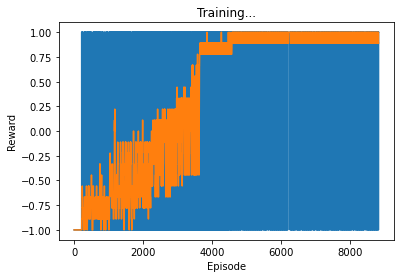

In [121]:
ep2_rewards = []
policy_net.train()
dqnloc_count = [0 for i in range(em2.env.obs_space.nvec[3] * len(em2.env.tx_locs))]
loc2_errors = [0.0 for i in range(em2.env.obs_space.nvec[3] * len(em2.env.tx_locs))]
iter2_avg_error = []
iter2_errors = []

dqn2_epslen=[]
outer = tqdm.notebook.tqdm(total=episodes, desc='training loop: ', position=0)

train_steps = 0
for episode in range(episodes):
    
    #if ((episode+1) > 4100):    
    #    obs = em.test_reset(np.array([[-100,-100,0]]), test_txbdir, em.env.sc_xyz, ch_randvals[episode*(em.env.goal_steps+1)])
    #    test_txbdir = (test_txbdir + 1) % em.env.N_tx
    #else:
    #    #tx_loc_xndx, tx_loc_yndx, tx_dir_ndx =em.env.obs_space.sample()
    tx_num, tx_dir_ndx = obs_list[episode]
    
    #policy_net.eval()
    #with torch.no_grad():
    #    action_probs = policy_net(obs).detach().data.cpu().numpy()[0]  
    #policy_net.train()
    #actions= np.argsort(action_probs)[::-1]
    
    obs = em2.reset(tx_num, tx_dir_ndx, ch_randvals[episode], dqnloc_count[tx_num * em2.env.obs_space.nvec[3] + tx_dir_ndx]+1)
    tx_num = em2.env.get_txloc_ndx(em2.env.tx_loc)
    dqnloc_count[tx_num * em2.env.obs_space.nvec[3] + tx_dir_ndx] +=1
    #obs = em.test_reset(np.array([[em.env.rx_xcov[tx_loc_xndx],em.env.rx_ycov[tx_loc_yndx], 0]]), tx_dir_ndx, em.env.sc_xyz, ch_randvals[episode*(em.env.goal_steps+1)])
    #dqnloc_maxexhselections[(tx_loc_xndx*len(em.env.rx_ycov)+tx_loc_yndx)*available_actions+tx_dir_ndx]+=1
    
    ep_loss = 0.0
    ep_rwd = 0.0
    timestep = 0
    tx_dirs = []
    rx_dirs = [-1.0 for x in range(em2.env.action_space.n)]
    data_rates =[np.inf for x in range(em2.env.action_space.n)]
    rssi_vals =[np.complex(1,0) for x in range(em2.env.action_space.n)]
    rwd_vals =[-2.0 for x in range(em2.env.action_space.n)]
    #agent.current_step +=1
    train_steps +=1
    eps = strategy.get_exploration_rate(train_steps)
    done = False
    while True:
        tx_dirs.append(em2.env.tx_bdir[0]*180/np.pi)
        #rx_dirs.append(em.env.rx_bdir[0]*180/np.pi)
        #data_rates.append(em.env.rate)
        #print(em.env.rbdir_ndx)
        if(em2.env.rbdir_ndx >= 0):
            rx_dirs[em2.env.rbdir_ndx] = em2.env.rx_bdir[0]*180/np.pi
            data_rates[em2.env.rbdir_ndx] = em2.env.rate
            rssi_vals[em2.env.rbdir_ndx] = em2.env.rssi_val

        action = agent.act(obs, policy_net, eps)
        next_obs, reward, done, _ = em2.step(action)#,ch_randvals[episode*(em.env.goal_steps+1)+timestep+1])
        #agent.step(obs, action, reward, next_obs, done)
        rwd_vals[em2.env.rbdir_ndx] = reward.item()
        ep_rwd += reward.item()
        
        '''
        if(np.all(em.env.tx_loc == np.array([[100,100,0]]))):
            print("ch_model: {}, sc_xyz: {}, min_exh_rate: {}, max_exh_rate: {}, min_action_ndx: {}, max_action_ndx: {}".format(em.env.ch_model, em.env.sc_xyz, min_exh_rate, max_exh_rate, min_action_ndx, max_action_ndx))
        '''   
        memory.add(obs, action, reward, next_obs, done)
        obs = next_obs
        
        ep2_rewards.append(reward.item())
        exh_rate = loc_SNRexh[tx_num * em2.env.obs_space.nvec[3] + em2.env.txdir_ndx]
        if data_rates[em2.env.rbdir_ndx] == np.inf:
            dqn_rate = 0.0
            #dqn_rssi = loc_minSNRexh[tx_num * em2.env.obs_space.nvec[3] + em2.env.txdir_ndx]#np.complex(1,0)
        else:
            dqn_rate = data_rates[em2.env.rbdir_ndx]#max(data_rates)
            #dqn_rssi = rssi_vals[em2.env.rbdir_ndx]
        #SNR_exh = Es * loc_SNRexh[tx_num * em.env.obs_space.nvec[3] + em.env.txdir_ndx]#np.abs(max_rssi_val) ** 2 / (em.env.N0 * em.env.B)
        #error = exh_rate-dqn_rate#np.abs(20*np.log10(np.abs(max_rssi_val))-20*np.log10(np.abs(rssi_val)))#max_exh_rate - dqn_rate
        #error = np.abs(20*np.log10(np.abs(exh_rssi))-20*np.log10(np.abs(dqn_rssi)))
        iter2_errors.append(dqn_rate)
        loc2_errors[tx_num * em2.env.obs_space.nvec[3] + em2.env.txdir_ndx] = dqn_rate
        iter2_avg_error.append(np.mean(loc2_errors))

        print("exh_rate: {}, dqn_rate: {}, iter_avg_error: {}".format(exh_rate, dqn_rate, np.mean(loc2_errors)))
        
        
        if memory.can_provide_sample():
            experiences = memory.sample()
            observations, actions, rewards, next_observations, dones = experiences
            weights, batch_indices = torch.tensor(np.ones_like(rewards.cpu().data.numpy())).to(device), None

            #print(states.shape, states.dtype)
            #print(actions.unsqueeze(-1).shape)
            current_q_values = policy_net(observations).gather(1,index=actions.unsqueeze(-1))#(1-ALPHA)*
            
            next_q_values = target_net(next_observations).detach().max(1)[0]
            target_q_values = ((next_q_values*GAMMA) + rewards)
            #print(policy_net(observations).type())
            #print(target_q_values.unsqueeze(1).type())
            #loss = F.mse_loss(current_q_values, target_q_values.unsqueeze(1).float())
            td_errors = ALPHA*(target_q_values.unsqueeze(1).float()-current_q_values)
            loss = F.mse_loss(torch.zeros(current_q_values.size()).to(device), ALPHA*(target_q_values.unsqueeze(1).float()-current_q_values),  reduction='sum')
            #weighted_loss = torch.mean(weights*loss)
            #print("loss: ", loss)
            #loss = ALPHA*loss
            #ep_loss += weighted_loss.item()
            #ep_loss = torch.mean(loss).detach().numpy()
            ep_loss = loss.item()
            
            optimizer.zero_grad()
            #weighted_loss.backward()
            #ep_loss.backward(torch.ones_like(ep_loss))
            loss.backward(torch.ones_like(loss))
            optimizer.step()
            
        timestep +=1
        if done:
            dqn2_epslen.append(len(tx_dirs))
            #data_rates.append(em.env.rate)
            data_rates[em2.env.rbdir_ndx] = em2.env.rate
            rssi_vals[em2.env.rbdir_ndx] = em2.env.rssi_val
            #ep_rewards.append(ep_rwd)
            moving_avg_rwd = get_moving_average(em2.env.obs_space.nvec[3]*len(em2.env.tx_locs), ep2_rewards)
            
            #print('\rEpisode {},\tScore: {:.2f}, eps: {}, moving avg_rwd: {}, ep_loss: {}'.format(episode+1, ep_rwd, eps, moving_avg_rwd[-1], ep_loss), end="\r")
            print('Episode {},\t Score: {:.2f}, eps: {}, moving avg_rwd: {}, ep_loss: {}'.format(episode+1, ep_rwd, eps, moving_avg_rwd[-1], ep_loss))
            #plot(episode_rewards, 100)
            #min_exh_rate, max_exh_rate,min_action_ndx,max_action_ndx= em.env.get_minmax_exhrate(ch_randvals[episode*(em.env.goal_steps+1):(episode+1)*(em.env.goal_steps+1)])
            
            #if(((episode+1) >= 6000) or (3000 <= (episode+1)<=3500)):
            #if((episode+1) > 4100):
                
            #    test_data_rates.append(np.mean(data_rates[1:]))
            #    test_eps_iters.append(timestep)
            #    test_minexh_rates.append(min_exh_rate)
            #    test_maxexh_rates.append(max_exh_rate)
                
                #if (timestep > 3):
                #    if(timestep >=8):
                #        false_positives +=1
                #if (min_exh_rate == max_exh_rate):
             #   print("\ntest_eps: {0}, eps_rwd: {1}".format(episode+1, ep_rwd))
            #print("TX loc: {}".format(em2.env.tx_loc))
             #   print("SC_xyz: {}".format(em.env.sc_xyz))
 
            tx_num = em2.env.get_txloc_ndx(em2.env.tx_loc)
            exh_bdir_ndx = loc_exhbdir[tx_num * em2.env.obs_space.nvec[3] + em2.env.txdir_ndx]
            print("TX dirs: {}, episode length: {}".format(tx_dirs, len(tx_dirs)))
            print("RX dirs: {}".format(rx_dirs))
            best_action_ndx = em2.env.rbdir_ndx#data_rates.index(max(data_rates))
            print("dqn rx bdir: {}, exh bdir: {}".format(rx_dirs[best_action_ndx], em2.env.BeamSet[exh_bdir_ndx][0]*180/np.pi))
            print("data rates: ", data_rates)
            #print("rwd vals: ", rwd_vals)
 
            print("\n\n")
                            
            timestep = 0
            break
            
    for local_param, target_param in zip(policy_net.parameters(), target_net.parameters()):
        target_param.data.copy_(TAU*local_param.data + (1.0-TAU)*target_param.data)
    
    #Update the policy network
    #if episode % UPDATE_EVERY == 0:
    #    target_net.load_state_dict(policy_net.state_dict())
    
    # update tqdm bar
    outer.update(1)
    
#torch.save(policy_net.state_dict(), 'checkpoint.pth')

#timer.finish()
test_rewards = []
plot(ep2_rewards, em2.env.obs_space.nvec[3]*len(em2.env.tx_locs), test_rewards)


In [122]:
print("Average episode length: {}".format(np.mean(dqn2_epslen)))

Average episode length: 1.469


In [123]:
print(len(ep2_rewards))

8814


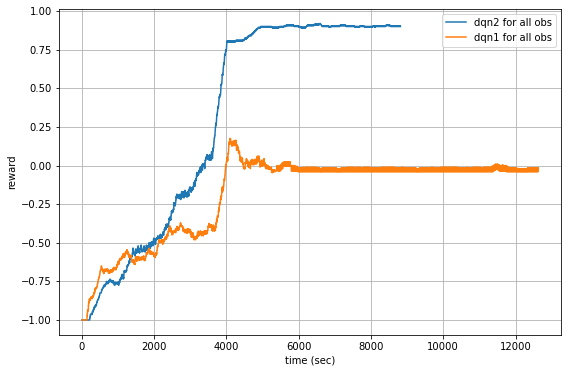

In [124]:
##### from Source.misc_fun.utils import *
fig = plt.figure(figsize=[9, 6])

#loc_ndx = 0
#tbdir_ndx = 3
context_ndx = 0*len(tx_dirs)+ 4#tbdir_ndx
#context_ndx2 = sel_ctxt_ndices[1]#1*len(tx_dirs)+ 4#tbdir_ndx
#context_ndx3 = sel_ctxt_ndices[2]#2*len(tx_dirs)+ 3#tbdir_ndx
#context_ndx4 = sel_ctxt_ndices[3]#3*len(tx_dirs)+ 3#tbdir_ndx
moving_avg_period = 200

#em.env.obs_space.nvec[3]*len(em.env.tx_locs)
dqn2_movingavg = get_moving_average(400, ep2_rewards)

dqn1_movingavg = get_moving_average(400, ep_rewards[:len(ep_rewards)])

plt.plot(np.arange(1,len(ep2_rewards)+1,1), dqn2_movingavg, np.arange(1,len(ep_rewards)+1,1), dqn1_movingavg)
#min_ndx=0
#max_ndx=500
#plt.plot(test_eps_iters[min_ndx:max_ndx])
plt.grid()
plt.legend(['dqn2 for all obs', 'dqn1 for all obs'])
plt.xlabel('time (sec)')
plt.ylabel('reward')
#plt.savefig("121020_cab_dqn_rwdplot_13.pdf")
plt.show()
#plt.savefig("071020_cab_dqn_rwdplot_2.pdf")

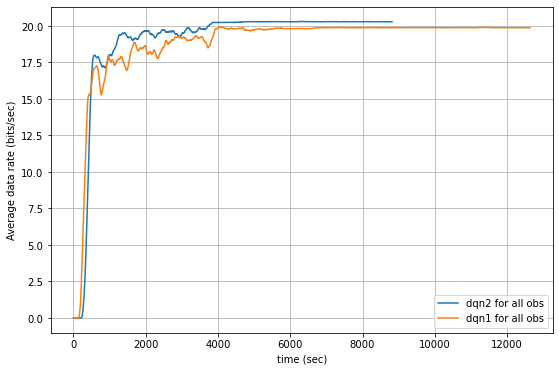

In [125]:
from Source.misc_fun.utils import *
fig = plt.figure(figsize=[9, 6])

#loc_ndx = 0
#tbdir_ndx = 3
context_ndx = 7#0*len(tx_dirs)+ 4#tbdir_ndx
#context_ndx2 = sel_ctxt_ndices[1]#1*len(tx_dirs)+ 4#tbdir_ndx
#context_ndx3 = sel_ctxt_ndices[2]#2*len(tx_dirs)+ 3#tbdir_ndx
#context_ndx4 = sel_ctxt_ndices[3]#3*len(tx_dirs)+ 3#tbdir_ndx
moving_avg_period = 200
#plt.plot(np.arange(1,len(cabenv_avgerrors[context_ndx])+1), cabenv_avgerrors[7], np.arange(1,len(iter_avg_error)+1),iter_avg_error)

dqn2_movingavg = get_moving_average(moving_avg_period, iter2_avg_error)

dqn1_movingavg = get_moving_average(moving_avg_period, iter_avg_error[:len(iter_avg_error)])

plt.plot(np.arange(1,len(iter2_avg_error)+1,1), dqn2_movingavg, np.arange(1,len(iter_avg_error)+1,1), dqn1_movingavg)
#min_ndx=0
#max_ndx=500
#plt.plot(test_eps_iters[min_ndx:max_ndx])
plt.grid()
plt.legend(['dqn2 for all obs', 'dqn1 for all obs'])
plt.xlabel('time (sec)')
plt.ylabel('Average data rate (bits/sec)')
#plt.savefig("121020_cab_dqn_erroplot_13.pdf")
plt.show()
#plt.savefig("071020_cab_dqn_erroplot_2.pdf")

### Simulation 3: Beam Alignment for CAB vs DQN without channel variation with 18 locations
- with beam refinement levels

In [130]:
#Assume LOS or NLOS throughout the environment. Do not change in between for now
from Source.nn_model_dqn import QNetwork
from Source.dqn_rcv_agent import Agent, DQN_ReplayBuffer, EpsilonGreedyStrategy
from Source.env_manager import EnvManager
from Source.misc_fun.utils import plot, get_moving_average, Generate_BeamDir, All_Exhaustive_RateMeas
from Source.PER import PrioritizedReplayBuffer

#Hyper-parameters
BUFFER_SIZE = int(1e5)      #replay buffer size
BATCH_SIZE = 64             #minibatch size
GAMMA = 0.999                #discount factor
ALPHA = 1.0                  #non-stationarity parameter
TAU = 1e-3                  #for soft update of target parameters
LR = 5e-4                   #learning rate
eps_start = 1.0
eps_end = 0.01
eps_decay = 0.9985 #125e-6
episodes = 6000 #3100 train, 500 test

test_episodes = 20
seed = 0                    #random seed number
episode_step_limit = 50
#%%
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

#Choose the environment
em3 = EnvManager(device, 'combrf-v7', seed)
em3.env.ant_arr = 'ula'
rx_xcov = np.array([100*np.cos(20*np.pi/180), 100*np.cos(40*np.pi/180), 100*np.cos(80*np.pi/180)])#np.array([-300,-100,100])
rx_ycov = np.array([100*np.sin(20*np.pi/180), 100*np.sin(40*np.pi/180), 100*np.sin(80*np.pi/180)])#np.array([-300,-100,100])
rx_zcov = np.array([51.5,71.5])
beam_param = 'beam-refine'
beam_paramvals = np.array([0,1])
em3.env.set_beamparameters(beam_param, beam_paramvals)
em3.env.set_coverage(rx_xcov,rx_ycov,rx_zcov)

available_actions = em3.num_actions_available()
random.seed(seed)
state_size = em3.state_size()
print(em3.env.ch_model)
print(em3.env.sc_xyz)

#Select the strategy
strategy = EpsilonGreedyStrategy(eps_start, eps_end, eps_decay, 4200)#episodes
#Initialize the agent
agent = Agent(strategy, state_size, available_actions, seed, device)

#Instantiate MemoryBuffer
#if not PRIORITIZED_REPLAY:
memory = DQN_ReplayBuffer(available_actions, BUFFER_SIZE, BATCH_SIZE, seed, device)
#else:
#    memory = PrioritizedReplayBuffer(available_actions, BUFFER_SIZE, BATCH_SIZE, PER_ALPHA,seed, device)

policy_net = QNetwork(state_size, available_actions, seed).to(device)
target_net = QNetwork(state_size, available_actions, seed).to(device)
print(policy_net)

#Initialize target_net weights to policy_net weights
target_net.load_state_dict(policy_net.state_dict())
target_net.eval() #Set the target_net in eval mode

#Select the optimizer
optimizer = optim.Adam(params=policy_net.parameters(), lr=LR)

uma-los
[]
QNetwork(
  (fc11): Linear(in_features=18, out_features=200, bias=True)
  (fc12): Linear(in_features=3, out_features=18, bias=True)
  (fc22): Linear(in_features=18, out_features=200, bias=True)
  (hidden_layers): ModuleList(
    (0): Linear(in_features=400, out_features=400, bias=True)
    (1): Linear(in_features=400, out_features=256, bias=True)
  )
  (softmax): Softmax(dim=1)
  (output): Linear(in_features=256, out_features=16, bias=True)
)


In [131]:
print(em3.env.BeamSet)
print(em3.env.action_space.n)

[0.39 0.59 0.2  0.79 0.98 1.18 1.37 1.57 1.77 1.96 2.16 2.36 2.55 2.75
 2.95 3.14]
16


In [132]:
from Source.misc_fun.conversion import *

#loc_SNRexh = [0.0 for i in range(em.env.obs_space.nvec[3] * len(em.env.tx_locs)) ]
loc_SNRexh = [0.0 for i in range(em3.env.obs_space.nvec[3] * len(em3.env.tx_locs)) ]
#loc_minSNRexh = [0.0 for i in range(em3.env.obs_space.nvec[3] * len(em3.env.tx_locs)) ]
loc_exhbdir = [0 for i in range(em3.env.obs_space.nvec[3] * len(em3.env.tx_locs)) ]
for loc_ndx in range(len(em3.env.tx_locs)):
    for tbdir_ndx in range(em3.env.obs_space.nvec[3]):
        min_exh_rate, max_exh_rate,min_action_ndx,max_action_ndx,min_rssi_val,max_rssi_val = em3.env.get_minmax_exhrate(loc_ndx, tbdir_ndx, ch_randvals[loc_ndx * em3.env.obs_space.nvec[3] + tbdir_ndx])
        #tx_num = em.env.get_txloc_ndx(em.env.tx_loc)
        #Es = db2lin(em.env.P_tx)
        #SNR_exh = Es * np.abs(max_rssi_val) ** 2 / (em.env.N0 * em.env.B)
        #SNR_exh = Es * np.abs(max_rssi_val) ** 2 / (em.env.N0 * em.env.B)
        #exh_rate = np.log2(1 + SNR_exh)
        #loc_minSNRexh[loc_ndx * em3.env.obs_space.nvec[3] + tbdir_ndx] = min_rssi_val
        loc_SNRexh[loc_ndx * em3.env.obs_space.nvec[3] + tbdir_ndx] = max_exh_rate#
        loc_exhbdir[loc_ndx * em3.env.obs_space.nvec[3] + tbdir_ndx] = max_action_ndx

In [133]:
locndx_list = list(range(len(em3.env.tx_locs)))
random_loc_ndices = random.sample(locndx_list, len(locndx_list))
txdir_list = list(range(em3.env.obs_space.nvec[3]))
txdir_ndices = random.sample(txdir_list, len(txdir_list))

obs_list = []
for eps in range(episodes):
    ndx = eps % (em3.env.obs_space.nvec[3] * len(em3.env.tx_locs))
    ndx1 = int(ndx / em3.env.obs_space.nvec[3])    
    ndx2 = int(ndx % em3.env.obs_space.nvec[3])
    obs_list.append((random_loc_ndices[ndx1],txdir_ndices[ndx2]))

In [134]:
print(len(em3.env.tx_locs))
print(em3.env.goal_steps)

18
16


Episode 1,	 Score: -16.00, eps: 0.9997171428571429, moving avg_rwd: -1.0, ep_loss: 0.0
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 16
RX dirs: [22.345354010102106, 33.804509912718565, 11.459155902616464, 45.26366581533504, -1.0, -1.0, 78.49521793292278, -1.0, 101.41352973815572, -1.0, 123.75888374825782, 135.21803965087426, -1.0, 157.5633936609764, 169.02254956359286, 179.90874767107852]
dqn rx bdir: -1.0, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2,	 Score: -16.00, eps: 0.9994342857142857, moving avg_rwd: -1.0, ep_loss: 0.0
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.34

Episode 12,	 Score: -16.00, eps: 0.9966057142857143, moving avg_rwd: -1.0, ep_loss: 97.18824768066406
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 16
RX dirs: [22.345354010102106, 33.804509912718565, 11.459155902616464, -1.0, 56.14986392282068, -1.0, 78.49521793292278, -1.0, -1.0, 112.29972784564136, 123.75888374825782, -1.0, 146.10423775835991, 157.5633936609764, 169.02254956359286, 179.90874767107852]
dqn rx bdir: 123.75888374825782, exh bdir: 56.14986392282068
data rates:  [inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 13,	 Score: -16.00, eps: 0.9963228571428572, moving avg_rwd: -1.0, ep_loss: 104.60211944580078
TX dirs: [22.345354010102106, 

Episode 24,	 Score: -16.00, eps: 0.9932114285714285, moving avg_rwd: -0.7777777910232544, ep_loss: 179.10462951660156
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 16
RX dirs: [-1.0, 33.804509912718565, -1.0, 45.26366581533504, 56.14986392282068, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, 123.75888374825782, 135.21803965087426, 146.10423775835991, 157.5633936609764, 169.02254956359286, 179.90874767107852]
dqn rx bdir: -1.0, exh bdir: 33.804509912718565
data rates:  [inf, 21.21686365535229, inf, 20.58792748050202, 11.659872567835382, inf, 15.755028609779798, 13.799575209235108, inf, inf, 15.66912392929576, 9.85520810380651, 17.01332885512375, 14.618569810497727, 15.571308462586886, 17.062711

Episode 35,	 Score: -9.00, eps: 0.9901, moving avg_rwd: -0.7777777910232544, ep_loss: 253.30792236328125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 11
RX dirs: [22.345354010102106, 33.804509912718565, 11.459155902616464, 45.26366581533504, -1.0, -1.0, 78.49521793292278, 89.95437383553926, 101.41352973815572, 112.29972784564136, -1.0, -1.0, -1.0, 157.5633936609764, -1.0, 179.90874767107852]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [13.793259962917968, 19.29197738909073, 14.834700218610191, 20.845978830362583, inf, inf, 7.79471380982519, 13.95131537315784, 14.823312969326123, 14.23571020007087, inf, inf, inf, 16.499045746403915, inf, 15.800823356897315]



Episode 36,	 Score: 1.00, eps: 0.9898171428571428, moving avg_rwd: -0.6666666865348816, ep_loss: 255.

Episode 44,	 Score: -14.00, eps: 0.9875542857142857, moving avg_rwd: -0.8888888955116272, ep_loss: 323.6204528808594
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 16
RX dirs: [-1.0, -1.0, 11.459155902616464, -1.0, 56.14986392282068, 67.60901982543713, 78.49521793292278, 89.95437383553926, -1.0, -1.0, 123.75888374825782, 135.21803965087426, 146.10423775835991, 157.5633936609764, 169.02254956359286, 179.90874767107852]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, 11.061916912405875, inf, 17.449797411680393, 20.599728839073677, 22.081829119384263, 12.62211844622259, inf, inf, 14.733190905299617, 14.58741741323737, 15.555916618715973, 15.906571965993338, 1

Episode 55,	 Score: 0.00, eps: 0.9844428571428572, moving avg_rwd: -0.5555555820465088, ep_loss: 395.8048095703125
TX dirs: [22.345354010102106, 22.345354010102106], episode length: 2
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, 112.29972784564136, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, inf, 20.819186652128383, inf, inf, 7.067235056378531, inf, inf, inf, inf, inf, inf]



Episode 56,	 Score: -13.00, eps: 0.98416, moving avg_rwd: -0.6666666865348816, ep_loss: 405.0703430175781
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 15
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, 56.14986392282

Episode 66,	 Score: -3.00, eps: 0.9813314285714285, moving avg_rwd: -0.7777777910232544, ep_loss: 467.35601806640625
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 5
RX dirs: [-1.0, -1.0, 11.459155902616464, 45.26366581533504, 56.14986392282068, -1.0, -1.0, 89.95437383553926, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 56.14986392282068, exh bdir: 56.14986392282068
data rates:  [inf, inf, 16.05184864238884, 19.542572197419453, 20.247338689082774, inf, inf, 14.85562319753444, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 67,	 Score: 0.00, eps: 0.9810485714285714, moving avg_rwd: -0.6666666865348816, ep_loss: 469.4679870605469
TX dirs: [22.345354010102106, 22.345354010102106], episode length: 2
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 157.5633936609764, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data

Episode 77,	 Score: -16.00, eps: 0.97822, moving avg_rwd: -1.0, ep_loss: 487.9206237792969
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 16
RX dirs: [22.345354010102106, 33.804509912718565, -1.0, 45.26366581533504, 56.14986392282068, 67.60901982543713, -1.0, 89.95437383553926, 101.41352973815572, 112.29972784564136, 123.75888374825782, 135.21803965087426, -1.0, -1.0, 169.02254956359286, -1.0]
dqn rx bdir: 22.345354010102106, exh bdir: 45.26366581533504
data rates:  [17.77791618143999, 20.414452598774066, inf, 20.95420384333025, 17.824434489505055, 16.8041140257895, inf, 9.401261524788469, 14.036871293585858, 15.10099825627167, 13.645891929759454, 14.299559304365788, inf, inf, 14.44792828938

Episode 87,	 Score: -16.00, eps: 0.9753914285714286, moving avg_rwd: -0.8888888955116272, ep_loss: 536.5508422851562
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 16
RX dirs: [22.345354010102106, 33.804509912718565, -1.0, -1.0, 56.14986392282068, 67.60901982543713, 78.49521793292278, -1.0, -1.0, 112.29972784564136, 123.75888374825782, 135.21803965087426, 146.10423775835991, 157.5633936609764, 169.02254956359286, 179.90874767107852]
dqn rx bdir: 123.75888374825782, exh bdir: 78.49521793292278
data rates:  [8.280150569567963, 15.135881923699115, inf, inf, 16.611405639125707, 15.948097787076449, 20.98026345539209, inf, inf, 14.183498206473335, 12.104784351304108, 15.107354748678308, 4.61632775

Episode 97,	 Score: -7.00, eps: 0.9725628571428572, moving avg_rwd: -0.7777777910232544, ep_loss: 580.9420776367188
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 9
RX dirs: [22.345354010102106, 33.804509912718565, 11.459155902616464, 45.26366581533504, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, 135.21803965087426, -1.0, -1.0, -1.0, 179.90874767107852]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [21.346388686387478, 21.45021842934527, 20.61045959974241, 19.046738992655317, inf, inf, 15.454754790307213, inf, inf, inf, inf, 16.50834016207986, inf, inf, inf, 20.18489017648965]



Episode 98,	 Score: -16.00, eps: 0.97228, moving avg_rwd: -0.8888888955116272, ep_loss: 587.419921875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 2

Episode 108,	 Score: -16.00, eps: 0.9694514285714286, moving avg_rwd: -0.8888888955116272, ep_loss: 601.736572265625
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 16
RX dirs: [22.345354010102106, 33.804509912718565, 11.459155902616464, 45.26366581533504, 56.14986392282068, 67.60901982543713, -1.0, -1.0, 101.41352973815572, -1.0, 123.75888374825782, 135.21803965087426, 146.10423775835991, -1.0, 169.02254956359286, 179.90874767107852]
dqn rx bdir: 22.345354010102106, exh bdir: 56.14986392282068
data rates:  [15.980646709346534, 9.315909645199214, 15.551816845905963, 18.887925952072703, 20.229194808891094, 16.448883614457912, inf, inf, 10.84622754026433, inf, 14.307621169261528, 12.09951498593

Episode 117,	 Score: -10.00, eps: 0.9669057142857143, moving avg_rwd: -0.8888888955116272, ep_loss: 656.7362670898438
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 12
RX dirs: [-1.0, 33.804509912718565, -1.0, 45.26366581533504, 56.14986392282068, 67.60901982543713, 78.49521793292278, -1.0, -1.0, 112.29972784564136, -1.0, 135.21803965087426, -1.0, 157.5633936609764, -1.0, 179.90874767107852]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, 14.677466584921987, inf, 13.934286165852171, 16.248637412741783, 14.709789697860934, 20.719262227399447, inf, inf, 13.373576348659446, inf, 14.901876727338495, inf, 14.427535414381175, inf, 14.694614143346712]



Episode 118,	 Score: -16.00, eps: 0.9666228571428571, moving avg_rwd: -0.8888888955116272, ep

Episode 128,	 Score: -16.00, eps: 0.9637942857142857, moving avg_rwd: -0.8888888955116272, ep_loss: 685.6420288085938
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 16
RX dirs: [-1.0, 33.804509912718565, 11.459155902616464, 45.26366581533504, -1.0, -1.0, 78.49521793292278, 89.95437383553926, 101.41352973815572, 112.29972784564136, 123.75888374825782, -1.0, 146.10423775835991, -1.0, 169.02254956359286, 179.90874767107852]
dqn rx bdir: 146.10423775835991, exh bdir: 78.49521793292278
data rates:  [inf, 15.6619483242452, 15.94891221499871, 17.810454845703923, inf, inf, 22.15566200117725, 16.869755272218896, 12.81368439543319, 16.74915500912549, 16.629271434508382, inf, 16.808790036013054, inf, 1

Episode 139,	 Score: -16.00, eps: 0.9606828571428572, moving avg_rwd: -0.8888888955116272, ep_loss: 719.3065795898438
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 16
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, 67.60901982543713, 78.49521793292278, 89.95437383553926, -1.0, 112.29972784564136, 123.75888374825782, 135.21803965087426, 146.10423775835991, -1.0, 169.02254956359286, 179.90874767107852]
dqn rx bdir: 89.95437383553926, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, 10.87007662962332, inf, 19.291710553268018, 21.80802433633745, 16.72041449910952, inf, 16.221701889900242, 11.933045122568224, 15.268745967621683, 13.964615467359089, inf, 14.639491822685157, 13.615272

Episode 149,	 Score: -16.00, eps: 0.9578542857142858, moving avg_rwd: -1.0, ep_loss: 751.3612060546875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 16
RX dirs: [-1.0, -1.0, 11.459155902616464, 45.26366581533504, 56.14986392282068, -1.0, -1.0, 89.95437383553926, 101.41352973815572, 112.29972784564136, -1.0, 135.21803965087426, -1.0, 157.5633936609764, 169.02254956359286, 179.90874767107852]
dqn rx bdir: -1.0, exh bdir: 45.26366581533504
data rates:  [inf, inf, 12.069269542512815, 20.95420384333025, 17.824434489505055, inf, 13.840901953798612, 9.401261524788469, 14.036871293585858, 15.10099825627167, inf, 14.299559304365788, inf, 16.663837541142566, 14.447928289380148, 11.590590419378568]




Episode 161,	 Score: -16.00, eps: 0.95446, moving avg_rwd: -0.8888888955116272, ep_loss: 681.4368286132812
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 16
RX dirs: [22.345354010102106, -1.0, 11.459155902616464, 45.26366581533504, 56.14986392282068, -1.0, 78.49521793292278, 89.95437383553926, -1.0, 112.29972784564136, -1.0, 135.21803965087426, 146.10423775835991, 157.5633936609764, -1.0, 179.90874767107852]
dqn rx bdir: 22.345354010102106, exh bdir: 45.26366581533504
data rates:  [13.793259962917968, inf, 14.834700218610191, 20.845978830362583, 19.258508321279717, inf, 7.79471380982519, 13.95131537315784, inf, 14.23571020007087, inf, 15.276791731217497, 12.543640815905663, 16.49904574640391

Episode 171,	 Score: -12.00, eps: 0.9516314285714286, moving avg_rwd: -0.7777777910232544, ep_loss: 686.4273071289062
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 14
RX dirs: [22.345354010102106, 33.804509912718565, 11.459155902616464, 45.26366581533504, -1.0, 67.60901982543713, 78.49521793292278, -1.0, 101.41352973815572, 112.29972784564136, 123.75888374825782, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [10.649018316004401, 14.677466584921987, 14.28939072633558, 13.934286165852171, inf, 14.709789697860934, 20.719262227399447, inf, 16.59727802545133, 13.373576348659446, 12.830173596119902, inf, inf, inf, inf, inf]



Episode 172,	 Score: -4.00, eps: 0.9513485714285714, 

Episode 181,	 Score: -13.00, eps: 0.9488028571428572, moving avg_rwd: -0.7777777910232544, ep_loss: 700.4620971679688
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 15
RX dirs: [22.345354010102106, -1.0, 11.459155902616464, -1.0, -1.0, 67.60901982543713, 78.49521793292278, 89.95437383553926, 101.41352973815572, -1.0, -1.0, 135.21803965087426, 146.10423775835991, 157.5633936609764, 169.02254956359286, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [16.95086972458447, inf, 18.10233564096949, inf, inf, 23.579692737208983, 20.819186652128383, 19.301169681140607, 17.55740034685986, inf, inf, 17.17126925324814, 16.070386001281886, 16.208790793993025, 17.956651037397656, inf]



Episode

Episode 194,	 Score: -9.00, eps: 0.9451257142857142, moving avg_rwd: -0.6666666865348816, ep_loss: 709.1703491210938
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 11
RX dirs: [22.345354010102106, 33.804509912718565, -1.0, -1.0, 56.14986392282068, 67.60901982543713, 78.49521793292278, 89.95437383553926, -1.0, -1.0, 123.75888374825782, -1.0, 146.10423775835991, 157.5633936609764, -1.0, 179.90874767107852]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [19.47159708653849, 20.612609298552222, inf, inf, 8.149938947684147, 15.5037167470836, 15.16715928155083, 13.422694637933239, inf, inf, 15.100148574473641, inf, 16.40680574760979, 13.44106423480104, inf, 16.76173125954751]



Episode 195,	 Score: -6.00, eps: 0.9448428571428571, moving avg_rwd: -0.7777777910232544, e

Episode 204,	 Score: -16.00, eps: 0.9422971428571428, moving avg_rwd: -0.8888888955116272, ep_loss: 738.5912475585938
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 16
RX dirs: [22.345354010102106, 33.804509912718565, 11.459155902616464, -1.0, 56.14986392282068, -1.0, 78.49521793292278, -1.0, 101.41352973815572, 112.29972784564136, 123.75888374825782, 135.21803965087426, -1.0, -1.0, 169.02254956359286, 179.90874767107852]
dqn rx bdir: 11.459155902616464, exh bdir: 33.804509912718565
data rates:  [19.981824379419862, 21.21686365535229, 18.160962448090157, inf, 11.659872567835382, inf, 15.755028609779798, inf, 6.271422178106838, 14.71324234311042, 15.66912392929576, 9.85520810380651, inf, inf,

Episode 214,	 Score: -16.00, eps: 0.9394685714285714, moving avg_rwd: -0.8888888955116272, ep_loss: 755.507568359375
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 16
RX dirs: [22.345354010102106, -1.0, 11.459155902616464, 45.26366581533504, 56.14986392282068, 67.60901982543713, 78.49521793292278, 89.95437383553926, 101.41352973815572, 112.29972784564136, 123.75888374825782, 135.21803965087426, -1.0, -1.0, 169.02254956359286, 179.90874767107852]
dqn rx bdir: 78.49521793292278, exh bdir: 22.345354010102106
data rates:  [21.034736368117564, inf, 20.659540881169193, 16.61020454937968, 16.78887274471984, 12.804330489936198, 13.33299610180816, 14.837555847908744, 15.014656825657031, 13.1030195828

Episode 223,	 Score: -14.00, eps: 0.9369228571428572, moving avg_rwd: -0.8888888955116272, ep_loss: 789.5372314453125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 16
RX dirs: [-1.0, 33.804509912718565, 11.459155902616464, 45.26366581533504, 56.14986392282068, 67.60901982543713, 78.49521793292278, -1.0, 101.41352973815572, 112.29972784564136, 123.75888374825782, -1.0, 146.10423775835991, 157.5633936609764, 169.02254956359286, -1.0]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 21.45021842934527, 20.61045959974241, 19.046738992655317, 16.77198193317867, 10.684715222295615, 15.454754790307213, inf, 14.791473885029244, 0.3216796180218955, 15.622424407550552, 

Episode 235,	 Score: -16.00, eps: 0.9335285714285715, moving avg_rwd: -0.8888888955116272, ep_loss: 798.0675048828125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 16
RX dirs: [22.345354010102106, -1.0, 11.459155902616464, 45.26366581533504, 56.14986392282068, 67.60901982543713, 78.49521793292278, 89.95437383553926, -1.0, 112.29972784564136, 123.75888374825782, 135.21803965087426, -1.0, 157.5633936609764, -1.0, 179.90874767107852]
dqn rx bdir: 135.21803965087426, exh bdir: 67.60901982543713
data rates:  [16.95086972458447, inf, 18.10233564096949, 19.143361742055895, 20.301075119167976, 23.579692737208983, 20.819186652128383, 19.301169681140607, inf, 7.067235056378531, 16.9050790325501, 17.1

Episode 247,	 Score: -9.00, eps: 0.9301342857142857, moving avg_rwd: -0.7777777910232544, ep_loss: 815.6572875976562
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 11
RX dirs: [22.345354010102106, 33.804509912718565, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, 89.95437383553926, 101.41352973815572, 112.29972784564136, 123.75888374825782, 135.21803965087426, 146.10423775835991, 157.5633936609764, 169.02254956359286, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [13.951091587417215, 16.366037645896697, inf, inf, inf, inf, 21.80802433633745, 16.72041449910952, 16.966604975310855, 16.221701889900242, 11.933045122568224, 15.268745967621683, 13.964615467359089, 15.85254911041147, 14.639491822685157, inf]



Episode 248,	 Score: -16.00, eps: 0.9298514285714286, mov

Episode 258,	 Score: -7.00, eps: 0.9270228571428571, moving avg_rwd: -0.6666666865348816, ep_loss: 829.1875610351562
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 9
RX dirs: [22.345354010102106, 33.804509912718565, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, 89.95437383553926, -1.0, 112.29972784564136, -1.0, -1.0, 146.10423775835991, 157.5633936609764, -1.0, 179.90874767107852]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [19.981824379419862, 21.21686365535229, inf, 20.58792748050202, inf, inf, inf, 13.799575209235108, inf, 14.71324234311042, inf, inf, 17.01332885512375, 14.618569810497727, inf, 17.06271179025056]



Episode 259,	 Score: -16.00, eps: 0.92674, moving avg_rwd: -0.8888888955116272, ep_loss: 836.7863159179688
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.34535

Episode 269,	 Score: -4.00, eps: 0.9239114285714286, moving avg_rwd: -0.6666666865348816, ep_loss: 838.555419921875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 6
RX dirs: [22.345354010102106, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, 89.95437383553926, -1.0, 112.29972784564136, -1.0, 135.21803965087426, -1.0, -1.0, -1.0, 179.90874767107852]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [13.793259962917968, inf, inf, 20.845978830362583, inf, inf, inf, 13.95131537315784, inf, 14.23571020007087, inf, 15.276791731217497, inf, inf, inf, 15.800823356897315]



Episode 270,	 Score: -3.00, eps: 0.9236285714285715, moving avg_rwd: -0.5555555820465088, ep_loss: 836.1508178710938
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 5
RX dirs: [-1.0, -1.0, -1.0, -1.0, 56.14986392282068, 67.

Episode 280,	 Score: -2.00, eps: 0.9208, moving avg_rwd: -0.5555555820465088, ep_loss: 861.9417114257812
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 4
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 179.90874767107852]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 19.81523921376306, inf, 12.845554986924212, inf, inf, inf, inf, inf, inf, inf, inf, inf, 15.72039376260866]



Episode 281,	 Score: 1.00, eps: 0.9205171428571428, moving avg_rwd: -0.5555555820465088, ep_loss: 863.4439697265625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.22959349000815, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf

Episode 293,	 Score: -16.00, eps: 0.9171228571428571, moving avg_rwd: -0.8888888955116272, ep_loss: 889.1171875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 16
RX dirs: [22.345354010102106, -1.0, 11.459155902616464, 45.26366581533504, 56.14986392282068, -1.0, -1.0, 89.95437383553926, -1.0, 112.29972784564136, 123.75888374825782, 135.21803965087426, 146.10423775835991, -1.0, -1.0, -1.0]
dqn rx bdir: 22.345354010102106, exh bdir: 45.26366581533504
data rates:  [17.77791618143999, inf, 12.069269542512815, 20.95420384333025, 17.824434489505055, inf, inf, 9.401261524788469, inf, 15.10099825627167, 13.645891929759454, 14.299559304365788, 15.677225491445848, inf, inf, inf]



Episode 294,	 Score:

Episode 303,	 Score: -6.00, eps: 0.9142942857142857, moving avg_rwd: -0.8888888955116272, ep_loss: 841.9945678710938
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 8
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, 56.14986392282068, 67.60901982543713, 78.49521793292278, -1.0, 101.41352973815572, -1.0, -1.0, -1.0, 146.10423775835991, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, 13.512680064004687, 16.611405639125707, 15.948097787076449, 20.98026345539209, inf, 16.79544685782574, inf, inf, inf, 4.616327752703904, inf, inf, inf]



Episode 304,	 Score: -5.00, eps: 0.9140114285714286, moving avg_rwd: -0.7777777910232544, ep_loss: 838.8338012695312
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.34535401010210

Episode 314,	 Score: -2.00, eps: 0.9111828571428572, moving avg_rwd: -0.8888888955116272, ep_loss: 858.721923828125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 4
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, 101.41352973815572, -1.0, -1.0, -1.0, -1.0, 157.5633936609764, -1.0, 179.90874767107852]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.081829119384263, inf, 16.417433133936143, inf, inf, inf, inf, 15.906571965993338, inf, 9.68876272068378]



Episode 315,	 Score: -3.00, eps: 0.9109, moving avg_rwd: -0.7777777910232544, ep_loss: 858.2300415039062
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 5
RX dirs: [-1.0, -1.0, -1.0, -1.0, 56.14986392282068, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, 146.10423775835991, 157.5633936609764, -1.0, 179.908747671

Episode 327,	 Score: -11.00, eps: 0.9075057142857142, moving avg_rwd: -0.6666666865348816, ep_loss: 873.360595703125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 13
RX dirs: [-1.0, 33.804509912718565, 11.459155902616464, -1.0, -1.0, 67.60901982543713, 78.49521793292278, -1.0, 101.41352973815572, 112.29972784564136, 123.75888374825782, 135.21803965087426, -1.0, 157.5633936609764, 169.02254956359286, -1.0]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 20.818868370043994, 19.498584505772918, inf, inf, 12.998107178535038, 15.127604352780706, inf, 13.326396678152815, 10.808210530810397, 15.237841402101807, 15.138966201934643, inf, 14.691801154626567, 18.35410591696001, inf]



Episode 328,	 Score: -12.00, eps: 0.907222

Episode 338,	 Score: -16.00, eps: 0.9043942857142857, moving avg_rwd: -0.7777777910232544, ep_loss: 888.1672973632812
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 16
RX dirs: [-1.0, 33.804509912718565, 11.459155902616464, -1.0, 56.14986392282068, -1.0, -1.0, -1.0, 101.41352973815572, 112.29972784564136, 123.75888374825782, -1.0, 146.10423775835991, 157.5633936609764, 169.02254956359286, 179.90874767107852]
dqn rx bdir: 123.75888374825782, exh bdir: 33.804509912718565
data rates:  [inf, 20.612609298552222, 17.76803029334144, inf, 8.149938947684147, inf, inf, inf, 3.797954544223604, 13.932343716823514, 15.100148574473641, inf, 16.40680574760979, 13.44106423480104, 15.443478332027139, 16.7617

Episode 349,	 Score: -16.00, eps: 0.9012828571428572, moving avg_rwd: -0.8888888955116272, ep_loss: 894.9418334960938
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 16
RX dirs: [22.345354010102106, 33.804509912718565, 11.459155902616464, -1.0, 56.14986392282068, 67.60901982543713, -1.0, -1.0, 101.41352973815572, -1.0, 123.75888374825782, 135.21803965087426, 146.10423775835991, -1.0, 169.02254956359286, -1.0]
dqn rx bdir: 169.02254956359286, exh bdir: 33.804509912718565
data rates:  [21.346388686387478, 21.45021842934527, 20.61045959974241, inf, 16.77198193317867, 10.684715222295615, inf, inf, 14.791473885029244, inf, 15.622424407550552, 16.50834016207986, 16.2828714016109, inf, 19.6954175918

Episode 359,	 Score: -1.00, eps: 0.8984542857142858, moving avg_rwd: -0.6666666865348816, ep_loss: 876.3636474609375
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 3
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 123.75888374825782, -1.0, -1.0, -1.0, 169.02254956359286, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.845978830362583, inf, inf, inf, inf, inf, inf, 0.63790352910767, inf, inf, inf, 16.282558910194275, inf]



Episode 360,	 Score: -3.00, eps: 0.8981714285714286, moving avg_rwd: -0.5555555820465088, ep_loss: 875.308349609375
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 5
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, 56.14986392282068, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 169.02254956359286, -1.0]
dqn rx bdir: 56.14986392282068, exh bdir: 

Episode 371,	 Score: -10.00, eps: 0.89506, moving avg_rwd: -0.7777777910232544, ep_loss: 894.0233154296875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 12
RX dirs: [-1.0, 33.804509912718565, -1.0, 45.26366581533504, 56.14986392282068, 67.60901982543713, 78.49521793292278, -1.0, 101.41352973815572, 112.29972784564136, 123.75888374825782, -1.0, 146.10423775835991, 157.5633936609764, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, 20.16409851594689, inf, 20.22959349000815, 15.875651409520582, 16.132457958135753, 14.317267956780217, inf, 12.269572421004977, 14.501378806624038, 14.128694869598313, inf, 15.78116006736517, 15.651071345317522, inf, inf]



Episode 372,	 Score: -5.00, eps: 0.8947771428571428, moving avg_rwd: -0.777777

Episode 383,	 Score: -3.00, eps: 0.8916657142857143, moving avg_rwd: -0.5555555820465088, ep_loss: 917.440185546875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 5
RX dirs: [-1.0, -1.0, 11.459155902616464, 45.26366581533504, -1.0, -1.0, 78.49521793292278, -1.0, 101.41352973815572, 112.29972784564136, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, 12.069269542512815, 20.95420384333025, inf, inf, 13.840901953798612, inf, 14.036871293585858, 15.10099825627167, inf, inf, inf, inf, inf, inf]



Episode 384,	 Score: -16.00, eps: 0.8913828571428571, moving avg_rwd: -0.8888888955116272, ep_loss: 917.7887573242188
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.

Episode 394,	 Score: -4.00, eps: 0.8885542857142857, moving avg_rwd: -0.7777777910232544, ep_loss: 928.6840209960938
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 6
RX dirs: [22.345354010102106, 33.804509912718565, -1.0, -1.0, -1.0, -1.0, -1.0, 89.95437383553926, 101.41352973815572, -1.0, 123.75888374825782, -1.0, 146.10423775835991, -1.0, -1.0, -1.0]
dqn rx bdir: 22.345354010102106, exh bdir: 22.345354010102106
data rates:  [21.034736368117564, 20.592199967920195, inf, inf, inf, inf, inf, 14.837555847908744, 15.014656825657031, inf, 13.510581067417235, inf, 12.138328582912497, inf, inf, inf]



Episode 395,	 Score: -5.00, eps: 0.8882714285714286, moving avg_rwd: -0.6666666865348816, ep_loss: 931.603759765625
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 7
RX dirs: [-

Episode 405,	 Score: -3.00, eps: 0.8854428571428572, moving avg_rwd: -0.5555555820465088, ep_loss: 945.440185546875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 5
RX dirs: [22.345354010102106, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, 123.75888374825782, -1.0, 146.10423775835991, -1.0, 169.02254956359286, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [10.649018316004401, inf, inf, inf, inf, inf, 20.719262227399447, inf, inf, inf, 12.830173596119902, inf, 9.499633448219212, inf, 14.875962469705843, inf]



Episode 406,	 Score: -10.00, eps: 0.88516, moving avg_rwd: -0.6666666865348816, ep_loss: 949.3765869140625
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010

Episode 417,	 Score: 0.00, eps: 0.8820485714285714, moving avg_rwd: -0.5555555820465088, ep_loss: 966.4896240234375
TX dirs: [22.345354010102106, 22.345354010102106], episode length: 2
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 179.90874767107852]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 20.818868370043994, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, 18.968085734820253]



Episode 418,	 Score: -16.00, eps: 0.8817657142857143, moving avg_rwd: -0.8888888955116272, ep_loss: 970.72705078125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 16
RX dirs: [22.3453540101021

Episode 430,	 Score: -1.00, eps: 0.8783714285714286, moving avg_rwd: -0.5555555820465088, ep_loss: 983.8485717773438
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 3
RX dirs: [22.345354010102106, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, 89.95437383553926, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.345354010102106, exh bdir: 22.345354010102106
data rates:  [21.034736368117564, inf, inf, 16.61020454937968, inf, inf, inf, 14.837555847908744, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 431,	 Score: -16.00, eps: 0.8780885714285714, moving avg_rwd: -0.8888888955116272, ep_loss: 985.2498168945312
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.34535401010210

Episode 441,	 Score: 1.00, eps: 0.87526, moving avg_rwd: -0.7777777910232544, ep_loss: 1000.051513671875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 20.719262227399447, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 442,	 Score: -10.00, eps: 0.8749771428571429, moving avg_rwd: -0.6666666865348816, ep_loss: 1004.9471435546875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 12
RX dirs: [22.345354010102106, -1.0, -1.0, 45.26366581533504, 56.14986392282068, 67.60901982543713, -1.0, 89.95437383553926, -1.0, -1.0, -1.0, 135.21803965087426, -1.0

Episode 452,	 Score: 0.00, eps: 0.8721485714285715, moving avg_rwd: -0.6666666865348816, ep_loss: 1020.9461669921875
TX dirs: [22.345354010102106, 22.345354010102106], episode length: 2
RX dirs: [-1.0, -1.0, -1.0, -1.0, 56.14986392282068, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, 15.17434135329, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 453,	 Score: -6.00, eps: 0.8718657142857142, moving avg_rwd: -0.6666666865348816, ep_loss: 1023.1954956054688
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 8
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, 56.14986392282068, 67.60901982543713, 78.49521793292278, -1.0, -1.0, 112.29972784564136, -1.0, 135.21803965087426, -1.0, -1.0, -1.0, -1.0]
dqn rx

Episode 464,	 Score: -14.00, eps: 0.8687542857142857, moving avg_rwd: -0.7777777910232544, ep_loss: 1044.8736572265625
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 16
RX dirs: [22.345354010102106, 33.804509912718565, -1.0, 45.26366581533504, -1.0, -1.0, 78.49521793292278, 89.95437383553926, 101.41352973815572, -1.0, 123.75888374825782, 135.21803965087426, 146.10423775835991, 157.5633936609764, -1.0, 179.90874767107852]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [19.47159708653849, 20.612609298552222, inf, 19.874850834541924, inf, inf, 15.16715928155083, 13.422694637933239, 3.797954544223604, inf, 15.100148574473641, 10.636198722618655, 16.40680574760979, 13.

Episode 476,	 Score: 1.00, eps: 0.86536, moving avg_rwd: -0.6666666865348816, ep_loss: 1077.4923095703125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.081829119384263, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 477,	 Score: -7.00, eps: 0.8650771428571429, moving avg_rwd: -0.5555555820465088, ep_loss: 1079.9913330078125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 9
RX dirs: [22.345354010102106, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, 112.29972784564136, 123.75888374825782, -1.0, 146.10423775835991, 157.5633936609764, 169.02254956359286, -1.0]
dqn rx bdir:

Episode 489,	 Score: -16.00, eps: 0.8616828571428572, moving avg_rwd: -0.8888888955116272, ep_loss: 1104.4404296875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 16
RX dirs: [-1.0, 33.804509912718565, -1.0, 45.26366581533504, -1.0, 67.60901982543713, 78.49521793292278, 89.95437383553926, 101.41352973815572, 112.29972784564136, 123.75888374825782, -1.0, -1.0, 157.5633936609764, 169.02254956359286, -1.0]
dqn rx bdir: -1.0, exh bdir: 33.804509912718565
data rates:  [inf, 20.818868370043994, inf, 18.958876364314595, inf, 12.998107178535038, 15.127604352780706, 14.801734817688518, 13.326396678152815, 10.808210530810397, 15.237841402101807, 15.138966201934643, inf, 14.691801154626567, 18.35410591

Episode 500,	 Score: -6.00, eps: 0.8585714285714285, moving avg_rwd: -0.6666666865348816, ep_loss: 1115.955078125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 8
RX dirs: [-1.0, 33.804509912718565, -1.0, 45.26366581533504, -1.0, -1.0, 78.49521793292278, 89.95437383553926, 101.41352973815572, -1.0, 123.75888374825782, -1.0, 146.10423775835991, -1.0, -1.0, -1.0]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 20.612609298552222, inf, 19.874850834541924, inf, inf, 15.16715928155083, 13.422694637933239, 3.797954544223604, inf, 15.100148574473641, inf, 16.40680574760979, inf, inf, inf]



Episode 501,	 Score: -6.00, eps: 0.8582885714285715, moving avg_rwd: -0.6666666865348816, ep_loss: 1115.3690185546875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.3453

Episode 510,	 Score: -2.00, eps: 0.8557428571428571, moving avg_rwd: -0.8888888955116272, ep_loss: 1122.82421875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 4
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, 56.14986392282068, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, 146.10423775835991, -1.0, -1.0, -1.0]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 21.21686365535229, inf, inf, 11.659872567835382, inf, 15.755028609779798, inf, inf, inf, inf, inf, 17.01332885512375, inf, inf, inf]



Episode 511,	 Score: -5.00, eps: 0.85546, moving avg_rwd: -0.7777777910232544, ep_loss: 1129.4395751953125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 7
RX dirs: [22.345354010102106, 33.804509912718565, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, 112.29972784564136, 

Episode 522,	 Score: -3.00, eps: 0.8523485714285715, moving avg_rwd: -0.8888888955116272, ep_loss: 1135.27099609375
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 5
RX dirs: [-1.0, -1.0, 11.459155902616464, -1.0, 56.14986392282068, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, 123.75888374825782, -1.0, -1.0, 157.5633936609764, -1.0, -1.0]
dqn rx bdir: 56.14986392282068, exh bdir: 56.14986392282068
data rates:  [inf, inf, 15.551816845905963, inf, 20.229194808891094, 16.448883614457912, inf, inf, inf, inf, 14.307621169261528, inf, inf, 0.8960966366332658, inf, inf]



Episode 523,	 Score: -8.00, eps: 0.8520657142857143, moving avg_rwd: -0.7777777910232544, ep_loss: 1150.4129638671875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 10
RX

Episode 533,	 Score: -5.00, eps: 0.8492371428571428, moving avg_rwd: -0.8888888955116272, ep_loss: 1162.217529296875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 7
RX dirs: [22.345354010102106, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, 101.41352973815572, 112.29972784564136, -1.0, -1.0, -1.0, -1.0, -1.0, 179.90874767107852]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [18.20474458389196, inf, inf, 20.22959349000815, inf, inf, inf, inf, 12.269572421004977, 14.501378806624038, inf, inf, inf, inf, inf, 12.428451183890454]



Episode 534,	 Score: 1.00, eps: 0.8489542857142858, moving avg_rwd: -0.7777777910232544, ep_loss: 1162.008544921875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, 56.14986392282068, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 56.149863922

Episode 545,	 Score: -16.00, eps: 0.8458428571428571, moving avg_rwd: -1.0, ep_loss: 1099.4788818359375
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 16
RX dirs: [-1.0, 33.804509912718565, 11.459155902616464, 45.26366581533504, -1.0, 67.60901982543713, 78.49521793292278, 89.95437383553926, 101.41352973815572, 112.29972784564136, -1.0, 135.21803965087426, 146.10423775835991, 157.5633936609764, 169.02254956359286, -1.0]
dqn rx bdir: 169.02254956359286, exh bdir: 45.26366581533504
data rates:  [inf, 20.414452598774066, 12.069269542512815, 20.95420384333025, inf, 16.8041140257895, 13.840901953798612, 9.401261524788469, 14.036871293585858, 15.10099825627167, inf, 14.299559304365788, 15.677225491

Episode 556,	 Score: -4.00, eps: 0.8427314285714286, moving avg_rwd: -0.6666666865348816, ep_loss: 1070.126708984375
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 6
RX dirs: [22.345354010102106, -1.0, 11.459155902616464, -1.0, -1.0, -1.0, 78.49521793292278, 89.95437383553926, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.345354010102106, exh bdir: 22.345354010102106
data rates:  [21.034736368117564, inf, 20.659540881169193, inf, inf, inf, 13.33299610180816, 14.837555847908744, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 557,	 Score: -16.00, eps: 0.8424485714285714, moving avg_rwd: -0.8888888955116272, ep_loss: 1071.694580078125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.34535

Episode 569,	 Score: -8.00, eps: 0.8390542857142858, moving avg_rwd: -0.8888888955116272, ep_loss: 1095.03857421875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 10
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, 56.14986392282068, 67.60901982543713, 78.49521793292278, -1.0, -1.0, 112.29972784564136, 123.75888374825782, -1.0, -1.0, 157.5633936609764, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.22959349000815, 15.875651409520582, 16.132457958135753, 14.317267956780217, inf, inf, 14.501378806624038, 14.128694869598313, inf, inf, 15.651071345317522, inf, inf]



Episode 570,	 Score: -5.00, eps: 0.8387714285714286, moving avg_rwd: -0.7777777910232544, ep_loss: 1094.5301513671875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345

Episode 580,	 Score: -16.00, eps: 0.8359428571428571, moving avg_rwd: -1.0, ep_loss: 1106.6856689453125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 16
RX dirs: [22.345354010102106, 33.804509912718565, 11.459155902616464, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 123.75888374825782, 135.21803965087426, -1.0, -1.0, 169.02254956359286, 179.90874767107852]
dqn rx bdir: 11.459155902616464, exh bdir: 45.26366581533504
data rates:  [7.184015751269767, 18.074185297982044, 14.967157133321624, 20.07361694828404, inf, inf, inf, inf, inf, inf, 9.79579315392074, 14.660956945934899, inf, inf, 15.791223916542327, 15.530062478915534]



Episode 581,	 Score: -4.00, eps: 0.83566, moving avg_rw

Episode 592,	 Score: 0.00, eps: 0.8325485714285714, moving avg_rwd: -0.7777777910232544, ep_loss: 1133.0782470703125
TX dirs: [22.345354010102106, 22.345354010102106], episode length: 2
RX dirs: [22.345354010102106, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.345354010102106, exh bdir: 22.345354010102106
data rates:  [21.034736368117564, inf, inf, inf, inf, inf, 13.33299610180816, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 593,	 Score: -12.00, eps: 0.8322657142857143, moving avg_rwd: -0.6666666865348816, ep_loss: 1138.5211181640625
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 14
RX dirs: [-1.0, 33.804509912718565, 11.459155902616464, 45.26366

Episode 604,	 Score: -4.00, eps: 0.8291542857142857, moving avg_rwd: -0.5555555820465088, ep_loss: 1170.640869140625
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 6
RX dirs: [-1.0, 33.804509912718565, -1.0, 45.26366581533504, -1.0, 67.60901982543713, 78.49521793292278, 89.95437383553926, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 169.02254956359286, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, 17.04491911640701, inf, 19.81523921376306, inf, 12.845554986924212, 13.500214027350863, 14.28674871593574, inf, inf, inf, inf, inf, inf, 15.751143972545837, inf]



Episode 605,	 Score: -6.00, eps: 0.8288714285714286, moving avg_rwd: -0.6666666865348816, ep_loss: 1173.8983154296875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length:

Episode 616,	 Score: 0.00, eps: 0.82576, moving avg_rwd: -0.4444444477558136, ep_loss: 1198.81884765625
TX dirs: [22.345354010102106, 22.345354010102106], episode length: 2
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, 14.727652754574207, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 617,	 Score: 1.00, eps: 0.8254771428571429, moving avg_rwd: -0.3333333432674408, ep_loss: 1202.6246337890625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 618,	 Score: -16.00, eps: 0.8251942857142858,

Episode 627,	 Score: -5.00, eps: 0.8226485714285714, moving avg_rwd: -0.6666666865348816, ep_loss: 1228.356201171875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 7
RX dirs: [-1.0, -1.0, 11.459155902616464, 45.26366581533504, -1.0, -1.0, 78.49521793292278, 89.95437383553926, 101.41352973815572, -1.0, -1.0, 135.21803965087426, 146.10423775835991, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, 14.17228833076169, 13.512680064004687, inf, inf, 20.98026345539209, 18.52537198353992, 16.79544685782574, inf, inf, 15.107354748678308, 4.616327752703904, inf, inf, inf]



Episode 628,	 Score: -4.00, eps: 0.8223657142857143, moving avg_rwd: -0.6666666865348816, ep_loss: 1229.860107421875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode 

Episode 640,	 Score: -13.00, eps: 0.8189714285714286, moving avg_rwd: -0.7777777910232544, ep_loss: 1270.778076171875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 15
RX dirs: [22.345354010102106, -1.0, 11.459155902616464, 45.26366581533504, -1.0, 67.60901982543713, -1.0, 89.95437383553926, -1.0, 112.29972784564136, 123.75888374825782, 135.21803965087426, 146.10423775835991, -1.0, -1.0, 179.90874767107852]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [12.761237043377482, inf, 15.495680994108879, 19.81523921376306, inf, 12.845554986924212, inf, 14.28674871593574, inf, 11.367843738322112, 12.127150787696626, 14.473715343805742, 10.405518966871309, inf, inf, 15.72039376260866]



Episo

Episode 651,	 Score: -16.00, eps: 0.81586, moving avg_rwd: -0.7777777910232544, ep_loss: 1298.6824951171875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 16
RX dirs: [-1.0, 33.804509912718565, 11.459155902616464, 45.26366581533504, -1.0, 67.60901982543713, 78.49521793292278, 89.95437383553926, 101.41352973815572, 112.29972784564136, 123.75888374825782, -1.0, 146.10423775835991, 157.5633936609764, -1.0, 179.90874767107852]
dqn rx bdir: 101.41352973815572, exh bdir: 33.804509912718565
data rates:  [inf, 20.818868370043994, 19.498584505772918, 18.958876364314595, inf, 12.998107178535038, 15.127604352780706, 14.801734817688518, 13.326396678152815, 10.808210530810397, 15.237841402101807, inf, 16

Episode 663,	 Score: -4.00, eps: 0.8124657142857143, moving avg_rwd: -0.8888888955116272, ep_loss: 1333.418212890625
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 6
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, 78.49521793292278, 89.95437383553926, -1.0, 112.29972784564136, 123.75888374825782, 135.21803965087426, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, 15.948097787076449, 20.98026345539209, 18.52537198353992, inf, 14.183498206473335, 12.104784351304108, 15.107354748678308, inf, inf, inf, inf]



Episode 664,	 Score: -4.00, eps: 0.8121828571428571, moving avg_rwd: -0.7777777910232544, ep_loss: 1334.1246337890625
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 6
RX dirs: [22.345354010102106, 33.80

Episode 675,	 Score: -7.00, eps: 0.8090714285714286, moving avg_rwd: -0.7777777910232544, ep_loss: 1357.322265625
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 9
RX dirs: [22.345354010102106, -1.0, 11.459155902616464, 45.26366581533504, 56.14986392282068, -1.0, 78.49521793292278, -1.0, 101.41352973815572, -1.0, -1.0, 135.21803965087426, -1.0, -1.0, -1.0, 179.90874767107852]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [10.649018316004401, inf, 14.28939072633558, 13.934286165852171, 16.248637412741783, inf, 20.719262227399447, inf, 16.59727802545133, inf, inf, 14.901876727338495, inf, inf, inf, 14.694614143346712]



Episode 676,	 Score: -16.00, eps: 0.8087885714285714, moving avg_rwd: -0.8888888955116272, ep_loss: 1377.2451171875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 2

Episode 687,	 Score: -7.00, eps: 0.8056771428571429, moving avg_rwd: -0.4444444477558136, ep_loss: 1366.71923828125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 9
RX dirs: [-1.0, 33.804509912718565, 11.459155902616464, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, 112.29972784564136, 123.75888374825782, -1.0, 146.10423775835991, 157.5633936609764, -1.0, 179.90874767107852]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 20.818868370043994, 19.498584505772918, 18.958876364314595, inf, inf, inf, inf, inf, 10.808210530810397, 15.237841402101807, inf, 16.15937008693014, 14.691801154626567, inf, 18.968085734820253]



Episode 688,	 Score: -16.00, eps: 0.8053942857142857, moving avg_rwd: -0.8888888955116272, ep_loss: 1368.4544677734375
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010

Episode 698,	 Score: -9.00, eps: 0.8025657142857143, moving avg_rwd: -0.6666666865348816, ep_loss: 1381.4676513671875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 11
RX dirs: [-1.0, 33.804509912718565, 11.459155902616464, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 123.75888374825782, 135.21803965087426, 146.10423775835991, 157.5633936609764, -1.0, -1.0]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 20.612609298552222, 17.76803029334144, 19.874850834541924, inf, inf, inf, inf, inf, inf, 15.100148574473641, 10.636198722618655, 16.40680574760979, 13.44106423480104, inf, inf]



Episode 699,	 Score: -6.00, eps: 0.8022828571428572, moving avg_rwd: -0.7777777910232544, ep_loss: 1381.5826416015625
TX dirs: [22.345354010102106, 22.345354010102106, 2

Episode 710,	 Score: 1.00, eps: 0.7991714285714285, moving avg_rwd: -0.7777777910232544, ep_loss: 1401.2320556640625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.081829119384263, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 711,	 Score: 1.00, eps: 0.7988885714285714, moving avg_rwd: -0.7777777910232544, ep_loss: 1401.9461669921875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 20.719262227399447, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 712,	 Score: -16.00, eps: 0.7986057142857143, moving avg_rwd: -0.7777777910232

Episode 722,	 Score: 1.00, eps: 0.7957771428571428, moving avg_rwd: -0.5555555820465088, ep_loss: 1419.7086181640625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 723,	 Score: -8.00, eps: 0.7954942857142857, moving avg_rwd: -0.5555555820465088, ep_loss: 1423.7315673828125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 10
RX dirs: [22.345354010102106, 33.804509912718565, 11.459155902616464, 45.26366581533504, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, 123.75888374825782, 135.21803965087426, -1.0, 157.56339366

Episode 732,	 Score: -2.00, eps: 0.7929485714285714, moving avg_rwd: -0.7777777910232544, ep_loss: 1438.132080078125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 4
RX dirs: [-1.0, -1.0, -1.0, -1.0, 56.14986392282068, -1.0, -1.0, 89.95437383553926, 101.41352973815572, -1.0, -1.0, -1.0, -1.0, -1.0, 169.02254956359286, -1.0]
dqn rx bdir: 56.14986392282068, exh bdir: 56.14986392282068
data rates:  [inf, inf, inf, inf, 20.247338689082774, inf, inf, 14.85562319753444, 12.926866731492629, inf, inf, inf, inf, inf, 15.379344657482308, inf]



Episode 733,	 Score: -7.00, eps: 0.7926657142857143, moving avg_rwd: -0.6666666865348816, ep_loss: 1438.62451171875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 9
RX dirs: [22.345354010102106, 33.804509912718565, -1.0, -1.0, 56.14986392

Episode 744,	 Score: -14.00, eps: 0.7895542857142858, moving avg_rwd: -0.8888888955116272, ep_loss: 1456.28515625
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 16
RX dirs: [22.345354010102106, 33.804509912718565, 11.459155902616464, 45.26366581533504, -1.0, 67.60901982543713, 78.49521793292278, -1.0, -1.0, 112.29972784564136, -1.0, -1.0, -1.0, 157.5633936609764, 169.02254956359286, 179.90874767107852]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [19.981824379419862, 21.21686365535229, 18.160962448090157, 20.58792748050202, inf, 16.283753058592648, 15.755028609779798, inf, inf, 14.71324234311042, inf, inf, inf, 14.618569810497727, 15.571308462586886, 17.06271179

Episode 754,	 Score: -4.00, eps: 0.7867257142857143, moving avg_rwd: -0.7777777910232544, ep_loss: 1467.3328857421875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 6
RX dirs: [22.345354010102106, 33.804509912718565, -1.0, 45.26366581533504, 56.14986392282068, -1.0, -1.0, -1.0, -1.0, 112.29972784564136, -1.0, -1.0, -1.0, 157.5633936609764, -1.0, -1.0]
dqn rx bdir: 22.345354010102106, exh bdir: 22.345354010102106
data rates:  [21.034736368117564, 20.592199967920195, inf, 16.61020454937968, 16.78887274471984, inf, inf, inf, inf, 13.10301958285043, inf, inf, inf, 18.51393852801615, inf, inf]



Episode 755,	 Score: 1.00, eps: 0.7864428571428571, moving avg_rwd: -0.6666666865348816, ep_loss: 1469.33447265625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26

Episode 768,	 Score: -1.00, eps: 0.7827657142857143, moving avg_rwd: -0.8888888955116272, ep_loss: 1491.88330078125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 3
RX dirs: [-1.0, -1.0, -1.0, -1.0, 56.14986392282068, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 157.5633936609764, -1.0, 179.90874767107852]
dqn rx bdir: 56.14986392282068, exh bdir: 56.14986392282068
data rates:  [inf, inf, inf, inf, 20.247338689082774, inf, inf, inf, inf, inf, inf, inf, inf, 12.10718056354083, inf, 15.789598703171544]



Episode 769,	 Score: -7.00, eps: 0.7824828571428571, moving avg_rwd: -0.7777777910232544, ep_loss: 1489.883544921875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 9
RX dirs: [-1.0, -1.0, 11.459155902616464, -1.0, -1.0, 67.60901982543713, 78.49521793292278, -1.0, -1.0, -1.0, 123.75888374

Episode 780,	 Score: -16.00, eps: 0.7793714285714286, moving avg_rwd: -1.0, ep_loss: 1490.1383056640625
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 16
RX dirs: [-1.0, 33.804509912718565, 11.459155902616464, 45.26366581533504, 56.14986392282068, 67.60901982543713, 78.49521793292278, 89.95437383553926, -1.0, -1.0, 123.75888374825782, 135.21803965087426, 146.10423775835991, 157.5633936609764, -1.0, -1.0]
dqn rx bdir: 89.95437383553926, exh bdir: 33.804509912718565
data rates:  [inf, 21.21686365535229, 18.160962448090157, 20.58792748050202, 11.659872567835382, 16.283753058592648, 15.755028609779798, 13.799575209235108, inf, inf, 15.66912392929576, 9.85520810380651, 17.01332885512375, 14.61856

Episode 791,	 Score: -3.00, eps: 0.7762600000000001, moving avg_rwd: -0.4444444477558136, ep_loss: 1485.351806640625
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 5
RX dirs: [-1.0, -1.0, 11.459155902616464, 45.26366581533504, -1.0, -1.0, 78.49521793292278, -1.0, 101.41352973815572, -1.0, -1.0, -1.0, -1.0, 157.5633936609764, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, 14.834700218610191, 20.845978830362583, inf, inf, 7.79471380982519, inf, 14.823312969326123, inf, inf, inf, inf, 16.499045746403915, inf, inf]



Episode 792,	 Score: -3.00, eps: 0.7759771428571429, moving avg_rwd: -0.3333333432674408, ep_loss: 1484.914306640625
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 5
RX dirs: [-1.0, -1.0, -1.0, -1.0, 56.14986392282068, -1.0, -1.0, 89.95437383553926, -1.0, -1.0, 123.75888

Episode 803,	 Score: 0.00, eps: 0.7728657142857143, moving avg_rwd: -0.8888888955116272, ep_loss: 1503.8775634765625
TX dirs: [22.345354010102106, 22.345354010102106], episode length: 2
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.22959349000815, inf, 16.132457958135753, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 804,	 Score: 0.00, eps: 0.7725828571428571, moving avg_rwd: -0.7777777910232544, ep_loss: 1503.902587890625
TX dirs: [22.345354010102106, 22.345354010102106], episode length: 2
RX dirs: [-1.0, -1.0, -1.0, -1.0, 56.14986392282068, -1.0, -1.0, 89.95437383553926, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 56.14986392282068, exh bdir: 56.14986392282068
data rates:  [inf, inf, inf, inf, 20.247338689082774, inf, inf, 14.85562319753444, inf, inf, inf, inf, inf, inf, inf, i

Episode 815,	 Score: -2.00, eps: 0.7694714285714286, moving avg_rwd: -0.8888888955116272, ep_loss: 1516.663818359375
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 4
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, 89.95437383553926, -1.0, 112.29972784564136, -1.0, -1.0, 146.10423775835991, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, 9.401261524788469, inf, 15.10099825627167, inf, inf, 15.677225491445848, inf, inf, inf]



Episode 816,	 Score: -16.00, eps: 0.7691885714285714, moving avg_rwd: -0.8888888955116272, ep_loss: 1519.4388427734375
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.34535401

Episode 826,	 Score: -4.00, eps: 0.76636, moving avg_rwd: -0.7777777910232544, ep_loss: 1528.5972900390625
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 6
RX dirs: [22.345354010102106, -1.0, 11.459155902616464, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, 135.21803965087426, -1.0, -1.0, -1.0, 179.90874767107852]
dqn rx bdir: 22.345354010102106, exh bdir: 22.345354010102106
data rates:  [21.034736368117564, inf, 20.659540881169193, inf, inf, inf, 13.33299610180816, inf, inf, inf, inf, 16.694414345011783, inf, inf, inf, 20.396366458385724]



Episode 827,	 Score: -16.00, eps: 0.7660771428571429, moving avg_rwd: -0.8888888955116272, ep_loss: 1525.9425048828125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.3453

Episode 838,	 Score: -6.00, eps: 0.7629657142857142, moving avg_rwd: -0.5555555820465088, ep_loss: 1536.2794189453125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 8
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, 56.14986392282068, 67.60901982543713, -1.0, -1.0, 101.41352973815572, -1.0, -1.0, -1.0, -1.0, -1.0, 169.02254956359286, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 19.81523921376306, 19.27866014090759, 12.845554986924212, inf, inf, 13.957343831642069, inf, inf, inf, inf, inf, 15.751143972545837, inf]



Episode 839,	 Score: -7.00, eps: 0.7626828571428572, moving avg_rwd: -0.6666666865348816, ep_loss: 1541.787109375
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345

Episode 850,	 Score: -2.00, eps: 0.7595714285714286, moving avg_rwd: -0.4444444477558136, ep_loss: 1557.57080078125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 4
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, 56.14986392282068, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 135.21803965087426, -1.0, 157.5633936609764, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, 18.938571092079982, inf, inf, inf, inf, inf, inf, 14.660956945934899, inf, 15.547473221976457, inf, inf]



Episode 851,	 Score: -16.00, eps: 0.7592885714285714, moving avg_rwd: -0.8888888955116272, ep_loss: 1564.597900390625
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010

Episode 861,	 Score: -6.00, eps: 0.75646, moving avg_rwd: -0.6666666865348816, ep_loss: 1582.83203125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 8
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, -1.0, 67.60901982543713, 78.49521793292278, -1.0, -1.0, 112.29972784564136, -1.0, 135.21803965087426, -1.0, -1.0, 169.02254956359286, 179.90874767107852]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, 15.135881923699115, inf, inf, inf, 15.948097787076449, 20.98026345539209, inf, inf, 14.183498206473335, inf, 15.107354748678308, inf, inf, 14.996077756275518, 14.716515682757649]



Episode 862,	 Score: -4.00, eps: 0.7561771428571429, moving avg_rwd: -0.6666666865348816, ep_loss: 1583.185546875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], e

Episode 872,	 Score: 1.00, eps: 0.7533485714285715, moving avg_rwd: -0.8888888955116272, ep_loss: 1604.7174072265625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.081829119384263, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 873,	 Score: -1.00, eps: 0.7530657142857143, moving avg_rwd: -0.7777777910232544, ep_loss: 1605.33349609375
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 3
RX dirs: [-1.0, -1.0, -1.0, -1.0, 56.14986392282068, -1.0, 78.49521793292278, -1.0, 101.41352973815572, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, 16.248637412741783, inf, 20.719262227399447, inf, 16.59727802545133, inf, inf, inf, inf, inf, inf,

Episode 885,	 Score: -16.00, eps: 0.7496714285714285, moving avg_rwd: -0.7777777910232544, ep_loss: 1626.68798828125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 16
RX dirs: [22.345354010102106, 33.804509912718565, 11.459155902616464, 45.26366581533504, -1.0, 67.60901982543713, 78.49521793292278, 89.95437383553926, 101.41352973815572, -1.0, 123.75888374825782, -1.0, 146.10423775835991, 157.5633936609764, 169.02254956359286, 179.90874767107852]
dqn rx bdir: -1.0, exh bdir: 33.804509912718565
data rates:  [20.443928960896006, 20.818868370043994, 19.498584505772918, 18.958876364314595, inf, 12.998107178535038, 15.127604352780706, 14.801734817688518, 13.326396678152815, inf, 15.237841402101807

Episode 896,	 Score: -1.00, eps: 0.74656, moving avg_rwd: -0.5555555820465088, ep_loss: 1657.032958984375
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 3
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, 56.14986392282068, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 157.5633936609764, -1.0, -1.0]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 20.612609298552222, inf, inf, 8.149938947684147, inf, inf, inf, inf, inf, inf, inf, inf, 13.44106423480104, inf, inf]



Episode 897,	 Score: 1.00, eps: 0.7462771428571429, moving avg_rwd: -0.4444444477558136, ep_loss: 1658.25390625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 20.98026345539209, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episod

Episode 908,	 Score: 1.00, eps: 0.7431657142857143, moving avg_rwd: -0.6666666865348816, ep_loss: 1670.88916015625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.081829119384263, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 909,	 Score: -1.00, eps: 0.7428828571428572, moving avg_rwd: -0.5555555820465088, ep_loss: 1671.413818359375
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 3
RX dirs: [22.345354010102106, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [10.649018316004401, inf, inf, 13.934286165852171, inf, inf, 20.719262227399447, inf, inf, inf, inf, inf, inf, inf, inf,

Episode 919,	 Score: -2.00, eps: 0.7400542857142858, moving avg_rwd: -0.6666666865348816, ep_loss: 1686.175048828125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 4
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 157.5633936609764, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, 16.777061965710747, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, 16.208790793993025, inf, inf]



Episode 920,	 Score: 1.00, eps: 0.7397714285714285, moving avg_rwd: -0.5555555820465088, ep_loss: 1686.2659912109375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf

Episode 931,	 Score: -7.00, eps: 0.73666, moving avg_rwd: -0.6666666865348816, ep_loss: 1707.136962890625
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 9
RX dirs: [-1.0, -1.0, 11.459155902616464, -1.0, -1.0, 67.60901982543713, 78.49521793292278, 89.95437383553926, 101.41352973815572, -1.0, -1.0, -1.0, 146.10423775835991, -1.0, -1.0, 179.90874767107852]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, 11.41881607533586, inf, inf, 19.291710553268018, 21.80802433633745, 16.72041449910952, 16.966604975310855, inf, inf, inf, 13.964615467359089, inf, inf, 13.615272085998654]



Episode 932,	 Score: -16.00, eps: 0.7363771428571428, moving avg_rwd: -0.8888888955116272, ep_loss: 1713.828857421875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.34535401010210

Episode 943,	 Score: -16.00, eps: 0.7332657142857143, moving avg_rwd: -1.0, ep_loss: 1722.2830810546875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 16
RX dirs: [22.345354010102106, 33.804509912718565, 11.459155902616464, -1.0, -1.0, 67.60901982543713, 78.49521793292278, 89.95437383553926, -1.0, 112.29972784564136, 123.75888374825782, 135.21803965087426, 146.10423775835991, 157.5633936609764, -1.0, 179.90874767107852]
dqn rx bdir: 157.5633936609764, exh bdir: 33.804509912718565
data rates:  [21.346388686387478, 21.45021842934527, 20.61045959974241, inf, inf, 10.684715222295615, 15.454754790307213, 15.624293921881613, inf, 0.3216796180218955, 15.622424407550552, 16.50834016207986, 16.282871

Episode 955,	 Score: -2.00, eps: 0.7298714285714285, moving avg_rwd: -0.6666666865348816, ep_loss: 1743.449951171875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 4
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, 135.21803965087426, -1.0, 157.5633936609764, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, 20.819186652128383, inf, inf, inf, inf, 17.17126925324814, inf, 16.208790793993025, inf, inf]



Episode 956,	 Score: 1.00, eps: 0.7295885714285715, moving avg_rwd: -0.5555555820465088, ep_loss: 1743.97802734375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.155662001

Episode 968,	 Score: -16.00, eps: 0.7261942857142858, moving avg_rwd: -0.8888888955116272, ep_loss: 1776.586181640625
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 16
RX dirs: [-1.0, 33.804509912718565, 11.459155902616464, 45.26366581533504, 56.14986392282068, 67.60901982543713, 78.49521793292278, -1.0, 101.41352973815572, 112.29972784564136, 123.75888374825782, 135.21803965087426, -1.0, 157.5633936609764, 169.02254956359286, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 33.804509912718565
data rates:  [inf, 20.612609298552222, 17.76803029334144, 19.874850834541924, 8.149938947684147, 15.5037167470836, 15.16715928155083, inf, 3.797954544223604, 13.932343716823514, 15.100148574473641, 10.6

Episode 979,	 Score: -16.00, eps: 0.7230828571428571, moving avg_rwd: -0.8888888955116272, ep_loss: 1808.735107421875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 16
RX dirs: [22.345354010102106, 33.804509912718565, 11.459155902616464, 45.26366581533504, -1.0, 67.60901982543713, 78.49521793292278, 89.95437383553926, -1.0, -1.0, 123.75888374825782, -1.0, 146.10423775835991, 157.5633936609764, -1.0, -1.0]
dqn rx bdir: 123.75888374825782, exh bdir: 33.804509912718565
data rates:  [21.346388686387478, 21.45021842934527, 20.61045959974241, 19.046738992655317, inf, 10.684715222295615, 15.454754790307213, 15.624293921881613, inf, inf, 15.622424407550552, inf, 16.2828714016109, 17.090054259824104,

Episode 992,	 Score: 1.00, eps: 0.7194057142857143, moving avg_rwd: -0.4444444477558136, ep_loss: 1827.076904296875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 993,	 Score: -16.00, eps: 0.7191228571428572, moving avg_rwd: -0.7777777910232544, ep_loss: 1827.3409423828125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 16
RX dirs: [22.345354010102106, 33.804509912718565, -1.0, -1.0, 56.14986392282

Episode 1004,	 Score: -9.00, eps: 0.7160114285714286, moving avg_rwd: -0.7777777910232544, ep_loss: 1851.922119140625
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 11
RX dirs: [-1.0, 33.804509912718565, 11.459155902616464, -1.0, 56.14986392282068, 67.60901982543713, 78.49521793292278, 89.95437383553926, -1.0, 112.29972784564136, -1.0, 135.21803965087426, -1.0, -1.0, 169.02254956359286, 179.90874767107852]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 20.612609298552222, 17.76803029334144, inf, 8.149938947684147, 15.5037167470836, 15.16715928155083, 13.422694637933239, inf, 13.932343716823514, inf, 10.636198722618655, inf, inf, 15.443478332027139, 16.76173125954751]



Episode 1005,	 Score: -6.00, eps: 0.7157285714285715, moving avg_rwd: -0.77777779102325

Episode 1016,	 Score: 1.00, eps: 0.7126171428571428, moving avg_rwd: -0.7777777910232544, ep_loss: 1498.2667236328125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.081829119384263, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1017,	 Score: -1.00, eps: 0.7123342857142858, moving avg_rwd: -0.7777777910232544, ep_loss: 1499.46240234375
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 3
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 157.5633936609764, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, 13.934286165852171, inf, inf, 20.719262227399447, inf, inf, inf, inf, inf, inf, 14.427535414381175, in

Episode 1029,	 Score: 0.00, eps: 0.70894, moving avg_rwd: -0.4444444477558136, ep_loss: 1522.0064697265625
TX dirs: [22.345354010102106, 22.345354010102106], episode length: 2
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, 56.14986392282068, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 20.818868370043994, inf, inf, 15.378115250850444, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1030,	 Score: 1.00, eps: 0.7086571428571429, moving avg_rwd: -0.3333333432674408, ep_loss: 1523.313232421875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1031,	 Score: -7.00, eps: 0.7083742857

Episode 1042,	 Score: -3.00, eps: 0.7052628571428572, moving avg_rwd: -0.7777777910232544, ep_loss: 1550.565673828125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 5
RX dirs: [22.345354010102106, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 157.5633936609764, -1.0, 179.90874767107852]
dqn rx bdir: 22.345354010102106, exh bdir: 22.345354010102106
data rates:  [21.034736368117564, inf, inf, inf, inf, inf, 13.33299610180816, inf, inf, inf, inf, inf, inf, 18.51393852801615, inf, 20.396366458385724]



Episode 1043,	 Score: -5.00, eps: 0.7049799999999999, moving avg_rwd: -0.6666666865348816, ep_loss: 1551.66455078125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 7
RX dirs: [22.345354010102106, -1.0, 11.459155902616464, 45.26366581533504, -1.0, -1.0, 78.

Episode 1056,	 Score: -2.00, eps: 0.7013028571428572, moving avg_rwd: -0.3333333432674408, ep_loss: 1579.0352783203125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 4
RX dirs: [-1.0, -1.0, 11.459155902616464, -1.0, 56.14986392282068, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, 135.21803965087426, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 56.14986392282068, exh bdir: 56.14986392282068
data rates:  [inf, inf, 16.05184864238884, inf, 20.247338689082774, 14.666022496480682, inf, inf, inf, inf, inf, 13.669141074381997, inf, inf, inf, inf]



Episode 1057,	 Score: -7.00, eps: 0.70102, moving avg_rwd: -0.5555555820465088, ep_loss: 1580.66455078125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 9
RX dirs: [22.345354010102106, -1.0, -1.0, 45.26366581533504, -1.0, 67.60901982543

Episode 1069,	 Score: -9.00, eps: 0.6976257142857143, moving avg_rwd: -0.6666666865348816, ep_loss: 1612.86669921875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 11
RX dirs: [22.345354010102106, 33.804509912718565, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, 101.41352973815572, 112.29972784564136, 123.75888374825782, 135.21803965087426, 146.10423775835991, -1.0, -1.0, 179.90874767107852]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [21.346388686387478, 21.45021842934527, inf, 19.046738992655317, inf, inf, inf, inf, 14.791473885029244, 0.3216796180218955, 15.622424407550552, 16.50834016207986, 16.2828714016109, inf, inf, 20.18489017648965]



Episode 1070,	 Score: 1.00, eps: 0.6973428571428573, moving avg_rwd: -0.6666666865348816, ep_loss: 1615.029418945

Episode 1083,	 Score: -5.00, eps: 0.6936657142857143, moving avg_rwd: -0.4444444477558136, ep_loss: 1645.5343017578125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 7
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, 101.41352973815572, 112.29972784564136, -1.0, -1.0, 146.10423775835991, 157.5633936609764, -1.0, -1.0]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 20.818868370043994, inf, inf, inf, 12.998107178535038, inf, inf, 13.326396678152815, 10.808210530810397, inf, inf, 16.15937008693014, 14.691801154626567, inf, inf]



Episode 1084,	 Score: 1.00, eps: 0.6933828571428571, moving avg_rwd: -0.3333333432674408, ep_loss: 1646.771484375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 

Episode 1096,	 Score: 1.00, eps: 0.6899885714285714, moving avg_rwd: -0.6666666865348816, ep_loss: 1682.125244140625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [22.345354010102106, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.345354010102106, exh bdir: 22.345354010102106
data rates:  [21.034736368117564, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1097,	 Score: -6.00, eps: 0.6897057142857143, moving avg_rwd: -0.5555555820465088, ep_loss: 1684.498046875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 8
RX dirs: [-1.0, -1.0, 11.459155902616464, 45.26366581533504, -1.0, -1.0, -1.0, 89.95437383553926, 101.41352973815572, -1.0, -1.0, 135.21803965087426, 146.10423775835991, 157.5633936609764, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh

Episode 1109,	 Score: -1.00, eps: 0.6863114285714286, moving avg_rwd: -0.4444444477558136, ep_loss: 1713.991455078125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 3
RX dirs: [22.345354010102106, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 179.90874767107852]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [18.20474458389196, inf, inf, 20.22959349000815, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, 12.428451183890454]



Episode 1110,	 Score: -2.00, eps: 0.6860285714285714, moving avg_rwd: -0.3333333432674408, ep_loss: 1715.78125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 4
RX dirs: [22.345354010102106, -1.0, -1.0, -1.0, 56.14986392282068, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 56.14986392282068, exh bdir: 56.14986392282068
data rates:  [15.833112115447348,

Episode 1122,	 Score: -1.00, eps: 0.6826342857142857, moving avg_rwd: -0.6666666865348816, ep_loss: 1740.4793701171875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 3
RX dirs: [-1.0, 33.804509912718565, 11.459155902616464, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 21.21686365535229, 18.160962448090157, 20.58792748050202, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1123,	 Score: -9.00, eps: 0.6823514285714286, moving avg_rwd: -0.5555555820465088, ep_loss: 1746.5196533203125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 11
RX dirs: [22.345354010102106, 33.804509912718565, -1.0, 45.26366581533504,

Episode 1135,	 Score: 1.00, eps: 0.6789571428571429, moving avg_rwd: -0.4444444477558136, ep_loss: 1770.5592041015625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1136,	 Score: 1.00, eps: 0.6786742857142858, moving avg_rwd: -0.3333333432674408, ep_loss: 1772.559326171875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1137,	 Score: -16.00, eps: 0.6783914285714285, moving avg_rwd: -0.777777791023

Episode 1149,	 Score: -3.00, eps: 0.6749971428571429, moving avg_rwd: -0.8888888955116272, ep_loss: 1806.771728515625
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 5
RX dirs: [-1.0, -1.0, -1.0, -1.0, 56.14986392282068, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, 135.21803965087426, 146.10423775835991, 157.5633936609764, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, 16.611405639125707, inf, 20.98026345539209, inf, inf, inf, inf, 15.107354748678308, 4.616327752703904, 14.832620216570858, inf, inf]



Episode 1150,	 Score: -2.00, eps: 0.6747142857142857, moving avg_rwd: -0.7777777910232544, ep_loss: 1808.453857421875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 4
RX dirs: [22.345354010102106, -1.0, -1.0, -1.0, 56.14986392282068, -1.0, -1.0, -1.0, -1.0, -1.0, 123.75888374825782, -1.0, 

Episode 1163,	 Score: -1.00, eps: 0.6710371428571429, moving avg_rwd: -0.4444444477558136, ep_loss: 1843.43798828125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 3
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, 101.41352973815572, -1.0, -1.0, -1.0, -1.0, 157.5633936609764, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.22959349000815, inf, inf, inf, inf, 12.269572421004977, inf, inf, inf, inf, 15.651071345317522, inf, inf]



Episode 1164,	 Score: -2.00, eps: 0.6707542857142856, moving avg_rwd: -0.3333333432674408, ep_loss: 1845.3125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 4
RX dirs: [-1.0, -1.0, -1.0, -1.0, 56.14986392282068, -1.0, 78.49521793292278, -1.0, -1.0, 112.29972784564136, -1.0, -1.0, -1.0, 157.5633936609764, -1.0, -1.0]
dqn rx bdir: 56.14986392282068, exh bdir: 56.14986392282068
data rate

Episode 1176,	 Score: -16.00, eps: 0.66736, moving avg_rwd: -0.8888888955116272, ep_loss: 1887.5184326171875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 16
RX dirs: [22.345354010102106, 33.804509912718565, 11.459155902616464, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, 101.41352973815572, -1.0, -1.0, 135.21803965087426, 146.10423775835991, 157.5633936609764, -1.0, 179.90874767107852]
dqn rx bdir: -1.0, exh bdir: 33.804509912718565
data rates:  [19.981824379419862, 21.21686365535229, 18.160962448090157, 20.58792748050202, 11.659872567835382, inf, inf, inf, 6.271422178106838, inf, inf, 9.85520810380651, 17.01332885512375, 14.618569810497727, inf, 17.06271179025056]



Episode 1177,	 Score: -

Episode 1188,	 Score: -3.00, eps: 0.6639657142857143, moving avg_rwd: -0.6666666865348816, ep_loss: 1578.3177490234375
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 5
RX dirs: [-1.0, -1.0, 11.459155902616464, 45.26366581533504, 56.14986392282068, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 135.21803965087426, -1.0, -1.0, -1.0, 179.90874767107852]
dqn rx bdir: 56.14986392282068, exh bdir: 56.14986392282068
data rates:  [inf, inf, 15.551816845905963, 18.887925952072703, 20.229194808891094, inf, inf, inf, inf, inf, inf, 12.099514985934485, inf, inf, inf, 15.036661590240728]



Episode 1189,	 Score: -2.00, eps: 0.6636828571428571, moving avg_rwd: -0.6666666865348816, ep_loss: 1477.630126953125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 4
RX dirs: [22.345354010102106, -1.0, -1.0, 45.26366581533504, -1.0, 67.60901982543713, 78.49521793292278, -1.0, -1.0, -1

Episode 1203,	 Score: -3.00, eps: 0.6597228571428572, moving avg_rwd: -0.7777777910232544, ep_loss: 1478.5889892578125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 5
RX dirs: [-1.0, 33.804509912718565, -1.0, 45.26366581533504, 56.14986392282068, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 179.90874767107852]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, 15.135881923699115, inf, 13.512680064004687, 16.611405639125707, inf, 20.98026345539209, inf, inf, inf, inf, inf, inf, inf, inf, 14.716515682757649]



Episode 1204,	 Score: 1.00, eps: 0.65944, moving avg_rwd: -0.6666666865348816, ep_loss: 1480.429443359375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [22.345354010102106, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.345354010102106, exh bdir: 22.345354010102106
data rates:

Episode 1218,	 Score: -2.00, eps: 0.6554800000000001, moving avg_rwd: -0.1111111119389534, ep_loss: 1498.9794921875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 4
RX dirs: [-1.0, -1.0, -1.0, -1.0, 56.14986392282068, -1.0, -1.0, -1.0, -1.0, 112.29972784564136, -1.0, 135.21803965087426, -1.0, 157.5633936609764, -1.0, -1.0]
dqn rx bdir: 56.14986392282068, exh bdir: 56.14986392282068
data rates:  [inf, inf, inf, inf, 20.247338689082774, inf, inf, inf, inf, 10.372875715585812, inf, 13.669141074381997, inf, 12.10718056354083, inf, inf]



Episode 1219,	 Score: -7.00, eps: 0.6551971428571428, moving avg_rwd: -0.5555555820465088, ep_loss: 1500.39013671875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 9
RX dirs: [22.345354010102106, 33.804509912718565, -1.0, -1.0, -1.0, -1.0,

Episode 1232,	 Score: 1.00, eps: 0.6515200000000001, moving avg_rwd: -0.3333333432674408, ep_loss: 1518.2615966796875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.081829119384263, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1233,	 Score: -1.00, eps: 0.6512371428571428, moving avg_rwd: -0.2222222238779068, ep_loss: 1519.9091796875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 3
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, 146.10423775835991, -1.0, 169.02254956359286, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 20.719262227399447, inf, inf, inf, inf, inf, 9.499633448219212, inf, 14.87596246970584

Episode 1246,	 Score: 1.00, eps: 0.6475599999999999, moving avg_rwd: -0.4444444477558136, ep_loss: 1549.5208740234375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1247,	 Score: -7.00, eps: 0.6472771428571429, moving avg_rwd: -0.6666666865348816, ep_loss: 1552.4815673828125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 9
RX dirs: [-1.0, -1.0, 11.459155902616464, 45.26366581533504, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, 112.29972784564136, -1.0, -1.0, 146.10423775835991, 157.5633936609764, -1.0, 179.90874767107852]
dqn rx bdir: 4

Episode 1260,	 Score: -3.00, eps: 0.6436, moving avg_rwd: -0.6666666865348816, ep_loss: 1585.030029296875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 5
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, 56.14986392282068, -1.0, -1.0, -1.0, -1.0, -1.0, 123.75888374825782, -1.0, -1.0, 157.5633936609764, -1.0, -1.0]
dqn rx bdir: 56.14986392282068, exh bdir: 56.14986392282068
data rates:  [inf, 9.315909645199214, inf, inf, 20.229194808891094, inf, inf, inf, inf, inf, 14.307621169261528, inf, inf, 0.8960966366332658, inf, inf]



Episode 1261,	 Score: -2.00, eps: 0.6433171428571429, moving avg_rwd: -0.6666666865348816, ep_loss: 1587.0789794921875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 4
RX dirs: [22.345354010102106, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, 101.41352973815572, 112.29972784564136, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]


Episode 1275,	 Score: -3.00, eps: 0.639357142857143, moving avg_rwd: -0.7777777910232544, ep_loss: 1624.62890625
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 5
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, 135.21803965087426, -1.0, 157.5633936609764, 169.02254956359286, 179.90874767107852]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 20.98026345539209, inf, inf, inf, inf, 15.107354748678308, inf, 14.832620216570858, 14.996077756275518, 14.716515682757649]



Episode 1276,	 Score: -2.00, eps: 0.6390742857142857, moving avg_rwd: -0.6666666865348816, ep_loss: 1628.308837890625
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 4
RX dirs: [22.345354010102106, 33.804509912718565, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.

Episode 1290,	 Score: 1.00, eps: 0.6351142857142857, moving avg_rwd: -0.1111111119389534, ep_loss: 1668.23095703125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, 56.14986392282068, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 56.14986392282068, exh bdir: 56.14986392282068
data rates:  [inf, inf, inf, inf, 20.247338689082774, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1291,	 Score: -4.00, eps: 0.6348314285714286, moving avg_rwd: -0.1111111119389534, ep_loss: 1671.2713623046875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 6
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, 56.14986392282068, -1.0, 78.49521793292278, -1.0, -1.0, 112.29972784564136, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, 16.366037645896697, inf, inf, 17.5106

Episode 1305,	 Score: 1.00, eps: 0.6308714285714285, moving avg_rwd: -0.2222222238779068, ep_loss: 1687.50537109375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 20.719262227399447, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1306,	 Score: 0.00, eps: 0.6305885714285714, moving avg_rwd: -0.1111111119389534, ep_loss: 1687.465087890625
TX dirs: [22.345354010102106, 22.345354010102106], episode length: 2
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 169.02254956359286, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 19.81523921376306, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, 15.751143972545837, inf]



Episode 1307,	 Score: -1.00, eps: 0.630

Episode 1319,	 Score: -1.00, eps: 0.6269114285714286, moving avg_rwd: -0.4444444477558136, ep_loss: 1690.5999755859375
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 3
RX dirs: [-1.0, 33.804509912718565, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 123.75888374825782, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, 20.414452598774066, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, 13.645891929759454, inf, inf, inf, inf, inf]



Episode 1320,	 Score: 1.00, eps: 0.6266285714285715, moving avg_rwd: -0.3333333432674408, ep_loss: 1690.6453857421875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 21.21686365535229, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, in

Episode 1334,	 Score: 1.00, eps: 0.6226685714285713, moving avg_rwd: -0.5555555820465088, ep_loss: 1676.613525390625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1335,	 Score: -3.00, eps: 0.6223857142857143, moving avg_rwd: -0.4444444477558136, ep_loss: 1674.7412109375
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 5
RX dirs: [-1.0, 33.804509912718565, 11.459155902616464, -1.0, -1.0, 67.60901982543713, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, 146.10423775835991, -1.0, -1.0, -1.0]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 20.818868370043994, 19.498584505772918, inf,

Episode 1349,	 Score: -8.00, eps: 0.6184257142857144, moving avg_rwd: -0.6666666865348816, ep_loss: 1645.0382080078125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 10
RX dirs: [-1.0, 33.804509912718565, 11.459155902616464, 45.26366581533504, -1.0, 67.60901982543713, -1.0, 89.95437383553926, -1.0, 112.29972784564136, 123.75888374825782, 135.21803965087426, -1.0, -1.0, 169.02254956359286, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, 19.29197738909073, 14.834700218610191, 20.845978830362583, inf, 16.05490515502429, inf, 13.95131537315784, inf, 14.23571020007087, 0.63790352910767, 15.276791731217497, inf, inf, 16.282558910194275, inf]



Episode 1350,	 Score: 0.00, eps: 0.6181428571428571, moving avg_rwd: -0.5555555820465088, ep_loss: 1643.248291015625
TX dirs: [22.345354

Episode 1364,	 Score: -4.00, eps: 0.6141828571428571, moving avg_rwd: -0.6666666865348816, ep_loss: 1624.319091796875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 6
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, 89.95437383553926, -1.0, 112.29972784564136, -1.0, 135.21803965087426, -1.0, -1.0, 169.02254956359286, -1.0]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 20.612609298552222, inf, inf, inf, 15.5037167470836, inf, 13.422694637933239, inf, 13.932343716823514, inf, 10.636198722618655, inf, inf, 15.443478332027139, inf]



Episode 1365,	 Score: -3.00, eps: 0.6139, moving avg_rwd: -0.6666666865348816, ep_loss: 1623.8140869140625
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 5
RX dirs: [22.345354010102106, 33.804509912718565, -1.0, -1.0, 

Episode 1378,	 Score: 0.00, eps: 0.6102228571428572, moving avg_rwd: -0.1111111119389534, ep_loss: 1606.0758056640625
TX dirs: [22.345354010102106, 22.345354010102106], episode length: 2
RX dirs: [-1.0, -1.0, 11.459155902616464, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, 15.495680994108879, 19.81523921376306, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1379,	 Score: -1.00, eps: 0.60994, moving avg_rwd: -0.1111111119389534, ep_loss: 1604.6304931640625
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 3
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, 56.14986392282068, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.22959349000815, 15.875651409520582, inf, 14.317267956780217,

Episode 1393,	 Score: 1.00, eps: 0.60598, moving avg_rwd: -0.4444444477558136, ep_loss: 1587.84619140625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 21.45021842934527, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1394,	 Score: 1.00, eps: 0.6056971428571428, moving avg_rwd: -0.3333333432674408, ep_loss: 1586.7071533203125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.081829119384263, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1395,	 Score: -1.00, eps: 0.6054142857142858, moving avg_rwd: -0.2222222238779068, ep_l

Episode 1407,	 Score: -2.00, eps: 0.60202, moving avg_rwd: -0.4444444477558136, ep_loss: 1584.099853515625
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 4
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, 56.14986392282068, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 146.10423775835991, -1.0, -1.0, -1.0]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 20.818868370043994, inf, inf, 15.378115250850444, 12.998107178535038, inf, inf, inf, inf, inf, inf, 16.15937008693014, inf, inf, inf]



Episode 1408,	 Score: 1.00, eps: 0.601737142857143, moving avg_rwd: -0.3333333432674408, ep_loss: 1583.5950927734375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf

Episode 1422,	 Score: -3.00, eps: 0.5977771428571428, moving avg_rwd: -0.5555555820465088, ep_loss: 1578.99853515625
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 5
RX dirs: [-1.0, -1.0, -1.0, -1.0, 56.14986392282068, -1.0, -1.0, 89.95437383553926, -1.0, -1.0, -1.0, -1.0, 146.10423775835991, -1.0, -1.0, 179.90874767107852]
dqn rx bdir: 56.14986392282068, exh bdir: 56.14986392282068
data rates:  [inf, inf, inf, inf, 20.229194808891094, inf, inf, 14.32930248605179, inf, inf, inf, inf, 14.66816952591609, inf, inf, 15.036661590240728]



Episode 1423,	 Score: -2.00, eps: 0.5974942857142858, moving avg_rwd: -0.6666666865348816, ep_loss: 1578.6845703125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 4
RX dirs: [-1.0, -1.0, -1.0, -1.0, 56.14986392282068, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, 135.21803965087426, -1.0, 157.5633936609764, -1.0, -

Episode 1438,	 Score: 1.00, eps: 0.5932514285714285, moving avg_rwd: -0.3333333432674408, ep_loss: 1577.0670166015625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [22.345354010102106, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.345354010102106, exh bdir: 22.345354010102106
data rates:  [21.034736368117564, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1439,	 Score: -8.00, eps: 0.5929685714285715, moving avg_rwd: -0.5555555820465088, ep_loss: 1577.14306640625
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 10
RX dirs: [22.345354010102106, -1.0, -1.0, 45.26366581533504, -1.0, 67.60901982543713, 78.49521793292278, -1.0, 101.41352973815572, -1.0, -1.0, 135.21803965087426, -1.0, 157.5633936609764, 169.

Episode 1453,	 Score: -6.00, eps: 0.5890085714285714, moving avg_rwd: -0.4444444477558136, ep_loss: 1589.6611328125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 8
RX dirs: [22.345354010102106, -1.0, -1.0, -1.0, 56.14986392282068, 67.60901982543713, 78.49521793292278, 89.95437383553926, -1.0, -1.0, 123.75888374825782, -1.0, -1.0, -1.0, -1.0, 179.90874767107852]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [13.951091587417215, inf, inf, inf, 17.510632856052716, 19.291710553268018, 21.80802433633745, 16.72041449910952, inf, inf, 11.933045122568224, inf, inf, inf, inf, 13.615272085998654]



Episode 1454,	 Score: -4.00, eps: 0.5887257142857143, moving avg_rwd: -0.6666666865348816, ep_loss: 1592.354248046875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.3453

Episode 1468,	 Score: 0.00, eps: 0.5847657142857143, moving avg_rwd: -0.2222222238779068, ep_loss: 1627.953857421875
TX dirs: [22.345354010102106, 22.345354010102106], episode length: 2
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, 112.29972784564136, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 19.81523921376306, inf, inf, inf, inf, inf, 11.367843738322112, inf, inf, inf, inf, inf, inf]



Episode 1469,	 Score: -1.00, eps: 0.5844828571428571, moving avg_rwd: -0.2222222238779068, ep_loss: 1630.0238037109375
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 3
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, 135.21803965087426, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.22959349000815, inf, 16.132457958135753, inf, inf

Episode 1483,	 Score: 1.00, eps: 0.5805228571428572, moving avg_rwd: -0.1111111119389534, ep_loss: 1653.1695556640625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 21.45021842934527, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1484,	 Score: 1.00, eps: 0.5802400000000001, moving avg_rwd: 0.0, ep_loss: 1654.1444091796875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.081829119384263, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1485,	 Score: -1.00, eps: 0.5799571428571428, moving avg_rwd: 0.1111111119389534, ep_loss:

Episode 1498,	 Score: 1.00, eps: 0.57628, moving avg_rwd: -0.2222222238779068, ep_loss: 1665.3004150390625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1499,	 Score: -7.00, eps: 0.5759971428571429, moving avg_rwd: -0.3333333432674408, ep_loss: 1667.49658203125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 9
RX dirs: [22.345354010102106, 33.804509912718565, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, 89.95437383553926, -1.0, 112.29972784564136, -1.0, -1.0, -1.0, 157.5633936609764, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir:

Episode 1513,	 Score: 0.00, eps: 0.5720371428571429, moving avg_rwd: -0.5555555820465088, ep_loss: 1681.7342529296875
TX dirs: [22.345354010102106, 22.345354010102106], episode length: 2
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, 112.29972784564136, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, 7.067235056378531, inf, inf, inf, inf, inf, inf]



Episode 1514,	 Score: 1.00, eps: 0.5717542857142857, moving avg_rwd: -0.5555555820465088, ep_loss: 1682.3778076171875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1515,	 Score: -8.00, eps: 0.5

Episode 1528,	 Score: 1.00, eps: 0.5677942857142857, moving avg_rwd: -0.5555555820465088, ep_loss: 1688.7659912109375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [22.345354010102106, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.345354010102106, exh bdir: 22.345354010102106
data rates:  [21.034736368117564, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1529,	 Score: -8.00, eps: 0.5675114285714286, moving avg_rwd: -0.5555555820465088, ep_loss: 1689.8204345703125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 10
RX dirs: [-1.0, -1.0, 11.459155902616464, 45.26366581533504, 56.14986392282068, -1.0, -1.0, 89.95437383553926, -1.0, -1.0, 123.75888374825782, -1.0, 146.10423775835991, 157.5633936609764, -1

Episode 1543,	 Score: -6.00, eps: 0.5635514285714286, moving avg_rwd: -0.4444444477558136, ep_loss: 1697.6866455078125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 8
RX dirs: [-1.0, -1.0, 11.459155902616464, -1.0, -1.0, 67.60901982543713, 78.49521793292278, -1.0, -1.0, 112.29972784564136, -1.0, 135.21803965087426, -1.0, -1.0, 169.02254956359286, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, 11.41881607533586, inf, inf, 19.291710553268018, 21.80802433633745, inf, inf, 16.221701889900242, inf, 15.268745967621683, inf, inf, 14.639491822685157, inf]



Episode 1544,	 Score: -4.00, eps: 0.5632685714285715, moving avg_rwd: -0.6666666865348816, ep_loss: 1698.7589111328125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode l

Episode 1557,	 Score: -1.00, eps: 0.5595914285714285, moving avg_rwd: -0.2222222238779068, ep_loss: 1705.892822265625
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 3
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, 89.95437383553926, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 20.719262227399447, 18.69243002262809, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1558,	 Score: 0.00, eps: 0.5593085714285714, moving avg_rwd: -0.2222222238779068, ep_loss: 1706.4659423828125
TX dirs: [22.345354010102106, 22.345354010102106], episode length: 2
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 157.5633936609764, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 19.81523921376306, inf, inf, inf, inf, inf, inf, inf, inf, inf, 14.

Episode 1571,	 Score: -7.00, eps: 0.5556314285714286, moving avg_rwd: -0.4444444477558136, ep_loss: 1725.984375
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 9
RX dirs: [-1.0, 33.804509912718565, -1.0, 45.26366581533504, -1.0, 67.60901982543713, 78.49521793292278, -1.0, 101.41352973815572, -1.0, -1.0, -1.0, 146.10423775835991, 157.5633936609764, 169.02254956359286, 179.90874767107852]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, 20.414452598774066, inf, 20.95420384333025, inf, 16.8041140257895, 13.840901953798612, inf, 14.036871293585858, inf, inf, inf, 15.677225491445848, 16.663837541142566, 14.447928289380148, 11.590590419378568]



Episode 1572,	 Score: 1.00, eps: 0.5553485714285715, moving avg_rwd: -0.3333333432674408, ep_loss: 1727.18603515625
TX dirs: [22.345354010102106], episode length:

Episode 1586,	 Score: 1.00, eps: 0.5513885714285715, moving avg_rwd: -0.3333333432674408, ep_loss: 1746.9957275390625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1587,	 Score: 0.00, eps: 0.5511057142857143, moving avg_rwd: -0.2222222238779068, ep_loss: 1746.6551513671875
TX dirs: [22.345354010102106, 22.345354010102106], episode length: 2
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 135.21803965087426, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 20.818868370043994, inf, inf, inf, inf, inf, inf, inf, inf, inf, 15.138966201934643, inf, inf, inf, inf]



Episode 1588,	 Score: 1.00, eps: 

Episode 1602,	 Score: -3.00, eps: 0.5468628571428571, moving avg_rwd: -0.3333333432674408, ep_loss: 1767.7550048828125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 5
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, 56.14986392282068, -1.0, -1.0, -1.0, -1.0, 112.29972784564136, -1.0, -1.0, 146.10423775835991, 157.5633936609764, -1.0, -1.0]
dqn rx bdir: 56.14986392282068, exh bdir: 56.14986392282068
data rates:  [inf, 9.315909645199214, inf, inf, 20.229194808891094, inf, inf, inf, inf, 12.47427201177718, inf, inf, 14.66816952591609, 0.8960966366332658, inf, inf]



Episode 1603,	 Score: -1.00, eps: 0.5465800000000001, moving avg_rwd: -0.2222222238779068, ep_loss: 1770.4468994140625
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 3
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, 67.60901982543713, -1.0, 89.95437383553926, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1

Episode 1617,	 Score: 1.00, eps: 0.5426200000000001, moving avg_rwd: -0.4444444477558136, ep_loss: 1815.274169921875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 20.98026345539209, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1618,	 Score: 1.00, eps: 0.5423371428571429, moving avg_rwd: -0.3333333432674408, ep_loss: 1818.6488037109375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [22.345354010102106, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.345354010102106, exh bdir: 22.345354010102106
data rates:  [21.034736368117564, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1619,	 Score: -8.00, eps: 0.5420542857142858, moving avg_rwd: -0.4444444477

Episode 1632,	 Score: 0.00, eps: 0.5383771428571429, moving avg_rwd: -0.1111111119389534, ep_loss: 1844.764404296875
TX dirs: [22.345354010102106, 22.345354010102106], episode length: 2
RX dirs: [-1.0, -1.0, -1.0, -1.0, 56.14986392282068, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 56.14986392282068, exh bdir: 56.14986392282068
data rates:  [inf, inf, inf, inf, 20.247338689082774, inf, 15.758409938666336, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1633,	 Score: -6.00, eps: 0.5380942857142856, moving avg_rwd: -0.4444444477558136, ep_loss: 1846.8974609375
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 8
RX dirs: [-1.0, -1.0, -1.0, -1.0, 56.14986392282068, -1.0, 78.49521793292278, -1.0, -1.0, 112.29972784564136, -1.0, -1.0, 146.10423775835991, 157.5633936609764, -1.0, -1.0]
dqn rx bdir: 78.4

Episode 1648,	 Score: 0.00, eps: 0.5338514285714286, moving avg_rwd: -0.1111111119389534, ep_loss: 1850.533203125
TX dirs: [22.345354010102106, 22.345354010102106], episode length: 2
RX dirs: [-1.0, 33.804509912718565, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, 17.04491911640701, inf, 19.81523921376306, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1649,	 Score: -1.00, eps: 0.5335685714285714, moving avg_rwd: -0.2222222238779068, ep_loss: 1850.7781982421875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 3
RX dirs: [-1.0, 33.804509912718565, -1.0, 45.26366581533504, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, 20.16409851594689, inf, 20.22959349000815, inf, inf, 14.3172679567

Episode 1663,	 Score: 1.00, eps: 0.5296085714285714, moving avg_rwd: -0.2222222238779068, ep_loss: 1859.2205810546875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 21.45021842934527, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1664,	 Score: 1.00, eps: 0.5293257142857143, moving avg_rwd: -0.1111111119389534, ep_loss: 1858.849853515625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.081829119384263, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1665,	 Score: -1.00, eps: 0.5290428571428571, moving avg_rwd: -0.2222222238

Episode 1679,	 Score: 0.00, eps: 0.5250828571428572, moving avg_rwd: -0.2222222238779068, ep_loss: 1847.935791015625
TX dirs: [22.345354010102106, 22.345354010102106], episode length: 2
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 179.90874767107852]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, 11.590590419378568]



Episode 1680,	 Score: 1.00, eps: 0.5248, moving avg_rwd: -0.1111111119389534, ep_loss: 1847.045654296875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 21.21686365535229, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1681,	 Score: 1.00, eps: 0.5245171428571

Episode 1695,	 Score: -3.00, eps: 0.5205571428571429, moving avg_rwd: -0.4444444477558136, ep_loss: 1844.8795166015625
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 5
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, -1.0, 67.60901982543713, 78.49521793292278, -1.0, -1.0, 112.29972784564136, -1.0, 135.21803965087426, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 20.818868370043994, inf, inf, inf, 12.998107178535038, 15.127604352780706, inf, inf, 10.808210530810397, inf, 15.138966201934643, inf, inf, inf, inf]



Episode 1696,	 Score: 1.00, eps: 0.5202742857142857, moving avg_rwd: -0.3333333432674408, ep_loss: 1845.2191162109375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.2636658153350

Episode 1711,	 Score: 1.00, eps: 0.5160314285714285, moving avg_rwd: -0.4444444477558136, ep_loss: 1862.234130859375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1712,	 Score: 1.00, eps: 0.5157485714285714, moving avg_rwd: -0.4444444477558136, ep_loss: 1865.2572021484375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1713,	 Score: -6.00, eps: 0.5154657142857143, moving avg_rwd: -0.4444444477558

Episode 1728,	 Score: -3.00, eps: 0.5112228571428572, moving avg_rwd: -0.4444444477558136, ep_loss: 1888.624267578125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 5
RX dirs: [-1.0, -1.0, -1.0, -1.0, 56.14986392282068, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, 123.75888374825782, 135.21803965087426, -1.0, -1.0, 169.02254956359286, -1.0]
dqn rx bdir: 56.14986392282068, exh bdir: 56.14986392282068
data rates:  [inf, inf, inf, inf, 20.229194808891094, inf, 15.944122147054843, inf, inf, inf, 14.307621169261528, 12.099514985934485, inf, inf, 14.324677891040269, inf]



Episode 1729,	 Score: 0.00, eps: 0.51094, moving avg_rwd: -0.5555555820465088, ep_loss: 1889.4625244140625
TX dirs: [22.345354010102106, 22.345354010102106], episode length: 2
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bd

Episode 1744,	 Score: 1.00, eps: 0.5066971428571428, moving avg_rwd: 0.0, ep_loss: 1893.5001220703125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [22.345354010102106, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.345354010102106, exh bdir: 22.345354010102106
data rates:  [21.034736368117564, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1745,	 Score: -7.00, eps: 0.5064142857142857, moving avg_rwd: -0.3333333432674408, ep_loss: 1894.2000732421875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 9
RX dirs: [-1.0, 33.804509912718565, -1.0, 45.26366581533504, -1.0, 67.60901982543713, 78.49521793292278, 89.95437383553926, -1.0, 112.29972784564136, -1.0, -1.0, 146.10423775835991, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533

Episode 1760,	 Score: 1.00, eps: 0.5021714285714285, moving avg_rwd: -0.1111111119389534, ep_loss: 1896.797607421875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 20.612609298552222, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1761,	 Score: 1.00, eps: 0.5018885714285715, moving avg_rwd: -0.1111111119389534, ep_loss: 1896.2255859375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 20.98026345539209, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1762,	 Score: 1.00, eps: 0.5016057142857142, moving avg_rwd: -0.11111111193895

Episode 1776,	 Score: 1.00, eps: 0.49764571428571425, moving avg_rwd: 0.1111111119389534, ep_loss: 1867.4932861328125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, 56.14986392282068, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 56.14986392282068, exh bdir: 56.14986392282068
data rates:  [inf, inf, inf, inf, 20.247338689082774, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1777,	 Score: 0.00, eps: 0.4973628571428572, moving avg_rwd: 0.0, ep_loss: 1865.3641357421875
TX dirs: [22.345354010102106, 22.345354010102106], episode length: 2
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 179.90874767107852]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 21.80802433633745, inf, inf, inf, inf, inf, inf, inf, inf, 13.615272085998654]



Episode 1778,	 Score: 1.00, eps: 0.49707999999999997

Episode 1793,	 Score: 0.00, eps: 0.49283714285714286, moving avg_rwd: 0.0, ep_loss: 1839.839111328125
TX dirs: [22.345354010102106, 22.345354010102106], episode length: 2
RX dirs: [22.345354010102106, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [18.20474458389196, inf, inf, 20.22959349000815, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1794,	 Score: 1.00, eps: 0.4925542857142857, moving avg_rwd: 0.1111111119389534, ep_loss: 1838.11669921875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, 56.14986392282068, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 56.14986392282068, exh bdir: 56.14986392282068
data rates:  [inf, inf, inf, inf, 20.247338689082774, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1795,	 Score: -2.00, eps: 0.4922714285714287, mo

Episode 1810,	 Score: 0.00, eps: 0.4880285714285715, moving avg_rwd: -0.1111111119389534, ep_loss: 1813.7503662109375
TX dirs: [22.345354010102106, 22.345354010102106], episode length: 2
RX dirs: [22.345354010102106, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [12.761237043377482, inf, inf, 19.81523921376306, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1811,	 Score: 0.00, eps: 0.48774571428571434, moving avg_rwd: 0.0, ep_loss: 1812.655517578125
TX dirs: [22.345354010102106, 22.345354010102106], episode length: 2
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.22959349000815, inf, 16.132457958135753, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episo

Episode 1827,	 Score: 0.00, eps: 0.48322, moving avg_rwd: -0.2222222238779068, ep_loss: 1801.946533203125
TX dirs: [22.345354010102106, 22.345354010102106], episode length: 2
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, 13.934286165852171, inf, inf, 20.719262227399447, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1828,	 Score: 0.00, eps: 0.48293714285714295, moving avg_rwd: -0.1111111119389534, ep_loss: 1801.6834716796875
TX dirs: [22.345354010102106, 22.345354010102106], episode length: 2
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 19.81523921376306, inf, 12.845554986924212, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]





Episode 1844,	 Score: 1.00, eps: 0.4784114285714286, moving avg_rwd: -0.2222222238779068, ep_loss: 1791.534423828125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.081829119384263, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1845,	 Score: -1.00, eps: 0.47812857142857146, moving avg_rwd: -0.2222222238779068, ep_loss: 1791.340087890625
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 3
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, 101.41352973815572, 112.29972784564136, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 20.719262227399447, inf, 16.59727802545133, 13.373576348659446, inf, inf, inf, inf, 

Episode 1861,	 Score: 1.00, eps: 0.4736028571428572, moving avg_rwd: -0.1111111119389534, ep_loss: 1791.9315185546875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 21.45021842934527, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1862,	 Score: 1.00, eps: 0.47331999999999996, moving avg_rwd: -0.1111111119389534, ep_loss: 1791.59033203125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.081829119384263, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1863,	 Score: -1.00, eps: 0.47303714285714293, moving avg_rwd: -0.222222223

Episode 1878,	 Score: 1.00, eps: 0.46879428571428583, moving avg_rwd: -0.1111111119389534, ep_loss: 1811.9180908203125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 21.21686365535229, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1879,	 Score: 1.00, eps: 0.4685114285714286, moving avg_rwd: -0.1111111119389534, ep_loss: 1813.74169921875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 21.45021842934527, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1880,	 Score: 1.00, eps: 0.46822857142857144, moving avg_rwd: 0.0, ep_los

Episode 1895,	 Score: -1.00, eps: 0.46398571428571433, moving avg_rwd: 0.0, ep_loss: 1824.8992919921875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 3
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 146.10423775835991, -1.0, -1.0, 179.90874767107852]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, 15.677225491445848, inf, inf, 11.590590419378568]



Episode 1896,	 Score: 1.00, eps: 0.4637028571428572, moving avg_rwd: 0.0, ep_loss: 1825.2913818359375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 21.21686365535229, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1897,	 

Episode 1912,	 Score: 1.00, eps: 0.45917714285714284, moving avg_rwd: 0.1111111119389534, ep_loss: 1828.52685546875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1913,	 Score: -3.00, eps: 0.4588942857142857, moving avg_rwd: -0.2222222238779068, ep_loss: 1829.1505126953125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 5
RX dirs: [-1.0, 33.804509912718565, -1.0, 45.26366581533504, -1.0, 67.60901982543713, -1.0, -1.0, 101.41352973815572, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 179.90874767107852]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, 20.414452598774066, inf, 20.95420384333025, 

Episode 1929,	 Score: -6.00, eps: 0.45436857142857145, moving avg_rwd: 0.0, ep_loss: 1839.89306640625
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 8
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, 123.75888374825782, 135.21803965087426, -1.0, -1.0, 169.02254956359286, -1.0]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 20.818868370043994, inf, inf, inf, 12.998107178535038, inf, inf, inf, inf, 15.237841402101807, 15.138966201934643, inf, inf, 18.35410591696001, inf]



Episode 1930,	 Score: 1.00, eps: 0.4540857142857143, moving avg_rwd: 0.0, ep_loss: 1840.6781005859375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504,

Episode 1946,	 Score: 1.00, eps: 0.44956000000000007, moving avg_rwd: 0.2222222238779068, ep_loss: 1846.6943359375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1947,	 Score: -6.00, eps: 0.44927714285714293, moving avg_rwd: 0.0, ep_loss: 1846.8284912109375
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 8
RX dirs: [22.345354010102106, 33.804509912718565, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, 112.29972784564136, 123.75888374825782, -1.0, -1.0, -1.0, 169.02254956359286, -1.0]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
da

Episode 1963,	 Score: 0.00, eps: 0.4447514285714286, moving avg_rwd: 0.2222222238779068, ep_loss: 1847.3648681640625
TX dirs: [22.345354010102106, 22.345354010102106], episode length: 2
RX dirs: [-1.0, -1.0, 11.459155902616464, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, 18.10233564096949, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1964,	 Score: 1.00, eps: 0.44446857142857155, moving avg_rwd: 0.3333333432674408, ep_loss: 1847.5858154296875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1965,	 Score: -6.00, eps: 0.44

Episode 1980,	 Score: 0.00, eps: 0.4399428571428572, moving avg_rwd: 0.3333333432674408, ep_loss: 1858.7578125
TX dirs: [22.345354010102106, 22.345354010102106], episode length: 2
RX dirs: [-1.0, -1.0, -1.0, -1.0, 56.14986392282068, -1.0, -1.0, -1.0, -1.0, 112.29972784564136, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 56.14986392282068, exh bdir: 56.14986392282068
data rates:  [inf, inf, inf, inf, 20.229194808891094, inf, inf, inf, inf, 12.47427201177718, inf, inf, inf, inf, inf, inf]



Episode 1981,	 Score: 0.00, eps: 0.43966000000000005, moving avg_rwd: 0.2222222238779068, ep_loss: 1859.7769775390625
TX dirs: [22.345354010102106, 22.345354010102106], episode length: 2
RX dirs: [22.345354010102106, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [16.95086972458447, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf

Episode 1997,	 Score: 1.00, eps: 0.4351342857142857, moving avg_rwd: 0.4444444477558136, ep_loss: 1877.16552734375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.845978830362583, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 1998,	 Score: 0.00, eps: 0.43485142857142856, moving avg_rwd: 0.3333333432674408, ep_loss: 1878.0858154296875
TX dirs: [22.345354010102106, 22.345354010102106], episode length: 2
RX dirs: [-1.0, -1.0, -1.0, -1.0, 56.14986392282068, -1.0, -1.0, -1.0, -1.0, -1.0, 123.75888374825782, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 56.14986392282068, exh bdir: 56.14986392282068
data rates:  [inf, inf, inf, inf, 20.229194808891094, inf, inf, inf, inf, inf, 14.307621169261528, inf, inf, inf, inf, inf]



Episode 1999,	 Score: 1.00, eps: 0.434

Episode 2014,	 Score: 1.00, eps: 0.4303257142857143, moving avg_rwd: 0.3333333432674408, ep_loss: 1884.1724853515625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [22.345354010102106, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.345354010102106, exh bdir: 22.345354010102106
data rates:  [21.034736368117564, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2015,	 Score: 1.00, eps: 0.43004285714285717, moving avg_rwd: 0.3333333432674408, ep_loss: 1884.6588134765625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.845978830362583, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2016,	 Score: 1.00, eps: 0.42976000000000003, moving avg_rwd: 0.3333333432

Episode 2031,	 Score: 1.00, eps: 0.4255171428571428, moving avg_rwd: 0.2222222238779068, ep_loss: 1889.5797119140625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 20.98026345539209, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2032,	 Score: 1.00, eps: 0.4252342857142858, moving avg_rwd: 0.3333333432674408, ep_loss: 1889.7957763671875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [22.345354010102106, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 22.345354010102106, exh bdir: 22.345354010102106
data rates:  [21.034736368117564, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2033,	 Score: 1.00, eps: 0.42495142857142854, moving avg_rwd: 0.444444447755

Episode 2048,	 Score: 1.00, eps: 0.42070857142857154, moving avg_rwd: 0.1111111119389534, ep_loss: 1889.95166015625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 20.612609298552222, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2049,	 Score: 1.00, eps: 0.4204257142857143, moving avg_rwd: 0.2222222238779068, ep_loss: 1890.03076171875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 20.98026345539209, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2050,	 Score: 1.00, eps: 0.42014285714285726, moving avg_rwd: 0.222222223877906

Episode 2065,	 Score: -2.00, eps: 0.41590000000000005, moving avg_rwd: 0.0, ep_loss: 1892.772216796875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 4
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, 135.21803965087426, -1.0, -1.0, 169.02254956359286, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, 10.87007662962332, inf, inf, 21.80802433633745, inf, inf, inf, inf, 15.268745967621683, inf, inf, 14.639491822685157, inf]



Episode 2066,	 Score: 1.00, eps: 0.4156171428571428, moving avg_rwd: 0.1111111119389534, ep_loss: 1892.5987548828125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 20.612609298552222, inf, inf, inf, inf, inf, i

Episode 2082,	 Score: 1.00, eps: 0.41109142857142855, moving avg_rwd: 0.1111111119389534, ep_loss: 1898.369384765625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, 56.14986392282068, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 56.14986392282068, exh bdir: 56.14986392282068
data rates:  [inf, inf, inf, inf, 20.247338689082774, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2083,	 Score: -2.00, eps: 0.4108085714285714, moving avg_rwd: 0.0, ep_loss: 1898.8209228515625
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 4
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, 123.75888374825782, -1.0, 146.10423775835991, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, 10.87007662962332, inf, inf, 21.80802433633745, inf, inf, inf, 11.933045122568224,

Episode 2099,	 Score: 0.00, eps: 0.40628285714285717, moving avg_rwd: 0.0, ep_loss: 1906.768310546875
TX dirs: [22.345354010102106, 22.345354010102106], episode length: 2
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 179.90874767107852]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.22959349000815, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, 12.428451183890454]



Episode 2100,	 Score: 1.00, eps: 0.406, moving avg_rwd: 0.1111111119389534, ep_loss: 1907.3419189453125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, 56.14986392282068, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 56.14986392282068, exh bdir: 56.14986392282068
data rates:  [inf, inf, inf, inf, 20.247338689082774, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2101,	 Score: 1.00, eps: 0.4057171428571429, moving avg_rw

Episode 2117,	 Score: 0.00, eps: 0.40119142857142853, moving avg_rwd: 0.0, ep_loss: 1917.7366943359375
TX dirs: [22.345354010102106, 22.345354010102106], episode length: 2
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.22959349000815, inf, 16.132457958135753, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2118,	 Score: 1.00, eps: 0.4009085714285714, moving avg_rwd: 0.1111111119389534, ep_loss: 1918.398681640625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, 56.14986392282068, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 56.14986392282068, exh bdir: 56.14986392282068
data rates:  [inf, inf, inf, inf, 20.247338689082774, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2119,	 Score: -2.00, eps: 0.40062571428571436,

Episode 2134,	 Score: 0.00, eps: 0.39638285714285726, moving avg_rwd: -0.1111111119389534, ep_loss: 1929.3663330078125
TX dirs: [22.345354010102106, 22.345354010102106], episode length: 2
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 135.21803965087426, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 19.81523921376306, inf, inf, inf, inf, inf, inf, inf, 14.473715343805742, inf, inf, inf, inf]



Episode 2135,	 Score: 0.00, eps: 0.3961, moving avg_rwd: 0.0, ep_loss: 1930.1124267578125
TX dirs: [22.345354010102106, 22.345354010102106], episode length: 2
RX dirs: [-1.0, -1.0, 11.459155902616464, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, 15.141804839773501, 20.22959349000815, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2136,	 

Episode 2151,	 Score: 0.00, eps: 0.39157428571428576, moving avg_rwd: 0.0, ep_loss: 1942.4869384765625
TX dirs: [22.345354010102106, 22.345354010102106], episode length: 2
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, 146.10423775835991, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 20.719262227399447, inf, inf, inf, inf, inf, 9.499633448219212, inf, inf, inf]



Episode 2152,	 Score: 0.00, eps: 0.3912914285714285, moving avg_rwd: -0.1111111119389534, ep_loss: 1943.3243408203125
TX dirs: [22.345354010102106, 22.345354010102106], episode length: 2
RX dirs: [-1.0, 33.804509912718565, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, 17.04491911640701, inf, 19.81523921376306, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Epis

Episode 2168,	 Score: 1.00, eps: 0.38676571428571427, moving avg_rwd: 0.0, ep_loss: 1957.358642578125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.081829119384263, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2169,	 Score: 0.00, eps: 0.38648285714285713, moving avg_rwd: 0.0, ep_loss: 1958.244140625
TX dirs: [22.345354010102106, 22.345354010102106], episode length: 2
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 179.90874767107852]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 20.719262227399447, inf, inf, inf, inf, inf, inf, inf, inf, 14.694614143346712]



Episode 2170,	 Score: 0.00, eps: 0.3862, moving avg_rwd: -0.1111111119

Episode 2185,	 Score: 1.00, eps: 0.3819571428571428, moving avg_rwd: 0.0, ep_loss: 1972.519287109375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 21.45021842934527, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2186,	 Score: 1.00, eps: 0.38167428571428585, moving avg_rwd: 0.0, ep_loss: 1973.4329833984375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.081829119384263, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2187,	 Score: -1.00, eps: 0.3813914285714286, moving avg_rwd: -0.1111111119389534, ep_loss: 1974.357055664

Episode 2202,	 Score: 1.00, eps: 0.3771485714285715, moving avg_rwd: 0.0, ep_loss: 1988.4229736328125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 21.21686365535229, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2203,	 Score: 1.00, eps: 0.37686571428571436, moving avg_rwd: 0.0, ep_loss: 1989.35205078125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 21.45021842934527, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2204,	 Score: 1.00, eps: 0.3765828571428572, moving avg_rwd: 0.0, ep_loss: 1990.2913818359375
TX dirs: [2

Episode 2219,	 Score: 1.00, eps: 0.37234, moving avg_rwd: 0.2222222238779068, ep_loss: 2004.4444580078125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2220,	 Score: 1.00, eps: 0.37205714285714286, moving avg_rwd: 0.2222222238779068, ep_loss: 2005.3885498046875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 21.21686365535229, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2221,	 Score: 1.00, eps: 0.3717742857142857, moving avg_rwd: 0.2222222238779068, ep_los

Episode 2236,	 Score: 1.00, eps: 0.3675314285714285, moving avg_rwd: 0.1111111119389534, ep_loss: 2020.3795166015625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2237,	 Score: -1.00, eps: 0.3672485714285715, moving avg_rwd: 0.0, ep_loss: 2021.30224609375
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 3
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, 56.14986392282068, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 179.90874767107852]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, 17.824434489505055, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, 11.590590419378568]



Episode

Episode 2254,	 Score: 1.00, eps: 0.3624400000000001, moving avg_rwd: 0.1111111119389534, ep_loss: 2037.584716796875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2255,	 Score: -1.00, eps: 0.36215714285714296, moving avg_rwd: 0.0, ep_loss: 2038.5465087890625
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 3
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 146.10423775835991, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, 15.677225491445848, inf, inf, inf]



Episode 2256,	 Score: 1.00, eps: 

Episode 2272,	 Score: 1.00, eps: 0.35734857142857146, moving avg_rwd: 0.1111111119389534, ep_loss: 2054.844970703125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2273,	 Score: 0.00, eps: 0.3570657142857142, moving avg_rwd: 0.1111111119389534, ep_loss: 2055.81298828125
TX dirs: [22.345354010102106, 22.345354010102106], episode length: 2
RX dirs: [-1.0, 33.804509912718565, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, 20.414452598774066, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2274,	 Score: 1.00, eps: 0.356782

Episode 2290,	 Score: 1.00, eps: 0.35225714285714294, moving avg_rwd: 0.1111111119389534, ep_loss: 2072.267333984375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2291,	 Score: -1.00, eps: 0.3519742857142858, moving avg_rwd: 0.0, ep_loss: 2073.2451171875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 3
RX dirs: [-1.0, 33.804509912718565, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, 89.95437383553926, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, 20.414452598774066, inf, 20.95420384333025, inf, inf, inf, 9.401261524788469, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2

Episode 2308,	 Score: 1.00, eps: 0.3471657142857144, moving avg_rwd: 0.1111111119389534, ep_loss: 2089.815673828125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2309,	 Score: 1.00, eps: 0.34688285714285716, moving avg_rwd: 0.2222222238779068, ep_loss: 2090.796630859375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2310,	 Score: 1.00, eps: 0.3466, moving avg_rwd: 0.2222222238779068, ep_loss: 209

Episode 2326,	 Score: 1.00, eps: 0.34207428571428566, moving avg_rwd: 0.2222222238779068, ep_loss: 2107.4345703125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2327,	 Score: -1.00, eps: 0.34179142857142863, moving avg_rwd: 0.1111111119389534, ep_loss: 2108.418212890625
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 3
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, 112.29972784564136, -1.0, -1.0, -1.0, -1.0, 169.02254956359286, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, 15.10099825627167, inf, inf, inf, inf, 14.447928289380148, 

Episode 2344,	 Score: 1.00, eps: 0.33698285714285714, moving avg_rwd: 0.2222222238779068, ep_loss: 2125.08935546875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2345,	 Score: -1.00, eps: 0.3367, moving avg_rwd: 0.1111111119389534, ep_loss: 2126.073974609375
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 3
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 135.21803965087426, -1.0, -1.0, -1.0, 179.90874767107852]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, 14.299559304365788, inf, inf, inf, 11.590590419378568]



Epi

Episode 2362,	 Score: 1.00, eps: 0.3318914285714285, moving avg_rwd: 0.2222222238779068, ep_loss: 2142.796630859375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2363,	 Score: 0.00, eps: 0.3316085714285716, moving avg_rwd: 0.2222222238779068, ep_loss: 2143.784423828125
TX dirs: [22.345354010102106, 22.345354010102106], episode length: 2
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, 13.840901953798612, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2364,	 Score: 1.00, eps: 0.3313257

Episode 2380,	 Score: 1.00, eps: 0.3268000000000001, moving avg_rwd: 0.2222222238779068, ep_loss: 2160.602294921875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2381,	 Score: -1.00, eps: 0.32651714285714284, moving avg_rwd: 0.1111111119389534, ep_loss: 2161.59521484375
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 3
RX dirs: [22.345354010102106, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, 89.95437383553926, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [17.77791618143999, inf, inf, 20.95420384333025, inf, inf, inf, 9.401261524788469, inf, inf, inf, inf, inf, inf, inf, in

Episode 2398,	 Score: 1.00, eps: 0.32170857142857145, moving avg_rwd: 0.2222222238779068, ep_loss: 2178.456787109375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2399,	 Score: -1.00, eps: 0.3214257142857143, moving avg_rwd: 0.1111111119389534, ep_loss: 2179.4375
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 3
RX dirs: [-1.0, 33.804509912718565, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, 101.41352973815572, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, 20.414452598774066, inf, 20.95420384333025, inf, inf, inf, inf, 14.036871293585858, inf, inf, inf, inf, inf, inf, inf]



Episode 2416,	 Score: 1.00, eps: 0.3166171428571428, moving avg_rwd: 0.2222222238779068, ep_loss: 2196.26171875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2417,	 Score: -1.00, eps: 0.3163342857142858, moving avg_rwd: 0.1111111119389534, ep_loss: 2197.258056640625
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 3
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 123.75888374825782, 135.21803965087426, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, 13.645891929759454, 14.299559304365788, inf, inf, inf, inf

Episode 2434,	 Score: 1.00, eps: 0.3115257142857143, moving avg_rwd: 0.2222222238779068, ep_loss: 2214.218017578125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2435,	 Score: -1.00, eps: 0.31124285714285715, moving avg_rwd: 0.1111111119389534, ep_loss: 2215.215087890625
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 3
RX dirs: [-1.0, 33.804509912718565, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 123.75888374825782, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, 20.414452598774066, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, 13.645891929759454, inf, inf, inf, inf

Episode 2452,	 Score: 1.00, eps: 0.30643428571428577, moving avg_rwd: 0.2222222238779068, ep_loss: 2232.149169921875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2453,	 Score: -1.00, eps: 0.30615142857142863, moving avg_rwd: 0.1111111119389534, ep_loss: 2233.147216796875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 3
RX dirs: [-1.0, -1.0, 11.459155902616464, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, 101.41352973815572, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, 12.069269542512815, 20.95420384333025, inf, inf, inf, inf, 14.036871293585858, inf, inf, inf, inf, inf, in

Episode 2470,	 Score: 1.00, eps: 0.30134285714285713, moving avg_rwd: 0.4444444477558136, ep_loss: 2250.092529296875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2471,	 Score: -1.00, eps: 0.3010599999999999, moving avg_rwd: 0.4444444477558136, ep_loss: 2251.09130859375
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 3
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, 146.10423775835991, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, 13.840901953798612, inf, inf, inf, inf, inf, 15.677225491445848, inf, inf, 

Episode 2488,	 Score: 1.00, eps: 0.2962514285714287, moving avg_rwd: 0.5555555820465088, ep_loss: 2268.05615234375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2489,	 Score: -1.00, eps: 0.29596857142857147, moving avg_rwd: 0.4444444477558136, ep_loss: 2269.0546875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 3
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 169.02254956359286, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, 13.840901953798612, inf, inf, inf, inf, inf, inf, inf, 14.447928289380148, inf]


Episode 2506,	 Score: 1.00, eps: 0.2911600000000001, moving avg_rwd: 0.4444444477558136, ep_loss: 2286.027099609375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2507,	 Score: -1.00, eps: 0.29087714285714283, moving avg_rwd: 0.4444444477558136, ep_loss: 2287.02587890625
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 3
RX dirs: [22.345354010102106, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, 101.41352973815572, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [17.77791618143999, inf, inf, 20.95420384333025, inf, inf, inf, inf, 14.036871293585858, inf, inf, inf, inf, inf, inf, 

Episode 2524,	 Score: 1.00, eps: 0.28606857142857145, moving avg_rwd: 0.5555555820465088, ep_loss: 2304.00732421875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2525,	 Score: -1.00, eps: 0.2857857142857143, moving avg_rwd: 0.5555555820465088, ep_loss: 2305.0068359375
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 3
RX dirs: [-1.0, 33.804509912718565, -1.0, 45.26366581533504, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, 20.414452598774066, inf, 20.95420384333025, inf, inf, 13.840901953798612, inf, inf, inf, inf, inf, inf, inf, inf, in

Episode 2542,	 Score: 1.00, eps: 0.2809771428571428, moving avg_rwd: 0.5555555820465088, ep_loss: 2321.99169921875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2543,	 Score: -1.00, eps: 0.2806942857142858, moving avg_rwd: 0.4444444477558136, ep_loss: 2322.991455078125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 3
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, 67.60901982543713, -1.0, 89.95437383553926, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, 16.8041140257895, inf, 9.401261524788469, inf, inf, inf, inf, inf, inf, inf, inf]


Episode 2560,	 Score: 1.00, eps: 0.2758857142857143, moving avg_rwd: 0.5555555820465088, ep_loss: 2339.978759765625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2561,	 Score: -1.00, eps: 0.27560285714285726, moving avg_rwd: 0.5555555820465088, ep_loss: 2340.978515625
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 3
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, 135.21803965087426, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, 16.8041140257895, inf, inf, inf, inf, inf, 14.299559304365788, inf, inf, inf, inf]

Episode 2578,	 Score: 1.00, eps: 0.27079428571428577, moving avg_rwd: 0.5555555820465088, ep_loss: 2357.967041015625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2579,	 Score: -1.00, eps: 0.2705114285714285, moving avg_rwd: 0.5555555820465088, ep_loss: 2358.967041015625
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 3
RX dirs: [22.345354010102106, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 179.90874767107852]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [17.77791618143999, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, 11.59059041937

Episode 2596,	 Score: 1.00, eps: 0.26570285714285713, moving avg_rwd: 0.5555555820465088, ep_loss: 2375.95849609375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2597,	 Score: -1.00, eps: 0.2654200000000001, moving avg_rwd: 0.4444444477558136, ep_loss: 2376.95751953125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 3
RX dirs: [-1.0, -1.0, 11.459155902616464, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 146.10423775835991, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, 12.069269542512815, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, 15.677225491445848, inf, inf, 

Episode 2614,	 Score: 1.00, eps: 0.2606114285714286, moving avg_rwd: 0.5555555820465088, ep_loss: 2393.949462890625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2615,	 Score: 1.00, eps: 0.26032857142857146, moving avg_rwd: 0.6666666865348816, ep_loss: 2394.949462890625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2616,	 Score: 1.00, eps: 0.2600457142857143, moving avg_rwd: 0.6666666865348816, 

Episode 2632,	 Score: 1.00, eps: 0.25551999999999997, moving avg_rwd: 0.5555555820465088, ep_loss: 2411.940185546875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2633,	 Score: -1.00, eps: 0.25523714285714294, moving avg_rwd: 0.5555555820465088, ep_loss: 2412.940185546875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 3
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, 56.14986392282068, -1.0, -1.0, 89.95437383553926, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, 17.824434489505055, inf, inf, 9.401261524788469, inf, inf, inf, inf, inf, inf, inf, 

Episode 2650,	 Score: 1.00, eps: 0.25042857142857144, moving avg_rwd: 0.5555555820465088, ep_loss: 2429.932373046875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2651,	 Score: -1.00, eps: 0.2501457142857143, moving avg_rwd: 0.5555555820465088, ep_loss: 2430.932373046875
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 3
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, 89.95437383553926, -1.0, -1.0, -1.0, 135.21803965087426, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, 9.401261524788469, inf, inf, inf, 14.299559304365788, inf, inf, inf, 

Episode 2668,	 Score: 1.00, eps: 0.2453371428571428, moving avg_rwd: 0.5555555820465088, ep_loss: 2447.922119140625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2669,	 Score: -1.00, eps: 0.24505428571428578, moving avg_rwd: 0.5555555820465088, ep_loss: 2448.9208984375
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 3
RX dirs: [-1.0, -1.0, 11.459155902616464, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 169.02254956359286, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, 12.069269542512815, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, 14.447928289380148, 

Episode 2686,	 Score: 1.00, eps: 0.2402457142857144, moving avg_rwd: 0.5555555820465088, ep_loss: 2465.909912109375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2687,	 Score: -1.00, eps: 0.23996285714285714, moving avg_rwd: 0.5555555820465088, ep_loss: 2466.909423828125
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 3
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 135.21803965087426, 146.10423775835991, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, 14.299559304365788, 15.677225491445848, inf, inf

Episode 2704,	 Score: 1.00, eps: 0.23515428571428576, moving avg_rwd: 0.5555555820465088, ep_loss: 2483.896728515625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2705,	 Score: -1.00, eps: 0.2348714285714285, moving avg_rwd: 0.5555555820465088, ep_loss: 2484.896240234375
TX dirs: [22.345354010102106, 22.345354010102106, 22.345354010102106], episode length: 3
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, 89.95437383553926, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 179.90874767107852]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, 9.401261524788469, inf, inf, inf, inf, inf, inf, inf, 11.590590419378

Episode 2722,	 Score: 1.00, eps: 0.23006285714285712, moving avg_rwd: 0.5555555820465088, ep_loss: 2501.882568359375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2723,	 Score: 1.00, eps: 0.2297800000000001, moving avg_rwd: 0.6666666865348816, ep_loss: 2502.8818359375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2724,	 Score: 1.00, eps: 0.22949714285714296, moving avg_rwd: 0.6666666865348816, e

Episode 2740,	 Score: 1.00, eps: 0.2249714285714286, moving avg_rwd: 0.5555555820465088, ep_loss: 2519.8681640625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2741,	 Score: 1.00, eps: 0.22468857142857146, moving avg_rwd: 0.6666666865348816, ep_loss: 2520.86767578125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2742,	 Score: 1.00, eps: 0.22440571428571432, moving avg_rwd: 0.6666666865348816, ep

Episode 2758,	 Score: 1.00, eps: 0.21988000000000008, moving avg_rwd: 0.5555555820465088, ep_loss: 2537.8515625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2759,	 Score: 1.00, eps: 0.21959714285714294, moving avg_rwd: 0.6666666865348816, ep_loss: 2538.8505859375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2760,	 Score: 1.00, eps: 0.21931428571428568, moving avg_rwd: 0.6666666865348816, ep_lo

Episode 2776,	 Score: 1.00, eps: 0.21478857142857144, moving avg_rwd: 0.5555555820465088, ep_loss: 2555.83349609375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2777,	 Score: 1.00, eps: 0.2145057142857142, moving avg_rwd: 0.6666666865348816, ep_loss: 2556.832763671875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2778,	 Score: 1.00, eps: 0.21422285714285716, moving avg_rwd: 0.6666666865348816, 

Episode 2794,	 Score: 1.00, eps: 0.20969714285714303, moving avg_rwd: 0.5555555820465088, ep_loss: 2573.814453125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2795,	 Score: 1.00, eps: 0.20941428571428577, moving avg_rwd: 0.6666666865348816, ep_loss: 2574.8134765625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2796,	 Score: 1.00, eps: 0.20913142857142863, moving avg_rwd: 0.6666666865348816, ep_

Episode 2812,	 Score: 1.00, eps: 0.2046057142857144, moving avg_rwd: 0.5555555820465088, ep_loss: 2591.79541015625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2813,	 Score: 1.00, eps: 0.20432285714285714, moving avg_rwd: 0.6666666865348816, ep_loss: 2592.794189453125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2814,	 Score: 1.00, eps: 0.20404, moving avg_rwd: 0.6666666865348816, ep_loss: 259

Episode 2830,	 Score: 1.00, eps: 0.19951428571428564, moving avg_rwd: 0.5555555820465088, ep_loss: 2609.77294921875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2831,	 Score: 1.00, eps: 0.19923142857142861, moving avg_rwd: 0.6666666865348816, ep_loss: 2610.772216796875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2832,	 Score: 1.00, eps: 0.19894857142857147, moving avg_rwd: 0.7777777910232544,

Episode 2848,	 Score: 1.00, eps: 0.19442285714285712, moving avg_rwd: 0.5555555820465088, ep_loss: 2627.749267578125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2849,	 Score: 1.00, eps: 0.1941400000000001, moving avg_rwd: 0.6666666865348816, ep_loss: 2628.748779296875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2850,	 Score: 1.00, eps: 0.19385714285714284, moving avg_rwd: 0.7777777910232544,

Episode 2866,	 Score: 1.00, eps: 0.1893314285714286, moving avg_rwd: 0.5555555820465088, ep_loss: 2645.725341796875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2867,	 Score: 1.00, eps: 0.18904857142857157, moving avg_rwd: 0.6666666865348816, ep_loss: 2646.724609375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2868,	 Score: 1.00, eps: 0.18876571428571431, moving avg_rwd: 0.7777777910232544, ep

Episode 2884,	 Score: 1.00, eps: 0.18424000000000007, moving avg_rwd: 0.7777777910232544, ep_loss: 2663.700439453125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2885,	 Score: 1.00, eps: 0.18395714285714282, moving avg_rwd: 0.7777777910232544, ep_loss: 2664.69873046875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2886,	 Score: 1.00, eps: 0.18367428571428568, moving avg_rwd: 0.7777777910232544,

Episode 2902,	 Score: 1.00, eps: 0.17914857142857143, moving avg_rwd: 0.7777777910232544, ep_loss: 2681.673583984375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2903,	 Score: 1.00, eps: 0.17886571428571418, moving avg_rwd: 0.7777777910232544, ep_loss: 2682.672119140625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2904,	 Score: 1.00, eps: 0.17858285714285727, moving avg_rwd: 0.7777777910232544

Episode 2920,	 Score: 1.00, eps: 0.1740571428571429, moving avg_rwd: 0.7777777910232544, ep_loss: 2699.646728515625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2921,	 Score: 1.00, eps: 0.17377428571428577, moving avg_rwd: 0.7777777910232544, ep_loss: 2700.64501953125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2922,	 Score: 1.00, eps: 0.17349142857142863, moving avg_rwd: 0.7777777910232544, 

Episode 2938,	 Score: 1.00, eps: 0.16896571428571427, moving avg_rwd: 0.7777777910232544, ep_loss: 2717.617919921875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2939,	 Score: 1.00, eps: 0.16868285714285713, moving avg_rwd: 0.7777777910232544, ep_loss: 2718.616455078125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2940,	 Score: 1.00, eps: 0.1684, moving avg_rwd: 0.7777777910232544, ep_loss: 27

Episode 2956,	 Score: 1.00, eps: 0.16387428571428575, moving avg_rwd: 0.7777777910232544, ep_loss: 2735.58837890625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2957,	 Score: 1.00, eps: 0.1635914285714286, moving avg_rwd: 0.7777777910232544, ep_loss: 2736.587158203125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2958,	 Score: 1.00, eps: 0.16330857142857147, moving avg_rwd: 0.7777777910232544, 

Episode 2974,	 Score: 1.00, eps: 0.15878285714285711, moving avg_rwd: 0.7777777910232544, ep_loss: 2753.55908203125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2975,	 Score: 1.00, eps: 0.15849999999999997, moving avg_rwd: 0.7777777910232544, ep_loss: 2754.557373046875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2976,	 Score: 1.00, eps: 0.15821714285714295, moving avg_rwd: 0.7777777910232544,

Episode 2992,	 Score: 1.00, eps: 0.1536914285714287, moving avg_rwd: 0.7777777910232544, ep_loss: 2771.528564453125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2993,	 Score: 1.00, eps: 0.15340857142857145, moving avg_rwd: 0.7777777910232544, ep_loss: 2772.52685546875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 2994,	 Score: 1.00, eps: 0.1531257142857143, moving avg_rwd: 0.7777777910232544, e

Episode 3010,	 Score: 1.00, eps: 0.14860000000000007, moving avg_rwd: 0.7777777910232544, ep_loss: 2789.498291015625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3011,	 Score: 1.00, eps: 0.14831714285714281, moving avg_rwd: 0.7777777910232544, ep_loss: 2790.49658203125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3012,	 Score: 1.00, eps: 0.14803428571428567, moving avg_rwd: 0.7777777910232544,

Episode 3028,	 Score: 1.00, eps: 0.14350857142857143, moving avg_rwd: 0.7777777910232544, ep_loss: 2807.466064453125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3029,	 Score: 1.00, eps: 0.1432257142857144, moving avg_rwd: 0.7777777910232544, ep_loss: 2808.46435546875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3030,	 Score: 1.00, eps: 0.14294285714285726, moving avg_rwd: 0.7777777910232544, 

Episode 3046,	 Score: 1.00, eps: 0.1384171428571429, moving avg_rwd: 0.7777777910232544, ep_loss: 2825.43359375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3047,	 Score: 1.00, eps: 0.13813428571428576, moving avg_rwd: 0.7777777910232544, ep_loss: 2826.431884765625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3048,	 Score: 1.00, eps: 0.1378514285714285, moving avg_rwd: 0.7777777910232544, ep_l

Episode 3064,	 Score: 1.00, eps: 0.13332571428571427, moving avg_rwd: 0.7777777910232544, ep_loss: 2843.402099609375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3065,	 Score: 1.00, eps: 0.13304285714285724, moving avg_rwd: 0.7777777910232544, ep_loss: 2844.400390625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3066,	 Score: 1.00, eps: 0.13276, moving avg_rwd: 0.7777777910232544, ep_loss: 2845

Episode 3082,	 Score: 1.00, eps: 0.12823428571428575, moving avg_rwd: 0.7777777910232544, ep_loss: 2861.36865234375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3083,	 Score: 1.00, eps: 0.1279514285714285, moving avg_rwd: 0.7777777910232544, ep_loss: 2862.366943359375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3084,	 Score: 1.00, eps: 0.12766857142857146, moving avg_rwd: 0.7777777910232544, 

Episode 3100,	 Score: 1.00, eps: 0.12314285714285711, moving avg_rwd: 0.8888888955116272, ep_loss: 2879.336181640625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3101,	 Score: 1.00, eps: 0.12286000000000008, moving avg_rwd: 0.8888888955116272, ep_loss: 2880.3330078125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3102,	 Score: 1.00, eps: 0.12257714285714294, moving avg_rwd: 0.8888888955116272, 

Episode 3118,	 Score: 1.00, eps: 0.1180514285714287, moving avg_rwd: 0.7777777910232544, ep_loss: 2897.30224609375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3119,	 Score: 1.00, eps: 0.11776857142857144, moving avg_rwd: 0.7777777910232544, ep_loss: 2898.300537109375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3120,	 Score: 1.00, eps: 0.1174857142857143, moving avg_rwd: 0.7777777910232544, e

Episode 3136,	 Score: 1.00, eps: 0.11295999999999995, moving avg_rwd: 0.7777777910232544, ep_loss: 2915.267822265625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3137,	 Score: 1.00, eps: 0.11267714285714281, moving avg_rwd: 0.7777777910232544, ep_loss: 2916.265869140625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3138,	 Score: 1.00, eps: 0.11239428571428578, moving avg_rwd: 0.7777777910232544

Episode 3154,	 Score: 1.00, eps: 0.10786857142857154, moving avg_rwd: 0.7777777910232544, ep_loss: 2933.23486328125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3155,	 Score: 1.00, eps: 0.1075857142857144, moving avg_rwd: 0.7777777910232544, ep_loss: 2934.233154296875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3156,	 Score: 1.00, eps: 0.10730285714285714, moving avg_rwd: 0.7777777910232544, 

Episode 3172,	 Score: 1.00, eps: 0.1027771428571429, moving avg_rwd: 0.7777777910232544, ep_loss: 2951.200439453125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3173,	 Score: 1.00, eps: 0.10249428571428576, moving avg_rwd: 0.7777777910232544, ep_loss: 2952.198486328125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3174,	 Score: 1.00, eps: 0.10221142857142862, moving avg_rwd: 0.7777777910232544,

Episode 3190,	 Score: 1.00, eps: 0.09768571428571438, moving avg_rwd: 0.8888888955116272, ep_loss: 2969.165283203125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3191,	 Score: 1.00, eps: 0.09740285714285712, moving avg_rwd: 0.8888888955116272, ep_loss: 2970.163330078125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3192,	 Score: 1.00, eps: 0.0971200000000001, moving avg_rwd: 0.8888888955116272,

Episode 3208,	 Score: 1.00, eps: 0.09259428571428574, moving avg_rwd: 0.7777777910232544, ep_loss: 2987.1318359375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3209,	 Score: 1.00, eps: 0.0923114285714286, moving avg_rwd: 0.7777777910232544, ep_loss: 2988.1298828125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3210,	 Score: 1.00, eps: 0.09202857142857157, moving avg_rwd: 0.7777777910232544, ep_

Episode 3226,	 Score: 1.00, eps: 0.08750285714285722, moving avg_rwd: 0.7777777910232544, ep_loss: 3005.0966796875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3227,	 Score: 1.00, eps: 0.08722000000000008, moving avg_rwd: 0.7777777910232544, ep_loss: 3006.0947265625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3228,	 Score: 1.00, eps: 0.08693714285714293, moving avg_rwd: 0.7777777910232544, ep

Episode 3244,	 Score: 1.00, eps: 0.08241142857142858, moving avg_rwd: 0.7777777910232544, ep_loss: 3023.0625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3245,	 Score: 1.00, eps: 0.08212857142857144, moving avg_rwd: 0.7777777910232544, ep_loss: 3024.060546875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3246,	 Score: 1.00, eps: 0.08184571428571419, moving avg_rwd: 0.7777777910232544, ep_loss: 

Episode 3262,	 Score: 1.00, eps: 0.07732000000000006, moving avg_rwd: 0.7777777910232544, ep_loss: 3041.027099609375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3263,	 Score: 1.00, eps: 0.07703714285714303, moving avg_rwd: 0.7777777910232544, ep_loss: 3042.025146484375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3264,	 Score: 1.00, eps: 0.07675428571428577, moving avg_rwd: 0.7777777910232544

Episode 3280,	 Score: 1.00, eps: 0.07222857142857153, moving avg_rwd: 0.7777777910232544, ep_loss: 3058.99169921875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3281,	 Score: 1.00, eps: 0.07194571428571428, moving avg_rwd: 0.7777777910232544, ep_loss: 3059.98974609375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3282,	 Score: 1.00, eps: 0.07166285714285714, moving avg_rwd: 0.7777777910232544, 

Episode 3298,	 Score: 1.00, eps: 0.0671371428571429, moving avg_rwd: 0.7777777910232544, ep_loss: 3076.957275390625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3299,	 Score: 1.00, eps: 0.06685428571428575, moving avg_rwd: 0.7777777910232544, ep_loss: 3077.955322265625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3300,	 Score: 1.00, eps: 0.06657142857142861, moving avg_rwd: 0.7777777910232544,

Episode 3316,	 Score: 1.00, eps: 0.06204571428571437, moving avg_rwd: 0.7777777910232544, ep_loss: 3094.921630859375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3317,	 Score: 1.00, eps: 0.06176285714285712, moving avg_rwd: 0.7777777910232544, ep_loss: 3095.919921875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3318,	 Score: 1.00, eps: 0.06148000000000009, moving avg_rwd: 0.7777777910232544, e

Episode 3334,	 Score: 1.00, eps: 0.056954285714285624, moving avg_rwd: 0.7777777910232544, ep_loss: 3112.8857421875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3335,	 Score: 1.00, eps: 0.056671428571428706, moving avg_rwd: 0.7777777910232544, ep_loss: 3113.8837890625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3336,	 Score: 1.00, eps: 0.056388571428571455, moving avg_rwd: 0.7777777910232544,

Episode 3352,	 Score: 1.00, eps: 0.05186285714285721, moving avg_rwd: 0.7777777910232544, ep_loss: 3130.8505859375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3353,	 Score: 1.00, eps: 0.05158000000000007, moving avg_rwd: 0.7777777910232544, ep_loss: 3131.8486328125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3354,	 Score: 1.00, eps: 0.05129714285714282, moving avg_rwd: 0.7777777910232544, ep

Episode 3370,	 Score: 1.00, eps: 0.046771428571428575, moving avg_rwd: 0.8888888955116272, ep_loss: 3148.81494140625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3371,	 Score: 1.00, eps: 0.046488571428571546, moving avg_rwd: 0.8888888955116272, ep_loss: 3149.81298828125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3372,	 Score: 1.00, eps: 0.046205714285714405, moving avg_rwd: 0.888888895511627

Episode 3388,	 Score: 1.00, eps: 0.04168000000000005, moving avg_rwd: 0.8888888955116272, ep_loss: 3166.780517578125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3389,	 Score: 1.00, eps: 0.04139714285714291, moving avg_rwd: 0.8888888955116272, ep_loss: 3167.778564453125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3390,	 Score: 1.00, eps: 0.04111428571428577, moving avg_rwd: 0.8888888955116272

Episode 3406,	 Score: 1.00, eps: 0.036588571428571526, moving avg_rwd: 0.8888888955116272, ep_loss: 3184.74462890625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3407,	 Score: 1.00, eps: 0.036305714285714275, moving avg_rwd: 0.8888888955116272, ep_loss: 3185.74267578125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3408,	 Score: 1.00, eps: 0.036022857142857245, moving avg_rwd: 0.888888895511627

Episode 3424,	 Score: 1.00, eps: 0.031497142857143, moving avg_rwd: 0.8888888955116272, ep_loss: 3202.70849609375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3425,	 Score: 1.00, eps: 0.03121428571428575, moving avg_rwd: 0.8888888955116272, ep_loss: 3203.70654296875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3426,	 Score: 1.00, eps: 0.03093142857142861, moving avg_rwd: 0.8888888955116272, ep

Episode 3442,	 Score: 1.00, eps: 0.026405714285714255, moving avg_rwd: 1.0, ep_loss: 3220.673828125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3443,	 Score: 1.00, eps: 0.026122857142857114, moving avg_rwd: 1.0, ep_loss: 3221.671875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3444,	 Score: 1.00, eps: 0.025840000000000085, moving avg_rwd: 1.0, ep_loss: 3222.669921875
TX dirs: [22.345354010102

Episode 3461,	 Score: 1.00, eps: 0.0210314285714287, moving avg_rwd: 0.8888888955116272, ep_loss: 3239.63525390625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3462,	 Score: 1.00, eps: 0.02074857142857145, moving avg_rwd: 0.8888888955116272, ep_loss: 3240.6337890625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 21.21686365535229, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3463,	 Score: 1.00, eps: 0.02046571428571431, moving avg_rwd: 0.8888888955116272,

Episode 3479,	 Score: 1.00, eps: 0.015940000000000065, moving avg_rwd: 0.8888888955116272, ep_loss: 3257.6005859375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3480,	 Score: 1.00, eps: 0.015657142857142814, moving avg_rwd: 0.8888888955116272, ep_loss: 3258.5986328125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 21.21686365535229, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3481,	 Score: 1.00, eps: 0.015374285714285896, moving avg_rwd: 0.88888889551162

Episode 3497,	 Score: 1.00, eps: 0.01084857142857143, moving avg_rwd: 0.8888888955116272, ep_loss: 3275.564208984375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3498,	 Score: 1.00, eps: 0.0105657142857144, moving avg_rwd: 0.8888888955116272, ep_loss: 3276.562255859375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 21.21686365535229, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3499,	 Score: 1.00, eps: 0.01028285714285715, moving avg_rwd: 0.88888889551162

Episode 3515,	 Score: 1.00, eps: 0.005757142857142905, moving avg_rwd: 0.8888888955116272, ep_loss: 3293.528076171875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3516,	 Score: 1.00, eps: 0.005474285714285654, moving avg_rwd: 0.8888888955116272, ep_loss: 3294.526123046875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 21.21686365535229, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3517,	 Score: 1.00, eps: 0.005191428571428736, moving avg_rwd: 0.8888888955

Episode 3533,	 Score: 1.00, eps: 0.0006657142857143805, moving avg_rwd: 0.8888888955116272, ep_loss: 3311.493408203125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3534,	 Score: 1.00, eps: 0.0003828571428573513, moving avg_rwd: 0.8888888955116272, ep_loss: 3312.491455078125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 21.21686365535229, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3535,	 Score: 1.00, eps: 9.999999999998899e-05, moving avg_rwd: 0.8888888

Episode 3551,	 Score: 1.00, eps: -0.004425714285714255, moving avg_rwd: 1.0, ep_loss: 3329.45556640625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3552,	 Score: 1.00, eps: -0.004708571428571506, moving avg_rwd: 1.0, ep_loss: 3330.453125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 21.21686365535229, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3553,	 Score: 1.00, eps: -0.004991428571428536, moving avg_rwd: 1.0, ep_loss: 3331.44970703125
TX dirs: [22.34

Episode 3570,	 Score: 1.00, eps: -0.009800000000000031, moving avg_rwd: 1.0, ep_loss: 4572.857421875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 21.21686365535229, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3571,	 Score: 1.00, eps: -0.01008285714285706, moving avg_rwd: 1.0, ep_loss: 4574.7109375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 21.45021842934527, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3572,	 Score: 1.00, eps: -0.01036571428571409, moving avg_rwd: 1.0, ep_loss: 4575.74169921875
TX dirs: [22.34

Episode 3587,	 Score: 1.00, eps: -0.014608571428571526, moving avg_rwd: -0.4444444477558136, ep_loss: 4619.8037109375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3588,	 Score: 1.00, eps: -0.014891428571428555, moving avg_rwd: -0.3333333432674408, ep_loss: 4620.79833984375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 21.21686365535229, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3589,	 Score: 1.00, eps: -0.015174285714285585, moving avg_rwd: -0.2222222

Episode 3604,	 Score: 1.00, eps: -0.01941714285714302, moving avg_rwd: -0.5555555820465088, ep_loss: 4666.35595703125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3605,	 Score: 1.00, eps: -0.01969999999999983, moving avg_rwd: -0.4444444477558136, ep_loss: 4667.25048828125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.95420384333025, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3606,	 Score: 1.00, eps: -0.01998285714285708, moving avg_rwd: -0.333333343267

Episode 3621,	 Score: 1.00, eps: -0.024225714285714073, moving avg_rwd: -0.6666666865348816, ep_loss: 4702.279296875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 20.818868370043994, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3622,	 Score: 1.00, eps: -0.024508571428571324, moving avg_rwd: -0.5555555820465088, ep_loss: 4701.134765625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, 45.26366581533504, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 45.26366581533504, exh bdir: 45.26366581533504
data rates:  [inf, inf, inf, 20.07361694828404, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3623,	 Score: 1.00, eps: -0.024791428571428575, moving avg_rwd: -0.444444447

Episode 3638,	 Score: 1.00, eps: -0.029034285714285568, moving avg_rwd: -0.7777777910232544, ep_loss: 4586.1279296875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3639,	 Score: 1.00, eps: -0.02931714285714282, moving avg_rwd: -0.6666666865348816, ep_loss: 4566.48291015625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, 33.804509912718565, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 33.804509912718565, exh bdir: 33.804509912718565
data rates:  [inf, 20.818868370043994, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3640,	 Score: 1.00, eps: -0.02960000000000007, moving avg_rwd: -0.55555558

Episode 3655,	 Score: 1.00, eps: -0.033842857142857063, moving avg_rwd: -0.7777777910232544, ep_loss: 4833.7509765625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3656,	 Score: 1.00, eps: -0.03412571428571409, moving avg_rwd: -0.7777777910232544, ep_loss: 4849.3994140625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3657,	 Score: 1.00, eps: -0.034408571428571344, moving avg_rwd: -0.66666668653

Episode 3673,	 Score: 1.00, eps: -0.03893428571428559, moving avg_rwd: -0.7777777910232544, ep_loss: 4796.11962890625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3674,	 Score: 1.00, eps: -0.03921714285714284, moving avg_rwd: -0.7777777910232544, ep_loss: 4801.0341796875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3675,	 Score: 1.00, eps: -0.03950000000000009, moving avg_rwd: -0.666666686534

Episode 3691,	 Score: 1.00, eps: -0.04402571428571411, moving avg_rwd: -0.7777777910232544, ep_loss: 4900.19091796875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3692,	 Score: 1.00, eps: -0.044308571428571586, moving avg_rwd: -0.7777777910232544, ep_loss: 4902.21728515625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3693,	 Score: 1.00, eps: -0.044591428571428615, moving avg_rwd: -0.666666686

Episode 3709,	 Score: 1.00, eps: -0.04911714285714264, moving avg_rwd: -0.7777777910232544, ep_loss: 4957.8271484375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3710,	 Score: 1.00, eps: -0.04939999999999989, moving avg_rwd: -0.7777777910232544, ep_loss: 4959.16162109375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3711,	 Score: 1.00, eps: -0.04968285714285714, moving avg_rwd: -0.666666686534

Episode 3727,	 Score: 1.00, eps: -0.054208571428571384, moving avg_rwd: -0.7777777910232544, ep_loss: 5004.2568359375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3728,	 Score: 1.00, eps: -0.054491428571428635, moving avg_rwd: -0.7777777910232544, ep_loss: 5005.02734375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3729,	 Score: 1.00, eps: -0.054774285714285664, moving avg_rwd: -0.666666686534

Episode 3745,	 Score: 1.00, eps: -0.05930000000000013, moving avg_rwd: -0.7777777910232544, ep_loss: 5049.46875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3746,	 Score: 1.00, eps: -0.05958285714285716, moving avg_rwd: -0.7777777910232544, ep_loss: 5050.37548828125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3747,	 Score: 1.00, eps: -0.05986571428571419, moving avg_rwd: -0.6666666865348816,

Episode 3763,	 Score: 1.00, eps: -0.06439142857142865, moving avg_rwd: -0.7777777910232544, ep_loss: 5096.51025390625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3764,	 Score: 1.00, eps: -0.06467428571428568, moving avg_rwd: -0.7777777910232544, ep_loss: 5097.4814453125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3765,	 Score: 1.00, eps: -0.06495714285714271, moving avg_rwd: -0.666666686534

Episode 3781,	 Score: 1.00, eps: -0.06948285714285718, moving avg_rwd: -0.7777777910232544, ep_loss: 5144.259765625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3782,	 Score: 1.00, eps: -0.06976571428571421, moving avg_rwd: -0.7777777910232544, ep_loss: 5145.2509765625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3783,	 Score: 1.00, eps: -0.07004857142857124, moving avg_rwd: -0.66666668653488

Episode 3799,	 Score: 1.00, eps: -0.0745742857142857, moving avg_rwd: -0.7777777910232544, ep_loss: 5192.22216796875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3800,	 Score: 1.00, eps: -0.07485714285714273, moving avg_rwd: -0.7777777910232544, ep_loss: 5193.21826171875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3801,	 Score: 1.00, eps: -0.07513999999999998, moving avg_rwd: -0.666666686534

Episode 3817,	 Score: 1.00, eps: -0.07966571428571423, moving avg_rwd: -0.7777777910232544, ep_loss: 5240.2353515625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3818,	 Score: 1.00, eps: -0.07994857142857126, moving avg_rwd: -0.7777777910232544, ep_loss: 5241.2333984375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3819,	 Score: 1.00, eps: -0.08023142857142829, moving avg_rwd: -0.6666666865348

Episode 3835,	 Score: 1.00, eps: -0.08475714285714275, moving avg_rwd: -0.7777777910232544, ep_loss: 5288.263671875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3836,	 Score: 1.00, eps: -0.08503999999999978, moving avg_rwd: -0.7777777910232544, ep_loss: 5289.26123046875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3837,	 Score: 1.00, eps: -0.08532285714285726, moving avg_rwd: -0.6666666865348

Episode 3853,	 Score: 1.00, eps: -0.08984857142857128, moving avg_rwd: -0.7777777910232544, ep_loss: 5336.2939453125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3854,	 Score: 1.00, eps: -0.09013142857142853, moving avg_rwd: -0.7777777910232544, ep_loss: 5337.29248046875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3855,	 Score: 1.00, eps: -0.09041428571428578, moving avg_rwd: -0.666666686534

Episode 3871,	 Score: 1.00, eps: -0.0949399999999998, moving avg_rwd: -0.7777777910232544, ep_loss: 5384.3271484375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3872,	 Score: 1.00, eps: -0.09522285714285705, moving avg_rwd: -0.7777777910232544, ep_loss: 5385.3251953125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3873,	 Score: 1.00, eps: -0.0955057142857143, moving avg_rwd: -0.666666686534881

Episode 3889,	 Score: 1.00, eps: -0.10003142857142855, moving avg_rwd: -0.7777777910232544, ep_loss: 5432.35888671875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3890,	 Score: 1.00, eps: -0.1003142857142858, moving avg_rwd: -0.7777777910232544, ep_loss: 5433.35693359375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3891,	 Score: 1.00, eps: -0.10059714285714283, moving avg_rwd: -0.666666686534

Episode 3907,	 Score: 1.00, eps: -0.10512285714285685, moving avg_rwd: -0.7777777910232544, ep_loss: 5480.39111328125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3908,	 Score: 1.00, eps: -0.10540571428571432, moving avg_rwd: -0.7777777910232544, ep_loss: 5481.38916015625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3909,	 Score: 1.00, eps: -0.10568857142857135, moving avg_rwd: -0.66666668653

Episode 3925,	 Score: 1.00, eps: -0.11021428571428582, moving avg_rwd: -0.7777777910232544, ep_loss: 5528.42236328125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3926,	 Score: 1.00, eps: -0.11049714285714285, moving avg_rwd: -0.7777777910232544, ep_loss: 5529.42041015625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3927,	 Score: 1.00, eps: -0.1107800000000001, moving avg_rwd: -0.666666686534

Episode 3943,	 Score: 1.00, eps: -0.11530571428571434, moving avg_rwd: -0.7777777910232544, ep_loss: 5576.4541015625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3944,	 Score: 1.00, eps: -0.11558857142857137, moving avg_rwd: -0.7777777910232544, ep_loss: 5577.4521484375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3945,	 Score: 1.00, eps: -0.1158714285714284, moving avg_rwd: -0.66666668653488

Episode 3961,	 Score: 1.00, eps: -0.12039714285714287, moving avg_rwd: -0.7777777910232544, ep_loss: 5624.48583984375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3962,	 Score: 1.00, eps: -0.1206799999999999, moving avg_rwd: -0.7777777910232544, ep_loss: 5625.48388671875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3963,	 Score: 1.00, eps: -0.12096285714285715, moving avg_rwd: -0.666666686534

Episode 3979,	 Score: 1.00, eps: -0.1254885714285714, moving avg_rwd: -0.7777777910232544, ep_loss: 5672.51904296875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3980,	 Score: 1.00, eps: -0.12577142857142842, moving avg_rwd: -0.7777777910232544, ep_loss: 5673.51708984375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3981,	 Score: 1.00, eps: -0.12605428571428567, moving avg_rwd: -0.666666686534

Episode 3997,	 Score: 1.00, eps: -0.13057999999999992, moving avg_rwd: -0.7777777910232544, ep_loss: 5720.55029296875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3998,	 Score: 1.00, eps: -0.13086285714285717, moving avg_rwd: -0.7777777910232544, ep_loss: 5721.54833984375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 3999,	 Score: 1.00, eps: -0.1311457142857142, moving avg_rwd: -0.666666686534

Episode 4015,	 Score: 1.00, eps: -0.13567142857142866, moving avg_rwd: -0.7777777910232544, ep_loss: 5768.58251953125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4016,	 Score: 1.00, eps: -0.13595428571428547, moving avg_rwd: -0.7777777910232544, ep_loss: 5769.58056640625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4017,	 Score: 1.00, eps: -0.13623714285714272, moving avg_rwd: -0.66666668653

Episode 4033,	 Score: 1.00, eps: -0.14076285714285697, moving avg_rwd: -0.7777777910232544, ep_loss: 5816.6142578125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4034,	 Score: 1.00, eps: -0.14104571428571422, moving avg_rwd: -0.7777777910232544, ep_loss: 5817.6123046875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4035,	 Score: 1.00, eps: -0.14132857142857147, moving avg_rwd: -0.6666666865348

Episode 4051,	 Score: 1.00, eps: -0.14585428571428571, moving avg_rwd: -0.7777777910232544, ep_loss: 5864.64697265625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4052,	 Score: 1.00, eps: -0.14613714285714274, moving avg_rwd: -0.7777777910232544, ep_loss: 5865.64501953125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4053,	 Score: 1.00, eps: -0.14642, moving avg_rwd: -0.6666666865348816, ep_lo

Episode 4069,	 Score: 1.00, eps: -0.15094571428571424, moving avg_rwd: -0.7777777910232544, ep_loss: 5912.67822265625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4070,	 Score: 1.00, eps: -0.15122857142857127, moving avg_rwd: -0.7777777910232544, ep_loss: 5913.67626953125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4071,	 Score: 1.00, eps: -0.15151142857142852, moving avg_rwd: -0.66666668653

Episode 4087,	 Score: 1.00, eps: -0.15603714285714276, moving avg_rwd: -0.7777777910232544, ep_loss: 5960.71044921875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4088,	 Score: 1.00, eps: -0.15632000000000001, moving avg_rwd: -0.7777777910232544, ep_loss: 5961.70849609375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4089,	 Score: 1.00, eps: -0.15660285714285704, moving avg_rwd: -0.66666668653

Episode 4105,	 Score: 1.00, eps: -0.1611285714285713, moving avg_rwd: -0.7777777910232544, ep_loss: 6008.7421875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4106,	 Score: 1.00, eps: -0.16141142857142854, moving avg_rwd: -0.7777777910232544, ep_loss: 6009.740234375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4107,	 Score: 1.00, eps: -0.1616942857142858, moving avg_rwd: -0.6666666865348816, e

Episode 4123,	 Score: 1.00, eps: -0.16622000000000003, moving avg_rwd: -0.7777777910232544, ep_loss: 6056.7744140625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4124,	 Score: 1.00, eps: -0.16650285714285729, moving avg_rwd: -0.7777777910232544, ep_loss: 6057.7724609375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4125,	 Score: 1.00, eps: -0.1667857142857141, moving avg_rwd: -0.66666668653488

Episode 4141,	 Score: 1.00, eps: -0.17131142857142856, moving avg_rwd: -0.7777777910232544, ep_loss: 6104.80615234375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4142,	 Score: 1.00, eps: -0.1715942857142856, moving avg_rwd: -0.7777777910232544, ep_loss: 6105.80419921875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4143,	 Score: 1.00, eps: -0.17187714285714284, moving avg_rwd: -0.666666686534

Episode 4159,	 Score: 1.00, eps: -0.17640285714285708, moving avg_rwd: -0.7777777910232544, ep_loss: 6152.83837890625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4160,	 Score: 1.00, eps: -0.17668571428571433, moving avg_rwd: -0.7777777910232544, ep_loss: 6153.83642578125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4161,	 Score: 1.00, eps: -0.17696857142857136, moving avg_rwd: -0.66666668653

Episode 4177,	 Score: 1.00, eps: -0.1814942857142856, moving avg_rwd: -0.7777777910232544, ep_loss: 6200.8701171875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4178,	 Score: 1.00, eps: -0.18177714285714286, moving avg_rwd: -0.7777777910232544, ep_loss: 6201.8681640625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4179,	 Score: 1.00, eps: -0.1820599999999999, moving avg_rwd: -0.666666686534881

Episode 4195,	 Score: 1.00, eps: -0.18658571428571435, moving avg_rwd: -0.7777777910232544, ep_loss: 6248.90283203125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4196,	 Score: 1.00, eps: -0.18686857142857138, moving avg_rwd: -0.7777777910232544, ep_loss: 6249.90087890625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4197,	 Score: 1.00, eps: -0.1871514285714284, moving avg_rwd: -0.666666686534

Episode 4213,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 6296.93408203125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4214,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 6297.93212890625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4215,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.66666668653

Episode 4231,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 6344.9658203125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4232,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 6345.9638671875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4233,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348

Episode 4249,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 6392.998046875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4250,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 6393.99609375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4251,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348816

Episode 4267,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 6441.03076171875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4268,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 6442.02880859375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4269,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.66666668653

Episode 4285,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 6489.0625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4286,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 6490.060546875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4287,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348816, ep

Episode 4303,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 6537.09423828125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4304,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 6538.09228515625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4305,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.66666668653

Episode 4321,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 6585.1259765625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4322,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 6586.1240234375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4323,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348

Episode 4339,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 6633.158203125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4340,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 6634.15625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4341,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348816, e

Episode 4357,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 6681.1904296875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4358,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 6682.1884765625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4359,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348

Episode 4375,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 6729.22265625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4376,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 6730.220703125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4377,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348816

Episode 4393,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 6777.25390625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4394,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 6778.251953125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4395,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348816

Episode 4411,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 6825.2861328125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4412,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 6826.2841796875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4413,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348

Episode 4429,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 6873.31787109375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4430,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 6874.31591796875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4431,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.66666668653

Episode 4447,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 6921.3505859375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4448,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 6922.3486328125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4449,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348

Episode 4465,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 6969.3818359375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4466,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 6970.3798828125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4467,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348

Episode 4483,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 7017.41455078125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4484,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 7018.41259765625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4485,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.66666668653

Episode 4501,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 7065.44580078125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4502,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 7066.44384765625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4503,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.66666668653

Episode 4519,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 7113.47802734375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4520,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 7114.47607421875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4521,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.66666668653

Episode 4537,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 7161.50927734375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4538,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 7162.50732421875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4539,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.66666668653

Episode 4555,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 7209.54296875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4556,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 7210.541015625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4557,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348816

Episode 4573,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 7257.57421875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4574,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 7258.572265625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4575,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348816

Episode 4591,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 7305.60595703125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4592,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 7306.60400390625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4593,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.66666668653

Episode 4609,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 7353.6376953125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4610,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 7354.6357421875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4611,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348

Episode 4627,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 7401.67041015625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4628,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 7402.66845703125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4629,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.66666668653

Episode 4645,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 7449.70166015625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4646,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 7450.69970703125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4647,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.66666668653

Episode 4663,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 7497.73486328125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4664,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 7498.73291015625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4665,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.66666668653

Episode 4681,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 7545.76611328125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4682,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 7546.76416015625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4683,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.66666668653

Episode 4699,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 7593.7978515625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4700,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 7594.7958984375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4701,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348

Episode 4717,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 7641.82958984375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4718,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 7642.82763671875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4719,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.66666668653

Episode 4735,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 7689.8623046875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4736,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 7690.8603515625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4737,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348

Episode 4753,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 7737.89404296875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4754,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 7738.89208984375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4755,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.66666668653

Episode 4771,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 7785.92626953125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4772,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 7786.92431640625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4773,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.66666668653

Episode 4789,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 7833.9580078125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4790,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 7834.9560546875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4791,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348

Episode 4807,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 7881.990234375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4808,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 7882.98828125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4809,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348816

Episode 4825,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 7930.021484375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4826,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 7931.01953125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4827,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348816

Episode 4843,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 7978.05517578125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4844,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 7979.05322265625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4845,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.66666668653

Episode 4861,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 8026.0869140625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4862,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 8027.0849609375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4863,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348

Episode 4879,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 8073.12255859375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4880,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 8074.119140625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4881,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348

Episode 4897,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 8121.14453125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4898,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 8122.14111328125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4899,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.66666668653488

Episode 4915,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 8168.68408203125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4916,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 8169.681640625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4917,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348

Episode 4933,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 8216.7138671875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4934,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 8217.7119140625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4935,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348

Episode 4951,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 8264.7470703125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4952,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 8265.7451171875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4953,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348

Episode 4969,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 8312.779296875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4970,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 8313.77734375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4971,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348816

Episode 4987,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 8360.8115234375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4988,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 8361.8095703125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 4989,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348

Episode 5005,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 8408.8427734375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5006,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 8409.8408203125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5007,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348

Episode 5023,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 8456.876953125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5024,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 8457.875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5025,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348816, ep_

Episode 5041,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 8504.9091796875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5042,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 8505.9072265625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5043,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348

Episode 5059,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 8552.94140625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5060,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 8553.939453125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5061,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348816

Episode 5077,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 8600.9736328125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5078,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 8601.9716796875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5079,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348

Episode 5095,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 8649.0068359375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5096,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 8650.0048828125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5097,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348

Episode 5113,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 8697.0390625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5114,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 8698.037109375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5115,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348816,

Episode 5131,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 8745.072265625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5132,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 8746.0703125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5133,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348816,

Episode 5149,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 8793.103515625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5150,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 8794.1015625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5151,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348816,

Episode 5167,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 8841.1376953125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5168,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 8842.1357421875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5169,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348

Episode 5185,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 8889.169921875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5186,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 8890.16796875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5187,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348816

Episode 5203,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 8937.2021484375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5204,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 8938.2001953125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5205,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348

Episode 5221,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 8985.234375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5222,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 8986.232421875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5223,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348816, 

Episode 5239,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 9033.2685546875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5240,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 9034.265625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5241,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348816,

Episode 5257,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 9081.30078125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5258,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 9082.298828125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5259,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348816

Episode 5275,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 9129.3330078125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5276,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 9130.3310546875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5277,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348

Episode 5293,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 9177.365234375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5294,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 9178.36328125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5295,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348816

Episode 5311,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 9225.3994140625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5312,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 9226.3974609375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5313,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348

Episode 5329,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 9273.431640625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5330,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 9274.4296875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5331,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348816,

Episode 5347,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 9321.4638671875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5348,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 9322.4619140625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5349,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348

Episode 5365,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 9369.4970703125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5366,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 9370.4951171875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5367,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348

Episode 5383,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 9417.529296875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5384,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 9418.52734375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5385,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348816

Episode 5401,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 9465.5634765625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5402,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 9466.5615234375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5403,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348

Episode 5419,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 9513.595703125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5420,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 9514.59375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5421,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348816, e

Episode 5437,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 9561.626953125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5438,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 9562.6259765625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5439,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.66666668653488

Episode 5455,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 9609.6611328125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5456,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 9610.6591796875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5457,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348

Episode 5473,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 9657.6923828125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5474,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 9658.6904296875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5475,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348

Episode 5491,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 9705.7265625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5492,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 9706.724609375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5493,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348816,

Episode 5509,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 9753.759765625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5510,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 9754.7578125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5511,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348816,

Episode 5527,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 9801.791015625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5528,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 9802.7900390625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5529,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.66666668653488

Episode 5545,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 9849.82421875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5546,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 9850.822265625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5547,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348816

Episode 5563,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 9897.8564453125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5564,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 9898.8544921875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5565,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348

Episode 5581,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 9945.888671875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5582,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 9946.88671875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5583,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348816

Episode 5599,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 9993.923828125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5600,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 9994.921875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5601,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348816, 

Episode 5617,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 10041.9560546875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5618,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 10042.9541015625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5619,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.66666668653

Episode 5635,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 10089.9873046875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5636,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 10090.9853515625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5637,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.66666668653

Episode 5653,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 10138.0205078125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5654,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 10139.0185546875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5655,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.66666668653

Episode 5671,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 10186.0546875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5672,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 10187.052734375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5673,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.666666686534881

Episode 5689,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 10234.087890625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5690,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 10235.0859375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5691,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.666666686534881

Episode 5707,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 10282.119140625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5708,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 10283.1171875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5709,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.666666686534881

Episode 5725,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 10330.150390625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5726,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 10331.1494140625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5727,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.666666686534

Episode 5743,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 10378.1845703125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5744,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 10379.1826171875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5745,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.66666668653

Episode 5761,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 10426.216796875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5762,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 10427.21484375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5763,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.66666668653488

Episode 5779,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 10474.2509765625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5780,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 10475.248046875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5781,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.666666686534

Episode 5797,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 10522.2822265625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5798,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 10523.2802734375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5799,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.66666668653

Episode 5815,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 10570.3154296875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5816,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 10571.3134765625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5817,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.66666668653

Episode 5833,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 10618.34765625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5834,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 10619.345703125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5835,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.66666668653488

Episode 5851,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 10666.380859375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5852,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 10667.37890625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5853,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.66666668653488

Episode 5869,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 10714.4130859375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5870,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 10715.4111328125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5871,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.66666668653

Episode 5887,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 10762.447265625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5888,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 10763.4453125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5889,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.666666686534881

Episode 5905,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 10810.478515625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5906,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 10811.4765625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5907,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.666666686534881

Episode 5923,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 10858.5126953125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5924,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 10859.5107421875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5925,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.66666668653

Episode 5941,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 10906.546875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5942,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 10907.544921875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5943,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.6666666865348816

Episode 5959,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 10954.576171875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5960,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 10955.57421875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5961,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.66666668653488

Episode 5977,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 11002.6103515625
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5978,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 11003.6083984375
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5979,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.66666668653

Episode 5995,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 11050.6455078125
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, 67.60901982543713, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 67.60901982543713, exh bdir: 67.60901982543713
data rates:  [inf, inf, inf, inf, inf, 23.579692737208983, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5996,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.7777777910232544, ep_loss: 11051.6435546875
TX dirs: [22.345354010102106], episode length: 1
RX dirs: [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 78.49521793292278, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0]
dqn rx bdir: 78.49521793292278, exh bdir: 78.49521793292278
data rates:  [inf, inf, inf, inf, inf, inf, 22.15566200117725, inf, inf, inf, inf, inf, inf, inf, inf, inf]



Episode 5997,	 Score: 1.00, eps: -0.18799999999999994, moving avg_rwd: -0.66666668653

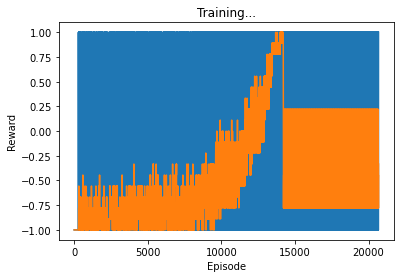

In [135]:
ep3_rewards = []
policy_net.train()
dqnloc_count = [0 for i in range(em3.env.obs_space.nvec[3] * len(em3.env.tx_locs))]
loc3_errors = [0.0 for i in range(em3.env.obs_space.nvec[3] * len(em3.env.tx_locs))]
iter3_avg_error = []
iter3_errors = []

dqn3_epslen=[]
outer = tqdm.notebook.tqdm(total=episodes, desc='training loop: ', position=0)

train_steps = 0
for episode in range(episodes):
    
    #if ((episode+1) > 4100):    
    #    obs = em.test_reset(np.array([[-100,-100,0]]), test_txbdir, em.env.sc_xyz, ch_randvals[episode*(em.env.goal_steps+1)])
    #    test_txbdir = (test_txbdir + 1) % em.env.N_tx
    #else:
    #    #tx_loc_xndx, tx_loc_yndx, tx_dir_ndx =em.env.obs_space.sample()
    tx_num, tx_dir_ndx = obs_list[episode]
    
    #policy_net.eval()
    #with torch.no_grad():
    #    action_probs = policy_net(obs).detach().data.cpu().numpy()[0]  
    #policy_net.train()
    #actions= np.argsort(action_probs)[::-1]
    
    obs = em3.reset(tx_num, tx_dir_ndx, ch_randvals[episode], dqnloc_count[tx_num * em3.env.obs_space.nvec[3] + tx_dir_ndx]+1)
    tx_num = em3.env.get_txloc_ndx(em3.env.tx_loc)
    dqnloc_count[tx_num * em3.env.obs_space.nvec[3] + tx_dir_ndx] +=1
    #obs = em.test_reset(np.array([[em.env.rx_xcov[tx_loc_xndx],em.env.rx_ycov[tx_loc_yndx], 0]]), tx_dir_ndx, em.env.sc_xyz, ch_randvals[episode*(em.env.goal_steps+1)])
    #dqnloc_maxexhselections[(tx_loc_xndx*len(em.env.rx_ycov)+tx_loc_yndx)*available_actions+tx_dir_ndx]+=1
    
    ep_loss = 0.0
    ep_rwd = 0.0
    timestep = 0
    tx_dirs = []
    rx_dirs = [-1.0 for x in range(em3.env.action_space.n)]
    data_rates =[np.inf for x in range(em3.env.action_space.n)]
    rssi_vals =[np.complex(1,0) for x in range(em3.env.action_space.n)]
    rwd_vals =[-2.0 for x in range(em3.env.action_space.n)]
    #agent.current_step +=1
    train_steps +=1
    eps = strategy.get_exploration_rate(train_steps)
    done = False
    while True:
        tx_dirs.append(em3.env.tx_bdir*180/np.pi)
        #rx_dirs.append(em.env.rx_bdir[0]*180/np.pi)
        #data_rates.append(em.env.rate)
        #print(em.env.rbdir_ndx)
        if(em3.env.rbdir_ndx >= 0):
            rx_dirs[em3.env.rbdir_ndx] = em3.env.rx_bdir*180/np.pi
            data_rates[em3.env.rbdir_ndx] = em3.env.rate
            rssi_vals[em3.env.rbdir_ndx] = em3.env.rssi_val

        action = agent.act(obs, policy_net, eps)
        next_obs, reward, done, _ = em3.step(action)#,ch_randvals[episode*(em.env.goal_steps+1)+timestep+1])
        #agent.step(obs, action, reward, next_obs, done)
        rwd_vals[em3.env.rbdir_ndx] = reward.item()
        ep_rwd += reward.item()
        
        '''
        if(np.all(em.env.tx_loc == np.array([[100,100,0]]))):
            print("ch_model: {}, sc_xyz: {}, min_exh_rate: {}, max_exh_rate: {}, min_action_ndx: {}, max_action_ndx: {}".format(em.env.ch_model, em.env.sc_xyz, min_exh_rate, max_exh_rate, min_action_ndx, max_action_ndx))
        '''   
        memory.add(obs, action, reward, next_obs, done)
        obs = next_obs
        
        ep3_rewards.append(reward.item())
        exh_rate = loc_SNRexh[tx_num * em3.env.obs_space.nvec[3] + em3.env.txdir_ndx]
        if data_rates[em3.env.rbdir_ndx] == np.inf:
            dqn_rate = 0.0
            #dqn_rssi = loc_minSNRexh[tx_num * em3.env.obs_space.nvec[3] + em3.env.txdir_ndx]#np.complex(1,0)
        else:
            dqn_rate = data_rates[em3.env.rbdir_ndx]#max(data_rates)
            #dqn_rssi = rssi_vals[em3.env.rbdir_ndx]
        #SNR_exh = Es * loc_SNRexh[tx_num * em.env.obs_space.nvec[3] + em.env.txdir_ndx]#np.abs(max_rssi_val) ** 2 / (em.env.N0 * em.env.B)
        #error = exh_rate-dqn_rate#np.abs(20*np.log10(np.abs(max_rssi_val))-20*np.log10(np.abs(rssi_val)))#max_exh_rate - dqn_rate
        #error = np.abs(20*np.log10(np.abs(exh_rssi))-20*np.log10(np.abs(dqn_rssi)))
        iter3_errors.append(dqn_rate)
        loc3_errors[tx_num * em3.env.obs_space.nvec[3] + em3.env.txdir_ndx] = dqn_rate
        iter3_avg_error.append(np.mean(loc3_errors))

        #print("exh_rate: {}, dqn_rate: {}, error: {}, iter_avg_error: {}".format(np.abs(exh_rssi), np.abs(dqn_rssi), error, np.mean(loc3_errors)))
        
        
        if memory.can_provide_sample():
            experiences = memory.sample()
            observations, actions, rewards, next_observations, dones = experiences
            weights, batch_indices = torch.tensor(np.ones_like(rewards.cpu().data.numpy())).to(device), None

            #print(states.shape, states.dtype)
            #print(actions.unsqueeze(-1).shape)
            current_q_values = policy_net(observations).gather(1,index=actions.unsqueeze(-1))#(1-ALPHA)*
            
            next_q_values = target_net(next_observations).detach().max(1)[0]
            target_q_values = ((next_q_values*GAMMA) + rewards)
            #print(policy_net(observations).type())
            #print(target_q_values.unsqueeze(1).type())
            #loss = F.mse_loss(current_q_values, target_q_values.unsqueeze(1).float())
            td_errors = ALPHA*(target_q_values.unsqueeze(1).float()-current_q_values)
            loss = F.mse_loss(torch.zeros(current_q_values.size()).to(device), ALPHA*(target_q_values.unsqueeze(1).float()-current_q_values),  reduction='sum')
            #weighted_loss = torch.mean(weights*loss)
            #print("loss: ", loss)
            #loss = ALPHA*loss
            #ep_loss += weighted_loss.item()
            #ep_loss = torch.mean(loss).detach().numpy()
            ep_loss = loss.item()
            
            optimizer.zero_grad()
            #weighted_loss.backward()
            #ep_loss.backward(torch.ones_like(ep_loss))
            loss.backward(torch.ones_like(loss))
            optimizer.step()
            
        timestep +=1
        if done:
            dqn3_epslen.append(len(tx_dirs))
            #data_rates.append(em.env.rate)
            data_rates[em3.env.rbdir_ndx] = em3.env.rate
            rssi_vals[em3.env.rbdir_ndx] = em3.env.rssi_val
            
            #ep_rewards.append(ep_rwd)
            moving_avg_rwd = get_moving_average(em3.env.obs_space.nvec[3]*len(em3.env.tx_locs), ep3_rewards)
            
            #print('\rEpisode {},\tScore: {:.2f}, eps: {}, moving avg_rwd: {}, ep_loss: {}'.format(episode+1, ep_rwd, eps, moving_avg_rwd[-1], ep_loss), end="\r")
            print('Episode {},\t Score: {:.2f}, eps: {}, moving avg_rwd: {}, ep_loss: {}'.format(episode+1, ep_rwd, eps, moving_avg_rwd[-1], ep_loss))
            #print("TX loc: {}".format(em3.env.tx_loc))
            tx_num = em3.env.get_txloc_ndx(em3.env.tx_loc)
            exh_bdir_ndx = loc_exhbdir[tx_num * em3.env.obs_space.nvec[3] + em3.env.txdir_ndx]
            print("TX dirs: {}, episode length: {}".format(tx_dirs, len(tx_dirs)))
            print("RX dirs: {}".format(rx_dirs))
            best_action_ndx = em3.env.rbdir_ndx#data_rates.index(max(data_rates))
            print("dqn rx bdir: {}, exh bdir: {}".format(rx_dirs[best_action_ndx], em3.env.BeamSet[exh_bdir_ndx]*180/np.pi))
            print("data rates: ", data_rates)
            #print("rwd vals: ", rwd_vals)
 
            print("\n\n")
                            
            timestep = 0
            break
            
    for local_param, target_param in zip(policy_net.parameters(), target_net.parameters()):
        target_param.data.copy_(TAU*local_param.data + (1.0-TAU)*target_param.data)
    
    #Update the policy network
    #if episode % UPDATE_EVERY == 0:
    #    target_net.load_state_dict(policy_net.state_dict())
    
    # update tqdm bar
    outer.update(1)
    
#torch.save(policy_net.state_dict(), 'checkpoint.pth')

#timer.finish()
test_rewards = []
plot(ep3_rewards, em3.env.obs_space.nvec[3]*len(em3.env.tx_locs), test_rewards)


In [137]:
print("Average episode length: {}".format(np.mean(dqn3_epslen)))
print(len(ep3_rewards))

Average episode length: 3.446833333333333
20681


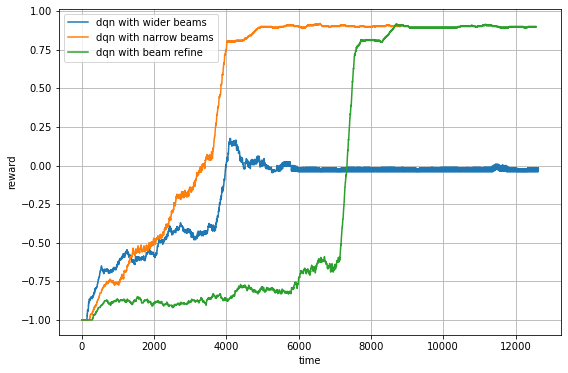

In [129]:
#cab vs dqn1 vs dqn2 vs dqn3 rwd plot

##### from Source.misc_fun.utils import *
fig = plt.figure(figsize=[9, 6])

#loc_ndx = 0
#tbdir_ndx = 3
context_ndx = 0*len(tx_dirs)+ 4#tbdir_ndx
#context_ndx2 = sel_ctxt_ndices[1]#1*len(tx_dirs)+ 4#tbdir_ndx
#context_ndx3 = sel_ctxt_ndices[2]#2*len(tx_dirs)+ 3#tbdir_ndx
#context_ndx4 = sel_ctxt_ndices[3]#3*len(tx_dirs)+ 3#tbdir_ndx
moving_avg_period = 200
#em.env.obs_space.nvec[3]*len(em.env.tx_locs)
dqn2_movingavg = get_moving_average(400, ep2_rewards)

dqn1_movingavg = get_moving_average(400, ep_rewards[:len(ep_rewards)])
dqn3_movingavg = get_moving_average(400, ep3_rewards[:len(ep3_rewards)])

plt.plot(np.arange(1,len(ep_rewards)+1,1), dqn1_movingavg, np.arange(1,len(ep2_rewards)+1,1), dqn2_movingavg, np.arange(1,len(ep3_rewards)+1,1), dqn3_movingavg)
#min_ndx=0
#max_ndx=500
#plt.plot(test_eps_iters[min_ndx:max_ndx])
plt.grid()
plt.legend(['dqn with wider beams', 'dqn with narrow beams', 'dqn with beam refine'])
plt.xlabel('time')
plt.ylabel('reward')
#plt.savefig("151020_hbc_refine_rwdplot_16.pdf")
plt.show()
#plt.savefig("071020_cab_dqn_rwdplot_2.pdf")

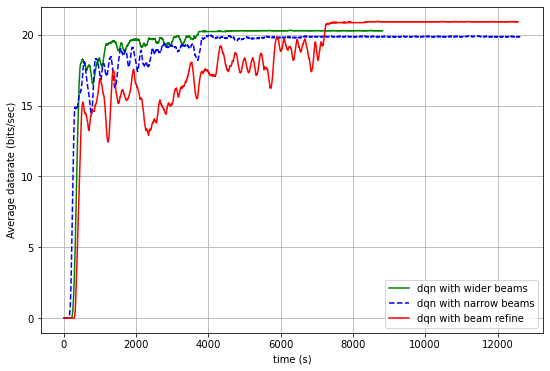

In [128]:
from Source.misc_fun.utils import *
fig = plt.figure(figsize=[9, 6])

#loc_ndx = 0
#tbdir_ndx = 3
context_ndx = 7#0*len(tx_dirs)+ 4#tbdir_ndx
#context_ndx2 = sel_ctxt_ndices[1]#1*len(tx_dirs)+ 4#tbdir_ndx
#context_ndx3 = sel_ctxt_ndices[2]#2*len(tx_dirs)+ 3#tbdir_ndx
#context_ndx4 = sel_ctxt_ndices[3]#3*len(tx_dirs)+ 3#tbdir_ndx
moving_avg_period = 100
#plt.plot(np.arange(1,len(cabenv_avgerrors[context_ndx])+1), cabenv_avgerrors[7], np.arange(1,len(iter_avg_error)+1),iter_avg_error)

dqn2_movingavg = get_moving_average(moving_avg_period, iter2_avg_error)

dqn1_movingavg = get_moving_average(moving_avg_period, iter_avg_error[:len(iter_avg_error)])

dqn3_movingavg = get_moving_average(moving_avg_period, iter3_avg_error[:len(iter3_avg_error)])


plt.plot(np.arange(1,len(iter2_avg_error)+1,1), dqn2_movingavg,'g')
plt.plot(np.arange(1,len(iter_avg_error)+1,1), dqn1_movingavg,'b--')
plt.plot(np.arange(1,len(iter3_avg_error)+1,1), dqn3_movingavg, color='red')
#min_ndx=0
#max_ndx=500
#plt.plot(test_eps_iters[min_ndx:max_ndx])
plt.grid()
plt.legend(['dqn with wider beams', 'dqn with narrow beams', 'dqn with beam refine'])
plt.xlabel('time (s)')
plt.ylabel('Average datarate (bits/sec)')
#plt.savefig("151020_hbc_refine_rateplot_16.pdf")
plt.show()
#plt.savefig("071020_cab_dqn_erroplot_2.pdf")